# IIT-Roorkee Assignment 

Explore the application of **k-means** clustering in color compression of a color image. 

To explore it, read an image having multiple colors where a large number of colors will be unused, and many of the
pixels in the image will have similar or even identical colors. Cluster these several colors into a **16
different clusters** and show the compressed image.


**Solution by Amitabh Suman**

## Import required Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img

from scipy import misc
import imageio
from sklearn.utils import shuffle

## Reading Image, asking user input

#### If no image is provided as input, default image from the directory will be picked up.

In [2]:
import sys
import os

def get_user_image():
    """
    Ask user input for image. If no image is provide, default Image : nature.jpg will be used.
    """
    user_image = input("Enter the complete path of your image file (ex. C:\image.png)\n"\
                       "Press ENTER to use default image : ")
    
    if str(user_image) != '':
        pass
    else:
        print("\n\nNo input provided, continuing with DEFAULT image : {}\\nature.jpg".format(os.getcwd()))
        user_image = os.path.join(os.getcwd(), 'nature.jpg')

    assert os.path.exists(user_image), "Could not find the file : " + str(user_image)

    print("\n\nHooray, found your file!")
    
    return user_image

### Reading and Displaying the image

Enter the complete path of your image file (ex. C:\image.png)
Press ENTER to use default image : 


No input provided, continuing with DEFAULT image : C:\Users\amita\Desktop\Ai_ML\UDEMY\Refactored_Py_DS_ML_Bootcamp-master\17-K-Means-Clustering\nature.jpg


Hooray, found your file!


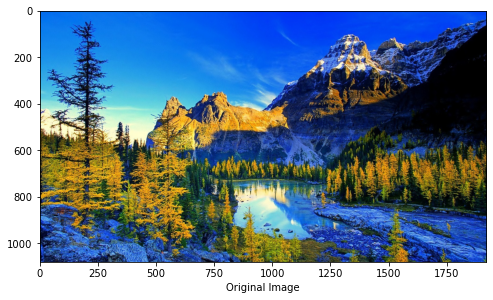

In [3]:
image = plt.imread(get_user_image())
plt.figure(figsize=(8,8))
plt.imshow(image)
plt.xlabel("Original Image")
plt.show()

## Processing image and performing the below steps in sequence

1. Take image in RGB vector form
2. Reduce image by a factor of 255 (as any channel ranges from 0-255)
3. On reduced image, apply image flattening. Meaning, converting the image from 3D numpy.array to 2D numpy.array for applying the K-Means algorithm
4. Now, select a 1000 values randomly from 2D numpy.array for KMean training (.fit)
5. Once #4 is done, pass on the whole array for prediction (this gives the predicted label)
6. Once we have the labels, reconstruct the image
7. Plot the original and compressed image


In [4]:
# Print image in numpy array
print(image)

[[[  2 109 241]
  [  0 107 239]
  [  0 107 239]
  ...
  [  1  69 240]
  [  1  69 242]
  [  2  70 243]]

 [[  0 106 238]
  [  0 107 239]
  [  0 107 239]
  ...
  [  0  68 241]
  [  1  69 242]
  [  1  69 242]]

 [[  0 105 237]
  [  0 107 239]
  [  1 108 240]
  ...
  [  0  66 240]
  [  1  67 241]
  [  1  67 241]]

 ...

 [[  0  18  80]
  [  0  18  81]
  [  0  19  86]
  ...
  [ 88 109  14]
  [ 72  89  11]
  [ 79  94  27]]

 [[  4  19  84]
  [  3  21  87]
  [  0  21  91]
  ...
  [ 98 117  28]
  [ 86  99  29]
  [ 72  83  23]]

 [[  0  13  78]
  [ 13  28  95]
  [ 20  40 111]
  ...
  [ 93 108  25]
  [ 99 110  44]
  [ 82  91  36]]]


## Defining few functions

### 1. Normalize the image. Basically dividing the numpy array by 255 and normalizing in range (0, 1)
### 2. Flatten the image (convert from 3D to 2D)
### 3. Randomly choose n samples from the 2D array for model training.

In [5]:
def show_image_info(txt, image):
    print("{:<11} image shape    : {}".format(txt, image.shape))
    # print("{:<11} image size     : {} MB".format(txt, (image.size / (1000**2))))

In [6]:
def normalize_image(image, show_info=False):

    show_image_info("Original", image)
    
    normalized_image = image / 255
    
    if show_info:
        show_image_info("Normalized", normalized_image)
    return normalized_image

In [7]:
def flatten_image(image, show_info=False):
    w, h, d = image.shape
    show_image_info("Input image", image)
    
    # To convert 3D array to 2D array, we are multiplying W*H for each channel. Hence np.reshape
    flat_image = image.reshape(w*h, d)
    
    if show_info:
        show_image_info("Flat image", flat_image)
        
    return flat_image

### Below function lets us choose 1000 random samples from the 2D image array

**From web :**

sklearn.utils.shuffle. This is a convenience alias to resample (*arrays, replace=False) to do random permutations of the collections. Indexable data-structures can be arrays, lists, dataframes or scipy sparse matrices with consistent first dimension. Sequence of shuffled copies of the collections.

In [8]:
def select_random_sample(image_array, num_sample=1000):
    image_subset = shuffle(image_array, random_state=1)[:int(num_sample)]
    print("Image Subset size is : {}".format(image_subset.size))
    return image_subset

#### Code flow
1. Read image
2. Show image
3. Show image numpy array
4. Reduce image
5. Flatten the RGB image, making it a 2D array
6. Now, select a 1000 values randomly from 2D numpy array for KMean training (.fit)
7. Once #6 is done, pass on the whole array for prediction (this gives the predicted label)
8. Once we have the labels, reconstruct the image
9. Plot the original and compressed image

## Executing code 

In [9]:
# Taking the shape of the image

w, h, d = image.shape
w, h, d

(1080, 1920, 3)

In [10]:
normalized_image = normalize_image(image, show_info=True)
normalized_image

Original    image shape    : (1080, 1920, 3)
Normalized  image shape    : (1080, 1920, 3)


array([[[0.00784314, 0.42745098, 0.94509804],
        [0.        , 0.41960784, 0.9372549 ],
        [0.        , 0.41960784, 0.9372549 ],
        ...,
        [0.00392157, 0.27058824, 0.94117647],
        [0.00392157, 0.27058824, 0.94901961],
        [0.00784314, 0.2745098 , 0.95294118]],

       [[0.        , 0.41568627, 0.93333333],
        [0.        , 0.41960784, 0.9372549 ],
        [0.        , 0.41960784, 0.9372549 ],
        ...,
        [0.        , 0.26666667, 0.94509804],
        [0.00392157, 0.27058824, 0.94901961],
        [0.00392157, 0.27058824, 0.94901961]],

       [[0.        , 0.41176471, 0.92941176],
        [0.        , 0.41960784, 0.9372549 ],
        [0.00392157, 0.42352941, 0.94117647],
        ...,
        [0.        , 0.25882353, 0.94117647],
        [0.00392157, 0.2627451 , 0.94509804],
        [0.00392157, 0.2627451 , 0.94509804]],

       ...,

       [[0.        , 0.07058824, 0.31372549],
        [0.        , 0.07058824, 0.31764706],
        [0.        , 0

In [11]:
flat_image = flatten_image(normalized_image, show_info=True)

Input image image shape    : (1080, 1920, 3)
Flat image  image shape    : (2073600, 3)


In [12]:
random_small_sample = select_random_sample(flat_image)

Image Subset size is : 3000


In [13]:
from sklearn.cluster import KMeans

In [14]:
kmeans = KMeans(n_clusters=16, random_state=101)

In [15]:
kmeans.fit(random_small_sample)

KMeans(n_clusters=16, random_state=101)

In [16]:
labels = kmeans.predict(flat_image)

In [17]:
labels

array([13, 13, 13, ...,  8,  8,  8])

In [18]:
labels.shape

(2073600,)

In [19]:
flat_image[:, 0]

array([0.00784314, 0.        , 0.        , ..., 0.36470588, 0.38823529,
       0.32156863])

In [20]:
c = kmeans.cluster_centers_
c

array([[0.90691434, 0.93415893, 0.7749226 ],
       [0.08173872, 0.19088117, 0.42995511],
       [0.00712358, 0.30012592, 0.95182587],
       [0.88141517, 0.67314578, 0.18908781],
       [0.01478369, 0.03015873, 0.04074074],
       [0.23449198, 0.62878788, 0.90713012],
       [0.35014006, 0.43011204, 0.36554622],
       [0.63044563, 0.47957219, 0.09397504],
       [0.39146887, 0.33051256, 0.06886825],
       [0.47202296, 0.7808704 , 0.90722143],
       [0.27337858, 0.45128205, 0.78921569],
       [0.0456241 , 0.10248685, 0.23467241],
       [0.75710784, 0.68517157, 0.4567402 ],
       [0.07336981, 0.49174647, 0.9255358 ],
       [0.14444444, 0.29013072, 0.63588235],
       [0.17576342, 0.22854388, 0.09263902]])

## Visualizing the 2D array around its clusters 

In [21]:
results = pd.DataFrame({
    "clusters": labels,
    "x": flat_image[:, 0],
    "y": flat_image[:, 1]
}).sort_values(by=["clusters"], axis=0)

<AxesSubplot:xlabel='x', ylabel='y'>

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


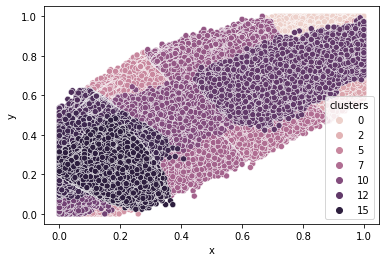

In [22]:
import seaborn as sns
sns.scatterplot(hue='clusters', x='x', y='y', data=results)

### Since the above graph is small and also the colors are not easily distinguishable, executing with pallete = "rainbow"

<AxesSubplot:xlabel='x', ylabel='y'>

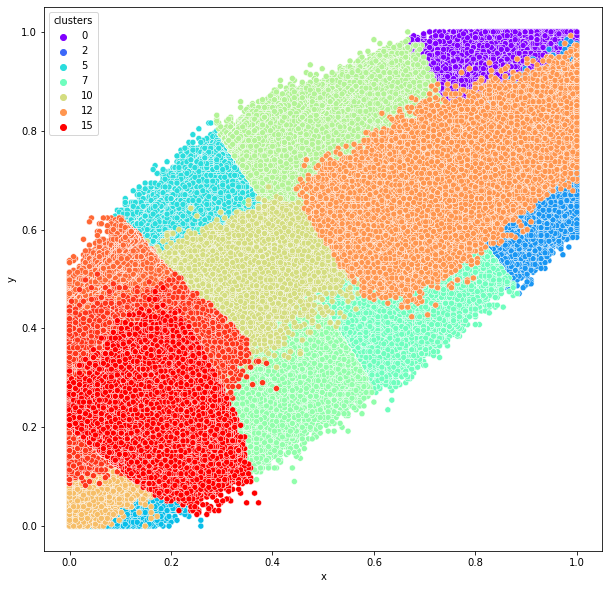

In [23]:
# import seaborn as sns
plt.figure(figsize=(10, 10))
sns.scatterplot(hue='clusters', x='x', y='y', data=results, palette='rainbow')

## Creating image back by converting the numpy 2D array to 3D array and then plt.imshow() 

In [62]:
def reconstruct_image(c, labels, w, h, d, verbose=False):
    """
    set verbose=True to see how the data is being 
    """
    if verbose:
        print("C      : Shape {}    Data {}".format(c.shape, c))
        print("Labels : Shape {}    Data {}".format(labels.shape, labels))
        print("Labels : {}".format(np.unique(labels)))
        print("W      : Data {}".format(w))
        print("H      : Data {}".format(h))
        print("D      : Data {}".format(d))
    zero_array = np.zeros((w, h, d))
    array_index = 0
    
    for i in range(w):
        for j in range(h):
            zero_array[i][j] = c[labels[array_index]]
            
            if verbose:
                print("{} {} ".format(i, j) + str(array_index) + " ==> " +\
                      "C : {}".format(c[labels[array_index]]) +  " ==> " +  str([labels[array_index]]))
            array_index += 1

    show_image_info("Reconstructed", zero_array)
    
    return zero_array

Reconstructed image shape    : (1080, 1920, 3)


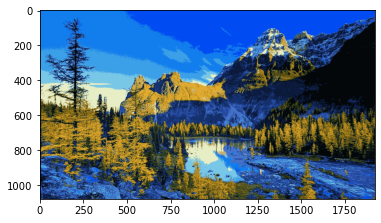

In [63]:
plt.imshow(reconstruct_image(c, labels, w, h, d))
plt.show()

In [48]:
plt.imshow(reconstruct_image(c, labels, w, h, d))
plt.show()

0 0 0 ==> [13]
1 0 1 ==> [13]
2 0 2 ==> [13]
3 0 3 ==> [13]
4 0 4 ==> [13]
5 0 5 ==> [13]
6 0 6 ==> [13]
7 0 7 ==> [13]
8 0 8 ==> [13]
9 0 9 ==> [13]
10 0 10 ==> [13]
11 0 11 ==> [13]
12 0 12 ==> [13]
13 0 13 ==> [13]
14 0 14 ==> [13]
15 0 15 ==> [13]
16 0 16 ==> [13]
17 0 17 ==> [13]
18 0 18 ==> [13]
19 0 19 ==> [13]
20 0 20 ==> [13]
21 0 21 ==> [13]
22 0 22 ==> [13]
23 0 23 ==> [13]
24 0 24 ==> [13]
25 0 25 ==> [13]
26 0 26 ==> [13]
27 0 27 ==> [13]
28 0 28 ==> [13]
29 0 29 ==> [13]
30 0 30 ==> [13]
31 0 31 ==> [13]
32 0 32 ==> [13]
33 0 33 ==> [13]
34 0 34 ==> [13]
35 0 35 ==> [13]
36 0 36 ==> [13]
37 0 37 ==> [13]
38 0 38 ==> [13]
39 0 39 ==> [13]
40 0 40 ==> [13]
41 0 41 ==> [13]
42 0 42 ==> [13]
43 0 43 ==> [13]
44 0 44 ==> [13]
45 0 45 ==> [13]
46 0 46 ==> [13]
47 0 47 ==> [13]
48 0 48 ==> [13]
49 0 49 ==> [13]
50 0 50 ==> [13]
51 0 51 ==> [13]
52 0 52 ==> [13]
53 0 53 ==> [13]
54 0 54 ==> [13]
55 0 55 ==> [13]
56 0 56 ==> [2]
57 0 57 ==> [13]
58 0 58 ==> [13]
59 0 59 ==> [13]
6

962 0 962 ==> [2]
963 0 963 ==> [2]
964 0 964 ==> [2]
965 0 965 ==> [2]
966 0 966 ==> [2]
967 0 967 ==> [2]
968 0 968 ==> [2]
969 0 969 ==> [2]
970 0 970 ==> [2]
971 0 971 ==> [2]
972 0 972 ==> [2]
973 0 973 ==> [2]
974 0 974 ==> [2]
975 0 975 ==> [2]
976 0 976 ==> [2]
977 0 977 ==> [2]
978 0 978 ==> [2]
979 0 979 ==> [2]
980 0 980 ==> [2]
981 0 981 ==> [2]
982 0 982 ==> [2]
983 0 983 ==> [2]
984 0 984 ==> [2]
985 0 985 ==> [2]
986 0 986 ==> [2]
987 0 987 ==> [2]
988 0 988 ==> [2]
989 0 989 ==> [2]
990 0 990 ==> [2]
991 0 991 ==> [2]
992 0 992 ==> [2]
993 0 993 ==> [2]
994 0 994 ==> [2]
995 0 995 ==> [2]
996 0 996 ==> [2]
997 0 997 ==> [2]
998 0 998 ==> [2]
999 0 999 ==> [2]
1000 0 1000 ==> [2]
1001 0 1001 ==> [2]
1002 0 1002 ==> [2]
1003 0 1003 ==> [2]
1004 0 1004 ==> [2]
1005 0 1005 ==> [2]
1006 0 1006 ==> [2]
1007 0 1007 ==> [2]
1008 0 1008 ==> [2]
1009 0 1009 ==> [2]
1010 0 1010 ==> [2]
1011 0 1011 ==> [2]
1012 0 1012 ==> [2]
1013 0 1013 ==> [2]
1014 0 1014 ==> [2]
1015 0 1015 ==> 

1820 0 1820 ==> [2]
1821 0 1821 ==> [2]
1822 0 1822 ==> [2]
1823 0 1823 ==> [2]
1824 0 1824 ==> [2]
1825 0 1825 ==> [2]
1826 0 1826 ==> [2]
1827 0 1827 ==> [2]
1828 0 1828 ==> [2]
1829 0 1829 ==> [2]
1830 0 1830 ==> [2]
1831 0 1831 ==> [2]
1832 0 1832 ==> [2]
1833 0 1833 ==> [2]
1834 0 1834 ==> [2]
1835 0 1835 ==> [2]
1836 0 1836 ==> [2]
1837 0 1837 ==> [2]
1838 0 1838 ==> [2]
1839 0 1839 ==> [2]
1840 0 1840 ==> [2]
1841 0 1841 ==> [2]
1842 0 1842 ==> [2]
1843 0 1843 ==> [2]
1844 0 1844 ==> [2]
1845 0 1845 ==> [2]
1846 0 1846 ==> [2]
1847 0 1847 ==> [2]
1848 0 1848 ==> [2]
1849 0 1849 ==> [2]
1850 0 1850 ==> [2]
1851 0 1851 ==> [2]
1852 0 1852 ==> [2]
1853 0 1853 ==> [2]
1854 0 1854 ==> [2]
1855 0 1855 ==> [2]
1856 0 1856 ==> [2]
1857 0 1857 ==> [2]
1858 0 1858 ==> [2]
1859 0 1859 ==> [2]
1860 0 1860 ==> [2]
1861 0 1861 ==> [2]
1862 0 1862 ==> [2]
1863 0 1863 ==> [2]
1864 0 1864 ==> [2]
1865 0 1865 ==> [2]
1866 0 1866 ==> [2]
1867 0 1867 ==> [2]
1868 0 1868 ==> [2]
1869 0 1869 ==> [2]


2718 1 798 ==> [2]
2719 1 799 ==> [2]
2720 1 800 ==> [2]
2721 1 801 ==> [2]
2722 1 802 ==> [2]
2723 1 803 ==> [2]
2724 1 804 ==> [2]
2725 1 805 ==> [2]
2726 1 806 ==> [2]
2727 1 807 ==> [2]
2728 1 808 ==> [2]
2729 1 809 ==> [2]
2730 1 810 ==> [2]
2731 1 811 ==> [2]
2732 1 812 ==> [2]
2733 1 813 ==> [2]
2734 1 814 ==> [2]
2735 1 815 ==> [2]
2736 1 816 ==> [2]
2737 1 817 ==> [2]
2738 1 818 ==> [2]
2739 1 819 ==> [2]
2740 1 820 ==> [2]
2741 1 821 ==> [2]
2742 1 822 ==> [2]
2743 1 823 ==> [2]
2744 1 824 ==> [2]
2745 1 825 ==> [2]
2746 1 826 ==> [2]
2747 1 827 ==> [2]
2748 1 828 ==> [2]
2749 1 829 ==> [2]
2750 1 830 ==> [2]
2751 1 831 ==> [2]
2752 1 832 ==> [2]
2753 1 833 ==> [2]
2754 1 834 ==> [2]
2755 1 835 ==> [2]
2756 1 836 ==> [2]
2757 1 837 ==> [2]
2758 1 838 ==> [2]
2759 1 839 ==> [2]
2760 1 840 ==> [2]
2761 1 841 ==> [2]
2762 1 842 ==> [2]
2763 1 843 ==> [2]
2764 1 844 ==> [2]
2765 1 845 ==> [2]
2766 1 846 ==> [2]
2767 1 847 ==> [2]
2768 1 848 ==> [2]
2769 1 849 ==> [2]
2770 1 850 =

3521 1 1601 ==> [2]
3522 1 1602 ==> [2]
3523 1 1603 ==> [2]
3524 1 1604 ==> [2]
3525 1 1605 ==> [2]
3526 1 1606 ==> [2]
3527 1 1607 ==> [2]
3528 1 1608 ==> [2]
3529 1 1609 ==> [2]
3530 1 1610 ==> [2]
3531 1 1611 ==> [2]
3532 1 1612 ==> [2]
3533 1 1613 ==> [2]
3534 1 1614 ==> [2]
3535 1 1615 ==> [2]
3536 1 1616 ==> [2]
3537 1 1617 ==> [2]
3538 1 1618 ==> [2]
3539 1 1619 ==> [2]
3540 1 1620 ==> [2]
3541 1 1621 ==> [2]
3542 1 1622 ==> [2]
3543 1 1623 ==> [2]
3544 1 1624 ==> [2]
3545 1 1625 ==> [2]
3546 1 1626 ==> [2]
3547 1 1627 ==> [2]
3548 1 1628 ==> [2]
3549 1 1629 ==> [2]
3550 1 1630 ==> [2]
3551 1 1631 ==> [2]
3552 1 1632 ==> [2]
3553 1 1633 ==> [2]
3554 1 1634 ==> [2]
3555 1 1635 ==> [2]
3556 1 1636 ==> [2]
3557 1 1637 ==> [2]
3558 1 1638 ==> [2]
3559 1 1639 ==> [2]
3560 1 1640 ==> [2]
3561 1 1641 ==> [2]
3562 1 1642 ==> [2]
3563 1 1643 ==> [2]
3564 1 1644 ==> [2]
3565 1 1645 ==> [2]
3566 1 1646 ==> [2]
3567 1 1647 ==> [2]
3568 1 1648 ==> [2]
3569 1 1649 ==> [2]
3570 1 1650 ==> [2]


4351 2 511 ==> [2]
4352 2 512 ==> [2]
4353 2 513 ==> [2]
4354 2 514 ==> [2]
4355 2 515 ==> [2]
4356 2 516 ==> [2]
4357 2 517 ==> [2]
4358 2 518 ==> [2]
4359 2 519 ==> [2]
4360 2 520 ==> [2]
4361 2 521 ==> [2]
4362 2 522 ==> [2]
4363 2 523 ==> [2]
4364 2 524 ==> [2]
4365 2 525 ==> [2]
4366 2 526 ==> [2]
4367 2 527 ==> [2]
4368 2 528 ==> [2]
4369 2 529 ==> [2]
4370 2 530 ==> [2]
4371 2 531 ==> [2]
4372 2 532 ==> [2]
4373 2 533 ==> [2]
4374 2 534 ==> [2]
4375 2 535 ==> [2]
4376 2 536 ==> [2]
4377 2 537 ==> [2]
4378 2 538 ==> [2]
4379 2 539 ==> [2]
4380 2 540 ==> [2]
4381 2 541 ==> [2]
4382 2 542 ==> [2]
4383 2 543 ==> [2]
4384 2 544 ==> [2]
4385 2 545 ==> [2]
4386 2 546 ==> [2]
4387 2 547 ==> [2]
4388 2 548 ==> [2]
4389 2 549 ==> [2]
4390 2 550 ==> [2]
4391 2 551 ==> [2]
4392 2 552 ==> [2]
4393 2 553 ==> [2]
4394 2 554 ==> [2]
4395 2 555 ==> [2]
4396 2 556 ==> [2]
4397 2 557 ==> [2]
4398 2 558 ==> [2]
4399 2 559 ==> [2]
4400 2 560 ==> [2]
4401 2 561 ==> [2]
4402 2 562 ==> [2]
4403 2 563 =

5175 2 1335 ==> [2]
5176 2 1336 ==> [2]
5177 2 1337 ==> [2]
5178 2 1338 ==> [2]
5179 2 1339 ==> [2]
5180 2 1340 ==> [2]
5181 2 1341 ==> [2]
5182 2 1342 ==> [2]
5183 2 1343 ==> [2]
5184 2 1344 ==> [2]
5185 2 1345 ==> [2]
5186 2 1346 ==> [2]
5187 2 1347 ==> [2]
5188 2 1348 ==> [2]
5189 2 1349 ==> [2]
5190 2 1350 ==> [2]
5191 2 1351 ==> [2]
5192 2 1352 ==> [2]
5193 2 1353 ==> [2]
5194 2 1354 ==> [2]
5195 2 1355 ==> [2]
5196 2 1356 ==> [2]
5197 2 1357 ==> [2]
5198 2 1358 ==> [2]
5199 2 1359 ==> [2]
5200 2 1360 ==> [2]
5201 2 1361 ==> [2]
5202 2 1362 ==> [2]
5203 2 1363 ==> [2]
5204 2 1364 ==> [2]
5205 2 1365 ==> [2]
5206 2 1366 ==> [2]
5207 2 1367 ==> [2]
5208 2 1368 ==> [2]
5209 2 1369 ==> [2]
5210 2 1370 ==> [2]
5211 2 1371 ==> [2]
5212 2 1372 ==> [2]
5213 2 1373 ==> [2]
5214 2 1374 ==> [2]
5215 2 1375 ==> [2]
5216 2 1376 ==> [2]
5217 2 1377 ==> [2]
5218 2 1378 ==> [2]
5219 2 1379 ==> [2]
5220 2 1380 ==> [2]
5221 2 1381 ==> [2]
5222 2 1382 ==> [2]
5223 2 1383 ==> [2]
5224 2 1384 ==> [2]


6037 3 277 ==> [13]
6038 3 278 ==> [13]
6039 3 279 ==> [13]
6040 3 280 ==> [13]
6041 3 281 ==> [13]
6042 3 282 ==> [13]
6043 3 283 ==> [13]
6044 3 284 ==> [13]
6045 3 285 ==> [13]
6046 3 286 ==> [13]
6047 3 287 ==> [13]
6048 3 288 ==> [13]
6049 3 289 ==> [13]
6050 3 290 ==> [13]
6051 3 291 ==> [13]
6052 3 292 ==> [13]
6053 3 293 ==> [13]
6054 3 294 ==> [13]
6055 3 295 ==> [13]
6056 3 296 ==> [13]
6057 3 297 ==> [13]
6058 3 298 ==> [13]
6059 3 299 ==> [13]
6060 3 300 ==> [13]
6061 3 301 ==> [13]
6062 3 302 ==> [13]
6063 3 303 ==> [13]
6064 3 304 ==> [13]
6065 3 305 ==> [13]
6066 3 306 ==> [13]
6067 3 307 ==> [13]
6068 3 308 ==> [13]
6069 3 309 ==> [13]
6070 3 310 ==> [13]
6071 3 311 ==> [13]
6072 3 312 ==> [13]
6073 3 313 ==> [13]
6074 3 314 ==> [13]
6075 3 315 ==> [13]
6076 3 316 ==> [13]
6077 3 317 ==> [13]
6078 3 318 ==> [13]
6079 3 319 ==> [13]
6080 3 320 ==> [13]
6081 3 321 ==> [13]
6082 3 322 ==> [13]
6083 3 323 ==> [13]
6084 3 324 ==> [13]
6085 3 325 ==> [13]
6086 3 326 ==> [13]


6913 3 1153 ==> [2]
6914 3 1154 ==> [2]
6915 3 1155 ==> [2]
6916 3 1156 ==> [2]
6917 3 1157 ==> [2]
6918 3 1158 ==> [2]
6919 3 1159 ==> [2]
6920 3 1160 ==> [2]
6921 3 1161 ==> [2]
6922 3 1162 ==> [2]
6923 3 1163 ==> [2]
6924 3 1164 ==> [2]
6925 3 1165 ==> [2]
6926 3 1166 ==> [2]
6927 3 1167 ==> [2]
6928 3 1168 ==> [2]
6929 3 1169 ==> [2]
6930 3 1170 ==> [2]
6931 3 1171 ==> [2]
6932 3 1172 ==> [2]
6933 3 1173 ==> [2]
6934 3 1174 ==> [2]
6935 3 1175 ==> [2]
6936 3 1176 ==> [2]
6937 3 1177 ==> [2]
6938 3 1178 ==> [2]
6939 3 1179 ==> [2]
6940 3 1180 ==> [2]
6941 3 1181 ==> [2]
6942 3 1182 ==> [2]
6943 3 1183 ==> [2]
6944 3 1184 ==> [2]
6945 3 1185 ==> [2]
6946 3 1186 ==> [2]
6947 3 1187 ==> [2]
6948 3 1188 ==> [2]
6949 3 1189 ==> [2]
6950 3 1190 ==> [2]
6951 3 1191 ==> [2]
6952 3 1192 ==> [2]
6953 3 1193 ==> [2]
6954 3 1194 ==> [2]
6955 3 1195 ==> [2]
6956 3 1196 ==> [2]
6957 3 1197 ==> [2]
6958 3 1198 ==> [2]
6959 3 1199 ==> [2]
6960 3 1200 ==> [2]
6961 3 1201 ==> [2]
6962 3 1202 ==> [2]


7724 4 44 ==> [13]
7725 4 45 ==> [13]
7726 4 46 ==> [13]
7727 4 47 ==> [13]
7728 4 48 ==> [13]
7729 4 49 ==> [13]
7730 4 50 ==> [13]
7731 4 51 ==> [13]
7732 4 52 ==> [13]
7733 4 53 ==> [13]
7734 4 54 ==> [13]
7735 4 55 ==> [13]
7736 4 56 ==> [13]
7737 4 57 ==> [13]
7738 4 58 ==> [13]
7739 4 59 ==> [13]
7740 4 60 ==> [13]
7741 4 61 ==> [13]
7742 4 62 ==> [13]
7743 4 63 ==> [13]
7744 4 64 ==> [13]
7745 4 65 ==> [13]
7746 4 66 ==> [13]
7747 4 67 ==> [13]
7748 4 68 ==> [13]
7749 4 69 ==> [13]
7750 4 70 ==> [13]
7751 4 71 ==> [13]
7752 4 72 ==> [13]
7753 4 73 ==> [13]
7754 4 74 ==> [13]
7755 4 75 ==> [13]
7756 4 76 ==> [13]
7757 4 77 ==> [13]
7758 4 78 ==> [13]
7759 4 79 ==> [13]
7760 4 80 ==> [13]
7761 4 81 ==> [13]
7762 4 82 ==> [13]
7763 4 83 ==> [13]
7764 4 84 ==> [13]
7765 4 85 ==> [13]
7766 4 86 ==> [13]
7767 4 87 ==> [13]
7768 4 88 ==> [13]
7769 4 89 ==> [13]
7770 4 90 ==> [13]
7771 4 91 ==> [13]
7772 4 92 ==> [13]
7773 4 93 ==> [13]
7774 4 94 ==> [13]
7775 4 95 ==> [13]
7776 4 96 ==

8580 4 900 ==> [2]
8581 4 901 ==> [2]
8582 4 902 ==> [2]
8583 4 903 ==> [2]
8584 4 904 ==> [2]
8585 4 905 ==> [2]
8586 4 906 ==> [2]
8587 4 907 ==> [2]
8588 4 908 ==> [2]
8589 4 909 ==> [2]
8590 4 910 ==> [2]
8591 4 911 ==> [2]
8592 4 912 ==> [2]
8593 4 913 ==> [2]
8594 4 914 ==> [2]
8595 4 915 ==> [2]
8596 4 916 ==> [2]
8597 4 917 ==> [2]
8598 4 918 ==> [2]
8599 4 919 ==> [2]
8600 4 920 ==> [2]
8601 4 921 ==> [2]
8602 4 922 ==> [2]
8603 4 923 ==> [2]
8604 4 924 ==> [2]
8605 4 925 ==> [2]
8606 4 926 ==> [2]
8607 4 927 ==> [2]
8608 4 928 ==> [2]
8609 4 929 ==> [2]
8610 4 930 ==> [2]
8611 4 931 ==> [2]
8612 4 932 ==> [2]
8613 4 933 ==> [2]
8614 4 934 ==> [2]
8615 4 935 ==> [2]
8616 4 936 ==> [2]
8617 4 937 ==> [2]
8618 4 938 ==> [2]
8619 4 939 ==> [2]
8620 4 940 ==> [2]
8621 4 941 ==> [2]
8622 4 942 ==> [2]
8623 4 943 ==> [2]
8624 4 944 ==> [2]
8625 4 945 ==> [2]
8626 4 946 ==> [2]
8627 4 947 ==> [2]
8628 4 948 ==> [2]
8629 4 949 ==> [2]
8630 4 950 ==> [2]
8631 4 951 ==> [2]
8632 4 952 =

9466 4 1786 ==> [2]
9467 4 1787 ==> [2]
9468 4 1788 ==> [2]
9469 4 1789 ==> [2]
9470 4 1790 ==> [2]
9471 4 1791 ==> [2]
9472 4 1792 ==> [2]
9473 4 1793 ==> [2]
9474 4 1794 ==> [2]
9475 4 1795 ==> [2]
9476 4 1796 ==> [2]
9477 4 1797 ==> [2]
9478 4 1798 ==> [2]
9479 4 1799 ==> [2]
9480 4 1800 ==> [2]
9481 4 1801 ==> [2]
9482 4 1802 ==> [2]
9483 4 1803 ==> [2]
9484 4 1804 ==> [2]
9485 4 1805 ==> [2]
9486 4 1806 ==> [2]
9487 4 1807 ==> [2]
9488 4 1808 ==> [2]
9489 4 1809 ==> [2]
9490 4 1810 ==> [2]
9491 4 1811 ==> [2]
9492 4 1812 ==> [2]
9493 4 1813 ==> [2]
9494 4 1814 ==> [2]
9495 4 1815 ==> [2]
9496 4 1816 ==> [2]
9497 4 1817 ==> [2]
9498 4 1818 ==> [2]
9499 4 1819 ==> [2]
9500 4 1820 ==> [2]
9501 4 1821 ==> [2]
9502 4 1822 ==> [2]
9503 4 1823 ==> [2]
9504 4 1824 ==> [2]
9505 4 1825 ==> [2]
9506 4 1826 ==> [2]
9507 4 1827 ==> [2]
9508 4 1828 ==> [2]
9509 4 1829 ==> [2]
9510 4 1830 ==> [2]
9511 4 1831 ==> [2]
9512 4 1832 ==> [2]
9513 4 1833 ==> [2]
9514 4 1834 ==> [2]
9515 4 1835 ==> [2]


10312 5 712 ==> [2]
10313 5 713 ==> [2]
10314 5 714 ==> [2]
10315 5 715 ==> [2]
10316 5 716 ==> [2]
10317 5 717 ==> [2]
10318 5 718 ==> [2]
10319 5 719 ==> [2]
10320 5 720 ==> [2]
10321 5 721 ==> [2]
10322 5 722 ==> [2]
10323 5 723 ==> [2]
10324 5 724 ==> [2]
10325 5 725 ==> [2]
10326 5 726 ==> [2]
10327 5 727 ==> [2]
10328 5 728 ==> [2]
10329 5 729 ==> [2]
10330 5 730 ==> [2]
10331 5 731 ==> [2]
10332 5 732 ==> [2]
10333 5 733 ==> [2]
10334 5 734 ==> [2]
10335 5 735 ==> [2]
10336 5 736 ==> [2]
10337 5 737 ==> [2]
10338 5 738 ==> [2]
10339 5 739 ==> [2]
10340 5 740 ==> [2]
10341 5 741 ==> [2]
10342 5 742 ==> [2]
10343 5 743 ==> [2]
10344 5 744 ==> [2]
10345 5 745 ==> [2]
10346 5 746 ==> [2]
10347 5 747 ==> [2]
10348 5 748 ==> [2]
10349 5 749 ==> [2]
10350 5 750 ==> [2]
10351 5 751 ==> [2]
10352 5 752 ==> [2]
10353 5 753 ==> [2]
10354 5 754 ==> [2]
10355 5 755 ==> [2]
10356 5 756 ==> [2]
10357 5 757 ==> [2]
10358 5 758 ==> [2]
10359 5 759 ==> [2]
10360 5 760 ==> [2]
10361 5 761 ==> [2]


11215 5 1615 ==> [2]
11216 5 1616 ==> [2]
11217 5 1617 ==> [2]
11218 5 1618 ==> [2]
11219 5 1619 ==> [2]
11220 5 1620 ==> [2]
11221 5 1621 ==> [2]
11222 5 1622 ==> [2]
11223 5 1623 ==> [2]
11224 5 1624 ==> [2]
11225 5 1625 ==> [2]
11226 5 1626 ==> [2]
11227 5 1627 ==> [2]
11228 5 1628 ==> [2]
11229 5 1629 ==> [2]
11230 5 1630 ==> [2]
11231 5 1631 ==> [2]
11232 5 1632 ==> [2]
11233 5 1633 ==> [2]
11234 5 1634 ==> [2]
11235 5 1635 ==> [2]
11236 5 1636 ==> [2]
11237 5 1637 ==> [2]
11238 5 1638 ==> [2]
11239 5 1639 ==> [2]
11240 5 1640 ==> [2]
11241 5 1641 ==> [2]
11242 5 1642 ==> [2]
11243 5 1643 ==> [2]
11244 5 1644 ==> [2]
11245 5 1645 ==> [2]
11246 5 1646 ==> [2]
11247 5 1647 ==> [2]
11248 5 1648 ==> [2]
11249 5 1649 ==> [2]
11250 5 1650 ==> [2]
11251 5 1651 ==> [2]
11252 5 1652 ==> [2]
11253 5 1653 ==> [2]
11254 5 1654 ==> [2]
11255 5 1655 ==> [2]
11256 5 1656 ==> [2]
11257 5 1657 ==> [2]
11258 5 1658 ==> [2]
11259 5 1659 ==> [2]
11260 5 1660 ==> [2]
11261 5 1661 ==> [2]
11262 5 1662 

12072 6 552 ==> [2]
12073 6 553 ==> [2]
12074 6 554 ==> [2]
12075 6 555 ==> [2]
12076 6 556 ==> [2]
12077 6 557 ==> [2]
12078 6 558 ==> [2]
12079 6 559 ==> [2]
12080 6 560 ==> [2]
12081 6 561 ==> [2]
12082 6 562 ==> [2]
12083 6 563 ==> [2]
12084 6 564 ==> [2]
12085 6 565 ==> [2]
12086 6 566 ==> [2]
12087 6 567 ==> [2]
12088 6 568 ==> [2]
12089 6 569 ==> [2]
12090 6 570 ==> [2]
12091 6 571 ==> [2]
12092 6 572 ==> [2]
12093 6 573 ==> [2]
12094 6 574 ==> [2]
12095 6 575 ==> [2]
12096 6 576 ==> [2]
12097 6 577 ==> [2]
12098 6 578 ==> [2]
12099 6 579 ==> [2]
12100 6 580 ==> [2]
12101 6 581 ==> [2]
12102 6 582 ==> [2]
12103 6 583 ==> [2]
12104 6 584 ==> [2]
12105 6 585 ==> [2]
12106 6 586 ==> [2]
12107 6 587 ==> [2]
12108 6 588 ==> [2]
12109 6 589 ==> [2]
12110 6 590 ==> [2]
12111 6 591 ==> [2]
12112 6 592 ==> [2]
12113 6 593 ==> [2]
12114 6 594 ==> [2]
12115 6 595 ==> [2]
12116 6 596 ==> [2]
12117 6 597 ==> [2]
12118 6 598 ==> [2]
12119 6 599 ==> [2]
12120 6 600 ==> [2]
12121 6 601 ==> [2]


12848 6 1328 ==> [2]
12849 6 1329 ==> [2]
12850 6 1330 ==> [2]
12851 6 1331 ==> [2]
12852 6 1332 ==> [2]
12853 6 1333 ==> [2]
12854 6 1334 ==> [2]
12855 6 1335 ==> [2]
12856 6 1336 ==> [2]
12857 6 1337 ==> [2]
12858 6 1338 ==> [2]
12859 6 1339 ==> [2]
12860 6 1340 ==> [2]
12861 6 1341 ==> [2]
12862 6 1342 ==> [2]
12863 6 1343 ==> [2]
12864 6 1344 ==> [2]
12865 6 1345 ==> [2]
12866 6 1346 ==> [2]
12867 6 1347 ==> [2]
12868 6 1348 ==> [2]
12869 6 1349 ==> [2]
12870 6 1350 ==> [2]
12871 6 1351 ==> [2]
12872 6 1352 ==> [2]
12873 6 1353 ==> [2]
12874 6 1354 ==> [2]
12875 6 1355 ==> [2]
12876 6 1356 ==> [2]
12877 6 1357 ==> [2]
12878 6 1358 ==> [2]
12879 6 1359 ==> [2]
12880 6 1360 ==> [2]
12881 6 1361 ==> [2]
12882 6 1362 ==> [2]
12883 6 1363 ==> [2]
12884 6 1364 ==> [2]
12885 6 1365 ==> [2]
12886 6 1366 ==> [2]
12887 6 1367 ==> [2]
12888 6 1368 ==> [2]
12889 6 1369 ==> [2]
12890 6 1370 ==> [2]
12891 6 1371 ==> [2]
12892 6 1372 ==> [2]
12893 6 1373 ==> [2]
12894 6 1374 ==> [2]
12895 6 1375 

13708 7 268 ==> [13]
13709 7 269 ==> [13]
13710 7 270 ==> [13]
13711 7 271 ==> [13]
13712 7 272 ==> [13]
13713 7 273 ==> [13]
13714 7 274 ==> [13]
13715 7 275 ==> [13]
13716 7 276 ==> [13]
13717 7 277 ==> [13]
13718 7 278 ==> [13]
13719 7 279 ==> [13]
13720 7 280 ==> [13]
13721 7 281 ==> [13]
13722 7 282 ==> [13]
13723 7 283 ==> [13]
13724 7 284 ==> [13]
13725 7 285 ==> [13]
13726 7 286 ==> [13]
13727 7 287 ==> [13]
13728 7 288 ==> [13]
13729 7 289 ==> [13]
13730 7 290 ==> [13]
13731 7 291 ==> [13]
13732 7 292 ==> [13]
13733 7 293 ==> [13]
13734 7 294 ==> [13]
13735 7 295 ==> [13]
13736 7 296 ==> [13]
13737 7 297 ==> [13]
13738 7 298 ==> [13]
13739 7 299 ==> [13]
13740 7 300 ==> [13]
13741 7 301 ==> [13]
13742 7 302 ==> [13]
13743 7 303 ==> [13]
13744 7 304 ==> [13]
13745 7 305 ==> [13]
13746 7 306 ==> [13]
13747 7 307 ==> [13]
13748 7 308 ==> [13]
13749 7 309 ==> [13]
13750 7 310 ==> [13]
13751 7 311 ==> [13]
13752 7 312 ==> [13]
13753 7 313 ==> [13]
13754 7 314 ==> [13]
13755 7 315 =

14563 7 1123 ==> [2]
14564 7 1124 ==> [2]
14565 7 1125 ==> [2]
14566 7 1126 ==> [2]
14567 7 1127 ==> [2]
14568 7 1128 ==> [2]
14569 7 1129 ==> [2]
14570 7 1130 ==> [2]
14571 7 1131 ==> [2]
14572 7 1132 ==> [2]
14573 7 1133 ==> [2]
14574 7 1134 ==> [2]
14575 7 1135 ==> [2]
14576 7 1136 ==> [2]
14577 7 1137 ==> [2]
14578 7 1138 ==> [2]
14579 7 1139 ==> [2]
14580 7 1140 ==> [2]
14581 7 1141 ==> [2]
14582 7 1142 ==> [2]
14583 7 1143 ==> [2]
14584 7 1144 ==> [2]
14585 7 1145 ==> [2]
14586 7 1146 ==> [2]
14587 7 1147 ==> [2]
14588 7 1148 ==> [2]
14589 7 1149 ==> [2]
14590 7 1150 ==> [2]
14591 7 1151 ==> [2]
14592 7 1152 ==> [2]
14593 7 1153 ==> [2]
14594 7 1154 ==> [2]
14595 7 1155 ==> [2]
14596 7 1156 ==> [2]
14597 7 1157 ==> [2]
14598 7 1158 ==> [2]
14599 7 1159 ==> [2]
14600 7 1160 ==> [2]
14601 7 1161 ==> [2]
14602 7 1162 ==> [2]
14603 7 1163 ==> [2]
14604 7 1164 ==> [2]
14605 7 1165 ==> [2]
14606 7 1166 ==> [2]
14607 7 1167 ==> [2]
14608 7 1168 ==> [2]
14609 7 1169 ==> [2]
14610 7 1170 

15450 8 90 ==> [13]
15451 8 91 ==> [13]
15452 8 92 ==> [13]
15453 8 93 ==> [13]
15454 8 94 ==> [13]
15455 8 95 ==> [13]
15456 8 96 ==> [13]
15457 8 97 ==> [13]
15458 8 98 ==> [13]
15459 8 99 ==> [13]
15460 8 100 ==> [13]
15461 8 101 ==> [13]
15462 8 102 ==> [13]
15463 8 103 ==> [13]
15464 8 104 ==> [13]
15465 8 105 ==> [13]
15466 8 106 ==> [13]
15467 8 107 ==> [13]
15468 8 108 ==> [13]
15469 8 109 ==> [13]
15470 8 110 ==> [13]
15471 8 111 ==> [13]
15472 8 112 ==> [13]
15473 8 113 ==> [13]
15474 8 114 ==> [13]
15475 8 115 ==> [13]
15476 8 116 ==> [13]
15477 8 117 ==> [13]
15478 8 118 ==> [13]
15479 8 119 ==> [13]
15480 8 120 ==> [13]
15481 8 121 ==> [13]
15482 8 122 ==> [13]
15483 8 123 ==> [13]
15484 8 124 ==> [13]
15485 8 125 ==> [13]
15486 8 126 ==> [13]
15487 8 127 ==> [13]
15488 8 128 ==> [13]
15489 8 129 ==> [13]
15490 8 130 ==> [13]
15491 8 131 ==> [13]
15492 8 132 ==> [13]
15493 8 133 ==> [13]
15494 8 134 ==> [13]
15495 8 135 ==> [13]
15496 8 136 ==> [13]
15497 8 137 ==> [13]
15

16282 8 922 ==> [2]
16283 8 923 ==> [2]
16284 8 924 ==> [2]
16285 8 925 ==> [2]
16286 8 926 ==> [2]
16287 8 927 ==> [2]
16288 8 928 ==> [2]
16289 8 929 ==> [2]
16290 8 930 ==> [2]
16291 8 931 ==> [2]
16292 8 932 ==> [2]
16293 8 933 ==> [2]
16294 8 934 ==> [2]
16295 8 935 ==> [2]
16296 8 936 ==> [2]
16297 8 937 ==> [2]
16298 8 938 ==> [2]
16299 8 939 ==> [2]
16300 8 940 ==> [2]
16301 8 941 ==> [2]
16302 8 942 ==> [2]
16303 8 943 ==> [2]
16304 8 944 ==> [2]
16305 8 945 ==> [2]
16306 8 946 ==> [2]
16307 8 947 ==> [2]
16308 8 948 ==> [2]
16309 8 949 ==> [2]
16310 8 950 ==> [2]
16311 8 951 ==> [2]
16312 8 952 ==> [2]
16313 8 953 ==> [2]
16314 8 954 ==> [2]
16315 8 955 ==> [2]
16316 8 956 ==> [2]
16317 8 957 ==> [2]
16318 8 958 ==> [2]
16319 8 959 ==> [2]
16320 8 960 ==> [2]
16321 8 961 ==> [2]
16322 8 962 ==> [2]
16323 8 963 ==> [2]
16324 8 964 ==> [2]
16325 8 965 ==> [2]
16326 8 966 ==> [2]
16327 8 967 ==> [2]
16328 8 968 ==> [2]
16329 8 969 ==> [2]
16330 8 970 ==> [2]
16331 8 971 ==> [2]


17065 8 1705 ==> [2]
17066 8 1706 ==> [2]
17067 8 1707 ==> [2]
17068 8 1708 ==> [2]
17069 8 1709 ==> [2]
17070 8 1710 ==> [2]
17071 8 1711 ==> [2]
17072 8 1712 ==> [2]
17073 8 1713 ==> [2]
17074 8 1714 ==> [2]
17075 8 1715 ==> [2]
17076 8 1716 ==> [2]
17077 8 1717 ==> [2]
17078 8 1718 ==> [2]
17079 8 1719 ==> [2]
17080 8 1720 ==> [2]
17081 8 1721 ==> [2]
17082 8 1722 ==> [2]
17083 8 1723 ==> [2]
17084 8 1724 ==> [2]
17085 8 1725 ==> [2]
17086 8 1726 ==> [2]
17087 8 1727 ==> [2]
17088 8 1728 ==> [2]
17089 8 1729 ==> [2]
17090 8 1730 ==> [2]
17091 8 1731 ==> [2]
17092 8 1732 ==> [2]
17093 8 1733 ==> [2]
17094 8 1734 ==> [2]
17095 8 1735 ==> [2]
17096 8 1736 ==> [2]
17097 8 1737 ==> [2]
17098 8 1738 ==> [2]
17099 8 1739 ==> [2]
17100 8 1740 ==> [2]
17101 8 1741 ==> [2]
17102 8 1742 ==> [2]
17103 8 1743 ==> [2]
17104 8 1744 ==> [2]
17105 8 1745 ==> [2]
17106 8 1746 ==> [2]
17107 8 1747 ==> [2]
17108 8 1748 ==> [2]
17109 8 1749 ==> [2]
17110 8 1750 ==> [2]
17111 8 1751 ==> [2]
17112 8 1752 

17876 9 596 ==> [2]
17877 9 597 ==> [2]
17878 9 598 ==> [2]
17879 9 599 ==> [2]
17880 9 600 ==> [2]
17881 9 601 ==> [2]
17882 9 602 ==> [2]
17883 9 603 ==> [2]
17884 9 604 ==> [2]
17885 9 605 ==> [2]
17886 9 606 ==> [2]
17887 9 607 ==> [2]
17888 9 608 ==> [2]
17889 9 609 ==> [2]
17890 9 610 ==> [2]
17891 9 611 ==> [2]
17892 9 612 ==> [2]
17893 9 613 ==> [2]
17894 9 614 ==> [2]
17895 9 615 ==> [2]
17896 9 616 ==> [2]
17897 9 617 ==> [2]
17898 9 618 ==> [2]
17899 9 619 ==> [2]
17900 9 620 ==> [2]
17901 9 621 ==> [2]
17902 9 622 ==> [2]
17903 9 623 ==> [2]
17904 9 624 ==> [2]
17905 9 625 ==> [2]
17906 9 626 ==> [2]
17907 9 627 ==> [2]
17908 9 628 ==> [2]
17909 9 629 ==> [2]
17910 9 630 ==> [2]
17911 9 631 ==> [2]
17912 9 632 ==> [2]
17913 9 633 ==> [2]
17914 9 634 ==> [2]
17915 9 635 ==> [2]
17916 9 636 ==> [2]
17917 9 637 ==> [2]
17918 9 638 ==> [2]
17919 9 639 ==> [2]
17920 9 640 ==> [2]
17921 9 641 ==> [2]
17922 9 642 ==> [2]
17923 9 643 ==> [2]
17924 9 644 ==> [2]
17925 9 645 ==> [2]


18703 9 1423 ==> [2]
18704 9 1424 ==> [2]
18705 9 1425 ==> [2]
18706 9 1426 ==> [2]
18707 9 1427 ==> [2]
18708 9 1428 ==> [2]
18709 9 1429 ==> [2]
18710 9 1430 ==> [2]
18711 9 1431 ==> [2]
18712 9 1432 ==> [2]
18713 9 1433 ==> [2]
18714 9 1434 ==> [2]
18715 9 1435 ==> [2]
18716 9 1436 ==> [2]
18717 9 1437 ==> [2]
18718 9 1438 ==> [2]
18719 9 1439 ==> [2]
18720 9 1440 ==> [2]
18721 9 1441 ==> [2]
18722 9 1442 ==> [2]
18723 9 1443 ==> [2]
18724 9 1444 ==> [2]
18725 9 1445 ==> [2]
18726 9 1446 ==> [2]
18727 9 1447 ==> [2]
18728 9 1448 ==> [2]
18729 9 1449 ==> [2]
18730 9 1450 ==> [2]
18731 9 1451 ==> [2]
18732 9 1452 ==> [2]
18733 9 1453 ==> [2]
18734 9 1454 ==> [2]
18735 9 1455 ==> [2]
18736 9 1456 ==> [2]
18737 9 1457 ==> [2]
18738 9 1458 ==> [2]
18739 9 1459 ==> [2]
18740 9 1460 ==> [2]
18741 9 1461 ==> [2]
18742 9 1462 ==> [2]
18743 9 1463 ==> [2]
18744 9 1464 ==> [2]
18745 9 1465 ==> [2]
18746 9 1466 ==> [2]
18747 9 1467 ==> [2]
18748 9 1468 ==> [2]
18749 9 1469 ==> [2]
18750 9 1470 

19471 10 271 ==> [13]
19472 10 272 ==> [13]
19473 10 273 ==> [13]
19474 10 274 ==> [13]
19475 10 275 ==> [13]
19476 10 276 ==> [13]
19477 10 277 ==> [13]
19478 10 278 ==> [13]
19479 10 279 ==> [13]
19480 10 280 ==> [13]
19481 10 281 ==> [13]
19482 10 282 ==> [13]
19483 10 283 ==> [13]
19484 10 284 ==> [13]
19485 10 285 ==> [13]
19486 10 286 ==> [13]
19487 10 287 ==> [13]
19488 10 288 ==> [13]
19489 10 289 ==> [13]
19490 10 290 ==> [13]
19491 10 291 ==> [13]
19492 10 292 ==> [13]
19493 10 293 ==> [13]
19494 10 294 ==> [13]
19495 10 295 ==> [13]
19496 10 296 ==> [13]
19497 10 297 ==> [13]
19498 10 298 ==> [13]
19499 10 299 ==> [13]
19500 10 300 ==> [13]
19501 10 301 ==> [13]
19502 10 302 ==> [13]
19503 10 303 ==> [13]
19504 10 304 ==> [13]
19505 10 305 ==> [13]
19506 10 306 ==> [13]
19507 10 307 ==> [13]
19508 10 308 ==> [13]
19509 10 309 ==> [13]
19510 10 310 ==> [13]
19511 10 311 ==> [13]
19512 10 312 ==> [13]
19513 10 313 ==> [13]
19514 10 314 ==> [13]
19515 10 315 ==> [13]
19516 10 3

20325 10 1125 ==> [2]
20326 10 1126 ==> [2]
20327 10 1127 ==> [2]
20328 10 1128 ==> [2]
20329 10 1129 ==> [2]
20330 10 1130 ==> [2]
20331 10 1131 ==> [2]
20332 10 1132 ==> [2]
20333 10 1133 ==> [2]
20334 10 1134 ==> [2]
20335 10 1135 ==> [2]
20336 10 1136 ==> [2]
20337 10 1137 ==> [2]
20338 10 1138 ==> [2]
20339 10 1139 ==> [2]
20340 10 1140 ==> [2]
20341 10 1141 ==> [2]
20342 10 1142 ==> [2]
20343 10 1143 ==> [2]
20344 10 1144 ==> [2]
20345 10 1145 ==> [2]
20346 10 1146 ==> [2]
20347 10 1147 ==> [2]
20348 10 1148 ==> [2]
20349 10 1149 ==> [2]
20350 10 1150 ==> [2]
20351 10 1151 ==> [2]
20352 10 1152 ==> [2]
20353 10 1153 ==> [2]
20354 10 1154 ==> [2]
20355 10 1155 ==> [2]
20356 10 1156 ==> [2]
20357 10 1157 ==> [2]
20358 10 1158 ==> [2]
20359 10 1159 ==> [2]
20360 10 1160 ==> [2]
20361 10 1161 ==> [2]
20362 10 1162 ==> [2]
20363 10 1163 ==> [2]
20364 10 1164 ==> [2]
20365 10 1165 ==> [2]
20366 10 1166 ==> [2]
20367 10 1167 ==> [2]
20368 10 1168 ==> [2]
20369 10 1169 ==> [2]
20370 10 1

21174 11 54 ==> [13]
21175 11 55 ==> [13]
21176 11 56 ==> [13]
21177 11 57 ==> [13]
21178 11 58 ==> [13]
21179 11 59 ==> [13]
21180 11 60 ==> [13]
21181 11 61 ==> [13]
21182 11 62 ==> [13]
21183 11 63 ==> [13]
21184 11 64 ==> [13]
21185 11 65 ==> [13]
21186 11 66 ==> [13]
21187 11 67 ==> [13]
21188 11 68 ==> [13]
21189 11 69 ==> [13]
21190 11 70 ==> [13]
21191 11 71 ==> [13]
21192 11 72 ==> [13]
21193 11 73 ==> [13]
21194 11 74 ==> [13]
21195 11 75 ==> [13]
21196 11 76 ==> [13]
21197 11 77 ==> [13]
21198 11 78 ==> [13]
21199 11 79 ==> [13]
21200 11 80 ==> [13]
21201 11 81 ==> [13]
21202 11 82 ==> [13]
21203 11 83 ==> [13]
21204 11 84 ==> [13]
21205 11 85 ==> [13]
21206 11 86 ==> [13]
21207 11 87 ==> [13]
21208 11 88 ==> [13]
21209 11 89 ==> [13]
21210 11 90 ==> [13]
21211 11 91 ==> [13]
21212 11 92 ==> [13]
21213 11 93 ==> [13]
21214 11 94 ==> [13]
21215 11 95 ==> [13]
21216 11 96 ==> [13]
21217 11 97 ==> [13]
21218 11 98 ==> [13]
21219 11 99 ==> [13]
21220 11 100 ==> [13]
21221 11 101

21974 11 854 ==> [2]
21975 11 855 ==> [2]
21976 11 856 ==> [2]
21977 11 857 ==> [2]
21978 11 858 ==> [2]
21979 11 859 ==> [2]
21980 11 860 ==> [2]
21981 11 861 ==> [2]
21982 11 862 ==> [2]
21983 11 863 ==> [2]
21984 11 864 ==> [2]
21985 11 865 ==> [2]
21986 11 866 ==> [2]
21987 11 867 ==> [2]
21988 11 868 ==> [2]
21989 11 869 ==> [2]
21990 11 870 ==> [2]
21991 11 871 ==> [2]
21992 11 872 ==> [2]
21993 11 873 ==> [2]
21994 11 874 ==> [2]
21995 11 875 ==> [2]
21996 11 876 ==> [2]
21997 11 877 ==> [2]
21998 11 878 ==> [2]
21999 11 879 ==> [2]
22000 11 880 ==> [2]
22001 11 881 ==> [2]
22002 11 882 ==> [2]
22003 11 883 ==> [2]
22004 11 884 ==> [2]
22005 11 885 ==> [2]
22006 11 886 ==> [2]
22007 11 887 ==> [2]
22008 11 888 ==> [2]
22009 11 889 ==> [2]
22010 11 890 ==> [2]
22011 11 891 ==> [2]
22012 11 892 ==> [2]
22013 11 893 ==> [2]
22014 11 894 ==> [2]
22015 11 895 ==> [2]
22016 11 896 ==> [2]
22017 11 897 ==> [2]
22018 11 898 ==> [2]
22019 11 899 ==> [2]
22020 11 900 ==> [2]
22021 11 901 

22800 11 1680 ==> [2]
22801 11 1681 ==> [2]
22802 11 1682 ==> [2]
22803 11 1683 ==> [2]
22804 11 1684 ==> [2]
22805 11 1685 ==> [2]
22806 11 1686 ==> [2]
22807 11 1687 ==> [2]
22808 11 1688 ==> [2]
22809 11 1689 ==> [2]
22810 11 1690 ==> [2]
22811 11 1691 ==> [2]
22812 11 1692 ==> [2]
22813 11 1693 ==> [2]
22814 11 1694 ==> [2]
22815 11 1695 ==> [2]
22816 11 1696 ==> [2]
22817 11 1697 ==> [2]
22818 11 1698 ==> [2]
22819 11 1699 ==> [2]
22820 11 1700 ==> [2]
22821 11 1701 ==> [2]
22822 11 1702 ==> [2]
22823 11 1703 ==> [2]
22824 11 1704 ==> [2]
22825 11 1705 ==> [2]
22826 11 1706 ==> [2]
22827 11 1707 ==> [2]
22828 11 1708 ==> [2]
22829 11 1709 ==> [2]
22830 11 1710 ==> [2]
22831 11 1711 ==> [2]
22832 11 1712 ==> [2]
22833 11 1713 ==> [2]
22834 11 1714 ==> [2]
22835 11 1715 ==> [2]
22836 11 1716 ==> [2]
22837 11 1717 ==> [2]
22838 11 1718 ==> [2]
22839 11 1719 ==> [2]
22840 11 1720 ==> [2]
22841 11 1721 ==> [2]
22842 11 1722 ==> [2]
22843 11 1723 ==> [2]
22844 11 1724 ==> [2]
22845 11 1

23612 12 572 ==> [2]
23613 12 573 ==> [2]
23614 12 574 ==> [2]
23615 12 575 ==> [2]
23616 12 576 ==> [2]
23617 12 577 ==> [2]
23618 12 578 ==> [2]
23619 12 579 ==> [2]
23620 12 580 ==> [2]
23621 12 581 ==> [2]
23622 12 582 ==> [2]
23623 12 583 ==> [2]
23624 12 584 ==> [2]
23625 12 585 ==> [2]
23626 12 586 ==> [2]
23627 12 587 ==> [2]
23628 12 588 ==> [2]
23629 12 589 ==> [2]
23630 12 590 ==> [2]
23631 12 591 ==> [2]
23632 12 592 ==> [2]
23633 12 593 ==> [2]
23634 12 594 ==> [2]
23635 12 595 ==> [2]
23636 12 596 ==> [2]
23637 12 597 ==> [2]
23638 12 598 ==> [2]
23639 12 599 ==> [2]
23640 12 600 ==> [2]
23641 12 601 ==> [2]
23642 12 602 ==> [2]
23643 12 603 ==> [2]
23644 12 604 ==> [2]
23645 12 605 ==> [2]
23646 12 606 ==> [2]
23647 12 607 ==> [2]
23648 12 608 ==> [2]
23649 12 609 ==> [2]
23650 12 610 ==> [2]
23651 12 611 ==> [2]
23652 12 612 ==> [2]
23653 12 613 ==> [2]
23654 12 614 ==> [2]
23655 12 615 ==> [2]
23656 12 616 ==> [2]
23657 12 617 ==> [2]
23658 12 618 ==> [2]
23659 12 619 

24467 12 1427 ==> [2]
24468 12 1428 ==> [2]
24469 12 1429 ==> [2]
24470 12 1430 ==> [2]
24471 12 1431 ==> [2]
24472 12 1432 ==> [2]
24473 12 1433 ==> [2]
24474 12 1434 ==> [2]
24475 12 1435 ==> [2]
24476 12 1436 ==> [2]
24477 12 1437 ==> [2]
24478 12 1438 ==> [2]
24479 12 1439 ==> [2]
24480 12 1440 ==> [2]
24481 12 1441 ==> [2]
24482 12 1442 ==> [2]
24483 12 1443 ==> [2]
24484 12 1444 ==> [2]
24485 12 1445 ==> [2]
24486 12 1446 ==> [2]
24487 12 1447 ==> [2]
24488 12 1448 ==> [2]
24489 12 1449 ==> [2]
24490 12 1450 ==> [2]
24491 12 1451 ==> [2]
24492 12 1452 ==> [2]
24493 12 1453 ==> [2]
24494 12 1454 ==> [2]
24495 12 1455 ==> [2]
24496 12 1456 ==> [2]
24497 12 1457 ==> [2]
24498 12 1458 ==> [2]
24499 12 1459 ==> [2]
24500 12 1460 ==> [2]
24501 12 1461 ==> [2]
24502 12 1462 ==> [2]
24503 12 1463 ==> [2]
24504 12 1464 ==> [2]
24505 12 1465 ==> [2]
24506 12 1466 ==> [2]
24507 12 1467 ==> [2]
24508 12 1468 ==> [2]
24509 12 1469 ==> [2]
24510 12 1470 ==> [2]
24511 12 1471 ==> [2]
24512 12 1

25287 13 327 ==> [13]
25288 13 328 ==> [13]
25289 13 329 ==> [13]
25290 13 330 ==> [13]
25291 13 331 ==> [13]
25292 13 332 ==> [13]
25293 13 333 ==> [13]
25294 13 334 ==> [13]
25295 13 335 ==> [13]
25296 13 336 ==> [13]
25297 13 337 ==> [13]
25298 13 338 ==> [13]
25299 13 339 ==> [13]
25300 13 340 ==> [13]
25301 13 341 ==> [13]
25302 13 342 ==> [13]
25303 13 343 ==> [13]
25304 13 344 ==> [13]
25305 13 345 ==> [13]
25306 13 346 ==> [13]
25307 13 347 ==> [13]
25308 13 348 ==> [13]
25309 13 349 ==> [13]
25310 13 350 ==> [13]
25311 13 351 ==> [13]
25312 13 352 ==> [13]
25313 13 353 ==> [13]
25314 13 354 ==> [13]
25315 13 355 ==> [13]
25316 13 356 ==> [13]
25317 13 357 ==> [13]
25318 13 358 ==> [13]
25319 13 359 ==> [13]
25320 13 360 ==> [13]
25321 13 361 ==> [13]
25322 13 362 ==> [13]
25323 13 363 ==> [13]
25324 13 364 ==> [13]
25325 13 365 ==> [13]
25326 13 366 ==> [13]
25327 13 367 ==> [13]
25328 13 368 ==> [13]
25329 13 369 ==> [13]
25330 13 370 ==> [13]
25331 13 371 ==> [13]
25332 13 3

25938 13 978 ==> [2]
25939 13 979 ==> [2]
25940 13 980 ==> [2]
25941 13 981 ==> [2]
25942 13 982 ==> [2]
25943 13 983 ==> [2]
25944 13 984 ==> [2]
25945 13 985 ==> [2]
25946 13 986 ==> [2]
25947 13 987 ==> [2]
25948 13 988 ==> [2]
25949 13 989 ==> [2]
25950 13 990 ==> [2]
25951 13 991 ==> [2]
25952 13 992 ==> [2]
25953 13 993 ==> [2]
25954 13 994 ==> [2]
25955 13 995 ==> [2]
25956 13 996 ==> [2]
25957 13 997 ==> [2]
25958 13 998 ==> [2]
25959 13 999 ==> [2]
25960 13 1000 ==> [2]
25961 13 1001 ==> [2]
25962 13 1002 ==> [2]
25963 13 1003 ==> [2]
25964 13 1004 ==> [2]
25965 13 1005 ==> [2]
25966 13 1006 ==> [2]
25967 13 1007 ==> [2]
25968 13 1008 ==> [2]
25969 13 1009 ==> [2]
25970 13 1010 ==> [2]
25971 13 1011 ==> [2]
25972 13 1012 ==> [2]
25973 13 1013 ==> [2]
25974 13 1014 ==> [2]
25975 13 1015 ==> [2]
25976 13 1016 ==> [2]
25977 13 1017 ==> [2]
25978 13 1018 ==> [2]
25979 13 1019 ==> [2]
25980 13 1020 ==> [2]
25981 13 1021 ==> [2]
25982 13 1022 ==> [2]
25983 13 1023 ==> [2]
25984 13 1

26592 13 1632 ==> [2]
26593 13 1633 ==> [2]
26594 13 1634 ==> [2]
26595 13 1635 ==> [2]
26596 13 1636 ==> [2]
26597 13 1637 ==> [2]
26598 13 1638 ==> [2]
26599 13 1639 ==> [2]
26600 13 1640 ==> [2]
26601 13 1641 ==> [2]
26602 13 1642 ==> [2]
26603 13 1643 ==> [2]
26604 13 1644 ==> [2]
26605 13 1645 ==> [2]
26606 13 1646 ==> [2]
26607 13 1647 ==> [2]
26608 13 1648 ==> [2]
26609 13 1649 ==> [2]
26610 13 1650 ==> [2]
26611 13 1651 ==> [2]
26612 13 1652 ==> [2]
26613 13 1653 ==> [2]
26614 13 1654 ==> [2]
26615 13 1655 ==> [2]
26616 13 1656 ==> [2]
26617 13 1657 ==> [2]
26618 13 1658 ==> [2]
26619 13 1659 ==> [2]
26620 13 1660 ==> [2]
26621 13 1661 ==> [2]
26622 13 1662 ==> [2]
26623 13 1663 ==> [2]
26624 13 1664 ==> [2]
26625 13 1665 ==> [2]
26626 13 1666 ==> [2]
26627 13 1667 ==> [2]
26628 13 1668 ==> [2]
26629 13 1669 ==> [2]
26630 13 1670 ==> [2]
26631 13 1671 ==> [2]
26632 13 1672 ==> [2]
26633 13 1673 ==> [2]
26634 13 1674 ==> [2]
26635 13 1675 ==> [2]
26636 13 1676 ==> [2]
26637 13 1

27393 14 513 ==> [2]
27394 14 514 ==> [2]
27395 14 515 ==> [2]
27396 14 516 ==> [2]
27397 14 517 ==> [2]
27398 14 518 ==> [2]
27399 14 519 ==> [2]
27400 14 520 ==> [2]
27401 14 521 ==> [2]
27402 14 522 ==> [2]
27403 14 523 ==> [2]
27404 14 524 ==> [2]
27405 14 525 ==> [2]
27406 14 526 ==> [2]
27407 14 527 ==> [2]
27408 14 528 ==> [2]
27409 14 529 ==> [2]
27410 14 530 ==> [2]
27411 14 531 ==> [2]
27412 14 532 ==> [2]
27413 14 533 ==> [2]
27414 14 534 ==> [2]
27415 14 535 ==> [2]
27416 14 536 ==> [2]
27417 14 537 ==> [2]
27418 14 538 ==> [2]
27419 14 539 ==> [2]
27420 14 540 ==> [2]
27421 14 541 ==> [2]
27422 14 542 ==> [2]
27423 14 543 ==> [2]
27424 14 544 ==> [2]
27425 14 545 ==> [2]
27426 14 546 ==> [2]
27427 14 547 ==> [2]
27428 14 548 ==> [2]
27429 14 549 ==> [2]
27430 14 550 ==> [2]
27431 14 551 ==> [2]
27432 14 552 ==> [2]
27433 14 553 ==> [2]
27434 14 554 ==> [2]
27435 14 555 ==> [2]
27436 14 556 ==> [2]
27437 14 557 ==> [2]
27438 14 558 ==> [2]
27439 14 559 ==> [2]
27440 14 560 

28208 14 1328 ==> [2]
28209 14 1329 ==> [2]
28210 14 1330 ==> [2]
28211 14 1331 ==> [2]
28212 14 1332 ==> [2]
28213 14 1333 ==> [2]
28214 14 1334 ==> [2]
28215 14 1335 ==> [2]
28216 14 1336 ==> [2]
28217 14 1337 ==> [2]
28218 14 1338 ==> [2]
28219 14 1339 ==> [2]
28220 14 1340 ==> [2]
28221 14 1341 ==> [2]
28222 14 1342 ==> [2]
28223 14 1343 ==> [2]
28224 14 1344 ==> [2]
28225 14 1345 ==> [2]
28226 14 1346 ==> [2]
28227 14 1347 ==> [2]
28228 14 1348 ==> [2]
28229 14 1349 ==> [2]
28230 14 1350 ==> [2]
28231 14 1351 ==> [2]
28232 14 1352 ==> [2]
28233 14 1353 ==> [2]
28234 14 1354 ==> [2]
28235 14 1355 ==> [2]
28236 14 1356 ==> [2]
28237 14 1357 ==> [2]
28238 14 1358 ==> [2]
28239 14 1359 ==> [2]
28240 14 1360 ==> [2]
28241 14 1361 ==> [2]
28242 14 1362 ==> [2]
28243 14 1363 ==> [2]
28244 14 1364 ==> [2]
28245 14 1365 ==> [2]
28246 14 1366 ==> [2]
28247 14 1367 ==> [2]
28248 14 1368 ==> [2]
28249 14 1369 ==> [2]
28250 14 1370 ==> [2]
28251 14 1371 ==> [2]
28252 14 1372 ==> [2]
28253 14 1

29004 15 204 ==> [13]
29005 15 205 ==> [13]
29006 15 206 ==> [13]
29007 15 207 ==> [13]
29008 15 208 ==> [13]
29009 15 209 ==> [13]
29010 15 210 ==> [13]
29011 15 211 ==> [13]
29012 15 212 ==> [13]
29013 15 213 ==> [13]
29014 15 214 ==> [13]
29015 15 215 ==> [13]
29016 15 216 ==> [13]
29017 15 217 ==> [13]
29018 15 218 ==> [13]
29019 15 219 ==> [13]
29020 15 220 ==> [13]
29021 15 221 ==> [13]
29022 15 222 ==> [13]
29023 15 223 ==> [13]
29024 15 224 ==> [13]
29025 15 225 ==> [13]
29026 15 226 ==> [13]
29027 15 227 ==> [13]
29028 15 228 ==> [13]
29029 15 229 ==> [13]
29030 15 230 ==> [13]
29031 15 231 ==> [13]
29032 15 232 ==> [13]
29033 15 233 ==> [13]
29034 15 234 ==> [13]
29035 15 235 ==> [13]
29036 15 236 ==> [13]
29037 15 237 ==> [13]
29038 15 238 ==> [13]
29039 15 239 ==> [13]
29040 15 240 ==> [13]
29041 15 241 ==> [13]
29042 15 242 ==> [13]
29043 15 243 ==> [13]
29044 15 244 ==> [13]
29045 15 245 ==> [13]
29046 15 246 ==> [13]
29047 15 247 ==> [13]
29048 15 248 ==> [13]
29049 15 2

29744 15 944 ==> [2]
29745 15 945 ==> [2]
29746 15 946 ==> [2]
29747 15 947 ==> [2]
29748 15 948 ==> [2]
29749 15 949 ==> [2]
29750 15 950 ==> [2]
29751 15 951 ==> [2]
29752 15 952 ==> [2]
29753 15 953 ==> [2]
29754 15 954 ==> [2]
29755 15 955 ==> [2]
29756 15 956 ==> [2]
29757 15 957 ==> [2]
29758 15 958 ==> [2]
29759 15 959 ==> [2]
29760 15 960 ==> [2]
29761 15 961 ==> [2]
29762 15 962 ==> [2]
29763 15 963 ==> [2]
29764 15 964 ==> [2]
29765 15 965 ==> [2]
29766 15 966 ==> [2]
29767 15 967 ==> [2]
29768 15 968 ==> [2]
29769 15 969 ==> [2]
29770 15 970 ==> [2]
29771 15 971 ==> [2]
29772 15 972 ==> [2]
29773 15 973 ==> [2]
29774 15 974 ==> [2]
29775 15 975 ==> [2]
29776 15 976 ==> [2]
29777 15 977 ==> [2]
29778 15 978 ==> [2]
29779 15 979 ==> [2]
29780 15 980 ==> [2]
29781 15 981 ==> [2]
29782 15 982 ==> [2]
29783 15 983 ==> [2]
29784 15 984 ==> [2]
29785 15 985 ==> [2]
29786 15 986 ==> [2]
29787 15 987 ==> [2]
29788 15 988 ==> [2]
29789 15 989 ==> [2]
29790 15 990 ==> [2]
29791 15 991 

30535 15 1735 ==> [2]
30536 15 1736 ==> [2]
30537 15 1737 ==> [2]
30538 15 1738 ==> [2]
30539 15 1739 ==> [2]
30540 15 1740 ==> [2]
30541 15 1741 ==> [2]
30542 15 1742 ==> [2]
30543 15 1743 ==> [2]
30544 15 1744 ==> [2]
30545 15 1745 ==> [2]
30546 15 1746 ==> [2]
30547 15 1747 ==> [2]
30548 15 1748 ==> [2]
30549 15 1749 ==> [2]
30550 15 1750 ==> [2]
30551 15 1751 ==> [2]
30552 15 1752 ==> [2]
30553 15 1753 ==> [2]
30554 15 1754 ==> [2]
30555 15 1755 ==> [2]
30556 15 1756 ==> [2]
30557 15 1757 ==> [2]
30558 15 1758 ==> [2]
30559 15 1759 ==> [2]
30560 15 1760 ==> [2]
30561 15 1761 ==> [2]
30562 15 1762 ==> [2]
30563 15 1763 ==> [2]
30564 15 1764 ==> [2]
30565 15 1765 ==> [2]
30566 15 1766 ==> [2]
30567 15 1767 ==> [2]
30568 15 1768 ==> [2]
30569 15 1769 ==> [2]
30570 15 1770 ==> [2]
30571 15 1771 ==> [2]
30572 15 1772 ==> [2]
30573 15 1773 ==> [2]
30574 15 1774 ==> [2]
30575 15 1775 ==> [2]
30576 15 1776 ==> [2]
30577 15 1777 ==> [2]
30578 15 1778 ==> [2]
30579 15 1779 ==> [2]
30580 15 1

31380 16 660 ==> [2]
31381 16 661 ==> [2]
31382 16 662 ==> [2]
31383 16 663 ==> [2]
31384 16 664 ==> [2]
31385 16 665 ==> [2]
31386 16 666 ==> [2]
31387 16 667 ==> [2]
31388 16 668 ==> [2]
31389 16 669 ==> [2]
31390 16 670 ==> [2]
31391 16 671 ==> [2]
31392 16 672 ==> [2]
31393 16 673 ==> [2]
31394 16 674 ==> [2]
31395 16 675 ==> [2]
31396 16 676 ==> [2]
31397 16 677 ==> [2]
31398 16 678 ==> [2]
31399 16 679 ==> [2]
31400 16 680 ==> [2]
31401 16 681 ==> [2]
31402 16 682 ==> [2]
31403 16 683 ==> [2]
31404 16 684 ==> [2]
31405 16 685 ==> [2]
31406 16 686 ==> [2]
31407 16 687 ==> [2]
31408 16 688 ==> [2]
31409 16 689 ==> [2]
31410 16 690 ==> [2]
31411 16 691 ==> [2]
31412 16 692 ==> [2]
31413 16 693 ==> [2]
31414 16 694 ==> [2]
31415 16 695 ==> [2]
31416 16 696 ==> [2]
31417 16 697 ==> [2]
31418 16 698 ==> [2]
31419 16 699 ==> [2]
31420 16 700 ==> [2]
31421 16 701 ==> [2]
31422 16 702 ==> [2]
31423 16 703 ==> [2]
31424 16 704 ==> [2]
31425 16 705 ==> [2]
31426 16 706 ==> [2]
31427 16 707 

32216 16 1496 ==> [2]
32217 16 1497 ==> [2]
32218 16 1498 ==> [2]
32219 16 1499 ==> [2]
32220 16 1500 ==> [2]
32221 16 1501 ==> [2]
32222 16 1502 ==> [2]
32223 16 1503 ==> [2]
32224 16 1504 ==> [2]
32225 16 1505 ==> [2]
32226 16 1506 ==> [2]
32227 16 1507 ==> [2]
32228 16 1508 ==> [2]
32229 16 1509 ==> [2]
32230 16 1510 ==> [2]
32231 16 1511 ==> [2]
32232 16 1512 ==> [2]
32233 16 1513 ==> [2]
32234 16 1514 ==> [2]
32235 16 1515 ==> [2]
32236 16 1516 ==> [2]
32237 16 1517 ==> [2]
32238 16 1518 ==> [2]
32239 16 1519 ==> [2]
32240 16 1520 ==> [2]
32241 16 1521 ==> [2]
32242 16 1522 ==> [2]
32243 16 1523 ==> [2]
32244 16 1524 ==> [2]
32245 16 1525 ==> [2]
32246 16 1526 ==> [2]
32247 16 1527 ==> [2]
32248 16 1528 ==> [2]
32249 16 1529 ==> [2]
32250 16 1530 ==> [2]
32251 16 1531 ==> [2]
32252 16 1532 ==> [2]
32253 16 1533 ==> [2]
32254 16 1534 ==> [2]
32255 16 1535 ==> [2]
32256 16 1536 ==> [2]
32257 16 1537 ==> [2]
32258 16 1538 ==> [2]
32259 16 1539 ==> [2]
32260 16 1540 ==> [2]
32261 16 1

33060 17 420 ==> [13]
33061 17 421 ==> [13]
33062 17 422 ==> [13]
33063 17 423 ==> [13]
33064 17 424 ==> [13]
33065 17 425 ==> [13]
33066 17 426 ==> [13]
33067 17 427 ==> [13]
33068 17 428 ==> [13]
33069 17 429 ==> [13]
33070 17 430 ==> [13]
33071 17 431 ==> [13]
33072 17 432 ==> [13]
33073 17 433 ==> [13]
33074 17 434 ==> [13]
33075 17 435 ==> [13]
33076 17 436 ==> [13]
33077 17 437 ==> [13]
33078 17 438 ==> [13]
33079 17 439 ==> [13]
33080 17 440 ==> [2]
33081 17 441 ==> [13]
33082 17 442 ==> [13]
33083 17 443 ==> [13]
33084 17 444 ==> [13]
33085 17 445 ==> [13]
33086 17 446 ==> [13]
33087 17 447 ==> [13]
33088 17 448 ==> [13]
33089 17 449 ==> [13]
33090 17 450 ==> [13]
33091 17 451 ==> [13]
33092 17 452 ==> [13]
33093 17 453 ==> [13]
33094 17 454 ==> [13]
33095 17 455 ==> [13]
33096 17 456 ==> [13]
33097 17 457 ==> [13]
33098 17 458 ==> [13]
33099 17 459 ==> [13]
33100 17 460 ==> [13]
33101 17 461 ==> [13]
33102 17 462 ==> [13]
33103 17 463 ==> [13]
33104 17 464 ==> [13]
33105 17 46

33873 17 1233 ==> [2]
33874 17 1234 ==> [2]
33875 17 1235 ==> [2]
33876 17 1236 ==> [2]
33877 17 1237 ==> [2]
33878 17 1238 ==> [2]
33879 17 1239 ==> [2]
33880 17 1240 ==> [2]
33881 17 1241 ==> [2]
33882 17 1242 ==> [2]
33883 17 1243 ==> [2]
33884 17 1244 ==> [2]
33885 17 1245 ==> [2]
33886 17 1246 ==> [2]
33887 17 1247 ==> [2]
33888 17 1248 ==> [2]
33889 17 1249 ==> [2]
33890 17 1250 ==> [2]
33891 17 1251 ==> [2]
33892 17 1252 ==> [2]
33893 17 1253 ==> [2]
33894 17 1254 ==> [2]
33895 17 1255 ==> [2]
33896 17 1256 ==> [2]
33897 17 1257 ==> [2]
33898 17 1258 ==> [2]
33899 17 1259 ==> [2]
33900 17 1260 ==> [2]
33901 17 1261 ==> [2]
33902 17 1262 ==> [2]
33903 17 1263 ==> [2]
33904 17 1264 ==> [2]
33905 17 1265 ==> [2]
33906 17 1266 ==> [2]
33907 17 1267 ==> [2]
33908 17 1268 ==> [2]
33909 17 1269 ==> [2]
33910 17 1270 ==> [2]
33911 17 1271 ==> [2]
33912 17 1272 ==> [2]
33913 17 1273 ==> [2]
33914 17 1274 ==> [2]
33915 17 1275 ==> [2]
33916 17 1276 ==> [2]
33917 17 1277 ==> [2]
33918 17 1

34647 18 87 ==> [13]
34648 18 88 ==> [13]
34649 18 89 ==> [13]
34650 18 90 ==> [13]
34651 18 91 ==> [13]
34652 18 92 ==> [13]
34653 18 93 ==> [13]
34654 18 94 ==> [13]
34655 18 95 ==> [13]
34656 18 96 ==> [13]
34657 18 97 ==> [13]
34658 18 98 ==> [13]
34659 18 99 ==> [13]
34660 18 100 ==> [13]
34661 18 101 ==> [13]
34662 18 102 ==> [13]
34663 18 103 ==> [13]
34664 18 104 ==> [13]
34665 18 105 ==> [13]
34666 18 106 ==> [13]
34667 18 107 ==> [13]
34668 18 108 ==> [13]
34669 18 109 ==> [13]
34670 18 110 ==> [13]
34671 18 111 ==> [13]
34672 18 112 ==> [13]
34673 18 113 ==> [13]
34674 18 114 ==> [13]
34675 18 115 ==> [13]
34676 18 116 ==> [13]
34677 18 117 ==> [13]
34678 18 118 ==> [13]
34679 18 119 ==> [13]
34680 18 120 ==> [13]
34681 18 121 ==> [13]
34682 18 122 ==> [13]
34683 18 123 ==> [13]
34684 18 124 ==> [13]
34685 18 125 ==> [13]
34686 18 126 ==> [13]
34687 18 127 ==> [13]
34688 18 128 ==> [13]
34689 18 129 ==> [13]
34690 18 130 ==> [13]
34691 18 131 ==> [13]
34692 18 132 ==> [13]
3

35510 18 950 ==> [2]
35511 18 951 ==> [2]
35512 18 952 ==> [2]
35513 18 953 ==> [2]
35514 18 954 ==> [2]
35515 18 955 ==> [2]
35516 18 956 ==> [2]
35517 18 957 ==> [2]
35518 18 958 ==> [2]
35519 18 959 ==> [2]
35520 18 960 ==> [2]
35521 18 961 ==> [2]
35522 18 962 ==> [2]
35523 18 963 ==> [2]
35524 18 964 ==> [2]
35525 18 965 ==> [2]
35526 18 966 ==> [2]
35527 18 967 ==> [2]
35528 18 968 ==> [2]
35529 18 969 ==> [2]
35530 18 970 ==> [2]
35531 18 971 ==> [2]
35532 18 972 ==> [2]
35533 18 973 ==> [2]
35534 18 974 ==> [2]
35535 18 975 ==> [2]
35536 18 976 ==> [2]
35537 18 977 ==> [2]
35538 18 978 ==> [2]
35539 18 979 ==> [2]
35540 18 980 ==> [2]
35541 18 981 ==> [2]
35542 18 982 ==> [2]
35543 18 983 ==> [2]
35544 18 984 ==> [2]
35545 18 985 ==> [2]
35546 18 986 ==> [2]
35547 18 987 ==> [2]
35548 18 988 ==> [2]
35549 18 989 ==> [2]
35550 18 990 ==> [2]
35551 18 991 ==> [2]
35552 18 992 ==> [2]
35553 18 993 ==> [2]
35554 18 994 ==> [2]
35555 18 995 ==> [2]
35556 18 996 ==> [2]
35557 18 997 

36395 18 1835 ==> [2]
36396 18 1836 ==> [2]
36397 18 1837 ==> [2]
36398 18 1838 ==> [2]
36399 18 1839 ==> [2]
36400 18 1840 ==> [2]
36401 18 1841 ==> [2]
36402 18 1842 ==> [2]
36403 18 1843 ==> [2]
36404 18 1844 ==> [2]
36405 18 1845 ==> [2]
36406 18 1846 ==> [2]
36407 18 1847 ==> [2]
36408 18 1848 ==> [2]
36409 18 1849 ==> [2]
36410 18 1850 ==> [2]
36411 18 1851 ==> [2]
36412 18 1852 ==> [2]
36413 18 1853 ==> [2]
36414 18 1854 ==> [2]
36415 18 1855 ==> [2]
36416 18 1856 ==> [2]
36417 18 1857 ==> [2]
36418 18 1858 ==> [2]
36419 18 1859 ==> [2]
36420 18 1860 ==> [2]
36421 18 1861 ==> [2]
36422 18 1862 ==> [2]
36423 18 1863 ==> [2]
36424 18 1864 ==> [2]
36425 18 1865 ==> [2]
36426 18 1866 ==> [2]
36427 18 1867 ==> [2]
36428 18 1868 ==> [2]
36429 18 1869 ==> [2]
36430 18 1870 ==> [2]
36431 18 1871 ==> [2]
36432 18 1872 ==> [2]
36433 18 1873 ==> [2]
36434 18 1874 ==> [2]
36435 18 1875 ==> [2]
36436 18 1876 ==> [2]
36437 18 1877 ==> [2]
36438 18 1878 ==> [2]
36439 18 1879 ==> [2]
36440 18 1

37264 19 784 ==> [2]
37265 19 785 ==> [2]
37266 19 786 ==> [2]
37267 19 787 ==> [2]
37268 19 788 ==> [2]
37269 19 789 ==> [2]
37270 19 790 ==> [2]
37271 19 791 ==> [2]
37272 19 792 ==> [2]
37273 19 793 ==> [2]
37274 19 794 ==> [2]
37275 19 795 ==> [2]
37276 19 796 ==> [2]
37277 19 797 ==> [2]
37278 19 798 ==> [2]
37279 19 799 ==> [2]
37280 19 800 ==> [2]
37281 19 801 ==> [2]
37282 19 802 ==> [2]
37283 19 803 ==> [2]
37284 19 804 ==> [2]
37285 19 805 ==> [2]
37286 19 806 ==> [2]
37287 19 807 ==> [2]
37288 19 808 ==> [2]
37289 19 809 ==> [2]
37290 19 810 ==> [2]
37291 19 811 ==> [2]
37292 19 812 ==> [2]
37293 19 813 ==> [2]
37294 19 814 ==> [2]
37295 19 815 ==> [2]
37296 19 816 ==> [2]
37297 19 817 ==> [2]
37298 19 818 ==> [2]
37299 19 819 ==> [2]
37300 19 820 ==> [2]
37301 19 821 ==> [2]
37302 19 822 ==> [2]
37303 19 823 ==> [2]
37304 19 824 ==> [2]
37305 19 825 ==> [2]
37306 19 826 ==> [2]
37307 19 827 ==> [2]
37308 19 828 ==> [2]
37309 19 829 ==> [2]
37310 19 830 ==> [2]
37311 19 831 

38149 19 1669 ==> [2]
38150 19 1670 ==> [2]
38151 19 1671 ==> [2]
38152 19 1672 ==> [2]
38153 19 1673 ==> [2]
38154 19 1674 ==> [2]
38155 19 1675 ==> [2]
38156 19 1676 ==> [2]
38157 19 1677 ==> [2]
38158 19 1678 ==> [2]
38159 19 1679 ==> [2]
38160 19 1680 ==> [2]
38161 19 1681 ==> [2]
38162 19 1682 ==> [2]
38163 19 1683 ==> [2]
38164 19 1684 ==> [2]
38165 19 1685 ==> [2]
38166 19 1686 ==> [2]
38167 19 1687 ==> [2]
38168 19 1688 ==> [2]
38169 19 1689 ==> [2]
38170 19 1690 ==> [2]
38171 19 1691 ==> [2]
38172 19 1692 ==> [2]
38173 19 1693 ==> [2]
38174 19 1694 ==> [2]
38175 19 1695 ==> [2]
38176 19 1696 ==> [2]
38177 19 1697 ==> [2]
38178 19 1698 ==> [2]
38179 19 1699 ==> [2]
38180 19 1700 ==> [2]
38181 19 1701 ==> [2]
38182 19 1702 ==> [2]
38183 19 1703 ==> [2]
38184 19 1704 ==> [2]
38185 19 1705 ==> [2]
38186 19 1706 ==> [2]
38187 19 1707 ==> [2]
38188 19 1708 ==> [2]
38189 19 1709 ==> [2]
38190 19 1710 ==> [2]
38191 19 1711 ==> [2]
38192 19 1712 ==> [2]
38193 19 1713 ==> [2]
38194 19 1

38948 20 548 ==> [2]
38949 20 549 ==> [2]
38950 20 550 ==> [2]
38951 20 551 ==> [2]
38952 20 552 ==> [2]
38953 20 553 ==> [2]
38954 20 554 ==> [2]
38955 20 555 ==> [2]
38956 20 556 ==> [2]
38957 20 557 ==> [2]
38958 20 558 ==> [2]
38959 20 559 ==> [2]
38960 20 560 ==> [2]
38961 20 561 ==> [2]
38962 20 562 ==> [2]
38963 20 563 ==> [2]
38964 20 564 ==> [2]
38965 20 565 ==> [2]
38966 20 566 ==> [2]
38967 20 567 ==> [2]
38968 20 568 ==> [2]
38969 20 569 ==> [2]
38970 20 570 ==> [2]
38971 20 571 ==> [2]
38972 20 572 ==> [2]
38973 20 573 ==> [2]
38974 20 574 ==> [2]
38975 20 575 ==> [2]
38976 20 576 ==> [2]
38977 20 577 ==> [2]
38978 20 578 ==> [2]
38979 20 579 ==> [2]
38980 20 580 ==> [2]
38981 20 581 ==> [2]
38982 20 582 ==> [2]
38983 20 583 ==> [2]
38984 20 584 ==> [2]
38985 20 585 ==> [2]
38986 20 586 ==> [2]
38987 20 587 ==> [2]
38988 20 588 ==> [2]
38989 20 589 ==> [2]
38990 20 590 ==> [2]
38991 20 591 ==> [2]
38992 20 592 ==> [2]
38993 20 593 ==> [2]
38994 20 594 ==> [2]
38995 20 595 

39836 20 1436 ==> [2]
39837 20 1437 ==> [2]
39838 20 1438 ==> [2]
39839 20 1439 ==> [2]
39840 20 1440 ==> [2]
39841 20 1441 ==> [2]
39842 20 1442 ==> [2]
39843 20 1443 ==> [2]
39844 20 1444 ==> [2]
39845 20 1445 ==> [2]
39846 20 1446 ==> [2]
39847 20 1447 ==> [2]
39848 20 1448 ==> [2]
39849 20 1449 ==> [2]
39850 20 1450 ==> [2]
39851 20 1451 ==> [2]
39852 20 1452 ==> [2]
39853 20 1453 ==> [2]
39854 20 1454 ==> [2]
39855 20 1455 ==> [2]
39856 20 1456 ==> [2]
39857 20 1457 ==> [2]
39858 20 1458 ==> [2]
39859 20 1459 ==> [2]
39860 20 1460 ==> [2]
39861 20 1461 ==> [2]
39862 20 1462 ==> [2]
39863 20 1463 ==> [2]
39864 20 1464 ==> [2]
39865 20 1465 ==> [2]
39866 20 1466 ==> [2]
39867 20 1467 ==> [2]
39868 20 1468 ==> [2]
39869 20 1469 ==> [2]
39870 20 1470 ==> [2]
39871 20 1471 ==> [2]
39872 20 1472 ==> [2]
39873 20 1473 ==> [2]
39874 20 1474 ==> [2]
39875 20 1475 ==> [2]
39876 20 1476 ==> [2]
39877 20 1477 ==> [2]
39878 20 1478 ==> [2]
39879 20 1479 ==> [2]
39880 20 1480 ==> [2]
39881 20 1

40739 21 419 ==> [13]
40740 21 420 ==> [13]
40741 21 421 ==> [13]
40742 21 422 ==> [13]
40743 21 423 ==> [13]
40744 21 424 ==> [13]
40745 21 425 ==> [13]
40746 21 426 ==> [13]
40747 21 427 ==> [13]
40748 21 428 ==> [13]
40749 21 429 ==> [13]
40750 21 430 ==> [13]
40751 21 431 ==> [13]
40752 21 432 ==> [13]
40753 21 433 ==> [13]
40754 21 434 ==> [13]
40755 21 435 ==> [13]
40756 21 436 ==> [13]
40757 21 437 ==> [13]
40758 21 438 ==> [13]
40759 21 439 ==> [13]
40760 21 440 ==> [13]
40761 21 441 ==> [13]
40762 21 442 ==> [13]
40763 21 443 ==> [13]
40764 21 444 ==> [13]
40765 21 445 ==> [13]
40766 21 446 ==> [13]
40767 21 447 ==> [13]
40768 21 448 ==> [13]
40769 21 449 ==> [13]
40770 21 450 ==> [13]
40771 21 451 ==> [13]
40772 21 452 ==> [13]
40773 21 453 ==> [13]
40774 21 454 ==> [13]
40775 21 455 ==> [13]
40776 21 456 ==> [13]
40777 21 457 ==> [13]
40778 21 458 ==> [13]
40779 21 459 ==> [13]
40780 21 460 ==> [13]
40781 21 461 ==> [13]
40782 21 462 ==> [13]
40783 21 463 ==> [13]
40784 21 4

41641 21 1321 ==> [2]
41642 21 1322 ==> [2]
41643 21 1323 ==> [2]
41644 21 1324 ==> [2]
41645 21 1325 ==> [2]
41646 21 1326 ==> [2]
41647 21 1327 ==> [2]
41648 21 1328 ==> [2]
41649 21 1329 ==> [2]
41650 21 1330 ==> [2]
41651 21 1331 ==> [2]
41652 21 1332 ==> [2]
41653 21 1333 ==> [2]
41654 21 1334 ==> [2]
41655 21 1335 ==> [2]
41656 21 1336 ==> [2]
41657 21 1337 ==> [2]
41658 21 1338 ==> [2]
41659 21 1339 ==> [2]
41660 21 1340 ==> [2]
41661 21 1341 ==> [2]
41662 21 1342 ==> [2]
41663 21 1343 ==> [2]
41664 21 1344 ==> [2]
41665 21 1345 ==> [2]
41666 21 1346 ==> [2]
41667 21 1347 ==> [2]
41668 21 1348 ==> [2]
41669 21 1349 ==> [2]
41670 21 1350 ==> [2]
41671 21 1351 ==> [2]
41672 21 1352 ==> [2]
41673 21 1353 ==> [2]
41674 21 1354 ==> [2]
41675 21 1355 ==> [2]
41676 21 1356 ==> [2]
41677 21 1357 ==> [2]
41678 21 1358 ==> [2]
41679 21 1359 ==> [2]
41680 21 1360 ==> [2]
41681 21 1361 ==> [2]
41682 21 1362 ==> [2]
41683 21 1363 ==> [2]
41684 21 1364 ==> [2]
41685 21 1365 ==> [2]
41686 21 1

42458 22 218 ==> [13]
42459 22 219 ==> [13]
42460 22 220 ==> [13]
42461 22 221 ==> [13]
42462 22 222 ==> [13]
42463 22 223 ==> [13]
42464 22 224 ==> [13]
42465 22 225 ==> [13]
42466 22 226 ==> [13]
42467 22 227 ==> [13]
42468 22 228 ==> [13]
42469 22 229 ==> [13]
42470 22 230 ==> [13]
42471 22 231 ==> [13]
42472 22 232 ==> [13]
42473 22 233 ==> [13]
42474 22 234 ==> [13]
42475 22 235 ==> [13]
42476 22 236 ==> [13]
42477 22 237 ==> [13]
42478 22 238 ==> [13]
42479 22 239 ==> [13]
42480 22 240 ==> [13]
42481 22 241 ==> [13]
42482 22 242 ==> [13]
42483 22 243 ==> [13]
42484 22 244 ==> [13]
42485 22 245 ==> [13]
42486 22 246 ==> [13]
42487 22 247 ==> [13]
42488 22 248 ==> [13]
42489 22 249 ==> [13]
42490 22 250 ==> [13]
42491 22 251 ==> [13]
42492 22 252 ==> [13]
42493 22 253 ==> [13]
42494 22 254 ==> [13]
42495 22 255 ==> [13]
42496 22 256 ==> [13]
42497 22 257 ==> [13]
42498 22 258 ==> [13]
42499 22 259 ==> [13]
42500 22 260 ==> [13]
42501 22 261 ==> [13]
42502 22 262 ==> [13]
42503 22 2

43317 22 1077 ==> [2]
43318 22 1078 ==> [2]
43319 22 1079 ==> [2]
43320 22 1080 ==> [2]
43321 22 1081 ==> [2]
43322 22 1082 ==> [2]
43323 22 1083 ==> [2]
43324 22 1084 ==> [2]
43325 22 1085 ==> [2]
43326 22 1086 ==> [2]
43327 22 1087 ==> [2]
43328 22 1088 ==> [2]
43329 22 1089 ==> [2]
43330 22 1090 ==> [2]
43331 22 1091 ==> [2]
43332 22 1092 ==> [2]
43333 22 1093 ==> [2]
43334 22 1094 ==> [2]
43335 22 1095 ==> [2]
43336 22 1096 ==> [2]
43337 22 1097 ==> [2]
43338 22 1098 ==> [2]
43339 22 1099 ==> [2]
43340 22 1100 ==> [2]
43341 22 1101 ==> [2]
43342 22 1102 ==> [2]
43343 22 1103 ==> [2]
43344 22 1104 ==> [2]
43345 22 1105 ==> [2]
43346 22 1106 ==> [2]
43347 22 1107 ==> [2]
43348 22 1108 ==> [2]
43349 22 1109 ==> [2]
43350 22 1110 ==> [2]
43351 22 1111 ==> [2]
43352 22 1112 ==> [2]
43353 22 1113 ==> [2]
43354 22 1114 ==> [2]
43355 22 1115 ==> [2]
43356 22 1116 ==> [2]
43357 22 1117 ==> [2]
43358 22 1118 ==> [2]
43359 22 1119 ==> [2]
43360 22 1120 ==> [2]
43361 22 1121 ==> [2]
43362 22 1

44210 23 50 ==> [13]
44211 23 51 ==> [13]
44212 23 52 ==> [13]
44213 23 53 ==> [13]
44214 23 54 ==> [13]
44215 23 55 ==> [13]
44216 23 56 ==> [13]
44217 23 57 ==> [13]
44218 23 58 ==> [13]
44219 23 59 ==> [13]
44220 23 60 ==> [13]
44221 23 61 ==> [13]
44222 23 62 ==> [13]
44223 23 63 ==> [13]
44224 23 64 ==> [13]
44225 23 65 ==> [13]
44226 23 66 ==> [13]
44227 23 67 ==> [13]
44228 23 68 ==> [13]
44229 23 69 ==> [13]
44230 23 70 ==> [13]
44231 23 71 ==> [13]
44232 23 72 ==> [13]
44233 23 73 ==> [13]
44234 23 74 ==> [13]
44235 23 75 ==> [13]
44236 23 76 ==> [13]
44237 23 77 ==> [13]
44238 23 78 ==> [13]
44239 23 79 ==> [13]
44240 23 80 ==> [13]
44241 23 81 ==> [13]
44242 23 82 ==> [13]
44243 23 83 ==> [13]
44244 23 84 ==> [13]
44245 23 85 ==> [13]
44246 23 86 ==> [13]
44247 23 87 ==> [13]
44248 23 88 ==> [13]
44249 23 89 ==> [13]
44250 23 90 ==> [13]
44251 23 91 ==> [13]
44252 23 92 ==> [13]
44253 23 93 ==> [13]
44254 23 94 ==> [13]
44255 23 95 ==> [13]
44256 23 96 ==> [13]
44257 23 97 =

45091 23 931 ==> [2]
45092 23 932 ==> [2]
45093 23 933 ==> [2]
45094 23 934 ==> [2]
45095 23 935 ==> [2]
45096 23 936 ==> [2]
45097 23 937 ==> [2]
45098 23 938 ==> [2]
45099 23 939 ==> [2]
45100 23 940 ==> [2]
45101 23 941 ==> [2]
45102 23 942 ==> [2]
45103 23 943 ==> [2]
45104 23 944 ==> [2]
45105 23 945 ==> [2]
45106 23 946 ==> [2]
45107 23 947 ==> [2]
45108 23 948 ==> [2]
45109 23 949 ==> [2]
45110 23 950 ==> [2]
45111 23 951 ==> [2]
45112 23 952 ==> [2]
45113 23 953 ==> [2]
45114 23 954 ==> [2]
45115 23 955 ==> [2]
45116 23 956 ==> [2]
45117 23 957 ==> [2]
45118 23 958 ==> [2]
45119 23 959 ==> [2]
45120 23 960 ==> [2]
45121 23 961 ==> [2]
45122 23 962 ==> [2]
45123 23 963 ==> [2]
45124 23 964 ==> [2]
45125 23 965 ==> [2]
45126 23 966 ==> [2]
45127 23 967 ==> [2]
45128 23 968 ==> [2]
45129 23 969 ==> [2]
45130 23 970 ==> [2]
45131 23 971 ==> [2]
45132 23 972 ==> [2]
45133 23 973 ==> [2]
45134 23 974 ==> [2]
45135 23 975 ==> [2]
45136 23 976 ==> [2]
45137 23 977 ==> [2]
45138 23 978 

45980 23 1820 ==> [2]
45981 23 1821 ==> [2]
45982 23 1822 ==> [2]
45983 23 1823 ==> [2]
45984 23 1824 ==> [2]
45985 23 1825 ==> [2]
45986 23 1826 ==> [2]
45987 23 1827 ==> [2]
45988 23 1828 ==> [2]
45989 23 1829 ==> [2]
45990 23 1830 ==> [2]
45991 23 1831 ==> [2]
45992 23 1832 ==> [2]
45993 23 1833 ==> [2]
45994 23 1834 ==> [2]
45995 23 1835 ==> [2]
45996 23 1836 ==> [2]
45997 23 1837 ==> [2]
45998 23 1838 ==> [2]
45999 23 1839 ==> [2]
46000 23 1840 ==> [2]
46001 23 1841 ==> [2]
46002 23 1842 ==> [2]
46003 23 1843 ==> [2]
46004 23 1844 ==> [2]
46005 23 1845 ==> [2]
46006 23 1846 ==> [2]
46007 23 1847 ==> [2]
46008 23 1848 ==> [2]
46009 23 1849 ==> [2]
46010 23 1850 ==> [2]
46011 23 1851 ==> [2]
46012 23 1852 ==> [2]
46013 23 1853 ==> [2]
46014 23 1854 ==> [2]
46015 23 1855 ==> [2]
46016 23 1856 ==> [2]
46017 23 1857 ==> [2]
46018 23 1858 ==> [2]
46019 23 1859 ==> [2]
46020 23 1860 ==> [2]
46021 23 1861 ==> [2]
46022 23 1862 ==> [2]
46023 23 1863 ==> [2]
46024 23 1864 ==> [2]
46025 23 1

46798 24 718 ==> [2]
46799 24 719 ==> [2]
46800 24 720 ==> [2]
46801 24 721 ==> [2]
46802 24 722 ==> [2]
46803 24 723 ==> [2]
46804 24 724 ==> [2]
46805 24 725 ==> [2]
46806 24 726 ==> [2]
46807 24 727 ==> [2]
46808 24 728 ==> [2]
46809 24 729 ==> [2]
46810 24 730 ==> [2]
46811 24 731 ==> [2]
46812 24 732 ==> [2]
46813 24 733 ==> [2]
46814 24 734 ==> [2]
46815 24 735 ==> [2]
46816 24 736 ==> [2]
46817 24 737 ==> [2]
46818 24 738 ==> [2]
46819 24 739 ==> [2]
46820 24 740 ==> [2]
46821 24 741 ==> [2]
46822 24 742 ==> [2]
46823 24 743 ==> [2]
46824 24 744 ==> [2]
46825 24 745 ==> [2]
46826 24 746 ==> [2]
46827 24 747 ==> [2]
46828 24 748 ==> [2]
46829 24 749 ==> [2]
46830 24 750 ==> [2]
46831 24 751 ==> [2]
46832 24 752 ==> [2]
46833 24 753 ==> [2]
46834 24 754 ==> [2]
46835 24 755 ==> [2]
46836 24 756 ==> [2]
46837 24 757 ==> [2]
46838 24 758 ==> [2]
46839 24 759 ==> [2]
46840 24 760 ==> [2]
46841 24 761 ==> [2]
46842 24 762 ==> [2]
46843 24 763 ==> [2]
46844 24 764 ==> [2]
46845 24 765 

47610 24 1530 ==> [2]
47611 24 1531 ==> [2]
47612 24 1532 ==> [2]
47613 24 1533 ==> [2]
47614 24 1534 ==> [2]
47615 24 1535 ==> [2]
47616 24 1536 ==> [2]
47617 24 1537 ==> [2]
47618 24 1538 ==> [2]
47619 24 1539 ==> [2]
47620 24 1540 ==> [2]
47621 24 1541 ==> [2]
47622 24 1542 ==> [2]
47623 24 1543 ==> [2]
47624 24 1544 ==> [2]
47625 24 1545 ==> [2]
47626 24 1546 ==> [2]
47627 24 1547 ==> [2]
47628 24 1548 ==> [2]
47629 24 1549 ==> [2]
47630 24 1550 ==> [2]
47631 24 1551 ==> [2]
47632 24 1552 ==> [2]
47633 24 1553 ==> [2]
47634 24 1554 ==> [2]
47635 24 1555 ==> [2]
47636 24 1556 ==> [2]
47637 24 1557 ==> [2]
47638 24 1558 ==> [2]
47639 24 1559 ==> [2]
47640 24 1560 ==> [2]
47641 24 1561 ==> [2]
47642 24 1562 ==> [2]
47643 24 1563 ==> [2]
47644 24 1564 ==> [2]
47645 24 1565 ==> [2]
47646 24 1566 ==> [2]
47647 24 1567 ==> [2]
47648 24 1568 ==> [2]
47649 24 1569 ==> [2]
47650 24 1570 ==> [2]
47651 24 1571 ==> [2]
47652 24 1572 ==> [2]
47653 24 1573 ==> [2]
47654 24 1574 ==> [2]
47655 24 1

48418 25 418 ==> [13]
48419 25 419 ==> [13]
48420 25 420 ==> [13]
48421 25 421 ==> [13]
48422 25 422 ==> [13]
48423 25 423 ==> [13]
48424 25 424 ==> [13]
48425 25 425 ==> [13]
48426 25 426 ==> [13]
48427 25 427 ==> [13]
48428 25 428 ==> [13]
48429 25 429 ==> [13]
48430 25 430 ==> [13]
48431 25 431 ==> [13]
48432 25 432 ==> [13]
48433 25 433 ==> [13]
48434 25 434 ==> [13]
48435 25 435 ==> [13]
48436 25 436 ==> [13]
48437 25 437 ==> [13]
48438 25 438 ==> [13]
48439 25 439 ==> [13]
48440 25 440 ==> [13]
48441 25 441 ==> [13]
48442 25 442 ==> [13]
48443 25 443 ==> [13]
48444 25 444 ==> [13]
48445 25 445 ==> [13]
48446 25 446 ==> [13]
48447 25 447 ==> [13]
48448 25 448 ==> [13]
48449 25 449 ==> [13]
48450 25 450 ==> [13]
48451 25 451 ==> [13]
48452 25 452 ==> [13]
48453 25 453 ==> [13]
48454 25 454 ==> [13]
48455 25 455 ==> [13]
48456 25 456 ==> [13]
48457 25 457 ==> [13]
48458 25 458 ==> [13]
48459 25 459 ==> [13]
48460 25 460 ==> [13]
48461 25 461 ==> [13]
48462 25 462 ==> [13]
48463 25 4

49256 25 1256 ==> [2]
49257 25 1257 ==> [2]
49258 25 1258 ==> [2]
49259 25 1259 ==> [2]
49260 25 1260 ==> [2]
49261 25 1261 ==> [2]
49262 25 1262 ==> [2]
49263 25 1263 ==> [2]
49264 25 1264 ==> [2]
49265 25 1265 ==> [2]
49266 25 1266 ==> [2]
49267 25 1267 ==> [2]
49268 25 1268 ==> [2]
49269 25 1269 ==> [2]
49270 25 1270 ==> [2]
49271 25 1271 ==> [2]
49272 25 1272 ==> [2]
49273 25 1273 ==> [2]
49274 25 1274 ==> [2]
49275 25 1275 ==> [2]
49276 25 1276 ==> [2]
49277 25 1277 ==> [2]
49278 25 1278 ==> [2]
49279 25 1279 ==> [2]
49280 25 1280 ==> [2]
49281 25 1281 ==> [2]
49282 25 1282 ==> [2]
49283 25 1283 ==> [2]
49284 25 1284 ==> [2]
49285 25 1285 ==> [2]
49286 25 1286 ==> [2]
49287 25 1287 ==> [2]
49288 25 1288 ==> [2]
49289 25 1289 ==> [2]
49290 25 1290 ==> [2]
49291 25 1291 ==> [2]
49292 25 1292 ==> [2]
49293 25 1293 ==> [2]
49294 25 1294 ==> [2]
49295 25 1295 ==> [2]
49296 25 1296 ==> [2]
49297 25 1297 ==> [2]
49298 25 1298 ==> [2]
49299 25 1299 ==> [2]
49300 25 1300 ==> [2]
49301 25 1

50126 26 206 ==> [13]
50127 26 207 ==> [13]
50128 26 208 ==> [13]
50129 26 209 ==> [13]
50130 26 210 ==> [13]
50131 26 211 ==> [13]
50132 26 212 ==> [13]
50133 26 213 ==> [13]
50134 26 214 ==> [13]
50135 26 215 ==> [13]
50136 26 216 ==> [13]
50137 26 217 ==> [13]
50138 26 218 ==> [13]
50139 26 219 ==> [13]
50140 26 220 ==> [13]
50141 26 221 ==> [13]
50142 26 222 ==> [13]
50143 26 223 ==> [13]
50144 26 224 ==> [13]
50145 26 225 ==> [13]
50146 26 226 ==> [13]
50147 26 227 ==> [13]
50148 26 228 ==> [13]
50149 26 229 ==> [13]
50150 26 230 ==> [13]
50151 26 231 ==> [13]
50152 26 232 ==> [13]
50153 26 233 ==> [13]
50154 26 234 ==> [13]
50155 26 235 ==> [13]
50156 26 236 ==> [13]
50157 26 237 ==> [13]
50158 26 238 ==> [13]
50159 26 239 ==> [13]
50160 26 240 ==> [13]
50161 26 241 ==> [13]
50162 26 242 ==> [13]
50163 26 243 ==> [13]
50164 26 244 ==> [13]
50165 26 245 ==> [13]
50166 26 246 ==> [13]
50167 26 247 ==> [13]
50168 26 248 ==> [13]
50169 26 249 ==> [13]
50170 26 250 ==> [13]
50171 26 2

50988 26 1068 ==> [2]
50989 26 1069 ==> [2]
50990 26 1070 ==> [2]
50991 26 1071 ==> [2]
50992 26 1072 ==> [2]
50993 26 1073 ==> [2]
50994 26 1074 ==> [2]
50995 26 1075 ==> [2]
50996 26 1076 ==> [2]
50997 26 1077 ==> [2]
50998 26 1078 ==> [2]
50999 26 1079 ==> [2]
51000 26 1080 ==> [2]
51001 26 1081 ==> [2]
51002 26 1082 ==> [2]
51003 26 1083 ==> [2]
51004 26 1084 ==> [2]
51005 26 1085 ==> [2]
51006 26 1086 ==> [2]
51007 26 1087 ==> [2]
51008 26 1088 ==> [2]
51009 26 1089 ==> [2]
51010 26 1090 ==> [2]
51011 26 1091 ==> [2]
51012 26 1092 ==> [2]
51013 26 1093 ==> [2]
51014 26 1094 ==> [2]
51015 26 1095 ==> [2]
51016 26 1096 ==> [2]
51017 26 1097 ==> [2]
51018 26 1098 ==> [2]
51019 26 1099 ==> [2]
51020 26 1100 ==> [2]
51021 26 1101 ==> [2]
51022 26 1102 ==> [2]
51023 26 1103 ==> [2]
51024 26 1104 ==> [2]
51025 26 1105 ==> [2]
51026 26 1106 ==> [2]
51027 26 1107 ==> [2]
51028 26 1108 ==> [2]
51029 26 1109 ==> [2]
51030 26 1110 ==> [2]
51031 26 1111 ==> [2]
51032 26 1112 ==> [2]
51033 26 1

51862 27 22 ==> [13]
51863 27 23 ==> [13]
51864 27 24 ==> [13]
51865 27 25 ==> [13]
51866 27 26 ==> [13]
51867 27 27 ==> [13]
51868 27 28 ==> [13]
51869 27 29 ==> [13]
51870 27 30 ==> [13]
51871 27 31 ==> [13]
51872 27 32 ==> [13]
51873 27 33 ==> [13]
51874 27 34 ==> [13]
51875 27 35 ==> [13]
51876 27 36 ==> [13]
51877 27 37 ==> [13]
51878 27 38 ==> [13]
51879 27 39 ==> [13]
51880 27 40 ==> [13]
51881 27 41 ==> [13]
51882 27 42 ==> [13]
51883 27 43 ==> [13]
51884 27 44 ==> [13]
51885 27 45 ==> [13]
51886 27 46 ==> [13]
51887 27 47 ==> [13]
51888 27 48 ==> [13]
51889 27 49 ==> [13]
51890 27 50 ==> [13]
51891 27 51 ==> [13]
51892 27 52 ==> [13]
51893 27 53 ==> [13]
51894 27 54 ==> [13]
51895 27 55 ==> [13]
51896 27 56 ==> [13]
51897 27 57 ==> [13]
51898 27 58 ==> [13]
51899 27 59 ==> [13]
51900 27 60 ==> [13]
51901 27 61 ==> [13]
51902 27 62 ==> [13]
51903 27 63 ==> [13]
51904 27 64 ==> [13]
51905 27 65 ==> [13]
51906 27 66 ==> [13]
51907 27 67 ==> [13]
51908 27 68 ==> [13]
51909 27 69 =

52700 27 860 ==> [2]
52701 27 861 ==> [2]
52702 27 862 ==> [2]
52703 27 863 ==> [2]
52704 27 864 ==> [2]
52705 27 865 ==> [2]
52706 27 866 ==> [2]
52707 27 867 ==> [2]
52708 27 868 ==> [2]
52709 27 869 ==> [2]
52710 27 870 ==> [2]
52711 27 871 ==> [2]
52712 27 872 ==> [2]
52713 27 873 ==> [2]
52714 27 874 ==> [2]
52715 27 875 ==> [2]
52716 27 876 ==> [2]
52717 27 877 ==> [2]
52718 27 878 ==> [2]
52719 27 879 ==> [2]
52720 27 880 ==> [2]
52721 27 881 ==> [2]
52722 27 882 ==> [2]
52723 27 883 ==> [2]
52724 27 884 ==> [2]
52725 27 885 ==> [2]
52726 27 886 ==> [2]
52727 27 887 ==> [2]
52728 27 888 ==> [2]
52729 27 889 ==> [2]
52730 27 890 ==> [2]
52731 27 891 ==> [2]
52732 27 892 ==> [2]
52733 27 893 ==> [2]
52734 27 894 ==> [2]
52735 27 895 ==> [2]
52736 27 896 ==> [2]
52737 27 897 ==> [2]
52738 27 898 ==> [2]
52739 27 899 ==> [2]
52740 27 900 ==> [2]
52741 27 901 ==> [2]
52742 27 902 ==> [2]
52743 27 903 ==> [2]
52744 27 904 ==> [2]
52745 27 905 ==> [2]
52746 27 906 ==> [2]
52747 27 907 

53519 27 1679 ==> [2]
53520 27 1680 ==> [2]
53521 27 1681 ==> [2]
53522 27 1682 ==> [2]
53523 27 1683 ==> [2]
53524 27 1684 ==> [2]
53525 27 1685 ==> [2]
53526 27 1686 ==> [2]
53527 27 1687 ==> [2]
53528 27 1688 ==> [2]
53529 27 1689 ==> [2]
53530 27 1690 ==> [2]
53531 27 1691 ==> [2]
53532 27 1692 ==> [2]
53533 27 1693 ==> [2]
53534 27 1694 ==> [2]
53535 27 1695 ==> [2]
53536 27 1696 ==> [2]
53537 27 1697 ==> [2]
53538 27 1698 ==> [2]
53539 27 1699 ==> [2]
53540 27 1700 ==> [2]
53541 27 1701 ==> [2]
53542 27 1702 ==> [2]
53543 27 1703 ==> [2]
53544 27 1704 ==> [2]
53545 27 1705 ==> [2]
53546 27 1706 ==> [2]
53547 27 1707 ==> [2]
53548 27 1708 ==> [2]
53549 27 1709 ==> [2]
53550 27 1710 ==> [2]
53551 27 1711 ==> [2]
53552 27 1712 ==> [2]
53553 27 1713 ==> [2]
53554 27 1714 ==> [2]
53555 27 1715 ==> [2]
53556 27 1716 ==> [2]
53557 27 1717 ==> [2]
53558 27 1718 ==> [2]
53559 27 1719 ==> [2]
53560 27 1720 ==> [2]
53561 27 1721 ==> [2]
53562 27 1722 ==> [2]
53563 27 1723 ==> [2]
53564 27 1

54369 28 609 ==> [2]
54370 28 610 ==> [2]
54371 28 611 ==> [2]
54372 28 612 ==> [2]
54373 28 613 ==> [2]
54374 28 614 ==> [2]
54375 28 615 ==> [2]
54376 28 616 ==> [2]
54377 28 617 ==> [2]
54378 28 618 ==> [2]
54379 28 619 ==> [2]
54380 28 620 ==> [2]
54381 28 621 ==> [2]
54382 28 622 ==> [2]
54383 28 623 ==> [2]
54384 28 624 ==> [2]
54385 28 625 ==> [2]
54386 28 626 ==> [2]
54387 28 627 ==> [2]
54388 28 628 ==> [2]
54389 28 629 ==> [2]
54390 28 630 ==> [2]
54391 28 631 ==> [2]
54392 28 632 ==> [2]
54393 28 633 ==> [2]
54394 28 634 ==> [2]
54395 28 635 ==> [2]
54396 28 636 ==> [2]
54397 28 637 ==> [2]
54398 28 638 ==> [2]
54399 28 639 ==> [2]
54400 28 640 ==> [2]
54401 28 641 ==> [2]
54402 28 642 ==> [2]
54403 28 643 ==> [2]
54404 28 644 ==> [2]
54405 28 645 ==> [2]
54406 28 646 ==> [2]
54407 28 647 ==> [2]
54408 28 648 ==> [2]
54409 28 649 ==> [2]
54410 28 650 ==> [2]
54411 28 651 ==> [2]
54412 28 652 ==> [2]
54413 28 653 ==> [2]
54414 28 654 ==> [2]
54415 28 655 ==> [2]
54416 28 656 

55237 28 1477 ==> [2]
55238 28 1478 ==> [2]
55239 28 1479 ==> [2]
55240 28 1480 ==> [2]
55241 28 1481 ==> [2]
55242 28 1482 ==> [2]
55243 28 1483 ==> [2]
55244 28 1484 ==> [2]
55245 28 1485 ==> [2]
55246 28 1486 ==> [2]
55247 28 1487 ==> [2]
55248 28 1488 ==> [2]
55249 28 1489 ==> [2]
55250 28 1490 ==> [2]
55251 28 1491 ==> [2]
55252 28 1492 ==> [2]
55253 28 1493 ==> [2]
55254 28 1494 ==> [2]
55255 28 1495 ==> [2]
55256 28 1496 ==> [2]
55257 28 1497 ==> [2]
55258 28 1498 ==> [2]
55259 28 1499 ==> [2]
55260 28 1500 ==> [2]
55261 28 1501 ==> [2]
55262 28 1502 ==> [2]
55263 28 1503 ==> [2]
55264 28 1504 ==> [2]
55265 28 1505 ==> [2]
55266 28 1506 ==> [2]
55267 28 1507 ==> [2]
55268 28 1508 ==> [2]
55269 28 1509 ==> [2]
55270 28 1510 ==> [2]
55271 28 1511 ==> [2]
55272 28 1512 ==> [2]
55273 28 1513 ==> [2]
55274 28 1514 ==> [2]
55275 28 1515 ==> [2]
55276 28 1516 ==> [2]
55277 28 1517 ==> [2]
55278 28 1518 ==> [2]
55279 28 1519 ==> [2]
55280 28 1520 ==> [2]
55281 28 1521 ==> [2]
55282 28 1

56073 29 393 ==> [13]
56074 29 394 ==> [13]
56075 29 395 ==> [13]
56076 29 396 ==> [13]
56077 29 397 ==> [13]
56078 29 398 ==> [13]
56079 29 399 ==> [13]
56080 29 400 ==> [13]
56081 29 401 ==> [13]
56082 29 402 ==> [13]
56083 29 403 ==> [13]
56084 29 404 ==> [13]
56085 29 405 ==> [13]
56086 29 406 ==> [13]
56087 29 407 ==> [13]
56088 29 408 ==> [13]
56089 29 409 ==> [13]
56090 29 410 ==> [13]
56091 29 411 ==> [13]
56092 29 412 ==> [13]
56093 29 413 ==> [13]
56094 29 414 ==> [13]
56095 29 415 ==> [13]
56096 29 416 ==> [13]
56097 29 417 ==> [13]
56098 29 418 ==> [13]
56099 29 419 ==> [13]
56100 29 420 ==> [13]
56101 29 421 ==> [13]
56102 29 422 ==> [13]
56103 29 423 ==> [13]
56104 29 424 ==> [13]
56105 29 425 ==> [13]
56106 29 426 ==> [13]
56107 29 427 ==> [13]
56108 29 428 ==> [13]
56109 29 429 ==> [13]
56110 29 430 ==> [13]
56111 29 431 ==> [13]
56112 29 432 ==> [13]
56113 29 433 ==> [13]
56114 29 434 ==> [13]
56115 29 435 ==> [13]
56116 29 436 ==> [13]
56117 29 437 ==> [13]
56118 29 4

56887 29 1207 ==> [2]
56888 29 1208 ==> [2]
56889 29 1209 ==> [2]
56890 29 1210 ==> [2]
56891 29 1211 ==> [2]
56892 29 1212 ==> [2]
56893 29 1213 ==> [2]
56894 29 1214 ==> [2]
56895 29 1215 ==> [2]
56896 29 1216 ==> [2]
56897 29 1217 ==> [2]
56898 29 1218 ==> [2]
56899 29 1219 ==> [2]
56900 29 1220 ==> [2]
56901 29 1221 ==> [2]
56902 29 1222 ==> [2]
56903 29 1223 ==> [2]
56904 29 1224 ==> [2]
56905 29 1225 ==> [2]
56906 29 1226 ==> [2]
56907 29 1227 ==> [2]
56908 29 1228 ==> [2]
56909 29 1229 ==> [2]
56910 29 1230 ==> [2]
56911 29 1231 ==> [2]
56912 29 1232 ==> [2]
56913 29 1233 ==> [2]
56914 29 1234 ==> [2]
56915 29 1235 ==> [2]
56916 29 1236 ==> [2]
56917 29 1237 ==> [2]
56918 29 1238 ==> [2]
56919 29 1239 ==> [2]
56920 29 1240 ==> [2]
56921 29 1241 ==> [2]
56922 29 1242 ==> [2]
56923 29 1243 ==> [2]
56924 29 1244 ==> [2]
56925 29 1245 ==> [2]
56926 29 1246 ==> [2]
56927 29 1247 ==> [2]
56928 29 1248 ==> [2]
56929 29 1249 ==> [2]
56930 29 1250 ==> [2]
56931 29 1251 ==> [2]
56932 29 1

57720 30 120 ==> [13]
57721 30 121 ==> [13]
57722 30 122 ==> [13]
57723 30 123 ==> [13]
57724 30 124 ==> [13]
57725 30 125 ==> [13]
57726 30 126 ==> [13]
57727 30 127 ==> [13]
57728 30 128 ==> [13]
57729 30 129 ==> [13]
57730 30 130 ==> [13]
57731 30 131 ==> [13]
57732 30 132 ==> [13]
57733 30 133 ==> [13]
57734 30 134 ==> [13]
57735 30 135 ==> [13]
57736 30 136 ==> [13]
57737 30 137 ==> [13]
57738 30 138 ==> [13]
57739 30 139 ==> [13]
57740 30 140 ==> [13]
57741 30 141 ==> [13]
57742 30 142 ==> [13]
57743 30 143 ==> [13]
57744 30 144 ==> [13]
57745 30 145 ==> [13]
57746 30 146 ==> [13]
57747 30 147 ==> [13]
57748 30 148 ==> [13]
57749 30 149 ==> [13]
57750 30 150 ==> [13]
57751 30 151 ==> [13]
57752 30 152 ==> [13]
57753 30 153 ==> [13]
57754 30 154 ==> [13]
57755 30 155 ==> [13]
57756 30 156 ==> [13]
57757 30 157 ==> [13]
57758 30 158 ==> [13]
57759 30 159 ==> [13]
57760 30 160 ==> [13]
57761 30 161 ==> [13]
57762 30 162 ==> [13]
57763 30 163 ==> [13]
57764 30 164 ==> [13]
57765 30 1

58581 30 981 ==> [2]
58582 30 982 ==> [2]
58583 30 983 ==> [2]
58584 30 984 ==> [2]
58585 30 985 ==> [2]
58586 30 986 ==> [2]
58587 30 987 ==> [2]
58588 30 988 ==> [2]
58589 30 989 ==> [2]
58590 30 990 ==> [2]
58591 30 991 ==> [2]
58592 30 992 ==> [2]
58593 30 993 ==> [2]
58594 30 994 ==> [2]
58595 30 995 ==> [2]
58596 30 996 ==> [2]
58597 30 997 ==> [2]
58598 30 998 ==> [2]
58599 30 999 ==> [2]
58600 30 1000 ==> [2]
58601 30 1001 ==> [2]
58602 30 1002 ==> [2]
58603 30 1003 ==> [2]
58604 30 1004 ==> [2]
58605 30 1005 ==> [2]
58606 30 1006 ==> [2]
58607 30 1007 ==> [2]
58608 30 1008 ==> [2]
58609 30 1009 ==> [2]
58610 30 1010 ==> [2]
58611 30 1011 ==> [2]
58612 30 1012 ==> [2]
58613 30 1013 ==> [2]
58614 30 1014 ==> [2]
58615 30 1015 ==> [2]
58616 30 1016 ==> [2]
58617 30 1017 ==> [2]
58618 30 1018 ==> [2]
58619 30 1019 ==> [2]
58620 30 1020 ==> [2]
58621 30 1021 ==> [2]
58622 30 1022 ==> [2]
58623 30 1023 ==> [2]
58624 30 1024 ==> [2]
58625 30 1025 ==> [2]
58626 30 1026 ==> [2]
58627 3

59412 30 1812 ==> [2]
59413 30 1813 ==> [2]
59414 30 1814 ==> [2]
59415 30 1815 ==> [2]
59416 30 1816 ==> [2]
59417 30 1817 ==> [2]
59418 30 1818 ==> [2]
59419 30 1819 ==> [2]
59420 30 1820 ==> [2]
59421 30 1821 ==> [2]
59422 30 1822 ==> [2]
59423 30 1823 ==> [2]
59424 30 1824 ==> [2]
59425 30 1825 ==> [2]
59426 30 1826 ==> [2]
59427 30 1827 ==> [2]
59428 30 1828 ==> [2]
59429 30 1829 ==> [2]
59430 30 1830 ==> [2]
59431 30 1831 ==> [2]
59432 30 1832 ==> [2]
59433 30 1833 ==> [2]
59434 30 1834 ==> [2]
59435 30 1835 ==> [2]
59436 30 1836 ==> [2]
59437 30 1837 ==> [2]
59438 30 1838 ==> [2]
59439 30 1839 ==> [2]
59440 30 1840 ==> [2]
59441 30 1841 ==> [2]
59442 30 1842 ==> [2]
59443 30 1843 ==> [2]
59444 30 1844 ==> [2]
59445 30 1845 ==> [2]
59446 30 1846 ==> [2]
59447 30 1847 ==> [2]
59448 30 1848 ==> [2]
59449 30 1849 ==> [2]
59450 30 1850 ==> [2]
59451 30 1851 ==> [2]
59452 30 1852 ==> [2]
59453 30 1853 ==> [2]
59454 30 1854 ==> [2]
59455 30 1855 ==> [2]
59456 30 1856 ==> [2]
59457 30 1

60269 31 749 ==> [2]
60270 31 750 ==> [2]
60271 31 751 ==> [2]
60272 31 752 ==> [2]
60273 31 753 ==> [2]
60274 31 754 ==> [2]
60275 31 755 ==> [2]
60276 31 756 ==> [2]
60277 31 757 ==> [2]
60278 31 758 ==> [2]
60279 31 759 ==> [2]
60280 31 760 ==> [2]
60281 31 761 ==> [2]
60282 31 762 ==> [2]
60283 31 763 ==> [2]
60284 31 764 ==> [2]
60285 31 765 ==> [2]
60286 31 766 ==> [2]
60287 31 767 ==> [2]
60288 31 768 ==> [2]
60289 31 769 ==> [2]
60290 31 770 ==> [2]
60291 31 771 ==> [2]
60292 31 772 ==> [2]
60293 31 773 ==> [2]
60294 31 774 ==> [2]
60295 31 775 ==> [2]
60296 31 776 ==> [2]
60297 31 777 ==> [2]
60298 31 778 ==> [2]
60299 31 779 ==> [2]
60300 31 780 ==> [2]
60301 31 781 ==> [2]
60302 31 782 ==> [2]
60303 31 783 ==> [2]
60304 31 784 ==> [2]
60305 31 785 ==> [2]
60306 31 786 ==> [2]
60307 31 787 ==> [2]
60308 31 788 ==> [2]
60309 31 789 ==> [2]
60310 31 790 ==> [2]
60311 31 791 ==> [2]
60312 31 792 ==> [2]
60313 31 793 ==> [2]
60314 31 794 ==> [2]
60315 31 795 ==> [2]
60316 31 796 

61141 31 1621 ==> [2]
61142 31 1622 ==> [2]
61143 31 1623 ==> [2]
61144 31 1624 ==> [2]
61145 31 1625 ==> [2]
61146 31 1626 ==> [2]
61147 31 1627 ==> [2]
61148 31 1628 ==> [2]
61149 31 1629 ==> [2]
61150 31 1630 ==> [2]
61151 31 1631 ==> [2]
61152 31 1632 ==> [2]
61153 31 1633 ==> [2]
61154 31 1634 ==> [2]
61155 31 1635 ==> [2]
61156 31 1636 ==> [2]
61157 31 1637 ==> [2]
61158 31 1638 ==> [2]
61159 31 1639 ==> [2]
61160 31 1640 ==> [2]
61161 31 1641 ==> [2]
61162 31 1642 ==> [2]
61163 31 1643 ==> [2]
61164 31 1644 ==> [2]
61165 31 1645 ==> [2]
61166 31 1646 ==> [2]
61167 31 1647 ==> [2]
61168 31 1648 ==> [2]
61169 31 1649 ==> [2]
61170 31 1650 ==> [2]
61171 31 1651 ==> [2]
61172 31 1652 ==> [2]
61173 31 1653 ==> [2]
61174 31 1654 ==> [2]
61175 31 1655 ==> [2]
61176 31 1656 ==> [2]
61177 31 1657 ==> [2]
61178 31 1658 ==> [2]
61179 31 1659 ==> [2]
61180 31 1660 ==> [2]
61181 31 1661 ==> [2]
61182 31 1662 ==> [2]
61183 31 1663 ==> [2]
61184 31 1664 ==> [2]
61185 31 1665 ==> [2]
61186 31 1

61946 32 506 ==> [2]
61947 32 507 ==> [2]
61948 32 508 ==> [13]
61949 32 509 ==> [13]
61950 32 510 ==> [13]
61951 32 511 ==> [13]
61952 32 512 ==> [13]
61953 32 513 ==> [13]
61954 32 514 ==> [13]
61955 32 515 ==> [13]
61956 32 516 ==> [13]
61957 32 517 ==> [2]
61958 32 518 ==> [2]
61959 32 519 ==> [13]
61960 32 520 ==> [13]
61961 32 521 ==> [13]
61962 32 522 ==> [13]
61963 32 523 ==> [13]
61964 32 524 ==> [13]
61965 32 525 ==> [13]
61966 32 526 ==> [2]
61967 32 527 ==> [2]
61968 32 528 ==> [2]
61969 32 529 ==> [2]
61970 32 530 ==> [2]
61971 32 531 ==> [2]
61972 32 532 ==> [2]
61973 32 533 ==> [2]
61974 32 534 ==> [2]
61975 32 535 ==> [2]
61976 32 536 ==> [2]
61977 32 537 ==> [2]
61978 32 538 ==> [2]
61979 32 539 ==> [2]
61980 32 540 ==> [2]
61981 32 541 ==> [2]
61982 32 542 ==> [2]
61983 32 543 ==> [13]
61984 32 544 ==> [2]
61985 32 545 ==> [2]
61986 32 546 ==> [2]
61987 32 547 ==> [2]
61988 32 548 ==> [2]
61989 32 549 ==> [2]
61990 32 550 ==> [2]
61991 32 551 ==> [2]
61992 32 552 ==> 

62763 32 1323 ==> [2]
62764 32 1324 ==> [2]
62765 32 1325 ==> [2]
62766 32 1326 ==> [2]
62767 32 1327 ==> [2]
62768 32 1328 ==> [2]
62769 32 1329 ==> [2]
62770 32 1330 ==> [2]
62771 32 1331 ==> [2]
62772 32 1332 ==> [2]
62773 32 1333 ==> [2]
62774 32 1334 ==> [2]
62775 32 1335 ==> [2]
62776 32 1336 ==> [2]
62777 32 1337 ==> [2]
62778 32 1338 ==> [2]
62779 32 1339 ==> [2]
62780 32 1340 ==> [2]
62781 32 1341 ==> [2]
62782 32 1342 ==> [2]
62783 32 1343 ==> [2]
62784 32 1344 ==> [2]
62785 32 1345 ==> [2]
62786 32 1346 ==> [2]
62787 32 1347 ==> [2]
62788 32 1348 ==> [2]
62789 32 1349 ==> [2]
62790 32 1350 ==> [2]
62791 32 1351 ==> [2]
62792 32 1352 ==> [2]
62793 32 1353 ==> [2]
62794 32 1354 ==> [2]
62795 32 1355 ==> [2]
62796 32 1356 ==> [2]
62797 32 1357 ==> [2]
62798 32 1358 ==> [2]
62799 32 1359 ==> [2]
62800 32 1360 ==> [2]
62801 32 1361 ==> [2]
62802 32 1362 ==> [2]
62803 32 1363 ==> [2]
62804 32 1364 ==> [2]
62805 32 1365 ==> [2]
62806 32 1366 ==> [2]
62807 32 1367 ==> [2]
62808 32 1

63560 33 200 ==> [13]
63561 33 201 ==> [13]
63562 33 202 ==> [13]
63563 33 203 ==> [13]
63564 33 204 ==> [13]
63565 33 205 ==> [13]
63566 33 206 ==> [13]
63567 33 207 ==> [13]
63568 33 208 ==> [13]
63569 33 209 ==> [13]
63570 33 210 ==> [13]
63571 33 211 ==> [13]
63572 33 212 ==> [13]
63573 33 213 ==> [13]
63574 33 214 ==> [13]
63575 33 215 ==> [13]
63576 33 216 ==> [13]
63577 33 217 ==> [13]
63578 33 218 ==> [13]
63579 33 219 ==> [13]
63580 33 220 ==> [13]
63581 33 221 ==> [13]
63582 33 222 ==> [13]
63583 33 223 ==> [13]
63584 33 224 ==> [13]
63585 33 225 ==> [13]
63586 33 226 ==> [13]
63587 33 227 ==> [13]
63588 33 228 ==> [13]
63589 33 229 ==> [13]
63590 33 230 ==> [13]
63591 33 231 ==> [13]
63592 33 232 ==> [13]
63593 33 233 ==> [13]
63594 33 234 ==> [13]
63595 33 235 ==> [13]
63596 33 236 ==> [13]
63597 33 237 ==> [13]
63598 33 238 ==> [13]
63599 33 239 ==> [13]
63600 33 240 ==> [13]
63601 33 241 ==> [13]
63602 33 242 ==> [13]
63603 33 243 ==> [13]
63604 33 244 ==> [13]
63605 33 2

64315 33 955 ==> [2]
64316 33 956 ==> [2]
64317 33 957 ==> [2]
64318 33 958 ==> [2]
64319 33 959 ==> [2]
64320 33 960 ==> [2]
64321 33 961 ==> [2]
64322 33 962 ==> [2]
64323 33 963 ==> [2]
64324 33 964 ==> [2]
64325 33 965 ==> [2]
64326 33 966 ==> [2]
64327 33 967 ==> [2]
64328 33 968 ==> [2]
64329 33 969 ==> [2]
64330 33 970 ==> [2]
64331 33 971 ==> [2]
64332 33 972 ==> [2]
64333 33 973 ==> [2]
64334 33 974 ==> [2]
64335 33 975 ==> [2]
64336 33 976 ==> [2]
64337 33 977 ==> [2]
64338 33 978 ==> [2]
64339 33 979 ==> [2]
64340 33 980 ==> [2]
64341 33 981 ==> [2]
64342 33 982 ==> [2]
64343 33 983 ==> [2]
64344 33 984 ==> [2]
64345 33 985 ==> [2]
64346 33 986 ==> [2]
64347 33 987 ==> [2]
64348 33 988 ==> [2]
64349 33 989 ==> [2]
64350 33 990 ==> [2]
64351 33 991 ==> [2]
64352 33 992 ==> [2]
64353 33 993 ==> [2]
64354 33 994 ==> [2]
64355 33 995 ==> [2]
64356 33 996 ==> [2]
64357 33 997 ==> [2]
64358 33 998 ==> [2]
64359 33 999 ==> [2]
64360 33 1000 ==> [2]
64361 33 1001 ==> [2]
64362 33 10

65047 33 1687 ==> [2]
65048 33 1688 ==> [2]
65049 33 1689 ==> [2]
65050 33 1690 ==> [2]
65051 33 1691 ==> [2]
65052 33 1692 ==> [2]
65053 33 1693 ==> [2]
65054 33 1694 ==> [2]
65055 33 1695 ==> [2]
65056 33 1696 ==> [2]
65057 33 1697 ==> [2]
65058 33 1698 ==> [2]
65059 33 1699 ==> [2]
65060 33 1700 ==> [2]
65061 33 1701 ==> [2]
65062 33 1702 ==> [2]
65063 33 1703 ==> [2]
65064 33 1704 ==> [2]
65065 33 1705 ==> [2]
65066 33 1706 ==> [2]
65067 33 1707 ==> [2]
65068 33 1708 ==> [2]
65069 33 1709 ==> [2]
65070 33 1710 ==> [2]
65071 33 1711 ==> [2]
65072 33 1712 ==> [2]
65073 33 1713 ==> [2]
65074 33 1714 ==> [2]
65075 33 1715 ==> [2]
65076 33 1716 ==> [2]
65077 33 1717 ==> [2]
65078 33 1718 ==> [2]
65079 33 1719 ==> [2]
65080 33 1720 ==> [2]
65081 33 1721 ==> [2]
65082 33 1722 ==> [2]
65083 33 1723 ==> [2]
65084 33 1724 ==> [2]
65085 33 1725 ==> [2]
65086 33 1726 ==> [2]
65087 33 1727 ==> [2]
65088 33 1728 ==> [2]
65089 33 1729 ==> [2]
65090 33 1730 ==> [2]
65091 33 1731 ==> [2]
65092 33 1

65769 34 489 ==> [13]
65770 34 490 ==> [13]
65771 34 491 ==> [13]
65772 34 492 ==> [13]
65773 34 493 ==> [13]
65774 34 494 ==> [13]
65775 34 495 ==> [13]
65776 34 496 ==> [13]
65777 34 497 ==> [13]
65778 34 498 ==> [13]
65779 34 499 ==> [13]
65780 34 500 ==> [13]
65781 34 501 ==> [2]
65782 34 502 ==> [2]
65783 34 503 ==> [13]
65784 34 504 ==> [13]
65785 34 505 ==> [13]
65786 34 506 ==> [13]
65787 34 507 ==> [13]
65788 34 508 ==> [13]
65789 34 509 ==> [13]
65790 34 510 ==> [13]
65791 34 511 ==> [2]
65792 34 512 ==> [13]
65793 34 513 ==> [13]
65794 34 514 ==> [13]
65795 34 515 ==> [13]
65796 34 516 ==> [13]
65797 34 517 ==> [2]
65798 34 518 ==> [2]
65799 34 519 ==> [13]
65800 34 520 ==> [2]
65801 34 521 ==> [2]
65802 34 522 ==> [2]
65803 34 523 ==> [2]
65804 34 524 ==> [2]
65805 34 525 ==> [2]
65806 34 526 ==> [2]
65807 34 527 ==> [2]
65808 34 528 ==> [2]
65809 34 529 ==> [2]
65810 34 530 ==> [2]
65811 34 531 ==> [2]
65812 34 532 ==> [2]
65813 34 533 ==> [2]
65814 34 534 ==> [2]
65815 34

66488 34 1208 ==> [2]
66489 34 1209 ==> [2]
66490 34 1210 ==> [2]
66491 34 1211 ==> [2]
66492 34 1212 ==> [2]
66493 34 1213 ==> [2]
66494 34 1214 ==> [2]
66495 34 1215 ==> [2]
66496 34 1216 ==> [2]
66497 34 1217 ==> [2]
66498 34 1218 ==> [2]
66499 34 1219 ==> [2]
66500 34 1220 ==> [2]
66501 34 1221 ==> [2]
66502 34 1222 ==> [2]
66503 34 1223 ==> [2]
66504 34 1224 ==> [2]
66505 34 1225 ==> [2]
66506 34 1226 ==> [2]
66507 34 1227 ==> [2]
66508 34 1228 ==> [2]
66509 34 1229 ==> [2]
66510 34 1230 ==> [2]
66511 34 1231 ==> [2]
66512 34 1232 ==> [2]
66513 34 1233 ==> [2]
66514 34 1234 ==> [2]
66515 34 1235 ==> [2]
66516 34 1236 ==> [2]
66517 34 1237 ==> [2]
66518 34 1238 ==> [2]
66519 34 1239 ==> [2]
66520 34 1240 ==> [2]
66521 34 1241 ==> [2]
66522 34 1242 ==> [2]
66523 34 1243 ==> [2]
66524 34 1244 ==> [2]
66525 34 1245 ==> [2]
66526 34 1246 ==> [2]
66527 34 1247 ==> [2]
66528 34 1248 ==> [2]
66529 34 1249 ==> [2]
66530 34 1250 ==> [2]
66531 34 1251 ==> [2]
66532 34 1252 ==> [2]
66533 34 1

67204 35 4 ==> [13]
67205 35 5 ==> [13]
67206 35 6 ==> [13]
67207 35 7 ==> [13]
67208 35 8 ==> [13]
67209 35 9 ==> [13]
67210 35 10 ==> [13]
67211 35 11 ==> [13]
67212 35 12 ==> [13]
67213 35 13 ==> [13]
67214 35 14 ==> [13]
67215 35 15 ==> [13]
67216 35 16 ==> [13]
67217 35 17 ==> [13]
67218 35 18 ==> [13]
67219 35 19 ==> [13]
67220 35 20 ==> [13]
67221 35 21 ==> [13]
67222 35 22 ==> [13]
67223 35 23 ==> [13]
67224 35 24 ==> [13]
67225 35 25 ==> [13]
67226 35 26 ==> [13]
67227 35 27 ==> [13]
67228 35 28 ==> [13]
67229 35 29 ==> [13]
67230 35 30 ==> [13]
67231 35 31 ==> [13]
67232 35 32 ==> [13]
67233 35 33 ==> [13]
67234 35 34 ==> [13]
67235 35 35 ==> [13]
67236 35 36 ==> [13]
67237 35 37 ==> [13]
67238 35 38 ==> [13]
67239 35 39 ==> [13]
67240 35 40 ==> [13]
67241 35 41 ==> [13]
67242 35 42 ==> [13]
67243 35 43 ==> [13]
67244 35 44 ==> [13]
67245 35 45 ==> [13]
67246 35 46 ==> [13]
67247 35 47 ==> [13]
67248 35 48 ==> [13]
67249 35 49 ==> [13]
67250 35 50 ==> [13]
67251 35 51 ==> [13

67981 35 781 ==> [2]
67982 35 782 ==> [2]
67983 35 783 ==> [2]
67984 35 784 ==> [2]
67985 35 785 ==> [2]
67986 35 786 ==> [2]
67987 35 787 ==> [2]
67988 35 788 ==> [2]
67989 35 789 ==> [2]
67990 35 790 ==> [2]
67991 35 791 ==> [2]
67992 35 792 ==> [2]
67993 35 793 ==> [2]
67994 35 794 ==> [2]
67995 35 795 ==> [2]
67996 35 796 ==> [2]
67997 35 797 ==> [2]
67998 35 798 ==> [2]
67999 35 799 ==> [2]
68000 35 800 ==> [2]
68001 35 801 ==> [2]
68002 35 802 ==> [2]
68003 35 803 ==> [2]
68004 35 804 ==> [2]
68005 35 805 ==> [2]
68006 35 806 ==> [2]
68007 35 807 ==> [2]
68008 35 808 ==> [2]
68009 35 809 ==> [2]
68010 35 810 ==> [2]
68011 35 811 ==> [2]
68012 35 812 ==> [2]
68013 35 813 ==> [2]
68014 35 814 ==> [2]
68015 35 815 ==> [2]
68016 35 816 ==> [2]
68017 35 817 ==> [2]
68018 35 818 ==> [2]
68019 35 819 ==> [2]
68020 35 820 ==> [2]
68021 35 821 ==> [2]
68022 35 822 ==> [2]
68023 35 823 ==> [2]
68024 35 824 ==> [2]
68025 35 825 ==> [2]
68026 35 826 ==> [2]
68027 35 827 ==> [2]
68028 35 828 

68763 35 1563 ==> [2]
68764 35 1564 ==> [2]
68765 35 1565 ==> [2]
68766 35 1566 ==> [2]
68767 35 1567 ==> [2]
68768 35 1568 ==> [2]
68769 35 1569 ==> [2]
68770 35 1570 ==> [2]
68771 35 1571 ==> [2]
68772 35 1572 ==> [2]
68773 35 1573 ==> [2]
68774 35 1574 ==> [2]
68775 35 1575 ==> [2]
68776 35 1576 ==> [2]
68777 35 1577 ==> [2]
68778 35 1578 ==> [2]
68779 35 1579 ==> [2]
68780 35 1580 ==> [2]
68781 35 1581 ==> [2]
68782 35 1582 ==> [2]
68783 35 1583 ==> [2]
68784 35 1584 ==> [2]
68785 35 1585 ==> [2]
68786 35 1586 ==> [2]
68787 35 1587 ==> [2]
68788 35 1588 ==> [2]
68789 35 1589 ==> [2]
68790 35 1590 ==> [2]
68791 35 1591 ==> [2]
68792 35 1592 ==> [2]
68793 35 1593 ==> [2]
68794 35 1594 ==> [2]
68795 35 1595 ==> [2]
68796 35 1596 ==> [2]
68797 35 1597 ==> [2]
68798 35 1598 ==> [2]
68799 35 1599 ==> [2]
68800 35 1600 ==> [2]
68801 35 1601 ==> [2]
68802 35 1602 ==> [2]
68803 35 1603 ==> [2]
68804 35 1604 ==> [2]
68805 35 1605 ==> [2]
68806 35 1606 ==> [2]
68807 35 1607 ==> [2]
68808 35 1

69586 36 466 ==> [13]
69587 36 467 ==> [13]
69588 36 468 ==> [13]
69589 36 469 ==> [13]
69590 36 470 ==> [13]
69591 36 471 ==> [13]
69592 36 472 ==> [13]
69593 36 473 ==> [13]
69594 36 474 ==> [13]
69595 36 475 ==> [13]
69596 36 476 ==> [13]
69597 36 477 ==> [13]
69598 36 478 ==> [13]
69599 36 479 ==> [13]
69600 36 480 ==> [13]
69601 36 481 ==> [13]
69602 36 482 ==> [13]
69603 36 483 ==> [13]
69604 36 484 ==> [13]
69605 36 485 ==> [13]
69606 36 486 ==> [13]
69607 36 487 ==> [13]
69608 36 488 ==> [13]
69609 36 489 ==> [13]
69610 36 490 ==> [13]
69611 36 491 ==> [13]
69612 36 492 ==> [13]
69613 36 493 ==> [13]
69614 36 494 ==> [13]
69615 36 495 ==> [13]
69616 36 496 ==> [13]
69617 36 497 ==> [13]
69618 36 498 ==> [13]
69619 36 499 ==> [2]
69620 36 500 ==> [2]
69621 36 501 ==> [13]
69622 36 502 ==> [13]
69623 36 503 ==> [13]
69624 36 504 ==> [13]
69625 36 505 ==> [13]
69626 36 506 ==> [13]
69627 36 507 ==> [13]
69628 36 508 ==> [13]
69629 36 509 ==> [2]
69630 36 510 ==> [2]
69631 36 511 =

70362 36 1242 ==> [2]
70363 36 1243 ==> [2]
70364 36 1244 ==> [2]
70365 36 1245 ==> [2]
70366 36 1246 ==> [2]
70367 36 1247 ==> [2]
70368 36 1248 ==> [2]
70369 36 1249 ==> [2]
70370 36 1250 ==> [2]
70371 36 1251 ==> [2]
70372 36 1252 ==> [2]
70373 36 1253 ==> [2]
70374 36 1254 ==> [2]
70375 36 1255 ==> [2]
70376 36 1256 ==> [2]
70377 36 1257 ==> [2]
70378 36 1258 ==> [2]
70379 36 1259 ==> [2]
70380 36 1260 ==> [2]
70381 36 1261 ==> [2]
70382 36 1262 ==> [2]
70383 36 1263 ==> [2]
70384 36 1264 ==> [2]
70385 36 1265 ==> [2]
70386 36 1266 ==> [2]
70387 36 1267 ==> [2]
70388 36 1268 ==> [2]
70389 36 1269 ==> [2]
70390 36 1270 ==> [2]
70391 36 1271 ==> [2]
70392 36 1272 ==> [2]
70393 36 1273 ==> [2]
70394 36 1274 ==> [2]
70395 36 1275 ==> [2]
70396 36 1276 ==> [2]
70397 36 1277 ==> [2]
70398 36 1278 ==> [2]
70399 36 1279 ==> [2]
70400 36 1280 ==> [2]
70401 36 1281 ==> [2]
70402 36 1282 ==> [2]
70403 36 1283 ==> [2]
70404 36 1284 ==> [2]
70405 36 1285 ==> [2]
70406 36 1286 ==> [2]
70407 36 1

71135 37 95 ==> [13]
71136 37 96 ==> [13]
71137 37 97 ==> [13]
71138 37 98 ==> [13]
71139 37 99 ==> [13]
71140 37 100 ==> [13]
71141 37 101 ==> [13]
71142 37 102 ==> [13]
71143 37 103 ==> [13]
71144 37 104 ==> [13]
71145 37 105 ==> [13]
71146 37 106 ==> [13]
71147 37 107 ==> [13]
71148 37 108 ==> [13]
71149 37 109 ==> [13]
71150 37 110 ==> [13]
71151 37 111 ==> [13]
71152 37 112 ==> [13]
71153 37 113 ==> [13]
71154 37 114 ==> [13]
71155 37 115 ==> [13]
71156 37 116 ==> [13]
71157 37 117 ==> [13]
71158 37 118 ==> [13]
71159 37 119 ==> [13]
71160 37 120 ==> [13]
71161 37 121 ==> [13]
71162 37 122 ==> [13]
71163 37 123 ==> [13]
71164 37 124 ==> [13]
71165 37 125 ==> [13]
71166 37 126 ==> [13]
71167 37 127 ==> [13]
71168 37 128 ==> [13]
71169 37 129 ==> [13]
71170 37 130 ==> [13]
71171 37 131 ==> [13]
71172 37 132 ==> [13]
71173 37 133 ==> [13]
71174 37 134 ==> [13]
71175 37 135 ==> [13]
71176 37 136 ==> [13]
71177 37 137 ==> [13]
71178 37 138 ==> [13]
71179 37 139 ==> [13]
71180 37 140 ==

71837 37 797 ==> [2]
71838 37 798 ==> [2]
71839 37 799 ==> [2]
71840 37 800 ==> [2]
71841 37 801 ==> [2]
71842 37 802 ==> [2]
71843 37 803 ==> [2]
71844 37 804 ==> [2]
71845 37 805 ==> [2]
71846 37 806 ==> [2]
71847 37 807 ==> [2]
71848 37 808 ==> [2]
71849 37 809 ==> [2]
71850 37 810 ==> [2]
71851 37 811 ==> [2]
71852 37 812 ==> [2]
71853 37 813 ==> [2]
71854 37 814 ==> [2]
71855 37 815 ==> [2]
71856 37 816 ==> [2]
71857 37 817 ==> [2]
71858 37 818 ==> [2]
71859 37 819 ==> [2]
71860 37 820 ==> [2]
71861 37 821 ==> [2]
71862 37 822 ==> [2]
71863 37 823 ==> [2]
71864 37 824 ==> [2]
71865 37 825 ==> [2]
71866 37 826 ==> [2]
71867 37 827 ==> [2]
71868 37 828 ==> [2]
71869 37 829 ==> [2]
71870 37 830 ==> [2]
71871 37 831 ==> [2]
71872 37 832 ==> [2]
71873 37 833 ==> [2]
71874 37 834 ==> [2]
71875 37 835 ==> [2]
71876 37 836 ==> [2]
71877 37 837 ==> [2]
71878 37 838 ==> [2]
71879 37 839 ==> [2]
71880 37 840 ==> [2]
71881 37 841 ==> [2]
71882 37 842 ==> [2]
71883 37 843 ==> [2]
71884 37 844 

72223 37 1183 ==> [2]
72224 37 1184 ==> [2]
72225 37 1185 ==> [2]
72226 37 1186 ==> [2]
72227 37 1187 ==> [2]
72228 37 1188 ==> [2]
72229 37 1189 ==> [2]
72230 37 1190 ==> [2]
72231 37 1191 ==> [2]
72232 37 1192 ==> [2]
72233 37 1193 ==> [2]
72234 37 1194 ==> [2]
72235 37 1195 ==> [2]
72236 37 1196 ==> [2]
72237 37 1197 ==> [2]
72238 37 1198 ==> [2]
72239 37 1199 ==> [2]
72240 37 1200 ==> [2]
72241 37 1201 ==> [2]
72242 37 1202 ==> [2]
72243 37 1203 ==> [2]
72244 37 1204 ==> [2]
72245 37 1205 ==> [2]
72246 37 1206 ==> [2]
72247 37 1207 ==> [2]
72248 37 1208 ==> [2]
72249 37 1209 ==> [2]
72250 37 1210 ==> [2]
72251 37 1211 ==> [2]
72252 37 1212 ==> [2]
72253 37 1213 ==> [2]
72254 37 1214 ==> [2]
72255 37 1215 ==> [2]
72256 37 1216 ==> [2]
72257 37 1217 ==> [2]
72258 37 1218 ==> [2]
72259 37 1219 ==> [2]
72260 37 1220 ==> [2]
72261 37 1221 ==> [2]
72262 37 1222 ==> [2]
72263 37 1223 ==> [2]
72264 37 1224 ==> [2]
72265 37 1225 ==> [2]
72266 37 1226 ==> [2]
72267 37 1227 ==> [2]
72268 37 1

72614 37 1574 ==> [2]
72615 37 1575 ==> [2]
72616 37 1576 ==> [2]
72617 37 1577 ==> [2]
72618 37 1578 ==> [2]
72619 37 1579 ==> [2]
72620 37 1580 ==> [2]
72621 37 1581 ==> [2]
72622 37 1582 ==> [2]
72623 37 1583 ==> [2]
72624 37 1584 ==> [2]
72625 37 1585 ==> [2]
72626 37 1586 ==> [2]
72627 37 1587 ==> [2]
72628 37 1588 ==> [2]
72629 37 1589 ==> [2]
72630 37 1590 ==> [2]
72631 37 1591 ==> [2]
72632 37 1592 ==> [2]
72633 37 1593 ==> [2]
72634 37 1594 ==> [2]
72635 37 1595 ==> [2]
72636 37 1596 ==> [2]
72637 37 1597 ==> [2]
72638 37 1598 ==> [2]
72639 37 1599 ==> [2]
72640 37 1600 ==> [2]
72641 37 1601 ==> [2]
72642 37 1602 ==> [2]
72643 37 1603 ==> [2]
72644 37 1604 ==> [2]
72645 37 1605 ==> [2]
72646 37 1606 ==> [2]
72647 37 1607 ==> [2]
72648 37 1608 ==> [2]
72649 37 1609 ==> [2]
72650 37 1610 ==> [2]
72651 37 1611 ==> [2]
72652 37 1612 ==> [2]
72653 37 1613 ==> [2]
72654 37 1614 ==> [2]
72655 37 1615 ==> [2]
72656 37 1616 ==> [2]
72657 37 1617 ==> [2]
72658 37 1618 ==> [2]
72659 37 1

73029 38 69 ==> [13]
73030 38 70 ==> [13]
73031 38 71 ==> [13]
73032 38 72 ==> [13]
73033 38 73 ==> [13]
73034 38 74 ==> [13]
73035 38 75 ==> [13]
73036 38 76 ==> [13]
73037 38 77 ==> [13]
73038 38 78 ==> [13]
73039 38 79 ==> [13]
73040 38 80 ==> [13]
73041 38 81 ==> [13]
73042 38 82 ==> [13]
73043 38 83 ==> [13]
73044 38 84 ==> [13]
73045 38 85 ==> [13]
73046 38 86 ==> [13]
73047 38 87 ==> [13]
73048 38 88 ==> [13]
73049 38 89 ==> [13]
73050 38 90 ==> [13]
73051 38 91 ==> [13]
73052 38 92 ==> [13]
73053 38 93 ==> [13]
73054 38 94 ==> [13]
73055 38 95 ==> [13]
73056 38 96 ==> [13]
73057 38 97 ==> [13]
73058 38 98 ==> [13]
73059 38 99 ==> [13]
73060 38 100 ==> [13]
73061 38 101 ==> [13]
73062 38 102 ==> [13]
73063 38 103 ==> [13]
73064 38 104 ==> [13]
73065 38 105 ==> [13]
73066 38 106 ==> [13]
73067 38 107 ==> [13]
73068 38 108 ==> [13]
73069 38 109 ==> [13]
73070 38 110 ==> [13]
73071 38 111 ==> [13]
73072 38 112 ==> [13]
73073 38 113 ==> [13]
73074 38 114 ==> [13]
73075 38 115 ==> [1

73520 38 560 ==> [2]
73521 38 561 ==> [2]
73522 38 562 ==> [2]
73523 38 563 ==> [2]
73524 38 564 ==> [2]
73525 38 565 ==> [2]
73526 38 566 ==> [2]
73527 38 567 ==> [2]
73528 38 568 ==> [2]
73529 38 569 ==> [2]
73530 38 570 ==> [2]
73531 38 571 ==> [2]
73532 38 572 ==> [2]
73533 38 573 ==> [2]
73534 38 574 ==> [2]
73535 38 575 ==> [2]
73536 38 576 ==> [2]
73537 38 577 ==> [2]
73538 38 578 ==> [2]
73539 38 579 ==> [2]
73540 38 580 ==> [2]
73541 38 581 ==> [2]
73542 38 582 ==> [2]
73543 38 583 ==> [2]
73544 38 584 ==> [2]
73545 38 585 ==> [2]
73546 38 586 ==> [2]
73547 38 587 ==> [2]
73548 38 588 ==> [2]
73549 38 589 ==> [2]
73550 38 590 ==> [2]
73551 38 591 ==> [2]
73552 38 592 ==> [2]
73553 38 593 ==> [2]
73554 38 594 ==> [2]
73555 38 595 ==> [2]
73556 38 596 ==> [2]
73557 38 597 ==> [2]
73558 38 598 ==> [2]
73559 38 599 ==> [2]
73560 38 600 ==> [2]
73561 38 601 ==> [2]
73562 38 602 ==> [2]
73563 38 603 ==> [2]
73564 38 604 ==> [2]
73565 38 605 ==> [2]
73566 38 606 ==> [2]
73567 38 607 

74024 38 1064 ==> [2]
74025 38 1065 ==> [2]
74026 38 1066 ==> [2]
74027 38 1067 ==> [2]
74028 38 1068 ==> [2]
74029 38 1069 ==> [2]
74030 38 1070 ==> [2]
74031 38 1071 ==> [2]
74032 38 1072 ==> [2]
74033 38 1073 ==> [2]
74034 38 1074 ==> [2]
74035 38 1075 ==> [2]
74036 38 1076 ==> [2]
74037 38 1077 ==> [2]
74038 38 1078 ==> [2]
74039 38 1079 ==> [2]
74040 38 1080 ==> [2]
74041 38 1081 ==> [2]
74042 38 1082 ==> [2]
74043 38 1083 ==> [2]
74044 38 1084 ==> [2]
74045 38 1085 ==> [2]
74046 38 1086 ==> [2]
74047 38 1087 ==> [2]
74048 38 1088 ==> [2]
74049 38 1089 ==> [2]
74050 38 1090 ==> [2]
74051 38 1091 ==> [2]
74052 38 1092 ==> [2]
74053 38 1093 ==> [2]
74054 38 1094 ==> [2]
74055 38 1095 ==> [2]
74056 38 1096 ==> [2]
74057 38 1097 ==> [2]
74058 38 1098 ==> [2]
74059 38 1099 ==> [2]
74060 38 1100 ==> [2]
74061 38 1101 ==> [2]
74062 38 1102 ==> [2]
74063 38 1103 ==> [2]
74064 38 1104 ==> [2]
74065 38 1105 ==> [2]
74066 38 1106 ==> [2]
74067 38 1107 ==> [2]
74068 38 1108 ==> [2]
74069 38 1

74536 38 1576 ==> [2]
74537 38 1577 ==> [2]
74538 38 1578 ==> [2]
74539 38 1579 ==> [2]
74540 38 1580 ==> [2]
74541 38 1581 ==> [2]
74542 38 1582 ==> [2]
74543 38 1583 ==> [2]
74544 38 1584 ==> [2]
74545 38 1585 ==> [2]
74546 38 1586 ==> [2]
74547 38 1587 ==> [2]
74548 38 1588 ==> [2]
74549 38 1589 ==> [2]
74550 38 1590 ==> [2]
74551 38 1591 ==> [2]
74552 38 1592 ==> [2]
74553 38 1593 ==> [2]
74554 38 1594 ==> [2]
74555 38 1595 ==> [2]
74556 38 1596 ==> [2]
74557 38 1597 ==> [2]
74558 38 1598 ==> [2]
74559 38 1599 ==> [2]
74560 38 1600 ==> [2]
74561 38 1601 ==> [2]
74562 38 1602 ==> [2]
74563 38 1603 ==> [2]
74564 38 1604 ==> [2]
74565 38 1605 ==> [2]
74566 38 1606 ==> [2]
74567 38 1607 ==> [2]
74568 38 1608 ==> [2]
74569 38 1609 ==> [2]
74570 38 1610 ==> [2]
74571 38 1611 ==> [2]
74572 38 1612 ==> [2]
74573 38 1613 ==> [2]
74574 38 1614 ==> [2]
74575 38 1615 ==> [2]
74576 38 1616 ==> [2]
74577 38 1617 ==> [2]
74578 38 1618 ==> [2]
74579 38 1619 ==> [2]
74580 38 1620 ==> [2]
74581 38 1

75025 39 145 ==> [13]
75026 39 146 ==> [13]
75027 39 147 ==> [13]
75028 39 148 ==> [13]
75029 39 149 ==> [13]
75030 39 150 ==> [13]
75031 39 151 ==> [13]
75032 39 152 ==> [13]
75033 39 153 ==> [13]
75034 39 154 ==> [13]
75035 39 155 ==> [13]
75036 39 156 ==> [13]
75037 39 157 ==> [13]
75038 39 158 ==> [13]
75039 39 159 ==> [13]
75040 39 160 ==> [13]
75041 39 161 ==> [13]
75042 39 162 ==> [13]
75043 39 163 ==> [13]
75044 39 164 ==> [13]
75045 39 165 ==> [13]
75046 39 166 ==> [13]
75047 39 167 ==> [13]
75048 39 168 ==> [13]
75049 39 169 ==> [13]
75050 39 170 ==> [13]
75051 39 171 ==> [13]
75052 39 172 ==> [13]
75053 39 173 ==> [13]
75054 39 174 ==> [13]
75055 39 175 ==> [13]
75056 39 176 ==> [13]
75057 39 177 ==> [13]
75058 39 178 ==> [13]
75059 39 179 ==> [13]
75060 39 180 ==> [13]
75061 39 181 ==> [13]
75062 39 182 ==> [13]
75063 39 183 ==> [13]
75064 39 184 ==> [13]
75065 39 185 ==> [13]
75066 39 186 ==> [13]
75067 39 187 ==> [13]
75068 39 188 ==> [13]
75069 39 189 ==> [13]
75070 39 1

75512 39 632 ==> [2]
75513 39 633 ==> [2]
75514 39 634 ==> [2]
75515 39 635 ==> [2]
75516 39 636 ==> [2]
75517 39 637 ==> [2]
75518 39 638 ==> [2]
75519 39 639 ==> [2]
75520 39 640 ==> [2]
75521 39 641 ==> [2]
75522 39 642 ==> [2]
75523 39 643 ==> [2]
75524 39 644 ==> [2]
75525 39 645 ==> [2]
75526 39 646 ==> [2]
75527 39 647 ==> [2]
75528 39 648 ==> [2]
75529 39 649 ==> [2]
75530 39 650 ==> [2]
75531 39 651 ==> [2]
75532 39 652 ==> [2]
75533 39 653 ==> [2]
75534 39 654 ==> [2]
75535 39 655 ==> [2]
75536 39 656 ==> [2]
75537 39 657 ==> [2]
75538 39 658 ==> [2]
75539 39 659 ==> [2]
75540 39 660 ==> [2]
75541 39 661 ==> [2]
75542 39 662 ==> [2]
75543 39 663 ==> [2]
75544 39 664 ==> [2]
75545 39 665 ==> [2]
75546 39 666 ==> [2]
75547 39 667 ==> [2]
75548 39 668 ==> [2]
75549 39 669 ==> [2]
75550 39 670 ==> [2]
75551 39 671 ==> [2]
75552 39 672 ==> [2]
75553 39 673 ==> [2]
75554 39 674 ==> [2]
75555 39 675 ==> [2]
75556 39 676 ==> [2]
75557 39 677 ==> [2]
75558 39 678 ==> [2]
75559 39 679 

76002 39 1122 ==> [2]
76003 39 1123 ==> [2]
76004 39 1124 ==> [2]
76005 39 1125 ==> [2]
76006 39 1126 ==> [2]
76007 39 1127 ==> [2]
76008 39 1128 ==> [2]
76009 39 1129 ==> [2]
76010 39 1130 ==> [2]
76011 39 1131 ==> [2]
76012 39 1132 ==> [2]
76013 39 1133 ==> [2]
76014 39 1134 ==> [2]
76015 39 1135 ==> [2]
76016 39 1136 ==> [2]
76017 39 1137 ==> [2]
76018 39 1138 ==> [2]
76019 39 1139 ==> [2]
76020 39 1140 ==> [2]
76021 39 1141 ==> [2]
76022 39 1142 ==> [2]
76023 39 1143 ==> [2]
76024 39 1144 ==> [2]
76025 39 1145 ==> [2]
76026 39 1146 ==> [2]
76027 39 1147 ==> [2]
76028 39 1148 ==> [2]
76029 39 1149 ==> [2]
76030 39 1150 ==> [2]
76031 39 1151 ==> [2]
76032 39 1152 ==> [2]
76033 39 1153 ==> [2]
76034 39 1154 ==> [2]
76035 39 1155 ==> [2]
76036 39 1156 ==> [2]
76037 39 1157 ==> [2]
76038 39 1158 ==> [2]
76039 39 1159 ==> [2]
76040 39 1160 ==> [2]
76041 39 1161 ==> [2]
76042 39 1162 ==> [2]
76043 39 1163 ==> [2]
76044 39 1164 ==> [2]
76045 39 1165 ==> [2]
76046 39 1166 ==> [2]
76047 39 1

76499 39 1619 ==> [2]
76500 39 1620 ==> [2]
76501 39 1621 ==> [2]
76502 39 1622 ==> [2]
76503 39 1623 ==> [2]
76504 39 1624 ==> [2]
76505 39 1625 ==> [2]
76506 39 1626 ==> [2]
76507 39 1627 ==> [2]
76508 39 1628 ==> [2]
76509 39 1629 ==> [2]
76510 39 1630 ==> [2]
76511 39 1631 ==> [2]
76512 39 1632 ==> [2]
76513 39 1633 ==> [2]
76514 39 1634 ==> [2]
76515 39 1635 ==> [2]
76516 39 1636 ==> [2]
76517 39 1637 ==> [2]
76518 39 1638 ==> [2]
76519 39 1639 ==> [2]
76520 39 1640 ==> [2]
76521 39 1641 ==> [2]
76522 39 1642 ==> [2]
76523 39 1643 ==> [2]
76524 39 1644 ==> [2]
76525 39 1645 ==> [2]
76526 39 1646 ==> [2]
76527 39 1647 ==> [2]
76528 39 1648 ==> [2]
76529 39 1649 ==> [2]
76530 39 1650 ==> [2]
76531 39 1651 ==> [2]
76532 39 1652 ==> [2]
76533 39 1653 ==> [2]
76534 39 1654 ==> [2]
76535 39 1655 ==> [2]
76536 39 1656 ==> [2]
76537 39 1657 ==> [2]
76538 39 1658 ==> [2]
76539 39 1659 ==> [2]
76540 39 1660 ==> [2]
76541 39 1661 ==> [2]
76542 39 1662 ==> [2]
76543 39 1663 ==> [2]
76544 39 1

77009 40 209 ==> [13]
77010 40 210 ==> [13]
77011 40 211 ==> [13]
77012 40 212 ==> [13]
77013 40 213 ==> [13]
77014 40 214 ==> [13]
77015 40 215 ==> [13]
77016 40 216 ==> [13]
77017 40 217 ==> [13]
77018 40 218 ==> [13]
77019 40 219 ==> [13]
77020 40 220 ==> [13]
77021 40 221 ==> [13]
77022 40 222 ==> [13]
77023 40 223 ==> [13]
77024 40 224 ==> [13]
77025 40 225 ==> [13]
77026 40 226 ==> [13]
77027 40 227 ==> [13]
77028 40 228 ==> [13]
77029 40 229 ==> [13]
77030 40 230 ==> [13]
77031 40 231 ==> [13]
77032 40 232 ==> [13]
77033 40 233 ==> [13]
77034 40 234 ==> [13]
77035 40 235 ==> [13]
77036 40 236 ==> [13]
77037 40 237 ==> [13]
77038 40 238 ==> [13]
77039 40 239 ==> [13]
77040 40 240 ==> [13]
77041 40 241 ==> [13]
77042 40 242 ==> [13]
77043 40 243 ==> [13]
77044 40 244 ==> [13]
77045 40 245 ==> [13]
77046 40 246 ==> [13]
77047 40 247 ==> [13]
77048 40 248 ==> [13]
77049 40 249 ==> [13]
77050 40 250 ==> [13]
77051 40 251 ==> [13]
77052 40 252 ==> [13]
77053 40 253 ==> [13]
77054 40 2

77550 40 750 ==> [2]
77551 40 751 ==> [2]
77552 40 752 ==> [2]
77553 40 753 ==> [2]
77554 40 754 ==> [2]
77555 40 755 ==> [2]
77556 40 756 ==> [2]
77557 40 757 ==> [2]
77558 40 758 ==> [2]
77559 40 759 ==> [2]
77560 40 760 ==> [2]
77561 40 761 ==> [2]
77562 40 762 ==> [2]
77563 40 763 ==> [2]
77564 40 764 ==> [2]
77565 40 765 ==> [2]
77566 40 766 ==> [2]
77567 40 767 ==> [2]
77568 40 768 ==> [2]
77569 40 769 ==> [2]
77570 40 770 ==> [2]
77571 40 771 ==> [2]
77572 40 772 ==> [2]
77573 40 773 ==> [2]
77574 40 774 ==> [2]
77575 40 775 ==> [2]
77576 40 776 ==> [2]
77577 40 777 ==> [2]
77578 40 778 ==> [2]
77579 40 779 ==> [2]
77580 40 780 ==> [2]
77581 40 781 ==> [2]
77582 40 782 ==> [2]
77583 40 783 ==> [2]
77584 40 784 ==> [2]
77585 40 785 ==> [2]
77586 40 786 ==> [2]
77587 40 787 ==> [2]
77588 40 788 ==> [2]
77589 40 789 ==> [2]
77590 40 790 ==> [2]
77591 40 791 ==> [2]
77592 40 792 ==> [2]
77593 40 793 ==> [2]
77594 40 794 ==> [2]
77595 40 795 ==> [2]
77596 40 796 ==> [2]
77597 40 797 

77995 40 1195 ==> [2]
77996 40 1196 ==> [2]
77997 40 1197 ==> [2]
77998 40 1198 ==> [2]
77999 40 1199 ==> [2]
78000 40 1200 ==> [2]
78001 40 1201 ==> [2]
78002 40 1202 ==> [2]
78003 40 1203 ==> [2]
78004 40 1204 ==> [2]
78005 40 1205 ==> [2]
78006 40 1206 ==> [2]
78007 40 1207 ==> [2]
78008 40 1208 ==> [2]
78009 40 1209 ==> [2]
78010 40 1210 ==> [2]
78011 40 1211 ==> [2]
78012 40 1212 ==> [2]
78013 40 1213 ==> [2]
78014 40 1214 ==> [2]
78015 40 1215 ==> [2]
78016 40 1216 ==> [2]
78017 40 1217 ==> [2]
78018 40 1218 ==> [2]
78019 40 1219 ==> [2]
78020 40 1220 ==> [2]
78021 40 1221 ==> [2]
78022 40 1222 ==> [2]
78023 40 1223 ==> [2]
78024 40 1224 ==> [2]
78025 40 1225 ==> [2]
78026 40 1226 ==> [2]
78027 40 1227 ==> [2]
78028 40 1228 ==> [2]
78029 40 1229 ==> [2]
78030 40 1230 ==> [2]
78031 40 1231 ==> [2]
78032 40 1232 ==> [2]
78033 40 1233 ==> [2]
78034 40 1234 ==> [2]
78035 40 1235 ==> [2]
78036 40 1236 ==> [2]
78037 40 1237 ==> [2]
78038 40 1238 ==> [2]
78039 40 1239 ==> [2]
78040 40 1

78485 40 1685 ==> [2]
78486 40 1686 ==> [2]
78487 40 1687 ==> [2]
78488 40 1688 ==> [2]
78489 40 1689 ==> [2]
78490 40 1690 ==> [2]
78491 40 1691 ==> [2]
78492 40 1692 ==> [2]
78493 40 1693 ==> [2]
78494 40 1694 ==> [2]
78495 40 1695 ==> [2]
78496 40 1696 ==> [2]
78497 40 1697 ==> [2]
78498 40 1698 ==> [2]
78499 40 1699 ==> [2]
78500 40 1700 ==> [2]
78501 40 1701 ==> [2]
78502 40 1702 ==> [2]
78503 40 1703 ==> [2]
78504 40 1704 ==> [2]
78505 40 1705 ==> [2]
78506 40 1706 ==> [2]
78507 40 1707 ==> [2]
78508 40 1708 ==> [2]
78509 40 1709 ==> [2]
78510 40 1710 ==> [2]
78511 40 1711 ==> [2]
78512 40 1712 ==> [2]
78513 40 1713 ==> [2]
78514 40 1714 ==> [2]
78515 40 1715 ==> [2]
78516 40 1716 ==> [2]
78517 40 1717 ==> [2]
78518 40 1718 ==> [2]
78519 40 1719 ==> [2]
78520 40 1720 ==> [2]
78521 40 1721 ==> [2]
78522 40 1722 ==> [2]
78523 40 1723 ==> [2]
78524 40 1724 ==> [2]
78525 40 1725 ==> [2]
78526 40 1726 ==> [2]
78527 40 1727 ==> [2]
78528 40 1728 ==> [2]
78529 40 1729 ==> [2]
78530 40 1

78963 41 243 ==> [13]
78964 41 244 ==> [13]
78965 41 245 ==> [13]
78966 41 246 ==> [13]
78967 41 247 ==> [13]
78968 41 248 ==> [13]
78969 41 249 ==> [13]
78970 41 250 ==> [13]
78971 41 251 ==> [13]
78972 41 252 ==> [13]
78973 41 253 ==> [13]
78974 41 254 ==> [13]
78975 41 255 ==> [13]
78976 41 256 ==> [13]
78977 41 257 ==> [13]
78978 41 258 ==> [13]
78979 41 259 ==> [13]
78980 41 260 ==> [13]
78981 41 261 ==> [13]
78982 41 262 ==> [13]
78983 41 263 ==> [13]
78984 41 264 ==> [13]
78985 41 265 ==> [13]
78986 41 266 ==> [13]
78987 41 267 ==> [13]
78988 41 268 ==> [13]
78989 41 269 ==> [13]
78990 41 270 ==> [13]
78991 41 271 ==> [13]
78992 41 272 ==> [13]
78993 41 273 ==> [13]
78994 41 274 ==> [13]
78995 41 275 ==> [13]
78996 41 276 ==> [13]
78997 41 277 ==> [13]
78998 41 278 ==> [13]
78999 41 279 ==> [13]
79000 41 280 ==> [13]
79001 41 281 ==> [13]
79002 41 282 ==> [13]
79003 41 283 ==> [13]
79004 41 284 ==> [13]
79005 41 285 ==> [13]
79006 41 286 ==> [13]
79007 41 287 ==> [13]
79008 41 2

79468 41 748 ==> [2]
79469 41 749 ==> [2]
79470 41 750 ==> [2]
79471 41 751 ==> [2]
79472 41 752 ==> [2]
79473 41 753 ==> [2]
79474 41 754 ==> [2]
79475 41 755 ==> [2]
79476 41 756 ==> [2]
79477 41 757 ==> [2]
79478 41 758 ==> [2]
79479 41 759 ==> [2]
79480 41 760 ==> [2]
79481 41 761 ==> [2]
79482 41 762 ==> [2]
79483 41 763 ==> [2]
79484 41 764 ==> [2]
79485 41 765 ==> [2]
79486 41 766 ==> [2]
79487 41 767 ==> [2]
79488 41 768 ==> [2]
79489 41 769 ==> [2]
79490 41 770 ==> [2]
79491 41 771 ==> [2]
79492 41 772 ==> [2]
79493 41 773 ==> [2]
79494 41 774 ==> [2]
79495 41 775 ==> [2]
79496 41 776 ==> [2]
79497 41 777 ==> [2]
79498 41 778 ==> [2]
79499 41 779 ==> [2]
79500 41 780 ==> [2]
79501 41 781 ==> [2]
79502 41 782 ==> [2]
79503 41 783 ==> [2]
79504 41 784 ==> [2]
79505 41 785 ==> [2]
79506 41 786 ==> [2]
79507 41 787 ==> [2]
79508 41 788 ==> [2]
79509 41 789 ==> [2]
79510 41 790 ==> [2]
79511 41 791 ==> [2]
79512 41 792 ==> [2]
79513 41 793 ==> [2]
79514 41 794 ==> [2]
79515 41 795 

80233 41 1513 ==> [2]
80234 41 1514 ==> [2]
80235 41 1515 ==> [2]
80236 41 1516 ==> [2]
80237 41 1517 ==> [2]
80238 41 1518 ==> [2]
80239 41 1519 ==> [2]
80240 41 1520 ==> [2]
80241 41 1521 ==> [2]
80242 41 1522 ==> [2]
80243 41 1523 ==> [2]
80244 41 1524 ==> [2]
80245 41 1525 ==> [2]
80246 41 1526 ==> [2]
80247 41 1527 ==> [2]
80248 41 1528 ==> [2]
80249 41 1529 ==> [2]
80250 41 1530 ==> [2]
80251 41 1531 ==> [2]
80252 41 1532 ==> [2]
80253 41 1533 ==> [2]
80254 41 1534 ==> [2]
80255 41 1535 ==> [2]
80256 41 1536 ==> [2]
80257 41 1537 ==> [2]
80258 41 1538 ==> [2]
80259 41 1539 ==> [2]
80260 41 1540 ==> [2]
80261 41 1541 ==> [2]
80262 41 1542 ==> [2]
80263 41 1543 ==> [2]
80264 41 1544 ==> [2]
80265 41 1545 ==> [2]
80266 41 1546 ==> [2]
80267 41 1547 ==> [2]
80268 41 1548 ==> [2]
80269 41 1549 ==> [2]
80270 41 1550 ==> [2]
80271 41 1551 ==> [2]
80272 41 1552 ==> [2]
80273 41 1553 ==> [2]
80274 41 1554 ==> [2]
80275 41 1555 ==> [2]
80276 41 1556 ==> [2]
80277 41 1557 ==> [2]
80278 41 1

80705 42 65 ==> [13]
80706 42 66 ==> [13]
80707 42 67 ==> [13]
80708 42 68 ==> [13]
80709 42 69 ==> [13]
80710 42 70 ==> [13]
80711 42 71 ==> [13]
80712 42 72 ==> [13]
80713 42 73 ==> [13]
80714 42 74 ==> [13]
80715 42 75 ==> [13]
80716 42 76 ==> [13]
80717 42 77 ==> [13]
80718 42 78 ==> [13]
80719 42 79 ==> [13]
80720 42 80 ==> [13]
80721 42 81 ==> [13]
80722 42 82 ==> [13]
80723 42 83 ==> [13]
80724 42 84 ==> [13]
80725 42 85 ==> [13]
80726 42 86 ==> [13]
80727 42 87 ==> [13]
80728 42 88 ==> [13]
80729 42 89 ==> [13]
80730 42 90 ==> [13]
80731 42 91 ==> [13]
80732 42 92 ==> [13]
80733 42 93 ==> [13]
80734 42 94 ==> [13]
80735 42 95 ==> [13]
80736 42 96 ==> [13]
80737 42 97 ==> [13]
80738 42 98 ==> [13]
80739 42 99 ==> [13]
80740 42 100 ==> [13]
80741 42 101 ==> [13]
80742 42 102 ==> [13]
80743 42 103 ==> [13]
80744 42 104 ==> [13]
80745 42 105 ==> [13]
80746 42 106 ==> [13]
80747 42 107 ==> [13]
80748 42 108 ==> [13]
80749 42 109 ==> [13]
80750 42 110 ==> [13]
80751 42 111 ==> [13]
8

81208 42 568 ==> [2]
81209 42 569 ==> [2]
81210 42 570 ==> [2]
81211 42 571 ==> [2]
81212 42 572 ==> [2]
81213 42 573 ==> [2]
81214 42 574 ==> [2]
81215 42 575 ==> [2]
81216 42 576 ==> [2]
81217 42 577 ==> [2]
81218 42 578 ==> [2]
81219 42 579 ==> [2]
81220 42 580 ==> [2]
81221 42 581 ==> [2]
81222 42 582 ==> [2]
81223 42 583 ==> [2]
81224 42 584 ==> [2]
81225 42 585 ==> [2]
81226 42 586 ==> [2]
81227 42 587 ==> [2]
81228 42 588 ==> [2]
81229 42 589 ==> [2]
81230 42 590 ==> [2]
81231 42 591 ==> [2]
81232 42 592 ==> [2]
81233 42 593 ==> [2]
81234 42 594 ==> [2]
81235 42 595 ==> [2]
81236 42 596 ==> [2]
81237 42 597 ==> [2]
81238 42 598 ==> [2]
81239 42 599 ==> [2]
81240 42 600 ==> [2]
81241 42 601 ==> [2]
81242 42 602 ==> [2]
81243 42 603 ==> [2]
81244 42 604 ==> [2]
81245 42 605 ==> [2]
81246 42 606 ==> [2]
81247 42 607 ==> [2]
81248 42 608 ==> [2]
81249 42 609 ==> [2]
81250 42 610 ==> [2]
81251 42 611 ==> [2]
81252 42 612 ==> [2]
81253 42 613 ==> [2]
81254 42 614 ==> [2]
81255 42 615 

81738 42 1098 ==> [2]
81739 42 1099 ==> [2]
81740 42 1100 ==> [2]
81741 42 1101 ==> [2]
81742 42 1102 ==> [2]
81743 42 1103 ==> [2]
81744 42 1104 ==> [2]
81745 42 1105 ==> [2]
81746 42 1106 ==> [2]
81747 42 1107 ==> [2]
81748 42 1108 ==> [2]
81749 42 1109 ==> [2]
81750 42 1110 ==> [2]
81751 42 1111 ==> [2]
81752 42 1112 ==> [2]
81753 42 1113 ==> [2]
81754 42 1114 ==> [2]
81755 42 1115 ==> [2]
81756 42 1116 ==> [2]
81757 42 1117 ==> [2]
81758 42 1118 ==> [2]
81759 42 1119 ==> [2]
81760 42 1120 ==> [2]
81761 42 1121 ==> [2]
81762 42 1122 ==> [2]
81763 42 1123 ==> [2]
81764 42 1124 ==> [2]
81765 42 1125 ==> [2]
81766 42 1126 ==> [2]
81767 42 1127 ==> [2]
81768 42 1128 ==> [2]
81769 42 1129 ==> [2]
81770 42 1130 ==> [2]
81771 42 1131 ==> [2]
81772 42 1132 ==> [2]
81773 42 1133 ==> [2]
81774 42 1134 ==> [2]
81775 42 1135 ==> [2]
81776 42 1136 ==> [2]
81777 42 1137 ==> [2]
81778 42 1138 ==> [2]
81779 42 1139 ==> [2]
81780 42 1140 ==> [2]
81781 42 1141 ==> [2]
81782 42 1142 ==> [2]
81783 42 1

82289 42 1649 ==> [2]
82290 42 1650 ==> [2]
82291 42 1651 ==> [2]
82292 42 1652 ==> [2]
82293 42 1653 ==> [2]
82294 42 1654 ==> [2]
82295 42 1655 ==> [2]
82296 42 1656 ==> [2]
82297 42 1657 ==> [2]
82298 42 1658 ==> [2]
82299 42 1659 ==> [2]
82300 42 1660 ==> [2]
82301 42 1661 ==> [2]
82302 42 1662 ==> [2]
82303 42 1663 ==> [2]
82304 42 1664 ==> [2]
82305 42 1665 ==> [2]
82306 42 1666 ==> [2]
82307 42 1667 ==> [2]
82308 42 1668 ==> [2]
82309 42 1669 ==> [2]
82310 42 1670 ==> [2]
82311 42 1671 ==> [2]
82312 42 1672 ==> [2]
82313 42 1673 ==> [2]
82314 42 1674 ==> [2]
82315 42 1675 ==> [2]
82316 42 1676 ==> [2]
82317 42 1677 ==> [2]
82318 42 1678 ==> [2]
82319 42 1679 ==> [2]
82320 42 1680 ==> [2]
82321 42 1681 ==> [2]
82322 42 1682 ==> [2]
82323 42 1683 ==> [2]
82324 42 1684 ==> [2]
82325 42 1685 ==> [2]
82326 42 1686 ==> [2]
82327 42 1687 ==> [2]
82328 42 1688 ==> [2]
82329 42 1689 ==> [2]
82330 42 1690 ==> [2]
82331 42 1691 ==> [2]
82332 42 1692 ==> [2]
82333 42 1693 ==> [2]
82334 42 1

82813 43 253 ==> [13]
82814 43 254 ==> [13]
82815 43 255 ==> [13]
82816 43 256 ==> [13]
82817 43 257 ==> [13]
82818 43 258 ==> [13]
82819 43 259 ==> [13]
82820 43 260 ==> [13]
82821 43 261 ==> [13]
82822 43 262 ==> [13]
82823 43 263 ==> [13]
82824 43 264 ==> [13]
82825 43 265 ==> [13]
82826 43 266 ==> [13]
82827 43 267 ==> [13]
82828 43 268 ==> [13]
82829 43 269 ==> [13]
82830 43 270 ==> [13]
82831 43 271 ==> [13]
82832 43 272 ==> [13]
82833 43 273 ==> [13]
82834 43 274 ==> [13]
82835 43 275 ==> [13]
82836 43 276 ==> [13]
82837 43 277 ==> [13]
82838 43 278 ==> [13]
82839 43 279 ==> [13]
82840 43 280 ==> [13]
82841 43 281 ==> [13]
82842 43 282 ==> [13]
82843 43 283 ==> [13]
82844 43 284 ==> [13]
82845 43 285 ==> [13]
82846 43 286 ==> [13]
82847 43 287 ==> [13]
82848 43 288 ==> [13]
82849 43 289 ==> [13]
82850 43 290 ==> [13]
82851 43 291 ==> [13]
82852 43 292 ==> [13]
82853 43 293 ==> [13]
82854 43 294 ==> [13]
82855 43 295 ==> [13]
82856 43 296 ==> [13]
82857 43 297 ==> [13]
82858 43 2

83307 43 747 ==> [2]
83308 43 748 ==> [2]
83309 43 749 ==> [2]
83310 43 750 ==> [2]
83311 43 751 ==> [2]
83312 43 752 ==> [2]
83313 43 753 ==> [2]
83314 43 754 ==> [2]
83315 43 755 ==> [2]
83316 43 756 ==> [2]
83317 43 757 ==> [2]
83318 43 758 ==> [2]
83319 43 759 ==> [2]
83320 43 760 ==> [2]
83321 43 761 ==> [2]
83322 43 762 ==> [2]
83323 43 763 ==> [2]
83324 43 764 ==> [2]
83325 43 765 ==> [2]
83326 43 766 ==> [2]
83327 43 767 ==> [2]
83328 43 768 ==> [2]
83329 43 769 ==> [2]
83330 43 770 ==> [2]
83331 43 771 ==> [2]
83332 43 772 ==> [2]
83333 43 773 ==> [2]
83334 43 774 ==> [2]
83335 43 775 ==> [2]
83336 43 776 ==> [2]
83337 43 777 ==> [2]
83338 43 778 ==> [2]
83339 43 779 ==> [2]
83340 43 780 ==> [2]
83341 43 781 ==> [2]
83342 43 782 ==> [2]
83343 43 783 ==> [2]
83344 43 784 ==> [2]
83345 43 785 ==> [2]
83346 43 786 ==> [2]
83347 43 787 ==> [2]
83348 43 788 ==> [2]
83349 43 789 ==> [2]
83350 43 790 ==> [2]
83351 43 791 ==> [2]
83352 43 792 ==> [2]
83353 43 793 ==> [2]
83354 43 794 

83810 43 1250 ==> [2]
83811 43 1251 ==> [2]
83812 43 1252 ==> [2]
83813 43 1253 ==> [2]
83814 43 1254 ==> [2]
83815 43 1255 ==> [2]
83816 43 1256 ==> [2]
83817 43 1257 ==> [2]
83818 43 1258 ==> [2]
83819 43 1259 ==> [2]
83820 43 1260 ==> [2]
83821 43 1261 ==> [2]
83822 43 1262 ==> [2]
83823 43 1263 ==> [2]
83824 43 1264 ==> [2]
83825 43 1265 ==> [2]
83826 43 1266 ==> [2]
83827 43 1267 ==> [2]
83828 43 1268 ==> [2]
83829 43 1269 ==> [2]
83830 43 1270 ==> [2]
83831 43 1271 ==> [2]
83832 43 1272 ==> [2]
83833 43 1273 ==> [2]
83834 43 1274 ==> [2]
83835 43 1275 ==> [2]
83836 43 1276 ==> [2]
83837 43 1277 ==> [2]
83838 43 1278 ==> [2]
83839 43 1279 ==> [2]
83840 43 1280 ==> [2]
83841 43 1281 ==> [2]
83842 43 1282 ==> [2]
83843 43 1283 ==> [2]
83844 43 1284 ==> [2]
83845 43 1285 ==> [2]
83846 43 1286 ==> [2]
83847 43 1287 ==> [2]
83848 43 1288 ==> [2]
83849 43 1289 ==> [2]
83850 43 1290 ==> [2]
83851 43 1291 ==> [2]
83852 43 1292 ==> [2]
83853 43 1293 ==> [2]
83854 43 1294 ==> [2]
83855 43 1

84329 43 1769 ==> [2]
84330 43 1770 ==> [2]
84331 43 1771 ==> [2]
84332 43 1772 ==> [2]
84333 43 1773 ==> [2]
84334 43 1774 ==> [2]
84335 43 1775 ==> [2]
84336 43 1776 ==> [2]
84337 43 1777 ==> [2]
84338 43 1778 ==> [2]
84339 43 1779 ==> [2]
84340 43 1780 ==> [2]
84341 43 1781 ==> [2]
84342 43 1782 ==> [2]
84343 43 1783 ==> [2]
84344 43 1784 ==> [2]
84345 43 1785 ==> [2]
84346 43 1786 ==> [2]
84347 43 1787 ==> [2]
84348 43 1788 ==> [2]
84349 43 1789 ==> [2]
84350 43 1790 ==> [2]
84351 43 1791 ==> [2]
84352 43 1792 ==> [2]
84353 43 1793 ==> [2]
84354 43 1794 ==> [2]
84355 43 1795 ==> [2]
84356 43 1796 ==> [2]
84357 43 1797 ==> [2]
84358 43 1798 ==> [2]
84359 43 1799 ==> [2]
84360 43 1800 ==> [2]
84361 43 1801 ==> [2]
84362 43 1802 ==> [2]
84363 43 1803 ==> [2]
84364 43 1804 ==> [2]
84365 43 1805 ==> [2]
84366 43 1806 ==> [2]
84367 43 1807 ==> [2]
84368 43 1808 ==> [2]
84369 43 1809 ==> [2]
84370 43 1810 ==> [2]
84371 43 1811 ==> [2]
84372 43 1812 ==> [2]
84373 43 1813 ==> [2]
84374 43 1

84803 44 323 ==> [13]
84804 44 324 ==> [13]
84805 44 325 ==> [13]
84806 44 326 ==> [13]
84807 44 327 ==> [13]
84808 44 328 ==> [13]
84809 44 329 ==> [13]
84810 44 330 ==> [13]
84811 44 331 ==> [13]
84812 44 332 ==> [13]
84813 44 333 ==> [13]
84814 44 334 ==> [13]
84815 44 335 ==> [13]
84816 44 336 ==> [13]
84817 44 337 ==> [13]
84818 44 338 ==> [13]
84819 44 339 ==> [13]
84820 44 340 ==> [13]
84821 44 341 ==> [13]
84822 44 342 ==> [13]
84823 44 343 ==> [13]
84824 44 344 ==> [13]
84825 44 345 ==> [13]
84826 44 346 ==> [13]
84827 44 347 ==> [13]
84828 44 348 ==> [13]
84829 44 349 ==> [13]
84830 44 350 ==> [13]
84831 44 351 ==> [13]
84832 44 352 ==> [13]
84833 44 353 ==> [13]
84834 44 354 ==> [13]
84835 44 355 ==> [13]
84836 44 356 ==> [13]
84837 44 357 ==> [13]
84838 44 358 ==> [13]
84839 44 359 ==> [13]
84840 44 360 ==> [13]
84841 44 361 ==> [13]
84842 44 362 ==> [13]
84843 44 363 ==> [13]
84844 44 364 ==> [13]
84845 44 365 ==> [13]
84846 44 366 ==> [13]
84847 44 367 ==> [13]
84848 44 3

85261 44 781 ==> [2]
85262 44 782 ==> [2]
85263 44 783 ==> [2]
85264 44 784 ==> [2]
85265 44 785 ==> [2]
85266 44 786 ==> [2]
85267 44 787 ==> [2]
85268 44 788 ==> [2]
85269 44 789 ==> [2]
85270 44 790 ==> [2]
85271 44 791 ==> [2]
85272 44 792 ==> [2]
85273 44 793 ==> [2]
85274 44 794 ==> [2]
85275 44 795 ==> [2]
85276 44 796 ==> [2]
85277 44 797 ==> [2]
85278 44 798 ==> [2]
85279 44 799 ==> [2]
85280 44 800 ==> [2]
85281 44 801 ==> [2]
85282 44 802 ==> [2]
85283 44 803 ==> [2]
85284 44 804 ==> [2]
85285 44 805 ==> [2]
85286 44 806 ==> [2]
85287 44 807 ==> [2]
85288 44 808 ==> [2]
85289 44 809 ==> [2]
85290 44 810 ==> [2]
85291 44 811 ==> [2]
85292 44 812 ==> [2]
85293 44 813 ==> [2]
85294 44 814 ==> [2]
85295 44 815 ==> [2]
85296 44 816 ==> [2]
85297 44 817 ==> [2]
85298 44 818 ==> [2]
85299 44 819 ==> [2]
85300 44 820 ==> [2]
85301 44 821 ==> [2]
85302 44 822 ==> [2]
85303 44 823 ==> [2]
85304 44 824 ==> [2]
85305 44 825 ==> [2]
85306 44 826 ==> [2]
85307 44 827 ==> [2]
85308 44 828 

85702 44 1222 ==> [2]
85703 44 1223 ==> [2]
85704 44 1224 ==> [2]
85705 44 1225 ==> [2]
85706 44 1226 ==> [2]
85707 44 1227 ==> [2]
85708 44 1228 ==> [2]
85709 44 1229 ==> [2]
85710 44 1230 ==> [2]
85711 44 1231 ==> [2]
85712 44 1232 ==> [2]
85713 44 1233 ==> [2]
85714 44 1234 ==> [2]
85715 44 1235 ==> [2]
85716 44 1236 ==> [2]
85717 44 1237 ==> [2]
85718 44 1238 ==> [2]
85719 44 1239 ==> [2]
85720 44 1240 ==> [2]
85721 44 1241 ==> [2]
85722 44 1242 ==> [2]
85723 44 1243 ==> [2]
85724 44 1244 ==> [2]
85725 44 1245 ==> [2]
85726 44 1246 ==> [2]
85727 44 1247 ==> [2]
85728 44 1248 ==> [2]
85729 44 1249 ==> [2]
85730 44 1250 ==> [2]
85731 44 1251 ==> [2]
85732 44 1252 ==> [2]
85733 44 1253 ==> [2]
85734 44 1254 ==> [2]
85735 44 1255 ==> [2]
85736 44 1256 ==> [2]
85737 44 1257 ==> [2]
85738 44 1258 ==> [2]
85739 44 1259 ==> [2]
85740 44 1260 ==> [2]
85741 44 1261 ==> [2]
85742 44 1262 ==> [2]
85743 44 1263 ==> [2]
85744 44 1264 ==> [2]
85745 44 1265 ==> [2]
85746 44 1266 ==> [2]
85747 44 1

86177 44 1697 ==> [2]
86178 44 1698 ==> [2]
86179 44 1699 ==> [2]
86180 44 1700 ==> [2]
86181 44 1701 ==> [2]
86182 44 1702 ==> [2]
86183 44 1703 ==> [2]
86184 44 1704 ==> [2]
86185 44 1705 ==> [2]
86186 44 1706 ==> [2]
86187 44 1707 ==> [2]
86188 44 1708 ==> [2]
86189 44 1709 ==> [2]
86190 44 1710 ==> [2]
86191 44 1711 ==> [2]
86192 44 1712 ==> [2]
86193 44 1713 ==> [2]
86194 44 1714 ==> [2]
86195 44 1715 ==> [2]
86196 44 1716 ==> [2]
86197 44 1717 ==> [2]
86198 44 1718 ==> [2]
86199 44 1719 ==> [2]
86200 44 1720 ==> [2]
86201 44 1721 ==> [2]
86202 44 1722 ==> [2]
86203 44 1723 ==> [2]
86204 44 1724 ==> [2]
86205 44 1725 ==> [2]
86206 44 1726 ==> [2]
86207 44 1727 ==> [2]
86208 44 1728 ==> [2]
86209 44 1729 ==> [2]
86210 44 1730 ==> [2]
86211 44 1731 ==> [2]
86212 44 1732 ==> [2]
86213 44 1733 ==> [2]
86214 44 1734 ==> [2]
86215 44 1735 ==> [2]
86216 44 1736 ==> [2]
86217 44 1737 ==> [2]
86218 44 1738 ==> [2]
86219 44 1739 ==> [2]
86220 44 1740 ==> [2]
86221 44 1741 ==> [2]
86222 44 1

86633 45 233 ==> [13]
86634 45 234 ==> [13]
86635 45 235 ==> [13]
86636 45 236 ==> [13]
86637 45 237 ==> [13]
86638 45 238 ==> [13]
86639 45 239 ==> [13]
86640 45 240 ==> [13]
86641 45 241 ==> [13]
86642 45 242 ==> [13]
86643 45 243 ==> [13]
86644 45 244 ==> [13]
86645 45 245 ==> [13]
86646 45 246 ==> [13]
86647 45 247 ==> [13]
86648 45 248 ==> [13]
86649 45 249 ==> [13]
86650 45 250 ==> [13]
86651 45 251 ==> [13]
86652 45 252 ==> [13]
86653 45 253 ==> [13]
86654 45 254 ==> [13]
86655 45 255 ==> [13]
86656 45 256 ==> [13]
86657 45 257 ==> [13]
86658 45 258 ==> [13]
86659 45 259 ==> [13]
86660 45 260 ==> [13]
86661 45 261 ==> [13]
86662 45 262 ==> [13]
86663 45 263 ==> [13]
86664 45 264 ==> [13]
86665 45 265 ==> [13]
86666 45 266 ==> [13]
86667 45 267 ==> [13]
86668 45 268 ==> [13]
86669 45 269 ==> [13]
86670 45 270 ==> [13]
86671 45 271 ==> [13]
86672 45 272 ==> [13]
86673 45 273 ==> [13]
86674 45 274 ==> [13]
86675 45 275 ==> [13]
86676 45 276 ==> [13]
86677 45 277 ==> [13]
86678 45 2

87141 45 741 ==> [2]
87142 45 742 ==> [2]
87143 45 743 ==> [2]
87144 45 744 ==> [2]
87145 45 745 ==> [2]
87146 45 746 ==> [2]
87147 45 747 ==> [2]
87148 45 748 ==> [2]
87149 45 749 ==> [2]
87150 45 750 ==> [2]
87151 45 751 ==> [2]
87152 45 752 ==> [2]
87153 45 753 ==> [2]
87154 45 754 ==> [2]
87155 45 755 ==> [2]
87156 45 756 ==> [2]
87157 45 757 ==> [2]
87158 45 758 ==> [2]
87159 45 759 ==> [2]
87160 45 760 ==> [2]
87161 45 761 ==> [2]
87162 45 762 ==> [2]
87163 45 763 ==> [2]
87164 45 764 ==> [2]
87165 45 765 ==> [2]
87166 45 766 ==> [2]
87167 45 767 ==> [2]
87168 45 768 ==> [2]
87169 45 769 ==> [2]
87170 45 770 ==> [2]
87171 45 771 ==> [2]
87172 45 772 ==> [2]
87173 45 773 ==> [2]
87174 45 774 ==> [2]
87175 45 775 ==> [2]
87176 45 776 ==> [2]
87177 45 777 ==> [2]
87178 45 778 ==> [2]
87179 45 779 ==> [2]
87180 45 780 ==> [2]
87181 45 781 ==> [2]
87182 45 782 ==> [2]
87183 45 783 ==> [2]
87184 45 784 ==> [2]
87185 45 785 ==> [2]
87186 45 786 ==> [2]
87187 45 787 ==> [2]
87188 45 788 

87603 45 1203 ==> [2]
87604 45 1204 ==> [2]
87605 45 1205 ==> [2]
87606 45 1206 ==> [2]
87607 45 1207 ==> [2]
87608 45 1208 ==> [2]
87609 45 1209 ==> [2]
87610 45 1210 ==> [2]
87611 45 1211 ==> [2]
87612 45 1212 ==> [2]
87613 45 1213 ==> [2]
87614 45 1214 ==> [2]
87615 45 1215 ==> [2]
87616 45 1216 ==> [2]
87617 45 1217 ==> [2]
87618 45 1218 ==> [2]
87619 45 1219 ==> [2]
87620 45 1220 ==> [2]
87621 45 1221 ==> [2]
87622 45 1222 ==> [2]
87623 45 1223 ==> [2]
87624 45 1224 ==> [2]
87625 45 1225 ==> [2]
87626 45 1226 ==> [2]
87627 45 1227 ==> [2]
87628 45 1228 ==> [2]
87629 45 1229 ==> [2]
87630 45 1230 ==> [2]
87631 45 1231 ==> [2]
87632 45 1232 ==> [2]
87633 45 1233 ==> [2]
87634 45 1234 ==> [2]
87635 45 1235 ==> [2]
87636 45 1236 ==> [2]
87637 45 1237 ==> [2]
87638 45 1238 ==> [2]
87639 45 1239 ==> [2]
87640 45 1240 ==> [2]
87641 45 1241 ==> [2]
87642 45 1242 ==> [2]
87643 45 1243 ==> [2]
87644 45 1244 ==> [2]
87645 45 1245 ==> [2]
87646 45 1246 ==> [2]
87647 45 1247 ==> [2]
87648 45 1

88089 45 1689 ==> [2]
88090 45 1690 ==> [2]
88091 45 1691 ==> [2]
88092 45 1692 ==> [2]
88093 45 1693 ==> [2]
88094 45 1694 ==> [2]
88095 45 1695 ==> [2]
88096 45 1696 ==> [2]
88097 45 1697 ==> [2]
88098 45 1698 ==> [2]
88099 45 1699 ==> [2]
88100 45 1700 ==> [2]
88101 45 1701 ==> [2]
88102 45 1702 ==> [2]
88103 45 1703 ==> [2]
88104 45 1704 ==> [2]
88105 45 1705 ==> [2]
88106 45 1706 ==> [2]
88107 45 1707 ==> [2]
88108 45 1708 ==> [2]
88109 45 1709 ==> [2]
88110 45 1710 ==> [2]
88111 45 1711 ==> [2]
88112 45 1712 ==> [2]
88113 45 1713 ==> [2]
88114 45 1714 ==> [2]
88115 45 1715 ==> [2]
88116 45 1716 ==> [2]
88117 45 1717 ==> [2]
88118 45 1718 ==> [2]
88119 45 1719 ==> [2]
88120 45 1720 ==> [2]
88121 45 1721 ==> [2]
88122 45 1722 ==> [2]
88123 45 1723 ==> [2]
88124 45 1724 ==> [2]
88125 45 1725 ==> [2]
88126 45 1726 ==> [2]
88127 45 1727 ==> [2]
88128 45 1728 ==> [2]
88129 45 1729 ==> [2]
88130 45 1730 ==> [2]
88131 45 1731 ==> [2]
88132 45 1732 ==> [2]
88133 45 1733 ==> [2]
88134 45 1

88568 46 248 ==> [13]
88569 46 249 ==> [13]
88570 46 250 ==> [13]
88571 46 251 ==> [13]
88572 46 252 ==> [13]
88573 46 253 ==> [13]
88574 46 254 ==> [13]
88575 46 255 ==> [13]
88576 46 256 ==> [13]
88577 46 257 ==> [13]
88578 46 258 ==> [13]
88579 46 259 ==> [13]
88580 46 260 ==> [13]
88581 46 261 ==> [13]
88582 46 262 ==> [13]
88583 46 263 ==> [13]
88584 46 264 ==> [13]
88585 46 265 ==> [13]
88586 46 266 ==> [13]
88587 46 267 ==> [13]
88588 46 268 ==> [13]
88589 46 269 ==> [13]
88590 46 270 ==> [13]
88591 46 271 ==> [13]
88592 46 272 ==> [13]
88593 46 273 ==> [13]
88594 46 274 ==> [13]
88595 46 275 ==> [13]
88596 46 276 ==> [13]
88597 46 277 ==> [13]
88598 46 278 ==> [13]
88599 46 279 ==> [13]
88600 46 280 ==> [13]
88601 46 281 ==> [13]
88602 46 282 ==> [13]
88603 46 283 ==> [13]
88604 46 284 ==> [13]
88605 46 285 ==> [13]
88606 46 286 ==> [13]
88607 46 287 ==> [13]
88608 46 288 ==> [13]
88609 46 289 ==> [13]
88610 46 290 ==> [13]
88611 46 291 ==> [13]
88612 46 292 ==> [13]
88613 46 2

89051 46 731 ==> [2]
89052 46 732 ==> [2]
89053 46 733 ==> [2]
89054 46 734 ==> [2]
89055 46 735 ==> [2]
89056 46 736 ==> [2]
89057 46 737 ==> [2]
89058 46 738 ==> [2]
89059 46 739 ==> [2]
89060 46 740 ==> [2]
89061 46 741 ==> [2]
89062 46 742 ==> [2]
89063 46 743 ==> [2]
89064 46 744 ==> [2]
89065 46 745 ==> [2]
89066 46 746 ==> [2]
89067 46 747 ==> [2]
89068 46 748 ==> [2]
89069 46 749 ==> [2]
89070 46 750 ==> [2]
89071 46 751 ==> [2]
89072 46 752 ==> [2]
89073 46 753 ==> [2]
89074 46 754 ==> [2]
89075 46 755 ==> [2]
89076 46 756 ==> [2]
89077 46 757 ==> [2]
89078 46 758 ==> [2]
89079 46 759 ==> [2]
89080 46 760 ==> [2]
89081 46 761 ==> [2]
89082 46 762 ==> [2]
89083 46 763 ==> [2]
89084 46 764 ==> [2]
89085 46 765 ==> [2]
89086 46 766 ==> [2]
89087 46 767 ==> [2]
89088 46 768 ==> [2]
89089 46 769 ==> [2]
89090 46 770 ==> [2]
89091 46 771 ==> [2]
89092 46 772 ==> [2]
89093 46 773 ==> [2]
89094 46 774 ==> [2]
89095 46 775 ==> [2]
89096 46 776 ==> [2]
89097 46 777 ==> [2]
89098 46 778 

89560 46 1240 ==> [2]
89561 46 1241 ==> [2]
89562 46 1242 ==> [2]
89563 46 1243 ==> [2]
89564 46 1244 ==> [2]
89565 46 1245 ==> [2]
89566 46 1246 ==> [2]
89567 46 1247 ==> [2]
89568 46 1248 ==> [2]
89569 46 1249 ==> [2]
89570 46 1250 ==> [2]
89571 46 1251 ==> [2]
89572 46 1252 ==> [2]
89573 46 1253 ==> [2]
89574 46 1254 ==> [2]
89575 46 1255 ==> [2]
89576 46 1256 ==> [2]
89577 46 1257 ==> [2]
89578 46 1258 ==> [2]
89579 46 1259 ==> [2]
89580 46 1260 ==> [2]
89581 46 1261 ==> [2]
89582 46 1262 ==> [2]
89583 46 1263 ==> [2]
89584 46 1264 ==> [2]
89585 46 1265 ==> [2]
89586 46 1266 ==> [2]
89587 46 1267 ==> [2]
89588 46 1268 ==> [2]
89589 46 1269 ==> [2]
89590 46 1270 ==> [2]
89591 46 1271 ==> [2]
89592 46 1272 ==> [2]
89593 46 1273 ==> [2]
89594 46 1274 ==> [2]
89595 46 1275 ==> [2]
89596 46 1276 ==> [2]
89597 46 1277 ==> [2]
89598 46 1278 ==> [2]
89599 46 1279 ==> [2]
89600 46 1280 ==> [2]
89601 46 1281 ==> [2]
89602 46 1282 ==> [2]
89603 46 1283 ==> [2]
89604 46 1284 ==> [2]
89605 46 1

90095 46 1775 ==> [2]
90096 46 1776 ==> [2]
90097 46 1777 ==> [2]
90098 46 1778 ==> [2]
90099 46 1779 ==> [2]
90100 46 1780 ==> [2]
90101 46 1781 ==> [2]
90102 46 1782 ==> [2]
90103 46 1783 ==> [2]
90104 46 1784 ==> [2]
90105 46 1785 ==> [2]
90106 46 1786 ==> [2]
90107 46 1787 ==> [2]
90108 46 1788 ==> [2]
90109 46 1789 ==> [2]
90110 46 1790 ==> [2]
90111 46 1791 ==> [2]
90112 46 1792 ==> [2]
90113 46 1793 ==> [2]
90114 46 1794 ==> [2]
90115 46 1795 ==> [2]
90116 46 1796 ==> [2]
90117 46 1797 ==> [2]
90118 46 1798 ==> [2]
90119 46 1799 ==> [2]
90120 46 1800 ==> [2]
90121 46 1801 ==> [2]
90122 46 1802 ==> [2]
90123 46 1803 ==> [2]
90124 46 1804 ==> [2]
90125 46 1805 ==> [2]
90126 46 1806 ==> [2]
90127 46 1807 ==> [2]
90128 46 1808 ==> [2]
90129 46 1809 ==> [2]
90130 46 1810 ==> [2]
90131 46 1811 ==> [2]
90132 46 1812 ==> [2]
90133 46 1813 ==> [2]
90134 46 1814 ==> [2]
90135 46 1815 ==> [2]
90136 46 1816 ==> [2]
90137 46 1817 ==> [2]
90138 46 1818 ==> [2]
90139 46 1819 ==> [2]
90140 46 1

90584 47 344 ==> [13]
90585 47 345 ==> [13]
90586 47 346 ==> [13]
90587 47 347 ==> [13]
90588 47 348 ==> [13]
90589 47 349 ==> [13]
90590 47 350 ==> [13]
90591 47 351 ==> [13]
90592 47 352 ==> [13]
90593 47 353 ==> [13]
90594 47 354 ==> [13]
90595 47 355 ==> [13]
90596 47 356 ==> [13]
90597 47 357 ==> [13]
90598 47 358 ==> [13]
90599 47 359 ==> [13]
90600 47 360 ==> [13]
90601 47 361 ==> [13]
90602 47 362 ==> [13]
90603 47 363 ==> [13]
90604 47 364 ==> [13]
90605 47 365 ==> [13]
90606 47 366 ==> [13]
90607 47 367 ==> [13]
90608 47 368 ==> [13]
90609 47 369 ==> [13]
90610 47 370 ==> [13]
90611 47 371 ==> [13]
90612 47 372 ==> [13]
90613 47 373 ==> [13]
90614 47 374 ==> [13]
90615 47 375 ==> [13]
90616 47 376 ==> [13]
90617 47 377 ==> [13]
90618 47 378 ==> [13]
90619 47 379 ==> [13]
90620 47 380 ==> [13]
90621 47 381 ==> [13]
90622 47 382 ==> [13]
90623 47 383 ==> [13]
90624 47 384 ==> [13]
90625 47 385 ==> [13]
90626 47 386 ==> [13]
90627 47 387 ==> [13]
90628 47 388 ==> [13]
90629 47 3

91047 47 807 ==> [2]
91048 47 808 ==> [2]
91049 47 809 ==> [2]
91050 47 810 ==> [2]
91051 47 811 ==> [2]
91052 47 812 ==> [2]
91053 47 813 ==> [2]
91054 47 814 ==> [2]
91055 47 815 ==> [2]
91056 47 816 ==> [2]
91057 47 817 ==> [2]
91058 47 818 ==> [2]
91059 47 819 ==> [2]
91060 47 820 ==> [2]
91061 47 821 ==> [2]
91062 47 822 ==> [2]
91063 47 823 ==> [2]
91064 47 824 ==> [2]
91065 47 825 ==> [2]
91066 47 826 ==> [2]
91067 47 827 ==> [2]
91068 47 828 ==> [2]
91069 47 829 ==> [2]
91070 47 830 ==> [2]
91071 47 831 ==> [2]
91072 47 832 ==> [2]
91073 47 833 ==> [2]
91074 47 834 ==> [2]
91075 47 835 ==> [2]
91076 47 836 ==> [2]
91077 47 837 ==> [2]
91078 47 838 ==> [2]
91079 47 839 ==> [2]
91080 47 840 ==> [2]
91081 47 841 ==> [2]
91082 47 842 ==> [2]
91083 47 843 ==> [2]
91084 47 844 ==> [2]
91085 47 845 ==> [2]
91086 47 846 ==> [2]
91087 47 847 ==> [2]
91088 47 848 ==> [2]
91089 47 849 ==> [2]
91090 47 850 ==> [2]
91091 47 851 ==> [2]
91092 47 852 ==> [2]
91093 47 853 ==> [2]
91094 47 854 

91618 47 1378 ==> [2]
91619 47 1379 ==> [2]
91620 47 1380 ==> [2]
91621 47 1381 ==> [2]
91622 47 1382 ==> [2]
91623 47 1383 ==> [2]
91624 47 1384 ==> [2]
91625 47 1385 ==> [2]
91626 47 1386 ==> [2]
91627 47 1387 ==> [2]
91628 47 1388 ==> [2]
91629 47 1389 ==> [2]
91630 47 1390 ==> [2]
91631 47 1391 ==> [2]
91632 47 1392 ==> [2]
91633 47 1393 ==> [2]
91634 47 1394 ==> [2]
91635 47 1395 ==> [2]
91636 47 1396 ==> [2]
91637 47 1397 ==> [2]
91638 47 1398 ==> [2]
91639 47 1399 ==> [2]
91640 47 1400 ==> [2]
91641 47 1401 ==> [2]
91642 47 1402 ==> [2]
91643 47 1403 ==> [2]
91644 47 1404 ==> [2]
91645 47 1405 ==> [2]
91646 47 1406 ==> [2]
91647 47 1407 ==> [2]
91648 47 1408 ==> [2]
91649 47 1409 ==> [2]
91650 47 1410 ==> [2]
91651 47 1411 ==> [2]
91652 47 1412 ==> [2]
91653 47 1413 ==> [2]
91654 47 1414 ==> [2]
91655 47 1415 ==> [2]
91656 47 1416 ==> [2]
91657 47 1417 ==> [2]
91658 47 1418 ==> [2]
91659 47 1419 ==> [2]
91660 47 1420 ==> [2]
91661 47 1421 ==> [2]
91662 47 1422 ==> [2]
91663 47 1

92342 48 182 ==> [13]
92343 48 183 ==> [13]
92344 48 184 ==> [13]
92345 48 185 ==> [13]
92346 48 186 ==> [13]
92347 48 187 ==> [13]
92348 48 188 ==> [13]
92349 48 189 ==> [13]
92350 48 190 ==> [13]
92351 48 191 ==> [13]
92352 48 192 ==> [13]
92353 48 193 ==> [2]
92354 48 194 ==> [2]
92355 48 195 ==> [13]
92356 48 196 ==> [13]
92357 48 197 ==> [2]
92358 48 198 ==> [13]
92359 48 199 ==> [13]
92360 48 200 ==> [13]
92361 48 201 ==> [13]
92362 48 202 ==> [13]
92363 48 203 ==> [13]
92364 48 204 ==> [13]
92365 48 205 ==> [13]
92366 48 206 ==> [13]
92367 48 207 ==> [13]
92368 48 208 ==> [13]
92369 48 209 ==> [13]
92370 48 210 ==> [13]
92371 48 211 ==> [13]
92372 48 212 ==> [13]
92373 48 213 ==> [13]
92374 48 214 ==> [14]
92375 48 215 ==> [14]
92376 48 216 ==> [14]
92377 48 217 ==> [14]
92378 48 218 ==> [14]
92379 48 219 ==> [2]
92380 48 220 ==> [2]
92381 48 221 ==> [13]
92382 48 222 ==> [13]
92383 48 223 ==> [13]
92384 48 224 ==> [13]
92385 48 225 ==> [13]
92386 48 226 ==> [13]
92387 48 227 ==

93056 48 896 ==> [2]
93057 48 897 ==> [2]
93058 48 898 ==> [2]
93059 48 899 ==> [2]
93060 48 900 ==> [2]
93061 48 901 ==> [2]
93062 48 902 ==> [2]
93063 48 903 ==> [2]
93064 48 904 ==> [2]
93065 48 905 ==> [2]
93066 48 906 ==> [2]
93067 48 907 ==> [2]
93068 48 908 ==> [2]
93069 48 909 ==> [2]
93070 48 910 ==> [2]
93071 48 911 ==> [2]
93072 48 912 ==> [2]
93073 48 913 ==> [2]
93074 48 914 ==> [2]
93075 48 915 ==> [2]
93076 48 916 ==> [2]
93077 48 917 ==> [2]
93078 48 918 ==> [2]
93079 48 919 ==> [2]
93080 48 920 ==> [2]
93081 48 921 ==> [2]
93082 48 922 ==> [2]
93083 48 923 ==> [2]
93084 48 924 ==> [2]
93085 48 925 ==> [2]
93086 48 926 ==> [2]
93087 48 927 ==> [2]
93088 48 928 ==> [2]
93089 48 929 ==> [2]
93090 48 930 ==> [2]
93091 48 931 ==> [2]
93092 48 932 ==> [2]
93093 48 933 ==> [2]
93094 48 934 ==> [2]
93095 48 935 ==> [2]
93096 48 936 ==> [2]
93097 48 937 ==> [2]
93098 48 938 ==> [2]
93099 48 939 ==> [2]
93100 48 940 ==> [2]
93101 48 941 ==> [2]
93102 48 942 ==> [2]
93103 48 943 

93821 48 1661 ==> [2]
93822 48 1662 ==> [2]
93823 48 1663 ==> [2]
93824 48 1664 ==> [2]
93825 48 1665 ==> [2]
93826 48 1666 ==> [2]
93827 48 1667 ==> [2]
93828 48 1668 ==> [2]
93829 48 1669 ==> [2]
93830 48 1670 ==> [2]
93831 48 1671 ==> [2]
93832 48 1672 ==> [2]
93833 48 1673 ==> [2]
93834 48 1674 ==> [2]
93835 48 1675 ==> [2]
93836 48 1676 ==> [2]
93837 48 1677 ==> [2]
93838 48 1678 ==> [2]
93839 48 1679 ==> [2]
93840 48 1680 ==> [2]
93841 48 1681 ==> [2]
93842 48 1682 ==> [2]
93843 48 1683 ==> [2]
93844 48 1684 ==> [2]
93845 48 1685 ==> [2]
93846 48 1686 ==> [2]
93847 48 1687 ==> [2]
93848 48 1688 ==> [2]
93849 48 1689 ==> [2]
93850 48 1690 ==> [2]
93851 48 1691 ==> [2]
93852 48 1692 ==> [2]
93853 48 1693 ==> [2]
93854 48 1694 ==> [2]
93855 48 1695 ==> [2]
93856 48 1696 ==> [2]
93857 48 1697 ==> [2]
93858 48 1698 ==> [2]
93859 48 1699 ==> [2]
93860 48 1700 ==> [2]
93861 48 1701 ==> [2]
93862 48 1702 ==> [2]
93863 48 1703 ==> [2]
93864 48 1704 ==> [2]
93865 48 1705 ==> [2]
93866 48 1

94572 49 492 ==> [13]
94573 49 493 ==> [13]
94574 49 494 ==> [13]
94575 49 495 ==> [13]
94576 49 496 ==> [13]
94577 49 497 ==> [13]
94578 49 498 ==> [13]
94579 49 499 ==> [13]
94580 49 500 ==> [13]
94581 49 501 ==> [13]
94582 49 502 ==> [13]
94583 49 503 ==> [13]
94584 49 504 ==> [13]
94585 49 505 ==> [13]
94586 49 506 ==> [13]
94587 49 507 ==> [13]
94588 49 508 ==> [13]
94589 49 509 ==> [13]
94590 49 510 ==> [13]
94591 49 511 ==> [2]
94592 49 512 ==> [2]
94593 49 513 ==> [2]
94594 49 514 ==> [13]
94595 49 515 ==> [13]
94596 49 516 ==> [13]
94597 49 517 ==> [13]
94598 49 518 ==> [13]
94599 49 519 ==> [13]
94600 49 520 ==> [13]
94601 49 521 ==> [2]
94602 49 522 ==> [2]
94603 49 523 ==> [2]
94604 49 524 ==> [2]
94605 49 525 ==> [2]
94606 49 526 ==> [2]
94607 49 527 ==> [2]
94608 49 528 ==> [2]
94609 49 529 ==> [2]
94610 49 530 ==> [2]
94611 49 531 ==> [2]
94612 49 532 ==> [2]
94613 49 533 ==> [2]
94614 49 534 ==> [2]
94615 49 535 ==> [2]
94616 49 536 ==> [2]
94617 49 537 ==> [2]
94618 49

95377 49 1297 ==> [2]
95378 49 1298 ==> [2]
95379 49 1299 ==> [2]
95380 49 1300 ==> [2]
95381 49 1301 ==> [2]
95382 49 1302 ==> [2]
95383 49 1303 ==> [2]
95384 49 1304 ==> [2]
95385 49 1305 ==> [2]
95386 49 1306 ==> [2]
95387 49 1307 ==> [2]
95388 49 1308 ==> [2]
95389 49 1309 ==> [2]
95390 49 1310 ==> [2]
95391 49 1311 ==> [2]
95392 49 1312 ==> [2]
95393 49 1313 ==> [2]
95394 49 1314 ==> [2]
95395 49 1315 ==> [2]
95396 49 1316 ==> [2]
95397 49 1317 ==> [2]
95398 49 1318 ==> [2]
95399 49 1319 ==> [2]
95400 49 1320 ==> [2]
95401 49 1321 ==> [2]
95402 49 1322 ==> [2]
95403 49 1323 ==> [2]
95404 49 1324 ==> [2]
95405 49 1325 ==> [2]
95406 49 1326 ==> [2]
95407 49 1327 ==> [2]
95408 49 1328 ==> [2]
95409 49 1329 ==> [2]
95410 49 1330 ==> [2]
95411 49 1331 ==> [2]
95412 49 1332 ==> [2]
95413 49 1333 ==> [2]
95414 49 1334 ==> [2]
95415 49 1335 ==> [2]
95416 49 1336 ==> [2]
95417 49 1337 ==> [2]
95418 49 1338 ==> [2]
95419 49 1339 ==> [2]
95420 49 1340 ==> [2]
95421 49 1341 ==> [2]
95422 49 1

96161 50 161 ==> [13]
96162 50 162 ==> [13]
96163 50 163 ==> [13]
96164 50 164 ==> [13]
96165 50 165 ==> [13]
96166 50 166 ==> [13]
96167 50 167 ==> [13]
96168 50 168 ==> [13]
96169 50 169 ==> [13]
96170 50 170 ==> [13]
96171 50 171 ==> [13]
96172 50 172 ==> [13]
96173 50 173 ==> [13]
96174 50 174 ==> [13]
96175 50 175 ==> [13]
96176 50 176 ==> [13]
96177 50 177 ==> [13]
96178 50 178 ==> [13]
96179 50 179 ==> [13]
96180 50 180 ==> [13]
96181 50 181 ==> [13]
96182 50 182 ==> [13]
96183 50 183 ==> [13]
96184 50 184 ==> [13]
96185 50 185 ==> [13]
96186 50 186 ==> [13]
96187 50 187 ==> [13]
96188 50 188 ==> [13]
96189 50 189 ==> [13]
96190 50 190 ==> [13]
96191 50 191 ==> [13]
96192 50 192 ==> [13]
96193 50 193 ==> [13]
96194 50 194 ==> [14]
96195 50 195 ==> [14]
96196 50 196 ==> [10]
96197 50 197 ==> [10]
96198 50 198 ==> [14]
96199 50 199 ==> [13]
96200 50 200 ==> [13]
96201 50 201 ==> [13]
96202 50 202 ==> [13]
96203 50 203 ==> [13]
96204 50 204 ==> [13]
96205 50 205 ==> [13]
96206 50 2

96923 50 923 ==> [2]
96924 50 924 ==> [2]
96925 50 925 ==> [2]
96926 50 926 ==> [2]
96927 50 927 ==> [2]
96928 50 928 ==> [2]
96929 50 929 ==> [2]
96930 50 930 ==> [2]
96931 50 931 ==> [2]
96932 50 932 ==> [2]
96933 50 933 ==> [2]
96934 50 934 ==> [2]
96935 50 935 ==> [2]
96936 50 936 ==> [2]
96937 50 937 ==> [2]
96938 50 938 ==> [2]
96939 50 939 ==> [2]
96940 50 940 ==> [2]
96941 50 941 ==> [2]
96942 50 942 ==> [2]
96943 50 943 ==> [2]
96944 50 944 ==> [2]
96945 50 945 ==> [2]
96946 50 946 ==> [2]
96947 50 947 ==> [2]
96948 50 948 ==> [2]
96949 50 949 ==> [2]
96950 50 950 ==> [2]
96951 50 951 ==> [2]
96952 50 952 ==> [2]
96953 50 953 ==> [2]
96954 50 954 ==> [2]
96955 50 955 ==> [2]
96956 50 956 ==> [2]
96957 50 957 ==> [2]
96958 50 958 ==> [2]
96959 50 959 ==> [2]
96960 50 960 ==> [2]
96961 50 961 ==> [2]
96962 50 962 ==> [2]
96963 50 963 ==> [2]
96964 50 964 ==> [2]
96965 50 965 ==> [2]
96966 50 966 ==> [2]
96967 50 967 ==> [2]
96968 50 968 ==> [2]
96969 50 969 ==> [2]
96970 50 970 

97716 50 1716 ==> [2]
97717 50 1717 ==> [2]
97718 50 1718 ==> [2]
97719 50 1719 ==> [2]
97720 50 1720 ==> [2]
97721 50 1721 ==> [2]
97722 50 1722 ==> [2]
97723 50 1723 ==> [2]
97724 50 1724 ==> [2]
97725 50 1725 ==> [2]
97726 50 1726 ==> [2]
97727 50 1727 ==> [2]
97728 50 1728 ==> [2]
97729 50 1729 ==> [2]
97730 50 1730 ==> [2]
97731 50 1731 ==> [2]
97732 50 1732 ==> [2]
97733 50 1733 ==> [2]
97734 50 1734 ==> [2]
97735 50 1735 ==> [2]
97736 50 1736 ==> [2]
97737 50 1737 ==> [2]
97738 50 1738 ==> [2]
97739 50 1739 ==> [2]
97740 50 1740 ==> [2]
97741 50 1741 ==> [2]
97742 50 1742 ==> [2]
97743 50 1743 ==> [2]
97744 50 1744 ==> [2]
97745 50 1745 ==> [2]
97746 50 1746 ==> [2]
97747 50 1747 ==> [2]
97748 50 1748 ==> [2]
97749 50 1749 ==> [2]
97750 50 1750 ==> [2]
97751 50 1751 ==> [2]
97752 50 1752 ==> [2]
97753 50 1753 ==> [2]
97754 50 1754 ==> [2]
97755 50 1755 ==> [2]
97756 50 1756 ==> [2]
97757 50 1757 ==> [2]
97758 50 1758 ==> [2]
97759 50 1759 ==> [2]
97760 50 1760 ==> [2]
97761 50 1

98587 51 667 ==> [2]
98588 51 668 ==> [2]
98589 51 669 ==> [2]
98590 51 670 ==> [2]
98591 51 671 ==> [2]
98592 51 672 ==> [2]
98593 51 673 ==> [2]
98594 51 674 ==> [2]
98595 51 675 ==> [2]
98596 51 676 ==> [2]
98597 51 677 ==> [2]
98598 51 678 ==> [2]
98599 51 679 ==> [2]
98600 51 680 ==> [2]
98601 51 681 ==> [2]
98602 51 682 ==> [2]
98603 51 683 ==> [2]
98604 51 684 ==> [2]
98605 51 685 ==> [2]
98606 51 686 ==> [2]
98607 51 687 ==> [2]
98608 51 688 ==> [2]
98609 51 689 ==> [2]
98610 51 690 ==> [2]
98611 51 691 ==> [2]
98612 51 692 ==> [2]
98613 51 693 ==> [2]
98614 51 694 ==> [2]
98615 51 695 ==> [2]
98616 51 696 ==> [2]
98617 51 697 ==> [2]
98618 51 698 ==> [2]
98619 51 699 ==> [2]
98620 51 700 ==> [2]
98621 51 701 ==> [2]
98622 51 702 ==> [2]
98623 51 703 ==> [2]
98624 51 704 ==> [2]
98625 51 705 ==> [2]
98626 51 706 ==> [2]
98627 51 707 ==> [2]
98628 51 708 ==> [2]
98629 51 709 ==> [2]
98630 51 710 ==> [2]
98631 51 711 ==> [2]
98632 51 712 ==> [2]
98633 51 713 ==> [2]
98634 51 714 

99463 51 1543 ==> [2]
99464 51 1544 ==> [2]
99465 51 1545 ==> [2]
99466 51 1546 ==> [2]
99467 51 1547 ==> [2]
99468 51 1548 ==> [2]
99469 51 1549 ==> [2]
99470 51 1550 ==> [2]
99471 51 1551 ==> [2]
99472 51 1552 ==> [2]
99473 51 1553 ==> [2]
99474 51 1554 ==> [2]
99475 51 1555 ==> [2]
99476 51 1556 ==> [2]
99477 51 1557 ==> [2]
99478 51 1558 ==> [2]
99479 51 1559 ==> [2]
99480 51 1560 ==> [2]
99481 51 1561 ==> [2]
99482 51 1562 ==> [2]
99483 51 1563 ==> [2]
99484 51 1564 ==> [2]
99485 51 1565 ==> [2]
99486 51 1566 ==> [2]
99487 51 1567 ==> [2]
99488 51 1568 ==> [2]
99489 51 1569 ==> [2]
99490 51 1570 ==> [2]
99491 51 1571 ==> [2]
99492 51 1572 ==> [2]
99493 51 1573 ==> [2]
99494 51 1574 ==> [2]
99495 51 1575 ==> [2]
99496 51 1576 ==> [2]
99497 51 1577 ==> [2]
99498 51 1578 ==> [2]
99499 51 1579 ==> [2]
99500 51 1580 ==> [2]
99501 51 1581 ==> [2]
99502 51 1582 ==> [2]
99503 51 1583 ==> [2]
99504 51 1584 ==> [2]
99505 51 1585 ==> [2]
99506 51 1586 ==> [2]
99507 51 1587 ==> [2]
99508 51 1

100308 52 468 ==> [13]
100309 52 469 ==> [13]
100310 52 470 ==> [13]
100311 52 471 ==> [13]
100312 52 472 ==> [13]
100313 52 473 ==> [13]
100314 52 474 ==> [13]
100315 52 475 ==> [13]
100316 52 476 ==> [13]
100317 52 477 ==> [13]
100318 52 478 ==> [13]
100319 52 479 ==> [13]
100320 52 480 ==> [13]
100321 52 481 ==> [13]
100322 52 482 ==> [13]
100323 52 483 ==> [13]
100324 52 484 ==> [13]
100325 52 485 ==> [13]
100326 52 486 ==> [13]
100327 52 487 ==> [13]
100328 52 488 ==> [13]
100329 52 489 ==> [13]
100330 52 490 ==> [13]
100331 52 491 ==> [13]
100332 52 492 ==> [13]
100333 52 493 ==> [13]
100334 52 494 ==> [13]
100335 52 495 ==> [13]
100336 52 496 ==> [13]
100337 52 497 ==> [13]
100338 52 498 ==> [13]
100339 52 499 ==> [13]
100340 52 500 ==> [13]
100341 52 501 ==> [13]
100342 52 502 ==> [13]
100343 52 503 ==> [13]
100344 52 504 ==> [13]
100345 52 505 ==> [13]
100346 52 506 ==> [13]
100347 52 507 ==> [13]
100348 52 508 ==> [13]
100349 52 509 ==> [13]
100350 52 510 ==> [13]
100351 52 5

101196 52 1356 ==> [2]
101197 52 1357 ==> [2]
101198 52 1358 ==> [2]
101199 52 1359 ==> [2]
101200 52 1360 ==> [2]
101201 52 1361 ==> [2]
101202 52 1362 ==> [2]
101203 52 1363 ==> [2]
101204 52 1364 ==> [2]
101205 52 1365 ==> [2]
101206 52 1366 ==> [2]
101207 52 1367 ==> [2]
101208 52 1368 ==> [2]
101209 52 1369 ==> [2]
101210 52 1370 ==> [2]
101211 52 1371 ==> [2]
101212 52 1372 ==> [2]
101213 52 1373 ==> [2]
101214 52 1374 ==> [2]
101215 52 1375 ==> [2]
101216 52 1376 ==> [2]
101217 52 1377 ==> [2]
101218 52 1378 ==> [2]
101219 52 1379 ==> [2]
101220 52 1380 ==> [2]
101221 52 1381 ==> [2]
101222 52 1382 ==> [2]
101223 52 1383 ==> [2]
101224 52 1384 ==> [2]
101225 52 1385 ==> [2]
101226 52 1386 ==> [2]
101227 52 1387 ==> [2]
101228 52 1388 ==> [2]
101229 52 1389 ==> [2]
101230 52 1390 ==> [2]
101231 52 1391 ==> [2]
101232 52 1392 ==> [2]
101233 52 1393 ==> [2]
101234 52 1394 ==> [2]
101235 52 1395 ==> [2]
101236 52 1396 ==> [2]
101237 52 1397 ==> [2]
101238 52 1398 ==> [2]
101239 52 1

102030 53 270 ==> [13]
102031 53 271 ==> [13]
102032 53 272 ==> [13]
102033 53 273 ==> [13]
102034 53 274 ==> [13]
102035 53 275 ==> [13]
102036 53 276 ==> [13]
102037 53 277 ==> [13]
102038 53 278 ==> [13]
102039 53 279 ==> [13]
102040 53 280 ==> [13]
102041 53 281 ==> [13]
102042 53 282 ==> [13]
102043 53 283 ==> [13]
102044 53 284 ==> [13]
102045 53 285 ==> [13]
102046 53 286 ==> [13]
102047 53 287 ==> [13]
102048 53 288 ==> [13]
102049 53 289 ==> [13]
102050 53 290 ==> [13]
102051 53 291 ==> [13]
102052 53 292 ==> [13]
102053 53 293 ==> [13]
102054 53 294 ==> [13]
102055 53 295 ==> [13]
102056 53 296 ==> [13]
102057 53 297 ==> [13]
102058 53 298 ==> [13]
102059 53 299 ==> [13]
102060 53 300 ==> [13]
102061 53 301 ==> [13]
102062 53 302 ==> [13]
102063 53 303 ==> [13]
102064 53 304 ==> [13]
102065 53 305 ==> [13]
102066 53 306 ==> [13]
102067 53 307 ==> [13]
102068 53 308 ==> [13]
102069 53 309 ==> [13]
102070 53 310 ==> [13]
102071 53 311 ==> [13]
102072 53 312 ==> [13]
102073 53 3

102862 53 1102 ==> [2]
102863 53 1103 ==> [2]
102864 53 1104 ==> [2]
102865 53 1105 ==> [2]
102866 53 1106 ==> [2]
102867 53 1107 ==> [2]
102868 53 1108 ==> [2]
102869 53 1109 ==> [2]
102870 53 1110 ==> [2]
102871 53 1111 ==> [2]
102872 53 1112 ==> [2]
102873 53 1113 ==> [2]
102874 53 1114 ==> [2]
102875 53 1115 ==> [2]
102876 53 1116 ==> [2]
102877 53 1117 ==> [2]
102878 53 1118 ==> [2]
102879 53 1119 ==> [2]
102880 53 1120 ==> [2]
102881 53 1121 ==> [2]
102882 53 1122 ==> [2]
102883 53 1123 ==> [2]
102884 53 1124 ==> [2]
102885 53 1125 ==> [2]
102886 53 1126 ==> [2]
102887 53 1127 ==> [2]
102888 53 1128 ==> [2]
102889 53 1129 ==> [2]
102890 53 1130 ==> [2]
102891 53 1131 ==> [2]
102892 53 1132 ==> [2]
102893 53 1133 ==> [2]
102894 53 1134 ==> [2]
102895 53 1135 ==> [2]
102896 53 1136 ==> [2]
102897 53 1137 ==> [2]
102898 53 1138 ==> [2]
102899 53 1139 ==> [2]
102900 53 1140 ==> [2]
102901 53 1141 ==> [2]
102902 53 1142 ==> [2]
102903 53 1143 ==> [2]
102904 53 1144 ==> [2]
102905 53 1

103601 53 1841 ==> [2]
103602 53 1842 ==> [2]
103603 53 1843 ==> [2]
103604 53 1844 ==> [2]
103605 53 1845 ==> [2]
103606 53 1846 ==> [2]
103607 53 1847 ==> [2]
103608 53 1848 ==> [2]
103609 53 1849 ==> [2]
103610 53 1850 ==> [2]
103611 53 1851 ==> [2]
103612 53 1852 ==> [2]
103613 53 1853 ==> [2]
103614 53 1854 ==> [2]
103615 53 1855 ==> [2]
103616 53 1856 ==> [2]
103617 53 1857 ==> [2]
103618 53 1858 ==> [2]
103619 53 1859 ==> [2]
103620 53 1860 ==> [2]
103621 53 1861 ==> [2]
103622 53 1862 ==> [2]
103623 53 1863 ==> [2]
103624 53 1864 ==> [2]
103625 53 1865 ==> [2]
103626 53 1866 ==> [2]
103627 53 1867 ==> [2]
103628 53 1868 ==> [2]
103629 53 1869 ==> [2]
103630 53 1870 ==> [2]
103631 53 1871 ==> [13]
103632 53 1872 ==> [13]
103633 53 1873 ==> [13]
103634 53 1874 ==> [5]
103635 53 1875 ==> [5]
103636 53 1876 ==> [14]
103637 53 1877 ==> [1]
103638 53 1878 ==> [1]
103639 53 1879 ==> [1]
103640 53 1880 ==> [1]
103641 53 1881 ==> [1]
103642 53 1882 ==> [1]
103643 53 1883 ==> [1]
103644 

104369 54 689 ==> [2]
104370 54 690 ==> [2]
104371 54 691 ==> [2]
104372 54 692 ==> [2]
104373 54 693 ==> [2]
104374 54 694 ==> [2]
104375 54 695 ==> [2]
104376 54 696 ==> [2]
104377 54 697 ==> [2]
104378 54 698 ==> [2]
104379 54 699 ==> [2]
104380 54 700 ==> [2]
104381 54 701 ==> [2]
104382 54 702 ==> [2]
104383 54 703 ==> [2]
104384 54 704 ==> [2]
104385 54 705 ==> [2]
104386 54 706 ==> [2]
104387 54 707 ==> [2]
104388 54 708 ==> [2]
104389 54 709 ==> [2]
104390 54 710 ==> [2]
104391 54 711 ==> [2]
104392 54 712 ==> [2]
104393 54 713 ==> [2]
104394 54 714 ==> [2]
104395 54 715 ==> [2]
104396 54 716 ==> [2]
104397 54 717 ==> [2]
104398 54 718 ==> [2]
104399 54 719 ==> [2]
104400 54 720 ==> [2]
104401 54 721 ==> [2]
104402 54 722 ==> [2]
104403 54 723 ==> [2]
104404 54 724 ==> [2]
104405 54 725 ==> [2]
104406 54 726 ==> [2]
104407 54 727 ==> [2]
104408 54 728 ==> [2]
104409 54 729 ==> [2]
104410 54 730 ==> [2]
104411 54 731 ==> [2]
104412 54 732 ==> [2]
104413 54 733 ==> [2]
104414 54 

105125 54 1445 ==> [2]
105126 54 1446 ==> [2]
105127 54 1447 ==> [2]
105128 54 1448 ==> [2]
105129 54 1449 ==> [2]
105130 54 1450 ==> [2]
105131 54 1451 ==> [2]
105132 54 1452 ==> [2]
105133 54 1453 ==> [2]
105134 54 1454 ==> [2]
105135 54 1455 ==> [2]
105136 54 1456 ==> [2]
105137 54 1457 ==> [2]
105138 54 1458 ==> [2]
105139 54 1459 ==> [2]
105140 54 1460 ==> [2]
105141 54 1461 ==> [2]
105142 54 1462 ==> [2]
105143 54 1463 ==> [2]
105144 54 1464 ==> [2]
105145 54 1465 ==> [2]
105146 54 1466 ==> [2]
105147 54 1467 ==> [2]
105148 54 1468 ==> [2]
105149 54 1469 ==> [2]
105150 54 1470 ==> [2]
105151 54 1471 ==> [2]
105152 54 1472 ==> [2]
105153 54 1473 ==> [2]
105154 54 1474 ==> [2]
105155 54 1475 ==> [2]
105156 54 1476 ==> [2]
105157 54 1477 ==> [2]
105158 54 1478 ==> [2]
105159 54 1479 ==> [2]
105160 54 1480 ==> [2]
105161 54 1481 ==> [2]
105162 54 1482 ==> [2]
105163 54 1483 ==> [2]
105164 54 1484 ==> [2]
105165 54 1485 ==> [2]
105166 54 1486 ==> [2]
105167 54 1487 ==> [2]
105168 54 1

105957 55 357 ==> [13]
105958 55 358 ==> [13]
105959 55 359 ==> [13]
105960 55 360 ==> [13]
105961 55 361 ==> [13]
105962 55 362 ==> [13]
105963 55 363 ==> [13]
105964 55 364 ==> [13]
105965 55 365 ==> [13]
105966 55 366 ==> [13]
105967 55 367 ==> [13]
105968 55 368 ==> [13]
105969 55 369 ==> [13]
105970 55 370 ==> [13]
105971 55 371 ==> [13]
105972 55 372 ==> [13]
105973 55 373 ==> [13]
105974 55 374 ==> [13]
105975 55 375 ==> [13]
105976 55 376 ==> [13]
105977 55 377 ==> [13]
105978 55 378 ==> [13]
105979 55 379 ==> [13]
105980 55 380 ==> [13]
105981 55 381 ==> [13]
105982 55 382 ==> [13]
105983 55 383 ==> [13]
105984 55 384 ==> [13]
105985 55 385 ==> [13]
105986 55 386 ==> [13]
105987 55 387 ==> [13]
105988 55 388 ==> [13]
105989 55 389 ==> [13]
105990 55 390 ==> [13]
105991 55 391 ==> [13]
105992 55 392 ==> [13]
105993 55 393 ==> [13]
105994 55 394 ==> [13]
105995 55 395 ==> [13]
105996 55 396 ==> [13]
105997 55 397 ==> [13]
105998 55 398 ==> [13]
105999 55 399 ==> [13]
106000 55 4

106810 55 1210 ==> [2]
106811 55 1211 ==> [2]
106812 55 1212 ==> [2]
106813 55 1213 ==> [2]
106814 55 1214 ==> [2]
106815 55 1215 ==> [2]
106816 55 1216 ==> [2]
106817 55 1217 ==> [2]
106818 55 1218 ==> [2]
106819 55 1219 ==> [2]
106820 55 1220 ==> [2]
106821 55 1221 ==> [2]
106822 55 1222 ==> [2]
106823 55 1223 ==> [2]
106824 55 1224 ==> [2]
106825 55 1225 ==> [2]
106826 55 1226 ==> [2]
106827 55 1227 ==> [2]
106828 55 1228 ==> [2]
106829 55 1229 ==> [2]
106830 55 1230 ==> [2]
106831 55 1231 ==> [2]
106832 55 1232 ==> [2]
106833 55 1233 ==> [2]
106834 55 1234 ==> [2]
106835 55 1235 ==> [2]
106836 55 1236 ==> [2]
106837 55 1237 ==> [2]
106838 55 1238 ==> [2]
106839 55 1239 ==> [2]
106840 55 1240 ==> [2]
106841 55 1241 ==> [2]
106842 55 1242 ==> [2]
106843 55 1243 ==> [2]
106844 55 1244 ==> [2]
106845 55 1245 ==> [2]
106846 55 1246 ==> [2]
106847 55 1247 ==> [2]
106848 55 1248 ==> [2]
106849 55 1249 ==> [2]
106850 55 1250 ==> [2]
106851 55 1251 ==> [2]
106852 55 1252 ==> [2]
106853 55 1

107590 56 70 ==> [13]
107591 56 71 ==> [13]
107592 56 72 ==> [13]
107593 56 73 ==> [13]
107594 56 74 ==> [13]
107595 56 75 ==> [13]
107596 56 76 ==> [13]
107597 56 77 ==> [13]
107598 56 78 ==> [13]
107599 56 79 ==> [13]
107600 56 80 ==> [13]
107601 56 81 ==> [13]
107602 56 82 ==> [13]
107603 56 83 ==> [13]
107604 56 84 ==> [13]
107605 56 85 ==> [13]
107606 56 86 ==> [13]
107607 56 87 ==> [13]
107608 56 88 ==> [13]
107609 56 89 ==> [13]
107610 56 90 ==> [13]
107611 56 91 ==> [13]
107612 56 92 ==> [13]
107613 56 93 ==> [13]
107614 56 94 ==> [13]
107615 56 95 ==> [13]
107616 56 96 ==> [13]
107617 56 97 ==> [13]
107618 56 98 ==> [13]
107619 56 99 ==> [13]
107620 56 100 ==> [13]
107621 56 101 ==> [13]
107622 56 102 ==> [13]
107623 56 103 ==> [13]
107624 56 104 ==> [13]
107625 56 105 ==> [13]
107626 56 106 ==> [13]
107627 56 107 ==> [13]
107628 56 108 ==> [13]
107629 56 109 ==> [13]
107630 56 110 ==> [13]
107631 56 111 ==> [13]
107632 56 112 ==> [13]
107633 56 113 ==> [13]
107634 56 114 ==> 

108344 56 824 ==> [2]
108345 56 825 ==> [2]
108346 56 826 ==> [2]
108347 56 827 ==> [2]
108348 56 828 ==> [2]
108349 56 829 ==> [2]
108350 56 830 ==> [2]
108351 56 831 ==> [2]
108352 56 832 ==> [2]
108353 56 833 ==> [2]
108354 56 834 ==> [2]
108355 56 835 ==> [2]
108356 56 836 ==> [2]
108357 56 837 ==> [2]
108358 56 838 ==> [2]
108359 56 839 ==> [2]
108360 56 840 ==> [2]
108361 56 841 ==> [2]
108362 56 842 ==> [2]
108363 56 843 ==> [2]
108364 56 844 ==> [2]
108365 56 845 ==> [2]
108366 56 846 ==> [2]
108367 56 847 ==> [2]
108368 56 848 ==> [2]
108369 56 849 ==> [2]
108370 56 850 ==> [2]
108371 56 851 ==> [2]
108372 56 852 ==> [2]
108373 56 853 ==> [2]
108374 56 854 ==> [2]
108375 56 855 ==> [2]
108376 56 856 ==> [2]
108377 56 857 ==> [2]
108378 56 858 ==> [2]
108379 56 859 ==> [2]
108380 56 860 ==> [2]
108381 56 861 ==> [2]
108382 56 862 ==> [2]
108383 56 863 ==> [2]
108384 56 864 ==> [2]
108385 56 865 ==> [2]
108386 56 866 ==> [2]
108387 56 867 ==> [2]
108388 56 868 ==> [2]
108389 56 

109043 56 1523 ==> [2]
109044 56 1524 ==> [2]
109045 56 1525 ==> [2]
109046 56 1526 ==> [2]
109047 56 1527 ==> [2]
109048 56 1528 ==> [2]
109049 56 1529 ==> [2]
109050 56 1530 ==> [2]
109051 56 1531 ==> [2]
109052 56 1532 ==> [2]
109053 56 1533 ==> [2]
109054 56 1534 ==> [2]
109055 56 1535 ==> [2]
109056 56 1536 ==> [2]
109057 56 1537 ==> [2]
109058 56 1538 ==> [2]
109059 56 1539 ==> [2]
109060 56 1540 ==> [2]
109061 56 1541 ==> [2]
109062 56 1542 ==> [2]
109063 56 1543 ==> [2]
109064 56 1544 ==> [2]
109065 56 1545 ==> [2]
109066 56 1546 ==> [2]
109067 56 1547 ==> [2]
109068 56 1548 ==> [2]
109069 56 1549 ==> [2]
109070 56 1550 ==> [2]
109071 56 1551 ==> [2]
109072 56 1552 ==> [2]
109073 56 1553 ==> [2]
109074 56 1554 ==> [2]
109075 56 1555 ==> [2]
109076 56 1556 ==> [2]
109077 56 1557 ==> [2]
109078 56 1558 ==> [2]
109079 56 1559 ==> [2]
109080 56 1560 ==> [2]
109081 56 1561 ==> [2]
109082 56 1562 ==> [2]
109083 56 1563 ==> [2]
109084 56 1564 ==> [2]
109085 56 1565 ==> [2]
109086 56 1

109669 57 229 ==> [13]
109670 57 230 ==> [13]
109671 57 231 ==> [13]
109672 57 232 ==> [13]
109673 57 233 ==> [13]
109674 57 234 ==> [13]
109675 57 235 ==> [13]
109676 57 236 ==> [13]
109677 57 237 ==> [13]
109678 57 238 ==> [13]
109679 57 239 ==> [13]
109680 57 240 ==> [13]
109681 57 241 ==> [13]
109682 57 242 ==> [13]
109683 57 243 ==> [13]
109684 57 244 ==> [13]
109685 57 245 ==> [13]
109686 57 246 ==> [13]
109687 57 247 ==> [13]
109688 57 248 ==> [13]
109689 57 249 ==> [13]
109690 57 250 ==> [13]
109691 57 251 ==> [13]
109692 57 252 ==> [13]
109693 57 253 ==> [13]
109694 57 254 ==> [13]
109695 57 255 ==> [13]
109696 57 256 ==> [13]
109697 57 257 ==> [13]
109698 57 258 ==> [13]
109699 57 259 ==> [13]
109700 57 260 ==> [13]
109701 57 261 ==> [13]
109702 57 262 ==> [13]
109703 57 263 ==> [13]
109704 57 264 ==> [13]
109705 57 265 ==> [13]
109706 57 266 ==> [13]
109707 57 267 ==> [13]
109708 57 268 ==> [13]
109709 57 269 ==> [13]
109710 57 270 ==> [13]
109711 57 271 ==> [13]
109712 57 2

110275 57 835 ==> [2]
110276 57 836 ==> [2]
110277 57 837 ==> [2]
110278 57 838 ==> [2]
110279 57 839 ==> [2]
110280 57 840 ==> [2]
110281 57 841 ==> [2]
110282 57 842 ==> [2]
110283 57 843 ==> [2]
110284 57 844 ==> [2]
110285 57 845 ==> [2]
110286 57 846 ==> [2]
110287 57 847 ==> [2]
110288 57 848 ==> [2]
110289 57 849 ==> [2]
110290 57 850 ==> [2]
110291 57 851 ==> [2]
110292 57 852 ==> [2]
110293 57 853 ==> [2]
110294 57 854 ==> [2]
110295 57 855 ==> [2]
110296 57 856 ==> [2]
110297 57 857 ==> [2]
110298 57 858 ==> [2]
110299 57 859 ==> [2]
110300 57 860 ==> [2]
110301 57 861 ==> [2]
110302 57 862 ==> [2]
110303 57 863 ==> [2]
110304 57 864 ==> [2]
110305 57 865 ==> [2]
110306 57 866 ==> [2]
110307 57 867 ==> [2]
110308 57 868 ==> [2]
110309 57 869 ==> [2]
110310 57 870 ==> [2]
110311 57 871 ==> [2]
110312 57 872 ==> [2]
110313 57 873 ==> [2]
110314 57 874 ==> [2]
110315 57 875 ==> [2]
110316 57 876 ==> [2]
110317 57 877 ==> [2]
110318 57 878 ==> [2]
110319 57 879 ==> [2]
110320 57 

110965 57 1525 ==> [2]
110966 57 1526 ==> [2]
110967 57 1527 ==> [2]
110968 57 1528 ==> [2]
110969 57 1529 ==> [2]
110970 57 1530 ==> [2]
110971 57 1531 ==> [2]
110972 57 1532 ==> [2]
110973 57 1533 ==> [2]
110974 57 1534 ==> [2]
110975 57 1535 ==> [2]
110976 57 1536 ==> [2]
110977 57 1537 ==> [2]
110978 57 1538 ==> [2]
110979 57 1539 ==> [2]
110980 57 1540 ==> [2]
110981 57 1541 ==> [2]
110982 57 1542 ==> [2]
110983 57 1543 ==> [2]
110984 57 1544 ==> [2]
110985 57 1545 ==> [2]
110986 57 1546 ==> [2]
110987 57 1547 ==> [2]
110988 57 1548 ==> [2]
110989 57 1549 ==> [2]
110990 57 1550 ==> [2]
110991 57 1551 ==> [2]
110992 57 1552 ==> [2]
110993 57 1553 ==> [2]
110994 57 1554 ==> [2]
110995 57 1555 ==> [2]
110996 57 1556 ==> [2]
110997 57 1557 ==> [2]
110998 57 1558 ==> [2]
110999 57 1559 ==> [2]
111000 57 1560 ==> [2]
111001 57 1561 ==> [2]
111002 57 1562 ==> [2]
111003 57 1563 ==> [2]
111004 57 1564 ==> [2]
111005 57 1565 ==> [2]
111006 57 1566 ==> [2]
111007 57 1567 ==> [2]
111008 57 1

111629 58 269 ==> [13]
111630 58 270 ==> [13]
111631 58 271 ==> [13]
111632 58 272 ==> [13]
111633 58 273 ==> [13]
111634 58 274 ==> [13]
111635 58 275 ==> [13]
111636 58 276 ==> [13]
111637 58 277 ==> [13]
111638 58 278 ==> [13]
111639 58 279 ==> [13]
111640 58 280 ==> [13]
111641 58 281 ==> [13]
111642 58 282 ==> [13]
111643 58 283 ==> [13]
111644 58 284 ==> [13]
111645 58 285 ==> [13]
111646 58 286 ==> [13]
111647 58 287 ==> [13]
111648 58 288 ==> [13]
111649 58 289 ==> [13]
111650 58 290 ==> [13]
111651 58 291 ==> [13]
111652 58 292 ==> [13]
111653 58 293 ==> [13]
111654 58 294 ==> [13]
111655 58 295 ==> [13]
111656 58 296 ==> [13]
111657 58 297 ==> [13]
111658 58 298 ==> [13]
111659 58 299 ==> [13]
111660 58 300 ==> [13]
111661 58 301 ==> [13]
111662 58 302 ==> [13]
111663 58 303 ==> [13]
111664 58 304 ==> [13]
111665 58 305 ==> [13]
111666 58 306 ==> [13]
111667 58 307 ==> [13]
111668 58 308 ==> [13]
111669 58 309 ==> [13]
111670 58 310 ==> [13]
111671 58 311 ==> [13]
111672 58 3

112285 58 925 ==> [2]
112286 58 926 ==> [2]
112287 58 927 ==> [2]
112288 58 928 ==> [2]
112289 58 929 ==> [2]
112290 58 930 ==> [2]
112291 58 931 ==> [2]
112292 58 932 ==> [2]
112293 58 933 ==> [2]
112294 58 934 ==> [2]
112295 58 935 ==> [2]
112296 58 936 ==> [2]
112297 58 937 ==> [2]
112298 58 938 ==> [2]
112299 58 939 ==> [2]
112300 58 940 ==> [2]
112301 58 941 ==> [2]
112302 58 942 ==> [2]
112303 58 943 ==> [2]
112304 58 944 ==> [2]
112305 58 945 ==> [2]
112306 58 946 ==> [2]
112307 58 947 ==> [2]
112308 58 948 ==> [2]
112309 58 949 ==> [2]
112310 58 950 ==> [2]
112311 58 951 ==> [2]
112312 58 952 ==> [2]
112313 58 953 ==> [2]
112314 58 954 ==> [2]
112315 58 955 ==> [2]
112316 58 956 ==> [2]
112317 58 957 ==> [2]
112318 58 958 ==> [2]
112319 58 959 ==> [2]
112320 58 960 ==> [2]
112321 58 961 ==> [2]
112322 58 962 ==> [2]
112323 58 963 ==> [2]
112324 58 964 ==> [2]
112325 58 965 ==> [2]
112326 58 966 ==> [2]
112327 58 967 ==> [2]
112328 58 968 ==> [2]
112329 58 969 ==> [2]
112330 58 

113026 58 1666 ==> [2]
113027 58 1667 ==> [2]
113028 58 1668 ==> [2]
113029 58 1669 ==> [2]
113030 58 1670 ==> [2]
113031 58 1671 ==> [2]
113032 58 1672 ==> [2]
113033 58 1673 ==> [2]
113034 58 1674 ==> [2]
113035 58 1675 ==> [2]
113036 58 1676 ==> [2]
113037 58 1677 ==> [2]
113038 58 1678 ==> [2]
113039 58 1679 ==> [2]
113040 58 1680 ==> [2]
113041 58 1681 ==> [2]
113042 58 1682 ==> [2]
113043 58 1683 ==> [2]
113044 58 1684 ==> [2]
113045 58 1685 ==> [2]
113046 58 1686 ==> [2]
113047 58 1687 ==> [2]
113048 58 1688 ==> [2]
113049 58 1689 ==> [2]
113050 58 1690 ==> [2]
113051 58 1691 ==> [2]
113052 58 1692 ==> [2]
113053 58 1693 ==> [2]
113054 58 1694 ==> [2]
113055 58 1695 ==> [2]
113056 58 1696 ==> [2]
113057 58 1697 ==> [2]
113058 58 1698 ==> [2]
113059 58 1699 ==> [2]
113060 58 1700 ==> [2]
113061 58 1701 ==> [2]
113062 58 1702 ==> [2]
113063 58 1703 ==> [2]
113064 58 1704 ==> [2]
113065 58 1705 ==> [2]
113066 58 1706 ==> [2]
113067 58 1707 ==> [2]
113068 58 1708 ==> [2]
113069 58 1

113793 59 513 ==> [13]
113794 59 514 ==> [13]
113795 59 515 ==> [13]
113796 59 516 ==> [13]
113797 59 517 ==> [13]
113798 59 518 ==> [13]
113799 59 519 ==> [13]
113800 59 520 ==> [13]
113801 59 521 ==> [13]
113802 59 522 ==> [13]
113803 59 523 ==> [13]
113804 59 524 ==> [13]
113805 59 525 ==> [13]
113806 59 526 ==> [13]
113807 59 527 ==> [13]
113808 59 528 ==> [13]
113809 59 529 ==> [13]
113810 59 530 ==> [13]
113811 59 531 ==> [13]
113812 59 532 ==> [13]
113813 59 533 ==> [13]
113814 59 534 ==> [13]
113815 59 535 ==> [13]
113816 59 536 ==> [13]
113817 59 537 ==> [13]
113818 59 538 ==> [13]
113819 59 539 ==> [13]
113820 59 540 ==> [13]
113821 59 541 ==> [13]
113822 59 542 ==> [13]
113823 59 543 ==> [2]
113824 59 544 ==> [2]
113825 59 545 ==> [13]
113826 59 546 ==> [13]
113827 59 547 ==> [13]
113828 59 548 ==> [2]
113829 59 549 ==> [2]
113830 59 550 ==> [2]
113831 59 551 ==> [2]
113832 59 552 ==> [2]
113833 59 553 ==> [2]
113834 59 554 ==> [2]
113835 59 555 ==> [2]
113836 59 556 ==> [2]

114520 59 1240 ==> [2]
114521 59 1241 ==> [2]
114522 59 1242 ==> [2]
114523 59 1243 ==> [2]
114524 59 1244 ==> [2]
114525 59 1245 ==> [2]
114526 59 1246 ==> [2]
114527 59 1247 ==> [2]
114528 59 1248 ==> [2]
114529 59 1249 ==> [2]
114530 59 1250 ==> [2]
114531 59 1251 ==> [2]
114532 59 1252 ==> [2]
114533 59 1253 ==> [2]
114534 59 1254 ==> [2]
114535 59 1255 ==> [2]
114536 59 1256 ==> [2]
114537 59 1257 ==> [2]
114538 59 1258 ==> [2]
114539 59 1259 ==> [2]
114540 59 1260 ==> [2]
114541 59 1261 ==> [2]
114542 59 1262 ==> [2]
114543 59 1263 ==> [2]
114544 59 1264 ==> [2]
114545 59 1265 ==> [2]
114546 59 1266 ==> [2]
114547 59 1267 ==> [2]
114548 59 1268 ==> [2]
114549 59 1269 ==> [2]
114550 59 1270 ==> [2]
114551 59 1271 ==> [2]
114552 59 1272 ==> [2]
114553 59 1273 ==> [2]
114554 59 1274 ==> [2]
114555 59 1275 ==> [2]
114556 59 1276 ==> [2]
114557 59 1277 ==> [2]
114558 59 1278 ==> [2]
114559 59 1279 ==> [2]
114560 59 1280 ==> [2]
114561 59 1281 ==> [2]
114562 59 1282 ==> [2]
114563 59 1

115308 60 108 ==> [13]
115309 60 109 ==> [13]
115310 60 110 ==> [13]
115311 60 111 ==> [13]
115312 60 112 ==> [13]
115313 60 113 ==> [13]
115314 60 114 ==> [13]
115315 60 115 ==> [13]
115316 60 116 ==> [13]
115317 60 117 ==> [13]
115318 60 118 ==> [13]
115319 60 119 ==> [13]
115320 60 120 ==> [13]
115321 60 121 ==> [13]
115322 60 122 ==> [13]
115323 60 123 ==> [13]
115324 60 124 ==> [13]
115325 60 125 ==> [13]
115326 60 126 ==> [13]
115327 60 127 ==> [13]
115328 60 128 ==> [13]
115329 60 129 ==> [13]
115330 60 130 ==> [13]
115331 60 131 ==> [13]
115332 60 132 ==> [13]
115333 60 133 ==> [13]
115334 60 134 ==> [13]
115335 60 135 ==> [13]
115336 60 136 ==> [13]
115337 60 137 ==> [13]
115338 60 138 ==> [13]
115339 60 139 ==> [13]
115340 60 140 ==> [13]
115341 60 141 ==> [13]
115342 60 142 ==> [13]
115343 60 143 ==> [13]
115344 60 144 ==> [13]
115345 60 145 ==> [13]
115346 60 146 ==> [13]
115347 60 147 ==> [13]
115348 60 148 ==> [13]
115349 60 149 ==> [13]
115350 60 150 ==> [13]
115351 60 1

116131 60 931 ==> [2]
116132 60 932 ==> [2]
116133 60 933 ==> [2]
116134 60 934 ==> [2]
116135 60 935 ==> [2]
116136 60 936 ==> [2]
116137 60 937 ==> [2]
116138 60 938 ==> [2]
116139 60 939 ==> [2]
116140 60 940 ==> [2]
116141 60 941 ==> [2]
116142 60 942 ==> [2]
116143 60 943 ==> [2]
116144 60 944 ==> [2]
116145 60 945 ==> [2]
116146 60 946 ==> [2]
116147 60 947 ==> [2]
116148 60 948 ==> [2]
116149 60 949 ==> [2]
116150 60 950 ==> [2]
116151 60 951 ==> [2]
116152 60 952 ==> [2]
116153 60 953 ==> [2]
116154 60 954 ==> [2]
116155 60 955 ==> [2]
116156 60 956 ==> [2]
116157 60 957 ==> [2]
116158 60 958 ==> [2]
116159 60 959 ==> [2]
116160 60 960 ==> [2]
116161 60 961 ==> [2]
116162 60 962 ==> [2]
116163 60 963 ==> [2]
116164 60 964 ==> [2]
116165 60 965 ==> [2]
116166 60 966 ==> [2]
116167 60 967 ==> [2]
116168 60 968 ==> [2]
116169 60 969 ==> [2]
116170 60 970 ==> [2]
116171 60 971 ==> [2]
116172 60 972 ==> [2]
116173 60 973 ==> [2]
116174 60 974 ==> [2]
116175 60 975 ==> [2]
116176 60 

116986 60 1786 ==> [2]
116987 60 1787 ==> [2]
116988 60 1788 ==> [2]
116989 60 1789 ==> [2]
116990 60 1790 ==> [2]
116991 60 1791 ==> [2]
116992 60 1792 ==> [2]
116993 60 1793 ==> [2]
116994 60 1794 ==> [2]
116995 60 1795 ==> [2]
116996 60 1796 ==> [2]
116997 60 1797 ==> [2]
116998 60 1798 ==> [2]
116999 60 1799 ==> [2]
117000 60 1800 ==> [2]
117001 60 1801 ==> [2]
117002 60 1802 ==> [2]
117003 60 1803 ==> [2]
117004 60 1804 ==> [2]
117005 60 1805 ==> [2]
117006 60 1806 ==> [2]
117007 60 1807 ==> [2]
117008 60 1808 ==> [2]
117009 60 1809 ==> [2]
117010 60 1810 ==> [2]
117011 60 1811 ==> [2]
117012 60 1812 ==> [2]
117013 60 1813 ==> [2]
117014 60 1814 ==> [2]
117015 60 1815 ==> [2]
117016 60 1816 ==> [2]
117017 60 1817 ==> [2]
117018 60 1818 ==> [2]
117019 60 1819 ==> [2]
117020 60 1820 ==> [14]
117021 60 1821 ==> [5]
117022 60 1822 ==> [9]
117023 60 1823 ==> [9]
117024 60 1824 ==> [9]
117025 60 1825 ==> [9]
117026 60 1826 ==> [5]
117027 60 1827 ==> [10]
117028 60 1828 ==> [14]
117029 6

117797 61 677 ==> [2]
117798 61 678 ==> [2]
117799 61 679 ==> [2]
117800 61 680 ==> [2]
117801 61 681 ==> [2]
117802 61 682 ==> [2]
117803 61 683 ==> [2]
117804 61 684 ==> [2]
117805 61 685 ==> [2]
117806 61 686 ==> [2]
117807 61 687 ==> [2]
117808 61 688 ==> [2]
117809 61 689 ==> [2]
117810 61 690 ==> [2]
117811 61 691 ==> [2]
117812 61 692 ==> [2]
117813 61 693 ==> [2]
117814 61 694 ==> [2]
117815 61 695 ==> [2]
117816 61 696 ==> [2]
117817 61 697 ==> [2]
117818 61 698 ==> [2]
117819 61 699 ==> [2]
117820 61 700 ==> [2]
117821 61 701 ==> [2]
117822 61 702 ==> [2]
117823 61 703 ==> [2]
117824 61 704 ==> [2]
117825 61 705 ==> [2]
117826 61 706 ==> [2]
117827 61 707 ==> [2]
117828 61 708 ==> [2]
117829 61 709 ==> [2]
117830 61 710 ==> [2]
117831 61 711 ==> [2]
117832 61 712 ==> [2]
117833 61 713 ==> [2]
117834 61 714 ==> [2]
117835 61 715 ==> [2]
117836 61 716 ==> [2]
117837 61 717 ==> [2]
117838 61 718 ==> [2]
117839 61 719 ==> [2]
117840 61 720 ==> [2]
117841 61 721 ==> [2]
117842 61 

118642 61 1522 ==> [2]
118643 61 1523 ==> [2]
118644 61 1524 ==> [2]
118645 61 1525 ==> [2]
118646 61 1526 ==> [2]
118647 61 1527 ==> [2]
118648 61 1528 ==> [2]
118649 61 1529 ==> [2]
118650 61 1530 ==> [2]
118651 61 1531 ==> [2]
118652 61 1532 ==> [2]
118653 61 1533 ==> [2]
118654 61 1534 ==> [2]
118655 61 1535 ==> [2]
118656 61 1536 ==> [2]
118657 61 1537 ==> [2]
118658 61 1538 ==> [2]
118659 61 1539 ==> [2]
118660 61 1540 ==> [2]
118661 61 1541 ==> [2]
118662 61 1542 ==> [2]
118663 61 1543 ==> [2]
118664 61 1544 ==> [2]
118665 61 1545 ==> [2]
118666 61 1546 ==> [2]
118667 61 1547 ==> [2]
118668 61 1548 ==> [2]
118669 61 1549 ==> [2]
118670 61 1550 ==> [2]
118671 61 1551 ==> [2]
118672 61 1552 ==> [2]
118673 61 1553 ==> [2]
118674 61 1554 ==> [2]
118675 61 1555 ==> [2]
118676 61 1556 ==> [2]
118677 61 1557 ==> [2]
118678 61 1558 ==> [2]
118679 61 1559 ==> [2]
118680 61 1560 ==> [2]
118681 61 1561 ==> [2]
118682 61 1562 ==> [2]
118683 61 1563 ==> [2]
118684 61 1564 ==> [2]
118685 61 1

119437 62 397 ==> [13]
119438 62 398 ==> [13]
119439 62 399 ==> [13]
119440 62 400 ==> [13]
119441 62 401 ==> [13]
119442 62 402 ==> [13]
119443 62 403 ==> [13]
119444 62 404 ==> [13]
119445 62 405 ==> [13]
119446 62 406 ==> [13]
119447 62 407 ==> [13]
119448 62 408 ==> [13]
119449 62 409 ==> [13]
119450 62 410 ==> [13]
119451 62 411 ==> [13]
119452 62 412 ==> [13]
119453 62 413 ==> [13]
119454 62 414 ==> [13]
119455 62 415 ==> [13]
119456 62 416 ==> [13]
119457 62 417 ==> [13]
119458 62 418 ==> [13]
119459 62 419 ==> [13]
119460 62 420 ==> [13]
119461 62 421 ==> [13]
119462 62 422 ==> [13]
119463 62 423 ==> [13]
119464 62 424 ==> [13]
119465 62 425 ==> [13]
119466 62 426 ==> [13]
119467 62 427 ==> [13]
119468 62 428 ==> [13]
119469 62 429 ==> [13]
119470 62 430 ==> [13]
119471 62 431 ==> [13]
119472 62 432 ==> [13]
119473 62 433 ==> [13]
119474 62 434 ==> [13]
119475 62 435 ==> [13]
119476 62 436 ==> [13]
119477 62 437 ==> [13]
119478 62 438 ==> [13]
119479 62 439 ==> [13]
119480 62 4

120272 62 1232 ==> [2]
120273 62 1233 ==> [2]
120274 62 1234 ==> [2]
120275 62 1235 ==> [2]
120276 62 1236 ==> [2]
120277 62 1237 ==> [2]
120278 62 1238 ==> [2]
120279 62 1239 ==> [2]
120280 62 1240 ==> [2]
120281 62 1241 ==> [2]
120282 62 1242 ==> [2]
120283 62 1243 ==> [2]
120284 62 1244 ==> [2]
120285 62 1245 ==> [2]
120286 62 1246 ==> [2]
120287 62 1247 ==> [2]
120288 62 1248 ==> [2]
120289 62 1249 ==> [2]
120290 62 1250 ==> [2]
120291 62 1251 ==> [2]
120292 62 1252 ==> [2]
120293 62 1253 ==> [2]
120294 62 1254 ==> [2]
120295 62 1255 ==> [2]
120296 62 1256 ==> [2]
120297 62 1257 ==> [2]
120298 62 1258 ==> [2]
120299 62 1259 ==> [2]
120300 62 1260 ==> [2]
120301 62 1261 ==> [2]
120302 62 1262 ==> [2]
120303 62 1263 ==> [2]
120304 62 1264 ==> [2]
120305 62 1265 ==> [2]
120306 62 1266 ==> [2]
120307 62 1267 ==> [2]
120308 62 1268 ==> [2]
120309 62 1269 ==> [2]
120310 62 1270 ==> [2]
120311 62 1271 ==> [2]
120312 62 1272 ==> [2]
120313 62 1273 ==> [2]
120314 62 1274 ==> [2]
120315 62 1

121114 63 154 ==> [13]
121115 63 155 ==> [13]
121116 63 156 ==> [13]
121117 63 157 ==> [13]
121118 63 158 ==> [13]
121119 63 159 ==> [13]
121120 63 160 ==> [13]
121121 63 161 ==> [13]
121122 63 162 ==> [13]
121123 63 163 ==> [13]
121124 63 164 ==> [13]
121125 63 165 ==> [13]
121126 63 166 ==> [13]
121127 63 167 ==> [13]
121128 63 168 ==> [13]
121129 63 169 ==> [13]
121130 63 170 ==> [13]
121131 63 171 ==> [13]
121132 63 172 ==> [13]
121133 63 173 ==> [13]
121134 63 174 ==> [13]
121135 63 175 ==> [13]
121136 63 176 ==> [13]
121137 63 177 ==> [13]
121138 63 178 ==> [13]
121139 63 179 ==> [13]
121140 63 180 ==> [13]
121141 63 181 ==> [13]
121142 63 182 ==> [13]
121143 63 183 ==> [13]
121144 63 184 ==> [13]
121145 63 185 ==> [13]
121146 63 186 ==> [13]
121147 63 187 ==> [13]
121148 63 188 ==> [13]
121149 63 189 ==> [13]
121150 63 190 ==> [13]
121151 63 191 ==> [13]
121152 63 192 ==> [13]
121153 63 193 ==> [13]
121154 63 194 ==> [13]
121155 63 195 ==> [13]
121156 63 196 ==> [10]
121157 63 1

121977 63 1017 ==> [2]
121978 63 1018 ==> [2]
121979 63 1019 ==> [2]
121980 63 1020 ==> [2]
121981 63 1021 ==> [2]
121982 63 1022 ==> [2]
121983 63 1023 ==> [2]
121984 63 1024 ==> [2]
121985 63 1025 ==> [2]
121986 63 1026 ==> [2]
121987 63 1027 ==> [2]
121988 63 1028 ==> [2]
121989 63 1029 ==> [2]
121990 63 1030 ==> [2]
121991 63 1031 ==> [2]
121992 63 1032 ==> [2]
121993 63 1033 ==> [2]
121994 63 1034 ==> [2]
121995 63 1035 ==> [2]
121996 63 1036 ==> [2]
121997 63 1037 ==> [2]
121998 63 1038 ==> [2]
121999 63 1039 ==> [2]
122000 63 1040 ==> [2]
122001 63 1041 ==> [2]
122002 63 1042 ==> [2]
122003 63 1043 ==> [2]
122004 63 1044 ==> [2]
122005 63 1045 ==> [2]
122006 63 1046 ==> [2]
122007 63 1047 ==> [2]
122008 63 1048 ==> [2]
122009 63 1049 ==> [2]
122010 63 1050 ==> [2]
122011 63 1051 ==> [2]
122012 63 1052 ==> [2]
122013 63 1053 ==> [2]
122014 63 1054 ==> [2]
122015 63 1055 ==> [2]
122016 63 1056 ==> [2]
122017 63 1057 ==> [2]
122018 63 1058 ==> [2]
122019 63 1059 ==> [2]
122020 63 1

122836 63 1876 ==> [14]
122837 63 1877 ==> [1]
122838 63 1878 ==> [11]
122839 63 1879 ==> [11]
122840 63 1880 ==> [11]
122841 63 1881 ==> [11]
122842 63 1882 ==> [11]
122843 63 1883 ==> [11]
122844 63 1884 ==> [11]
122845 63 1885 ==> [11]
122846 63 1886 ==> [11]
122847 63 1887 ==> [11]
122848 63 1888 ==> [11]
122849 63 1889 ==> [11]
122850 63 1890 ==> [1]
122851 63 1891 ==> [1]
122852 63 1892 ==> [14]
122853 63 1893 ==> [1]
122854 63 1894 ==> [14]
122855 63 1895 ==> [14]
122856 63 1896 ==> [14]
122857 63 1897 ==> [14]
122858 63 1898 ==> [14]
122859 63 1899 ==> [2]
122860 63 1900 ==> [2]
122861 63 1901 ==> [2]
122862 63 1902 ==> [2]
122863 63 1903 ==> [2]
122864 63 1904 ==> [2]
122865 63 1905 ==> [2]
122866 63 1906 ==> [2]
122867 63 1907 ==> [2]
122868 63 1908 ==> [2]
122869 63 1909 ==> [2]
122870 63 1910 ==> [10]
122871 63 1911 ==> [14]
122872 63 1912 ==> [14]
122873 63 1913 ==> [10]
122874 63 1914 ==> [14]
122875 63 1915 ==> [10]
122876 63 1916 ==> [10]
122877 63 1917 ==> [14]
122878 

123726 64 846 ==> [2]
123727 64 847 ==> [2]
123728 64 848 ==> [2]
123729 64 849 ==> [2]
123730 64 850 ==> [2]
123731 64 851 ==> [2]
123732 64 852 ==> [2]
123733 64 853 ==> [2]
123734 64 854 ==> [2]
123735 64 855 ==> [2]
123736 64 856 ==> [2]
123737 64 857 ==> [2]
123738 64 858 ==> [2]
123739 64 859 ==> [2]
123740 64 860 ==> [2]
123741 64 861 ==> [2]
123742 64 862 ==> [2]
123743 64 863 ==> [2]
123744 64 864 ==> [2]
123745 64 865 ==> [2]
123746 64 866 ==> [2]
123747 64 867 ==> [2]
123748 64 868 ==> [2]
123749 64 869 ==> [2]
123750 64 870 ==> [2]
123751 64 871 ==> [2]
123752 64 872 ==> [2]
123753 64 873 ==> [2]
123754 64 874 ==> [2]
123755 64 875 ==> [2]
123756 64 876 ==> [2]
123757 64 877 ==> [2]
123758 64 878 ==> [2]
123759 64 879 ==> [2]
123760 64 880 ==> [2]
123761 64 881 ==> [2]
123762 64 882 ==> [2]
123763 64 883 ==> [2]
123764 64 884 ==> [2]
123765 64 885 ==> [2]
123766 64 886 ==> [2]
123767 64 887 ==> [2]
123768 64 888 ==> [2]
123769 64 889 ==> [2]
123770 64 890 ==> [2]
123771 64 

124505 64 1625 ==> [2]
124506 64 1626 ==> [2]
124507 64 1627 ==> [2]
124508 64 1628 ==> [2]
124509 64 1629 ==> [2]
124510 64 1630 ==> [2]
124511 64 1631 ==> [2]
124512 64 1632 ==> [2]
124513 64 1633 ==> [2]
124514 64 1634 ==> [2]
124515 64 1635 ==> [2]
124516 64 1636 ==> [2]
124517 64 1637 ==> [2]
124518 64 1638 ==> [2]
124519 64 1639 ==> [2]
124520 64 1640 ==> [2]
124521 64 1641 ==> [2]
124522 64 1642 ==> [2]
124523 64 1643 ==> [2]
124524 64 1644 ==> [2]
124525 64 1645 ==> [2]
124526 64 1646 ==> [2]
124527 64 1647 ==> [2]
124528 64 1648 ==> [2]
124529 64 1649 ==> [2]
124530 64 1650 ==> [2]
124531 64 1651 ==> [2]
124532 64 1652 ==> [2]
124533 64 1653 ==> [2]
124534 64 1654 ==> [2]
124535 64 1655 ==> [2]
124536 64 1656 ==> [2]
124537 64 1657 ==> [2]
124538 64 1658 ==> [2]
124539 64 1659 ==> [2]
124540 64 1660 ==> [2]
124541 64 1661 ==> [2]
124542 64 1662 ==> [2]
124543 64 1663 ==> [2]
124544 64 1664 ==> [2]
124545 64 1665 ==> [2]
124546 64 1666 ==> [2]
124547 64 1667 ==> [2]
124548 64 1

125279 65 479 ==> [13]
125280 65 480 ==> [13]
125281 65 481 ==> [13]
125282 65 482 ==> [13]
125283 65 483 ==> [13]
125284 65 484 ==> [13]
125285 65 485 ==> [13]
125286 65 486 ==> [13]
125287 65 487 ==> [13]
125288 65 488 ==> [13]
125289 65 489 ==> [13]
125290 65 490 ==> [13]
125291 65 491 ==> [13]
125292 65 492 ==> [13]
125293 65 493 ==> [13]
125294 65 494 ==> [13]
125295 65 495 ==> [13]
125296 65 496 ==> [13]
125297 65 497 ==> [13]
125298 65 498 ==> [13]
125299 65 499 ==> [13]
125300 65 500 ==> [13]
125301 65 501 ==> [13]
125302 65 502 ==> [13]
125303 65 503 ==> [13]
125304 65 504 ==> [13]
125305 65 505 ==> [13]
125306 65 506 ==> [13]
125307 65 507 ==> [13]
125308 65 508 ==> [13]
125309 65 509 ==> [13]
125310 65 510 ==> [13]
125311 65 511 ==> [13]
125312 65 512 ==> [13]
125313 65 513 ==> [13]
125314 65 514 ==> [13]
125315 65 515 ==> [13]
125316 65 516 ==> [13]
125317 65 517 ==> [13]
125318 65 518 ==> [13]
125319 65 519 ==> [13]
125320 65 520 ==> [13]
125321 65 521 ==> [13]
125322 65 5

126049 65 1249 ==> [2]
126050 65 1250 ==> [2]
126051 65 1251 ==> [2]
126052 65 1252 ==> [2]
126053 65 1253 ==> [2]
126054 65 1254 ==> [2]
126055 65 1255 ==> [2]
126056 65 1256 ==> [2]
126057 65 1257 ==> [2]
126058 65 1258 ==> [2]
126059 65 1259 ==> [2]
126060 65 1260 ==> [2]
126061 65 1261 ==> [2]
126062 65 1262 ==> [2]
126063 65 1263 ==> [2]
126064 65 1264 ==> [2]
126065 65 1265 ==> [2]
126066 65 1266 ==> [2]
126067 65 1267 ==> [2]
126068 65 1268 ==> [2]
126069 65 1269 ==> [2]
126070 65 1270 ==> [2]
126071 65 1271 ==> [2]
126072 65 1272 ==> [2]
126073 65 1273 ==> [2]
126074 65 1274 ==> [2]
126075 65 1275 ==> [2]
126076 65 1276 ==> [2]
126077 65 1277 ==> [2]
126078 65 1278 ==> [2]
126079 65 1279 ==> [2]
126080 65 1280 ==> [2]
126081 65 1281 ==> [2]
126082 65 1282 ==> [2]
126083 65 1283 ==> [2]
126084 65 1284 ==> [2]
126085 65 1285 ==> [2]
126086 65 1286 ==> [2]
126087 65 1287 ==> [2]
126088 65 1288 ==> [2]
126089 65 1289 ==> [2]
126090 65 1290 ==> [2]
126091 65 1291 ==> [2]
126092 65 1

126872 66 152 ==> [2]
126873 66 153 ==> [5]
126874 66 154 ==> [13]
126875 66 155 ==> [13]
126876 66 156 ==> [13]
126877 66 157 ==> [13]
126878 66 158 ==> [13]
126879 66 159 ==> [13]
126880 66 160 ==> [2]
126881 66 161 ==> [2]
126882 66 162 ==> [2]
126883 66 163 ==> [2]
126884 66 164 ==> [2]
126885 66 165 ==> [2]
126886 66 166 ==> [2]
126887 66 167 ==> [2]
126888 66 168 ==> [14]
126889 66 169 ==> [2]
126890 66 170 ==> [14]
126891 66 171 ==> [13]
126892 66 172 ==> [13]
126893 66 173 ==> [13]
126894 66 174 ==> [13]
126895 66 175 ==> [13]
126896 66 176 ==> [13]
126897 66 177 ==> [13]
126898 66 178 ==> [13]
126899 66 179 ==> [13]
126900 66 180 ==> [13]
126901 66 181 ==> [13]
126902 66 182 ==> [13]
126903 66 183 ==> [13]
126904 66 184 ==> [13]
126905 66 185 ==> [13]
126906 66 186 ==> [13]
126907 66 187 ==> [13]
126908 66 188 ==> [13]
126909 66 189 ==> [13]
126910 66 190 ==> [2]
126911 66 191 ==> [2]
126912 66 192 ==> [2]
126913 66 193 ==> [2]
126914 66 194 ==> [2]
126915 66 195 ==> [2]
12691

127728 66 1008 ==> [2]
127729 66 1009 ==> [2]
127730 66 1010 ==> [2]
127731 66 1011 ==> [2]
127732 66 1012 ==> [2]
127733 66 1013 ==> [2]
127734 66 1014 ==> [2]
127735 66 1015 ==> [2]
127736 66 1016 ==> [2]
127737 66 1017 ==> [2]
127738 66 1018 ==> [2]
127739 66 1019 ==> [2]
127740 66 1020 ==> [2]
127741 66 1021 ==> [2]
127742 66 1022 ==> [2]
127743 66 1023 ==> [2]
127744 66 1024 ==> [2]
127745 66 1025 ==> [2]
127746 66 1026 ==> [2]
127747 66 1027 ==> [2]
127748 66 1028 ==> [2]
127749 66 1029 ==> [2]
127750 66 1030 ==> [2]
127751 66 1031 ==> [2]
127752 66 1032 ==> [2]
127753 66 1033 ==> [2]
127754 66 1034 ==> [2]
127755 66 1035 ==> [2]
127756 66 1036 ==> [2]
127757 66 1037 ==> [2]
127758 66 1038 ==> [2]
127759 66 1039 ==> [2]
127760 66 1040 ==> [2]
127761 66 1041 ==> [2]
127762 66 1042 ==> [2]
127763 66 1043 ==> [2]
127764 66 1044 ==> [2]
127765 66 1045 ==> [2]
127766 66 1046 ==> [2]
127767 66 1047 ==> [2]
127768 66 1048 ==> [2]
127769 66 1049 ==> [2]
127770 66 1050 ==> [2]
127771 66 1

128552 66 1832 ==> [1]
128553 66 1833 ==> [1]
128554 66 1834 ==> [1]
128555 66 1835 ==> [1]
128556 66 1836 ==> [1]
128557 66 1837 ==> [10]
128558 66 1838 ==> [9]
128559 66 1839 ==> [9]
128560 66 1840 ==> [10]
128561 66 1841 ==> [10]
128562 66 1842 ==> [10]
128563 66 1843 ==> [10]
128564 66 1844 ==> [10]
128565 66 1845 ==> [13]
128566 66 1846 ==> [5]
128567 66 1847 ==> [10]
128568 66 1848 ==> [10]
128569 66 1849 ==> [13]
128570 66 1850 ==> [13]
128571 66 1851 ==> [13]
128572 66 1852 ==> [13]
128573 66 1853 ==> [2]
128574 66 1854 ==> [13]
128575 66 1855 ==> [13]
128576 66 1856 ==> [2]
128577 66 1857 ==> [2]
128578 66 1858 ==> [2]
128579 66 1859 ==> [2]
128580 66 1860 ==> [2]
128581 66 1861 ==> [2]
128582 66 1862 ==> [2]
128583 66 1863 ==> [2]
128584 66 1864 ==> [13]
128585 66 1865 ==> [13]
128586 66 1866 ==> [14]
128587 66 1867 ==> [14]
128588 66 1868 ==> [14]
128589 66 1869 ==> [14]
128590 66 1870 ==> [14]
128591 66 1871 ==> [10]
128592 66 1872 ==> [10]
128593 66 1873 ==> [1]
128594 66 

129346 67 706 ==> [2]
129347 67 707 ==> [2]
129348 67 708 ==> [2]
129349 67 709 ==> [2]
129350 67 710 ==> [2]
129351 67 711 ==> [2]
129352 67 712 ==> [2]
129353 67 713 ==> [2]
129354 67 714 ==> [2]
129355 67 715 ==> [2]
129356 67 716 ==> [2]
129357 67 717 ==> [2]
129358 67 718 ==> [2]
129359 67 719 ==> [2]
129360 67 720 ==> [2]
129361 67 721 ==> [2]
129362 67 722 ==> [2]
129363 67 723 ==> [2]
129364 67 724 ==> [2]
129365 67 725 ==> [2]
129366 67 726 ==> [2]
129367 67 727 ==> [2]
129368 67 728 ==> [2]
129369 67 729 ==> [2]
129370 67 730 ==> [2]
129371 67 731 ==> [2]
129372 67 732 ==> [2]
129373 67 733 ==> [2]
129374 67 734 ==> [2]
129375 67 735 ==> [2]
129376 67 736 ==> [2]
129377 67 737 ==> [2]
129378 67 738 ==> [2]
129379 67 739 ==> [2]
129380 67 740 ==> [2]
129381 67 741 ==> [2]
129382 67 742 ==> [2]
129383 67 743 ==> [2]
129384 67 744 ==> [2]
129385 67 745 ==> [2]
129386 67 746 ==> [2]
129387 67 747 ==> [2]
129388 67 748 ==> [2]
129389 67 749 ==> [2]
129390 67 750 ==> [2]
129391 67 

130094 67 1454 ==> [2]
130095 67 1455 ==> [2]
130096 67 1456 ==> [2]
130097 67 1457 ==> [2]
130098 67 1458 ==> [2]
130099 67 1459 ==> [2]
130100 67 1460 ==> [2]
130101 67 1461 ==> [2]
130102 67 1462 ==> [2]
130103 67 1463 ==> [2]
130104 67 1464 ==> [2]
130105 67 1465 ==> [2]
130106 67 1466 ==> [2]
130107 67 1467 ==> [2]
130108 67 1468 ==> [2]
130109 67 1469 ==> [2]
130110 67 1470 ==> [2]
130111 67 1471 ==> [2]
130112 67 1472 ==> [2]
130113 67 1473 ==> [2]
130114 67 1474 ==> [2]
130115 67 1475 ==> [2]
130116 67 1476 ==> [2]
130117 67 1477 ==> [2]
130118 67 1478 ==> [2]
130119 67 1479 ==> [2]
130120 67 1480 ==> [2]
130121 67 1481 ==> [2]
130122 67 1482 ==> [2]
130123 67 1483 ==> [2]
130124 67 1484 ==> [2]
130125 67 1485 ==> [2]
130126 67 1486 ==> [2]
130127 67 1487 ==> [2]
130128 67 1488 ==> [2]
130129 67 1489 ==> [2]
130130 67 1490 ==> [2]
130131 67 1491 ==> [2]
130132 67 1492 ==> [2]
130133 67 1493 ==> [2]
130134 67 1494 ==> [2]
130135 67 1495 ==> [2]
130136 67 1496 ==> [2]
130137 67 1

130829 68 269 ==> [13]
130830 68 270 ==> [13]
130831 68 271 ==> [13]
130832 68 272 ==> [13]
130833 68 273 ==> [13]
130834 68 274 ==> [13]
130835 68 275 ==> [13]
130836 68 276 ==> [13]
130837 68 277 ==> [13]
130838 68 278 ==> [13]
130839 68 279 ==> [13]
130840 68 280 ==> [13]
130841 68 281 ==> [13]
130842 68 282 ==> [13]
130843 68 283 ==> [13]
130844 68 284 ==> [13]
130845 68 285 ==> [13]
130846 68 286 ==> [13]
130847 68 287 ==> [13]
130848 68 288 ==> [13]
130849 68 289 ==> [13]
130850 68 290 ==> [13]
130851 68 291 ==> [13]
130852 68 292 ==> [13]
130853 68 293 ==> [13]
130854 68 294 ==> [13]
130855 68 295 ==> [13]
130856 68 296 ==> [13]
130857 68 297 ==> [13]
130858 68 298 ==> [13]
130859 68 299 ==> [13]
130860 68 300 ==> [13]
130861 68 301 ==> [13]
130862 68 302 ==> [13]
130863 68 303 ==> [13]
130864 68 304 ==> [13]
130865 68 305 ==> [13]
130866 68 306 ==> [13]
130867 68 307 ==> [13]
130868 68 308 ==> [13]
130869 68 309 ==> [13]
130870 68 310 ==> [13]
130871 68 311 ==> [13]
130872 68 3

131530 68 970 ==> [2]
131531 68 971 ==> [2]
131532 68 972 ==> [2]
131533 68 973 ==> [2]
131534 68 974 ==> [2]
131535 68 975 ==> [2]
131536 68 976 ==> [2]
131537 68 977 ==> [2]
131538 68 978 ==> [2]
131539 68 979 ==> [2]
131540 68 980 ==> [2]
131541 68 981 ==> [2]
131542 68 982 ==> [2]
131543 68 983 ==> [2]
131544 68 984 ==> [2]
131545 68 985 ==> [2]
131546 68 986 ==> [2]
131547 68 987 ==> [2]
131548 68 988 ==> [2]
131549 68 989 ==> [2]
131550 68 990 ==> [2]
131551 68 991 ==> [2]
131552 68 992 ==> [2]
131553 68 993 ==> [2]
131554 68 994 ==> [2]
131555 68 995 ==> [2]
131556 68 996 ==> [2]
131557 68 997 ==> [2]
131558 68 998 ==> [2]
131559 68 999 ==> [2]
131560 68 1000 ==> [2]
131561 68 1001 ==> [2]
131562 68 1002 ==> [2]
131563 68 1003 ==> [2]
131564 68 1004 ==> [2]
131565 68 1005 ==> [2]
131566 68 1006 ==> [2]
131567 68 1007 ==> [2]
131568 68 1008 ==> [2]
131569 68 1009 ==> [2]
131570 68 1010 ==> [2]
131571 68 1011 ==> [2]
131572 68 1012 ==> [2]
131573 68 1013 ==> [2]
131574 68 1014 ==>

132282 68 1722 ==> [2]
132283 68 1723 ==> [2]
132284 68 1724 ==> [2]
132285 68 1725 ==> [2]
132286 68 1726 ==> [2]
132287 68 1727 ==> [2]
132288 68 1728 ==> [2]
132289 68 1729 ==> [2]
132290 68 1730 ==> [2]
132291 68 1731 ==> [2]
132292 68 1732 ==> [2]
132293 68 1733 ==> [2]
132294 68 1734 ==> [2]
132295 68 1735 ==> [2]
132296 68 1736 ==> [2]
132297 68 1737 ==> [2]
132298 68 1738 ==> [2]
132299 68 1739 ==> [2]
132300 68 1740 ==> [2]
132301 68 1741 ==> [2]
132302 68 1742 ==> [2]
132303 68 1743 ==> [2]
132304 68 1744 ==> [2]
132305 68 1745 ==> [2]
132306 68 1746 ==> [2]
132307 68 1747 ==> [2]
132308 68 1748 ==> [2]
132309 68 1749 ==> [2]
132310 68 1750 ==> [2]
132311 68 1751 ==> [2]
132312 68 1752 ==> [2]
132313 68 1753 ==> [2]
132314 68 1754 ==> [2]
132315 68 1755 ==> [2]
132316 68 1756 ==> [2]
132317 68 1757 ==> [2]
132318 68 1758 ==> [2]
132319 68 1759 ==> [2]
132320 68 1760 ==> [2]
132321 68 1761 ==> [2]
132322 68 1762 ==> [2]
132323 68 1763 ==> [2]
132324 68 1764 ==> [2]
132325 68 1

133011 69 531 ==> [13]
133012 69 532 ==> [13]
133013 69 533 ==> [13]
133014 69 534 ==> [13]
133015 69 535 ==> [13]
133016 69 536 ==> [13]
133017 69 537 ==> [13]
133018 69 538 ==> [13]
133019 69 539 ==> [13]
133020 69 540 ==> [13]
133021 69 541 ==> [13]
133022 69 542 ==> [13]
133023 69 543 ==> [2]
133024 69 544 ==> [13]
133025 69 545 ==> [13]
133026 69 546 ==> [13]
133027 69 547 ==> [13]
133028 69 548 ==> [13]
133029 69 549 ==> [13]
133030 69 550 ==> [13]
133031 69 551 ==> [13]
133032 69 552 ==> [13]
133033 69 553 ==> [13]
133034 69 554 ==> [13]
133035 69 555 ==> [13]
133036 69 556 ==> [13]
133037 69 557 ==> [13]
133038 69 558 ==> [2]
133039 69 559 ==> [2]
133040 69 560 ==> [13]
133041 69 561 ==> [13]
133042 69 562 ==> [2]
133043 69 563 ==> [2]
133044 69 564 ==> [2]
133045 69 565 ==> [2]
133046 69 566 ==> [2]
133047 69 567 ==> [2]
133048 69 568 ==> [2]
133049 69 569 ==> [2]
133050 69 570 ==> [2]
133051 69 571 ==> [2]
133052 69 572 ==> [2]
133053 69 573 ==> [2]
133054 69 574 ==> [2]
1330

133726 69 1246 ==> [2]
133727 69 1247 ==> [2]
133728 69 1248 ==> [2]
133729 69 1249 ==> [2]
133730 69 1250 ==> [2]
133731 69 1251 ==> [2]
133732 69 1252 ==> [2]
133733 69 1253 ==> [2]
133734 69 1254 ==> [2]
133735 69 1255 ==> [2]
133736 69 1256 ==> [2]
133737 69 1257 ==> [2]
133738 69 1258 ==> [2]
133739 69 1259 ==> [2]
133740 69 1260 ==> [2]
133741 69 1261 ==> [2]
133742 69 1262 ==> [2]
133743 69 1263 ==> [2]
133744 69 1264 ==> [2]
133745 69 1265 ==> [2]
133746 69 1266 ==> [2]
133747 69 1267 ==> [2]
133748 69 1268 ==> [2]
133749 69 1269 ==> [2]
133750 69 1270 ==> [2]
133751 69 1271 ==> [2]
133752 69 1272 ==> [2]
133753 69 1273 ==> [2]
133754 69 1274 ==> [2]
133755 69 1275 ==> [2]
133756 69 1276 ==> [2]
133757 69 1277 ==> [2]
133758 69 1278 ==> [2]
133759 69 1279 ==> [2]
133760 69 1280 ==> [2]
133761 69 1281 ==> [2]
133762 69 1282 ==> [2]
133763 69 1283 ==> [2]
133764 69 1284 ==> [2]
133765 69 1285 ==> [2]
133766 69 1286 ==> [2]
133767 69 1287 ==> [2]
133768 69 1288 ==> [2]
133769 69 1

134487 70 87 ==> [13]
134488 70 88 ==> [13]
134489 70 89 ==> [13]
134490 70 90 ==> [13]
134491 70 91 ==> [13]
134492 70 92 ==> [13]
134493 70 93 ==> [13]
134494 70 94 ==> [13]
134495 70 95 ==> [13]
134496 70 96 ==> [13]
134497 70 97 ==> [13]
134498 70 98 ==> [13]
134499 70 99 ==> [13]
134500 70 100 ==> [13]
134501 70 101 ==> [13]
134502 70 102 ==> [13]
134503 70 103 ==> [13]
134504 70 104 ==> [13]
134505 70 105 ==> [13]
134506 70 106 ==> [13]
134507 70 107 ==> [13]
134508 70 108 ==> [13]
134509 70 109 ==> [13]
134510 70 110 ==> [13]
134511 70 111 ==> [13]
134512 70 112 ==> [13]
134513 70 113 ==> [13]
134514 70 114 ==> [13]
134515 70 115 ==> [13]
134516 70 116 ==> [13]
134517 70 117 ==> [13]
134518 70 118 ==> [13]
134519 70 119 ==> [13]
134520 70 120 ==> [13]
134521 70 121 ==> [13]
134522 70 122 ==> [13]
134523 70 123 ==> [13]
134524 70 124 ==> [13]
134525 70 125 ==> [13]
134526 70 126 ==> [13]
134527 70 127 ==> [13]
134528 70 128 ==> [13]
134529 70 129 ==> [13]
134530 70 130 ==> [13]
1

135092 70 692 ==> [2]
135093 70 693 ==> [2]
135094 70 694 ==> [2]
135095 70 695 ==> [2]
135096 70 696 ==> [2]
135097 70 697 ==> [2]
135098 70 698 ==> [2]
135099 70 699 ==> [2]
135100 70 700 ==> [2]
135101 70 701 ==> [2]
135102 70 702 ==> [2]
135103 70 703 ==> [2]
135104 70 704 ==> [2]
135105 70 705 ==> [2]
135106 70 706 ==> [2]
135107 70 707 ==> [2]
135108 70 708 ==> [2]
135109 70 709 ==> [2]
135110 70 710 ==> [2]
135111 70 711 ==> [2]
135112 70 712 ==> [2]
135113 70 713 ==> [2]
135114 70 714 ==> [2]
135115 70 715 ==> [2]
135116 70 716 ==> [2]
135117 70 717 ==> [2]
135118 70 718 ==> [2]
135119 70 719 ==> [2]
135120 70 720 ==> [2]
135121 70 721 ==> [2]
135122 70 722 ==> [2]
135123 70 723 ==> [2]
135124 70 724 ==> [2]
135125 70 725 ==> [2]
135126 70 726 ==> [2]
135127 70 727 ==> [2]
135128 70 728 ==> [2]
135129 70 729 ==> [2]
135130 70 730 ==> [2]
135131 70 731 ==> [2]
135132 70 732 ==> [2]
135133 70 733 ==> [2]
135134 70 734 ==> [2]
135135 70 735 ==> [2]
135136 70 736 ==> [2]
135137 70 

135785 70 1385 ==> [2]
135786 70 1386 ==> [2]
135787 70 1387 ==> [2]
135788 70 1388 ==> [2]
135789 70 1389 ==> [2]
135790 70 1390 ==> [2]
135791 70 1391 ==> [2]
135792 70 1392 ==> [2]
135793 70 1393 ==> [2]
135794 70 1394 ==> [2]
135795 70 1395 ==> [2]
135796 70 1396 ==> [2]
135797 70 1397 ==> [2]
135798 70 1398 ==> [2]
135799 70 1399 ==> [2]
135800 70 1400 ==> [2]
135801 70 1401 ==> [2]
135802 70 1402 ==> [2]
135803 70 1403 ==> [2]
135804 70 1404 ==> [2]
135805 70 1405 ==> [2]
135806 70 1406 ==> [2]
135807 70 1407 ==> [2]
135808 70 1408 ==> [2]
135809 70 1409 ==> [2]
135810 70 1410 ==> [2]
135811 70 1411 ==> [2]
135812 70 1412 ==> [2]
135813 70 1413 ==> [2]
135814 70 1414 ==> [2]
135815 70 1415 ==> [2]
135816 70 1416 ==> [2]
135817 70 1417 ==> [2]
135818 70 1418 ==> [2]
135819 70 1419 ==> [2]
135820 70 1420 ==> [2]
135821 70 1421 ==> [2]
135822 70 1422 ==> [2]
135823 70 1423 ==> [2]
135824 70 1424 ==> [2]
135825 70 1425 ==> [2]
135826 70 1426 ==> [2]
135827 70 1427 ==> [2]
135828 70 1

136498 71 178 ==> [10]
136499 71 179 ==> [13]
136500 71 180 ==> [13]
136501 71 181 ==> [13]
136502 71 182 ==> [13]
136503 71 183 ==> [13]
136504 71 184 ==> [13]
136505 71 185 ==> [13]
136506 71 186 ==> [13]
136507 71 187 ==> [13]
136508 71 188 ==> [14]
136509 71 189 ==> [13]
136510 71 190 ==> [5]
136511 71 191 ==> [13]
136512 71 192 ==> [14]
136513 71 193 ==> [1]
136514 71 194 ==> [14]
136515 71 195 ==> [14]
136516 71 196 ==> [13]
136517 71 197 ==> [13]
136518 71 198 ==> [13]
136519 71 199 ==> [13]
136520 71 200 ==> [13]
136521 71 201 ==> [13]
136522 71 202 ==> [10]
136523 71 203 ==> [14]
136524 71 204 ==> [1]
136525 71 205 ==> [14]
136526 71 206 ==> [1]
136527 71 207 ==> [11]
136528 71 208 ==> [11]
136529 71 209 ==> [11]
136530 71 210 ==> [11]
136531 71 211 ==> [1]
136532 71 212 ==> [14]
136533 71 213 ==> [1]
136534 71 214 ==> [14]
136535 71 215 ==> [10]
136536 71 216 ==> [14]
136537 71 217 ==> [14]
136538 71 218 ==> [14]
136539 71 219 ==> [14]
136540 71 220 ==> [13]
136541 71 221 ==>

137248 71 928 ==> [2]
137249 71 929 ==> [2]
137250 71 930 ==> [2]
137251 71 931 ==> [2]
137252 71 932 ==> [2]
137253 71 933 ==> [2]
137254 71 934 ==> [2]
137255 71 935 ==> [2]
137256 71 936 ==> [2]
137257 71 937 ==> [2]
137258 71 938 ==> [2]
137259 71 939 ==> [2]
137260 71 940 ==> [2]
137261 71 941 ==> [2]
137262 71 942 ==> [2]
137263 71 943 ==> [2]
137264 71 944 ==> [2]
137265 71 945 ==> [2]
137266 71 946 ==> [2]
137267 71 947 ==> [2]
137268 71 948 ==> [2]
137269 71 949 ==> [2]
137270 71 950 ==> [2]
137271 71 951 ==> [2]
137272 71 952 ==> [2]
137273 71 953 ==> [2]
137274 71 954 ==> [2]
137275 71 955 ==> [2]
137276 71 956 ==> [2]
137277 71 957 ==> [2]
137278 71 958 ==> [2]
137279 71 959 ==> [2]
137280 71 960 ==> [2]
137281 71 961 ==> [2]
137282 71 962 ==> [2]
137283 71 963 ==> [2]
137284 71 964 ==> [2]
137285 71 965 ==> [2]
137286 71 966 ==> [2]
137287 71 967 ==> [2]
137288 71 968 ==> [2]
137289 71 969 ==> [2]
137290 71 970 ==> [2]
137291 71 971 ==> [2]
137292 71 972 ==> [2]
137293 71 

138002 71 1682 ==> [2]
138003 71 1683 ==> [2]
138004 71 1684 ==> [2]
138005 71 1685 ==> [2]
138006 71 1686 ==> [2]
138007 71 1687 ==> [2]
138008 71 1688 ==> [2]
138009 71 1689 ==> [2]
138010 71 1690 ==> [2]
138011 71 1691 ==> [2]
138012 71 1692 ==> [2]
138013 71 1693 ==> [2]
138014 71 1694 ==> [2]
138015 71 1695 ==> [2]
138016 71 1696 ==> [2]
138017 71 1697 ==> [2]
138018 71 1698 ==> [2]
138019 71 1699 ==> [2]
138020 71 1700 ==> [2]
138021 71 1701 ==> [2]
138022 71 1702 ==> [2]
138023 71 1703 ==> [2]
138024 71 1704 ==> [2]
138025 71 1705 ==> [2]
138026 71 1706 ==> [2]
138027 71 1707 ==> [2]
138028 71 1708 ==> [2]
138029 71 1709 ==> [2]
138030 71 1710 ==> [2]
138031 71 1711 ==> [2]
138032 71 1712 ==> [2]
138033 71 1713 ==> [2]
138034 71 1714 ==> [2]
138035 71 1715 ==> [2]
138036 71 1716 ==> [2]
138037 71 1717 ==> [2]
138038 71 1718 ==> [2]
138039 71 1719 ==> [2]
138040 71 1720 ==> [2]
138041 71 1721 ==> [2]
138042 71 1722 ==> [2]
138043 71 1723 ==> [2]
138044 71 1724 ==> [2]
138045 71 1

138794 72 554 ==> [13]
138795 72 555 ==> [13]
138796 72 556 ==> [13]
138797 72 557 ==> [13]
138798 72 558 ==> [13]
138799 72 559 ==> [13]
138800 72 560 ==> [13]
138801 72 561 ==> [2]
138802 72 562 ==> [2]
138803 72 563 ==> [2]
138804 72 564 ==> [13]
138805 72 565 ==> [13]
138806 72 566 ==> [2]
138807 72 567 ==> [2]
138808 72 568 ==> [2]
138809 72 569 ==> [2]
138810 72 570 ==> [2]
138811 72 571 ==> [2]
138812 72 572 ==> [2]
138813 72 573 ==> [2]
138814 72 574 ==> [2]
138815 72 575 ==> [2]
138816 72 576 ==> [13]
138817 72 577 ==> [13]
138818 72 578 ==> [2]
138819 72 579 ==> [2]
138820 72 580 ==> [2]
138821 72 581 ==> [2]
138822 72 582 ==> [2]
138823 72 583 ==> [2]
138824 72 584 ==> [2]
138825 72 585 ==> [2]
138826 72 586 ==> [2]
138827 72 587 ==> [2]
138828 72 588 ==> [2]
138829 72 589 ==> [2]
138830 72 590 ==> [2]
138831 72 591 ==> [2]
138832 72 592 ==> [2]
138833 72 593 ==> [2]
138834 72 594 ==> [2]
138835 72 595 ==> [2]
138836 72 596 ==> [2]
138837 72 597 ==> [2]
138838 72 598 ==> [2]

139593 72 1353 ==> [2]
139594 72 1354 ==> [2]
139595 72 1355 ==> [2]
139596 72 1356 ==> [2]
139597 72 1357 ==> [2]
139598 72 1358 ==> [2]
139599 72 1359 ==> [2]
139600 72 1360 ==> [2]
139601 72 1361 ==> [2]
139602 72 1362 ==> [2]
139603 72 1363 ==> [2]
139604 72 1364 ==> [2]
139605 72 1365 ==> [2]
139606 72 1366 ==> [2]
139607 72 1367 ==> [2]
139608 72 1368 ==> [2]
139609 72 1369 ==> [2]
139610 72 1370 ==> [2]
139611 72 1371 ==> [2]
139612 72 1372 ==> [2]
139613 72 1373 ==> [2]
139614 72 1374 ==> [2]
139615 72 1375 ==> [2]
139616 72 1376 ==> [2]
139617 72 1377 ==> [2]
139618 72 1378 ==> [2]
139619 72 1379 ==> [2]
139620 72 1380 ==> [2]
139621 72 1381 ==> [2]
139622 72 1382 ==> [2]
139623 72 1383 ==> [2]
139624 72 1384 ==> [2]
139625 72 1385 ==> [2]
139626 72 1386 ==> [2]
139627 72 1387 ==> [2]
139628 72 1388 ==> [2]
139629 72 1389 ==> [2]
139630 72 1390 ==> [2]
139631 72 1391 ==> [2]
139632 72 1392 ==> [2]
139633 72 1393 ==> [2]
139634 72 1394 ==> [2]
139635 72 1395 ==> [2]
139636 72 1

140322 73 162 ==> [14]
140323 73 163 ==> [2]
140324 73 164 ==> [13]
140325 73 165 ==> [5]
140326 73 166 ==> [13]
140327 73 167 ==> [2]
140328 73 168 ==> [2]
140329 73 169 ==> [14]
140330 73 170 ==> [1]
140331 73 171 ==> [1]
140332 73 172 ==> [14]
140333 73 173 ==> [10]
140334 73 174 ==> [10]
140335 73 175 ==> [14]
140336 73 176 ==> [1]
140337 73 177 ==> [1]
140338 73 178 ==> [1]
140339 73 179 ==> [1]
140340 73 180 ==> [14]
140341 73 181 ==> [13]
140342 73 182 ==> [13]
140343 73 183 ==> [13]
140344 73 184 ==> [13]
140345 73 185 ==> [13]
140346 73 186 ==> [14]
140347 73 187 ==> [1]
140348 73 188 ==> [1]
140349 73 189 ==> [1]
140350 73 190 ==> [14]
140351 73 191 ==> [14]
140352 73 192 ==> [1]
140353 73 193 ==> [11]
140354 73 194 ==> [1]
140355 73 195 ==> [14]
140356 73 196 ==> [10]
140357 73 197 ==> [13]
140358 73 198 ==> [13]
140359 73 199 ==> [13]
140360 73 200 ==> [13]
140361 73 201 ==> [14]
140362 73 202 ==> [1]
140363 73 203 ==> [11]
140364 73 204 ==> [11]
140365 73 205 ==> [4]
14036

141091 73 931 ==> [2]
141092 73 932 ==> [2]
141093 73 933 ==> [2]
141094 73 934 ==> [2]
141095 73 935 ==> [2]
141096 73 936 ==> [2]
141097 73 937 ==> [2]
141098 73 938 ==> [2]
141099 73 939 ==> [2]
141100 73 940 ==> [2]
141101 73 941 ==> [2]
141102 73 942 ==> [2]
141103 73 943 ==> [2]
141104 73 944 ==> [2]
141105 73 945 ==> [2]
141106 73 946 ==> [2]
141107 73 947 ==> [2]
141108 73 948 ==> [2]
141109 73 949 ==> [2]
141110 73 950 ==> [2]
141111 73 951 ==> [2]
141112 73 952 ==> [2]
141113 73 953 ==> [2]
141114 73 954 ==> [2]
141115 73 955 ==> [2]
141116 73 956 ==> [2]
141117 73 957 ==> [2]
141118 73 958 ==> [2]
141119 73 959 ==> [2]
141120 73 960 ==> [2]
141121 73 961 ==> [2]
141122 73 962 ==> [2]
141123 73 963 ==> [2]
141124 73 964 ==> [2]
141125 73 965 ==> [2]
141126 73 966 ==> [2]
141127 73 967 ==> [2]
141128 73 968 ==> [2]
141129 73 969 ==> [2]
141130 73 970 ==> [2]
141131 73 971 ==> [2]
141132 73 972 ==> [2]
141133 73 973 ==> [2]
141134 73 974 ==> [2]
141135 73 975 ==> [2]
141136 73 

141874 73 1714 ==> [2]
141875 73 1715 ==> [2]
141876 73 1716 ==> [2]
141877 73 1717 ==> [2]
141878 73 1718 ==> [2]
141879 73 1719 ==> [2]
141880 73 1720 ==> [2]
141881 73 1721 ==> [2]
141882 73 1722 ==> [2]
141883 73 1723 ==> [2]
141884 73 1724 ==> [2]
141885 73 1725 ==> [2]
141886 73 1726 ==> [2]
141887 73 1727 ==> [2]
141888 73 1728 ==> [2]
141889 73 1729 ==> [2]
141890 73 1730 ==> [2]
141891 73 1731 ==> [2]
141892 73 1732 ==> [2]
141893 73 1733 ==> [2]
141894 73 1734 ==> [2]
141895 73 1735 ==> [2]
141896 73 1736 ==> [2]
141897 73 1737 ==> [2]
141898 73 1738 ==> [2]
141899 73 1739 ==> [2]
141900 73 1740 ==> [2]
141901 73 1741 ==> [2]
141902 73 1742 ==> [2]
141903 73 1743 ==> [2]
141904 73 1744 ==> [2]
141905 73 1745 ==> [2]
141906 73 1746 ==> [2]
141907 73 1747 ==> [2]
141908 73 1748 ==> [2]
141909 73 1749 ==> [2]
141910 73 1750 ==> [2]
141911 73 1751 ==> [2]
141912 73 1752 ==> [2]
141913 73 1753 ==> [2]
141914 73 1754 ==> [2]
141915 73 1755 ==> [2]
141916 73 1756 ==> [2]
141917 73 1

142627 74 547 ==> [13]
142628 74 548 ==> [13]
142629 74 549 ==> [13]
142630 74 550 ==> [13]
142631 74 551 ==> [13]
142632 74 552 ==> [13]
142633 74 553 ==> [13]
142634 74 554 ==> [13]
142635 74 555 ==> [13]
142636 74 556 ==> [13]
142637 74 557 ==> [13]
142638 74 558 ==> [13]
142639 74 559 ==> [13]
142640 74 560 ==> [13]
142641 74 561 ==> [13]
142642 74 562 ==> [2]
142643 74 563 ==> [2]
142644 74 564 ==> [13]
142645 74 565 ==> [13]
142646 74 566 ==> [2]
142647 74 567 ==> [2]
142648 74 568 ==> [13]
142649 74 569 ==> [13]
142650 74 570 ==> [13]
142651 74 571 ==> [13]
142652 74 572 ==> [2]
142653 74 573 ==> [2]
142654 74 574 ==> [2]
142655 74 575 ==> [2]
142656 74 576 ==> [2]
142657 74 577 ==> [2]
142658 74 578 ==> [2]
142659 74 579 ==> [2]
142660 74 580 ==> [2]
142661 74 581 ==> [2]
142662 74 582 ==> [2]
142663 74 583 ==> [2]
142664 74 584 ==> [2]
142665 74 585 ==> [2]
142666 74 586 ==> [2]
142667 74 587 ==> [2]
142668 74 588 ==> [2]
142669 74 589 ==> [2]
142670 74 590 ==> [2]
142671 74 5

143436 74 1356 ==> [2]
143437 74 1357 ==> [2]
143438 74 1358 ==> [2]
143439 74 1359 ==> [2]
143440 74 1360 ==> [2]
143441 74 1361 ==> [2]
143442 74 1362 ==> [2]
143443 74 1363 ==> [2]
143444 74 1364 ==> [2]
143445 74 1365 ==> [2]
143446 74 1366 ==> [2]
143447 74 1367 ==> [2]
143448 74 1368 ==> [2]
143449 74 1369 ==> [2]
143450 74 1370 ==> [2]
143451 74 1371 ==> [2]
143452 74 1372 ==> [2]
143453 74 1373 ==> [2]
143454 74 1374 ==> [2]
143455 74 1375 ==> [2]
143456 74 1376 ==> [2]
143457 74 1377 ==> [2]
143458 74 1378 ==> [2]
143459 74 1379 ==> [2]
143460 74 1380 ==> [2]
143461 74 1381 ==> [2]
143462 74 1382 ==> [2]
143463 74 1383 ==> [2]
143464 74 1384 ==> [2]
143465 74 1385 ==> [2]
143466 74 1386 ==> [2]
143467 74 1387 ==> [2]
143468 74 1388 ==> [2]
143469 74 1389 ==> [2]
143470 74 1390 ==> [2]
143471 74 1391 ==> [2]
143472 74 1392 ==> [2]
143473 74 1393 ==> [2]
143474 74 1394 ==> [2]
143475 74 1395 ==> [2]
143476 74 1396 ==> [2]
143477 74 1397 ==> [2]
143478 74 1398 ==> [2]
143479 74 1

144202 75 202 ==> [14]
144203 75 203 ==> [1]
144204 75 204 ==> [11]
144205 75 205 ==> [11]
144206 75 206 ==> [11]
144207 75 207 ==> [11]
144208 75 208 ==> [4]
144209 75 209 ==> [4]
144210 75 210 ==> [11]
144211 75 211 ==> [11]
144212 75 212 ==> [11]
144213 75 213 ==> [11]
144214 75 214 ==> [1]
144215 75 215 ==> [1]
144216 75 216 ==> [11]
144217 75 217 ==> [1]
144218 75 218 ==> [1]
144219 75 219 ==> [14]
144220 75 220 ==> [13]
144221 75 221 ==> [13]
144222 75 222 ==> [13]
144223 75 223 ==> [13]
144224 75 224 ==> [13]
144225 75 225 ==> [2]
144226 75 226 ==> [13]
144227 75 227 ==> [13]
144228 75 228 ==> [13]
144229 75 229 ==> [13]
144230 75 230 ==> [13]
144231 75 231 ==> [13]
144232 75 232 ==> [13]
144233 75 233 ==> [13]
144234 75 234 ==> [13]
144235 75 235 ==> [13]
144236 75 236 ==> [13]
144237 75 237 ==> [13]
144238 75 238 ==> [13]
144239 75 239 ==> [13]
144240 75 240 ==> [13]
144241 75 241 ==> [13]
144242 75 242 ==> [13]
144243 75 243 ==> [13]
144244 75 244 ==> [13]
144245 75 245 ==> [

144925 75 925 ==> [2]
144926 75 926 ==> [2]
144927 75 927 ==> [2]
144928 75 928 ==> [2]
144929 75 929 ==> [2]
144930 75 930 ==> [2]
144931 75 931 ==> [2]
144932 75 932 ==> [2]
144933 75 933 ==> [2]
144934 75 934 ==> [2]
144935 75 935 ==> [2]
144936 75 936 ==> [2]
144937 75 937 ==> [2]
144938 75 938 ==> [2]
144939 75 939 ==> [2]
144940 75 940 ==> [2]
144941 75 941 ==> [2]
144942 75 942 ==> [2]
144943 75 943 ==> [2]
144944 75 944 ==> [2]
144945 75 945 ==> [2]
144946 75 946 ==> [2]
144947 75 947 ==> [2]
144948 75 948 ==> [2]
144949 75 949 ==> [2]
144950 75 950 ==> [2]
144951 75 951 ==> [2]
144952 75 952 ==> [2]
144953 75 953 ==> [2]
144954 75 954 ==> [2]
144955 75 955 ==> [2]
144956 75 956 ==> [2]
144957 75 957 ==> [2]
144958 75 958 ==> [2]
144959 75 959 ==> [2]
144960 75 960 ==> [2]
144961 75 961 ==> [2]
144962 75 962 ==> [2]
144963 75 963 ==> [2]
144964 75 964 ==> [2]
144965 75 965 ==> [2]
144966 75 966 ==> [2]
144967 75 967 ==> [2]
144968 75 968 ==> [2]
144969 75 969 ==> [2]
144970 75 

145660 75 1660 ==> [2]
145661 75 1661 ==> [2]
145662 75 1662 ==> [2]
145663 75 1663 ==> [2]
145664 75 1664 ==> [2]
145665 75 1665 ==> [2]
145666 75 1666 ==> [2]
145667 75 1667 ==> [2]
145668 75 1668 ==> [2]
145669 75 1669 ==> [2]
145670 75 1670 ==> [2]
145671 75 1671 ==> [2]
145672 75 1672 ==> [2]
145673 75 1673 ==> [2]
145674 75 1674 ==> [2]
145675 75 1675 ==> [2]
145676 75 1676 ==> [2]
145677 75 1677 ==> [2]
145678 75 1678 ==> [2]
145679 75 1679 ==> [2]
145680 75 1680 ==> [2]
145681 75 1681 ==> [2]
145682 75 1682 ==> [2]
145683 75 1683 ==> [2]
145684 75 1684 ==> [2]
145685 75 1685 ==> [2]
145686 75 1686 ==> [2]
145687 75 1687 ==> [2]
145688 75 1688 ==> [2]
145689 75 1689 ==> [2]
145690 75 1690 ==> [2]
145691 75 1691 ==> [2]
145692 75 1692 ==> [2]
145693 75 1693 ==> [2]
145694 75 1694 ==> [2]
145695 75 1695 ==> [2]
145696 75 1696 ==> [2]
145697 75 1697 ==> [2]
145698 75 1698 ==> [2]
145699 75 1699 ==> [2]
145700 75 1700 ==> [2]
145701 75 1701 ==> [2]
145702 75 1702 ==> [2]
145703 75 1

146426 76 506 ==> [13]
146427 76 507 ==> [13]
146428 76 508 ==> [13]
146429 76 509 ==> [13]
146430 76 510 ==> [13]
146431 76 511 ==> [13]
146432 76 512 ==> [13]
146433 76 513 ==> [13]
146434 76 514 ==> [13]
146435 76 515 ==> [13]
146436 76 516 ==> [13]
146437 76 517 ==> [13]
146438 76 518 ==> [13]
146439 76 519 ==> [13]
146440 76 520 ==> [13]
146441 76 521 ==> [13]
146442 76 522 ==> [13]
146443 76 523 ==> [13]
146444 76 524 ==> [13]
146445 76 525 ==> [13]
146446 76 526 ==> [13]
146447 76 527 ==> [13]
146448 76 528 ==> [13]
146449 76 529 ==> [13]
146450 76 530 ==> [13]
146451 76 531 ==> [13]
146452 76 532 ==> [13]
146453 76 533 ==> [13]
146454 76 534 ==> [13]
146455 76 535 ==> [13]
146456 76 536 ==> [13]
146457 76 537 ==> [13]
146458 76 538 ==> [13]
146459 76 539 ==> [13]
146460 76 540 ==> [13]
146461 76 541 ==> [13]
146462 76 542 ==> [13]
146463 76 543 ==> [13]
146464 76 544 ==> [13]
146465 76 545 ==> [13]
146466 76 546 ==> [13]
146467 76 547 ==> [13]
146468 76 548 ==> [13]
146469 76 5

147178 76 1258 ==> [2]
147179 76 1259 ==> [2]
147180 76 1260 ==> [2]
147181 76 1261 ==> [2]
147182 76 1262 ==> [2]
147183 76 1263 ==> [2]
147184 76 1264 ==> [2]
147185 76 1265 ==> [2]
147186 76 1266 ==> [2]
147187 76 1267 ==> [2]
147188 76 1268 ==> [2]
147189 76 1269 ==> [2]
147190 76 1270 ==> [2]
147191 76 1271 ==> [2]
147192 76 1272 ==> [2]
147193 76 1273 ==> [2]
147194 76 1274 ==> [2]
147195 76 1275 ==> [2]
147196 76 1276 ==> [2]
147197 76 1277 ==> [2]
147198 76 1278 ==> [2]
147199 76 1279 ==> [2]
147200 76 1280 ==> [2]
147201 76 1281 ==> [2]
147202 76 1282 ==> [2]
147203 76 1283 ==> [2]
147204 76 1284 ==> [2]
147205 76 1285 ==> [2]
147206 76 1286 ==> [2]
147207 76 1287 ==> [2]
147208 76 1288 ==> [2]
147209 76 1289 ==> [2]
147210 76 1290 ==> [2]
147211 76 1291 ==> [2]
147212 76 1292 ==> [2]
147213 76 1293 ==> [2]
147214 76 1294 ==> [2]
147215 76 1295 ==> [2]
147216 76 1296 ==> [2]
147217 76 1297 ==> [2]
147218 76 1298 ==> [2]
147219 76 1299 ==> [2]
147220 76 1300 ==> [2]
147221 76 1

147954 77 114 ==> [13]
147955 77 115 ==> [13]
147956 77 116 ==> [13]
147957 77 117 ==> [13]
147958 77 118 ==> [13]
147959 77 119 ==> [13]
147960 77 120 ==> [13]
147961 77 121 ==> [13]
147962 77 122 ==> [13]
147963 77 123 ==> [13]
147964 77 124 ==> [13]
147965 77 125 ==> [13]
147966 77 126 ==> [13]
147967 77 127 ==> [13]
147968 77 128 ==> [13]
147969 77 129 ==> [13]
147970 77 130 ==> [13]
147971 77 131 ==> [13]
147972 77 132 ==> [13]
147973 77 133 ==> [2]
147974 77 134 ==> [2]
147975 77 135 ==> [14]
147976 77 136 ==> [14]
147977 77 137 ==> [14]
147978 77 138 ==> [2]
147979 77 139 ==> [13]
147980 77 140 ==> [13]
147981 77 141 ==> [13]
147982 77 142 ==> [13]
147983 77 143 ==> [13]
147984 77 144 ==> [13]
147985 77 145 ==> [13]
147986 77 146 ==> [13]
147987 77 147 ==> [13]
147988 77 148 ==> [13]
147989 77 149 ==> [13]
147990 77 150 ==> [13]
147991 77 151 ==> [13]
147992 77 152 ==> [13]
147993 77 153 ==> [13]
147994 77 154 ==> [13]
147995 77 155 ==> [13]
147996 77 156 ==> [13]
147997 77 157 

148715 77 875 ==> [2]
148716 77 876 ==> [2]
148717 77 877 ==> [2]
148718 77 878 ==> [2]
148719 77 879 ==> [2]
148720 77 880 ==> [2]
148721 77 881 ==> [2]
148722 77 882 ==> [2]
148723 77 883 ==> [2]
148724 77 884 ==> [2]
148725 77 885 ==> [2]
148726 77 886 ==> [2]
148727 77 887 ==> [2]
148728 77 888 ==> [2]
148729 77 889 ==> [2]
148730 77 890 ==> [2]
148731 77 891 ==> [2]
148732 77 892 ==> [2]
148733 77 893 ==> [2]
148734 77 894 ==> [2]
148735 77 895 ==> [2]
148736 77 896 ==> [2]
148737 77 897 ==> [2]
148738 77 898 ==> [2]
148739 77 899 ==> [2]
148740 77 900 ==> [2]
148741 77 901 ==> [2]
148742 77 902 ==> [2]
148743 77 903 ==> [2]
148744 77 904 ==> [2]
148745 77 905 ==> [2]
148746 77 906 ==> [2]
148747 77 907 ==> [2]
148748 77 908 ==> [2]
148749 77 909 ==> [2]
148750 77 910 ==> [2]
148751 77 911 ==> [2]
148752 77 912 ==> [2]
148753 77 913 ==> [2]
148754 77 914 ==> [2]
148755 77 915 ==> [2]
148756 77 916 ==> [2]
148757 77 917 ==> [2]
148758 77 918 ==> [2]
148759 77 919 ==> [2]
148760 77 

149498 77 1658 ==> [2]
149499 77 1659 ==> [2]
149500 77 1660 ==> [2]
149501 77 1661 ==> [2]
149502 77 1662 ==> [2]
149503 77 1663 ==> [2]
149504 77 1664 ==> [2]
149505 77 1665 ==> [2]
149506 77 1666 ==> [2]
149507 77 1667 ==> [2]
149508 77 1668 ==> [2]
149509 77 1669 ==> [2]
149510 77 1670 ==> [2]
149511 77 1671 ==> [2]
149512 77 1672 ==> [2]
149513 77 1673 ==> [2]
149514 77 1674 ==> [2]
149515 77 1675 ==> [2]
149516 77 1676 ==> [2]
149517 77 1677 ==> [2]
149518 77 1678 ==> [2]
149519 77 1679 ==> [2]
149520 77 1680 ==> [2]
149521 77 1681 ==> [2]
149522 77 1682 ==> [2]
149523 77 1683 ==> [2]
149524 77 1684 ==> [2]
149525 77 1685 ==> [2]
149526 77 1686 ==> [2]
149527 77 1687 ==> [2]
149528 77 1688 ==> [2]
149529 77 1689 ==> [2]
149530 77 1690 ==> [2]
149531 77 1691 ==> [2]
149532 77 1692 ==> [2]
149533 77 1693 ==> [2]
149534 77 1694 ==> [2]
149535 77 1695 ==> [2]
149536 77 1696 ==> [2]
149537 77 1697 ==> [2]
149538 77 1698 ==> [2]
149539 77 1699 ==> [2]
149540 77 1700 ==> [2]
149541 77 1

150251 78 491 ==> [13]
150252 78 492 ==> [13]
150253 78 493 ==> [13]
150254 78 494 ==> [13]
150255 78 495 ==> [13]
150256 78 496 ==> [13]
150257 78 497 ==> [13]
150258 78 498 ==> [13]
150259 78 499 ==> [13]
150260 78 500 ==> [13]
150261 78 501 ==> [13]
150262 78 502 ==> [13]
150263 78 503 ==> [13]
150264 78 504 ==> [13]
150265 78 505 ==> [13]
150266 78 506 ==> [13]
150267 78 507 ==> [13]
150268 78 508 ==> [13]
150269 78 509 ==> [13]
150270 78 510 ==> [13]
150271 78 511 ==> [13]
150272 78 512 ==> [13]
150273 78 513 ==> [13]
150274 78 514 ==> [13]
150275 78 515 ==> [13]
150276 78 516 ==> [13]
150277 78 517 ==> [13]
150278 78 518 ==> [13]
150279 78 519 ==> [13]
150280 78 520 ==> [13]
150281 78 521 ==> [13]
150282 78 522 ==> [13]
150283 78 523 ==> [13]
150284 78 524 ==> [13]
150285 78 525 ==> [13]
150286 78 526 ==> [13]
150287 78 527 ==> [13]
150288 78 528 ==> [13]
150289 78 529 ==> [13]
150290 78 530 ==> [13]
150291 78 531 ==> [13]
150292 78 532 ==> [13]
150293 78 533 ==> [13]
150294 78 5

150982 78 1222 ==> [2]
150983 78 1223 ==> [2]
150984 78 1224 ==> [2]
150985 78 1225 ==> [2]
150986 78 1226 ==> [2]
150987 78 1227 ==> [2]
150988 78 1228 ==> [2]
150989 78 1229 ==> [2]
150990 78 1230 ==> [2]
150991 78 1231 ==> [2]
150992 78 1232 ==> [2]
150993 78 1233 ==> [2]
150994 78 1234 ==> [2]
150995 78 1235 ==> [2]
150996 78 1236 ==> [2]
150997 78 1237 ==> [2]
150998 78 1238 ==> [2]
150999 78 1239 ==> [2]
151000 78 1240 ==> [2]
151001 78 1241 ==> [2]
151002 78 1242 ==> [2]
151003 78 1243 ==> [2]
151004 78 1244 ==> [2]
151005 78 1245 ==> [2]
151006 78 1246 ==> [2]
151007 78 1247 ==> [2]
151008 78 1248 ==> [2]
151009 78 1249 ==> [2]
151010 78 1250 ==> [2]
151011 78 1251 ==> [2]
151012 78 1252 ==> [2]
151013 78 1253 ==> [2]
151014 78 1254 ==> [2]
151015 78 1255 ==> [2]
151016 78 1256 ==> [2]
151017 78 1257 ==> [2]
151018 78 1258 ==> [2]
151019 78 1259 ==> [2]
151020 78 1260 ==> [2]
151021 78 1261 ==> [2]
151022 78 1262 ==> [2]
151023 78 1263 ==> [2]
151024 78 1264 ==> [2]
151025 78 1

151701 79 21 ==> [13]
151702 79 22 ==> [13]
151703 79 23 ==> [13]
151704 79 24 ==> [13]
151705 79 25 ==> [13]
151706 79 26 ==> [13]
151707 79 27 ==> [13]
151708 79 28 ==> [13]
151709 79 29 ==> [13]
151710 79 30 ==> [13]
151711 79 31 ==> [13]
151712 79 32 ==> [13]
151713 79 33 ==> [13]
151714 79 34 ==> [13]
151715 79 35 ==> [13]
151716 79 36 ==> [13]
151717 79 37 ==> [13]
151718 79 38 ==> [13]
151719 79 39 ==> [13]
151720 79 40 ==> [13]
151721 79 41 ==> [13]
151722 79 42 ==> [13]
151723 79 43 ==> [13]
151724 79 44 ==> [13]
151725 79 45 ==> [13]
151726 79 46 ==> [13]
151727 79 47 ==> [13]
151728 79 48 ==> [13]
151729 79 49 ==> [13]
151730 79 50 ==> [13]
151731 79 51 ==> [13]
151732 79 52 ==> [13]
151733 79 53 ==> [13]
151734 79 54 ==> [13]
151735 79 55 ==> [13]
151736 79 56 ==> [13]
151737 79 57 ==> [13]
151738 79 58 ==> [13]
151739 79 59 ==> [13]
151740 79 60 ==> [13]
151741 79 61 ==> [13]
151742 79 62 ==> [13]
151743 79 63 ==> [13]
151744 79 64 ==> [13]
151745 79 65 ==> [13]
151746 79 

152433 79 753 ==> [2]
152434 79 754 ==> [2]
152435 79 755 ==> [2]
152436 79 756 ==> [2]
152437 79 757 ==> [2]
152438 79 758 ==> [2]
152439 79 759 ==> [2]
152440 79 760 ==> [2]
152441 79 761 ==> [2]
152442 79 762 ==> [2]
152443 79 763 ==> [2]
152444 79 764 ==> [2]
152445 79 765 ==> [2]
152446 79 766 ==> [2]
152447 79 767 ==> [2]
152448 79 768 ==> [2]
152449 79 769 ==> [2]
152450 79 770 ==> [2]
152451 79 771 ==> [2]
152452 79 772 ==> [2]
152453 79 773 ==> [2]
152454 79 774 ==> [2]
152455 79 775 ==> [2]
152456 79 776 ==> [2]
152457 79 777 ==> [2]
152458 79 778 ==> [2]
152459 79 779 ==> [2]
152460 79 780 ==> [2]
152461 79 781 ==> [2]
152462 79 782 ==> [2]
152463 79 783 ==> [2]
152464 79 784 ==> [2]
152465 79 785 ==> [2]
152466 79 786 ==> [2]
152467 79 787 ==> [2]
152468 79 788 ==> [2]
152469 79 789 ==> [2]
152470 79 790 ==> [2]
152471 79 791 ==> [2]
152472 79 792 ==> [2]
152473 79 793 ==> [2]
152474 79 794 ==> [2]
152475 79 795 ==> [2]
152476 79 796 ==> [2]
152477 79 797 ==> [2]
152478 79 

153235 79 1555 ==> [2]
153236 79 1556 ==> [2]
153237 79 1557 ==> [2]
153238 79 1558 ==> [2]
153239 79 1559 ==> [2]
153240 79 1560 ==> [2]
153241 79 1561 ==> [2]
153242 79 1562 ==> [2]
153243 79 1563 ==> [2]
153244 79 1564 ==> [2]
153245 79 1565 ==> [2]
153246 79 1566 ==> [2]
153247 79 1567 ==> [2]
153248 79 1568 ==> [2]
153249 79 1569 ==> [2]
153250 79 1570 ==> [2]
153251 79 1571 ==> [2]
153252 79 1572 ==> [2]
153253 79 1573 ==> [2]
153254 79 1574 ==> [2]
153255 79 1575 ==> [2]
153256 79 1576 ==> [2]
153257 79 1577 ==> [2]
153258 79 1578 ==> [2]
153259 79 1579 ==> [2]
153260 79 1580 ==> [2]
153261 79 1581 ==> [2]
153262 79 1582 ==> [2]
153263 79 1583 ==> [2]
153264 79 1584 ==> [2]
153265 79 1585 ==> [2]
153266 79 1586 ==> [2]
153267 79 1587 ==> [2]
153268 79 1588 ==> [2]
153269 79 1589 ==> [2]
153270 79 1590 ==> [2]
153271 79 1591 ==> [2]
153272 79 1592 ==> [2]
153273 79 1593 ==> [2]
153274 79 1594 ==> [2]
153275 79 1595 ==> [2]
153276 79 1596 ==> [2]
153277 79 1597 ==> [2]
153278 79 1

153982 80 382 ==> [13]
153983 80 383 ==> [13]
153984 80 384 ==> [13]
153985 80 385 ==> [13]
153986 80 386 ==> [13]
153987 80 387 ==> [13]
153988 80 388 ==> [13]
153989 80 389 ==> [13]
153990 80 390 ==> [13]
153991 80 391 ==> [13]
153992 80 392 ==> [13]
153993 80 393 ==> [13]
153994 80 394 ==> [13]
153995 80 395 ==> [13]
153996 80 396 ==> [13]
153997 80 397 ==> [13]
153998 80 398 ==> [13]
153999 80 399 ==> [13]
154000 80 400 ==> [13]
154001 80 401 ==> [13]
154002 80 402 ==> [13]
154003 80 403 ==> [13]
154004 80 404 ==> [13]
154005 80 405 ==> [13]
154006 80 406 ==> [13]
154007 80 407 ==> [13]
154008 80 408 ==> [13]
154009 80 409 ==> [13]
154010 80 410 ==> [13]
154011 80 411 ==> [13]
154012 80 412 ==> [13]
154013 80 413 ==> [13]
154014 80 414 ==> [13]
154015 80 415 ==> [13]
154016 80 416 ==> [13]
154017 80 417 ==> [13]
154018 80 418 ==> [13]
154019 80 419 ==> [13]
154020 80 420 ==> [13]
154021 80 421 ==> [13]
154022 80 422 ==> [13]
154023 80 423 ==> [13]
154024 80 424 ==> [13]
154025 80 4

154721 80 1121 ==> [2]
154722 80 1122 ==> [2]
154723 80 1123 ==> [2]
154724 80 1124 ==> [2]
154725 80 1125 ==> [2]
154726 80 1126 ==> [2]
154727 80 1127 ==> [2]
154728 80 1128 ==> [2]
154729 80 1129 ==> [2]
154730 80 1130 ==> [2]
154731 80 1131 ==> [2]
154732 80 1132 ==> [2]
154733 80 1133 ==> [2]
154734 80 1134 ==> [2]
154735 80 1135 ==> [2]
154736 80 1136 ==> [2]
154737 80 1137 ==> [2]
154738 80 1138 ==> [2]
154739 80 1139 ==> [2]
154740 80 1140 ==> [2]
154741 80 1141 ==> [2]
154742 80 1142 ==> [2]
154743 80 1143 ==> [2]
154744 80 1144 ==> [2]
154745 80 1145 ==> [2]
154746 80 1146 ==> [2]
154747 80 1147 ==> [2]
154748 80 1148 ==> [2]
154749 80 1149 ==> [2]
154750 80 1150 ==> [2]
154751 80 1151 ==> [2]
154752 80 1152 ==> [2]
154753 80 1153 ==> [2]
154754 80 1154 ==> [2]
154755 80 1155 ==> [2]
154756 80 1156 ==> [2]
154757 80 1157 ==> [2]
154758 80 1158 ==> [2]
154759 80 1159 ==> [2]
154760 80 1160 ==> [2]
154761 80 1161 ==> [2]
154762 80 1162 ==> [2]
154763 80 1163 ==> [2]
154764 80 1

155538 81 18 ==> [13]
155539 81 19 ==> [13]
155540 81 20 ==> [13]
155541 81 21 ==> [13]
155542 81 22 ==> [13]
155543 81 23 ==> [13]
155544 81 24 ==> [13]
155545 81 25 ==> [13]
155546 81 26 ==> [13]
155547 81 27 ==> [13]
155548 81 28 ==> [13]
155549 81 29 ==> [13]
155550 81 30 ==> [13]
155551 81 31 ==> [13]
155552 81 32 ==> [13]
155553 81 33 ==> [13]
155554 81 34 ==> [13]
155555 81 35 ==> [13]
155556 81 36 ==> [13]
155557 81 37 ==> [13]
155558 81 38 ==> [13]
155559 81 39 ==> [13]
155560 81 40 ==> [13]
155561 81 41 ==> [13]
155562 81 42 ==> [13]
155563 81 43 ==> [13]
155564 81 44 ==> [13]
155565 81 45 ==> [13]
155566 81 46 ==> [13]
155567 81 47 ==> [13]
155568 81 48 ==> [13]
155569 81 49 ==> [13]
155570 81 50 ==> [13]
155571 81 51 ==> [13]
155572 81 52 ==> [13]
155573 81 53 ==> [13]
155574 81 54 ==> [13]
155575 81 55 ==> [13]
155576 81 56 ==> [13]
155577 81 57 ==> [13]
155578 81 58 ==> [13]
155579 81 59 ==> [13]
155580 81 60 ==> [13]
155581 81 61 ==> [13]
155582 81 62 ==> [13]
155583 81 

156368 81 848 ==> [2]
156369 81 849 ==> [2]
156370 81 850 ==> [2]
156371 81 851 ==> [2]
156372 81 852 ==> [2]
156373 81 853 ==> [2]
156374 81 854 ==> [2]
156375 81 855 ==> [2]
156376 81 856 ==> [2]
156377 81 857 ==> [2]
156378 81 858 ==> [2]
156379 81 859 ==> [2]
156380 81 860 ==> [2]
156381 81 861 ==> [2]
156382 81 862 ==> [2]
156383 81 863 ==> [2]
156384 81 864 ==> [2]
156385 81 865 ==> [2]
156386 81 866 ==> [2]
156387 81 867 ==> [2]
156388 81 868 ==> [2]
156389 81 869 ==> [2]
156390 81 870 ==> [2]
156391 81 871 ==> [2]
156392 81 872 ==> [2]
156393 81 873 ==> [2]
156394 81 874 ==> [2]
156395 81 875 ==> [2]
156396 81 876 ==> [2]
156397 81 877 ==> [2]
156398 81 878 ==> [2]
156399 81 879 ==> [2]
156400 81 880 ==> [2]
156401 81 881 ==> [2]
156402 81 882 ==> [2]
156403 81 883 ==> [2]
156404 81 884 ==> [2]
156405 81 885 ==> [2]
156406 81 886 ==> [2]
156407 81 887 ==> [2]
156408 81 888 ==> [2]
156409 81 889 ==> [2]
156410 81 890 ==> [2]
156411 81 891 ==> [2]
156412 81 892 ==> [2]
156413 81 

157133 81 1613 ==> [2]
157134 81 1614 ==> [2]
157135 81 1615 ==> [2]
157136 81 1616 ==> [2]
157137 81 1617 ==> [2]
157138 81 1618 ==> [2]
157139 81 1619 ==> [2]
157140 81 1620 ==> [2]
157141 81 1621 ==> [2]
157142 81 1622 ==> [2]
157143 81 1623 ==> [2]
157144 81 1624 ==> [2]
157145 81 1625 ==> [2]
157146 81 1626 ==> [2]
157147 81 1627 ==> [2]
157148 81 1628 ==> [2]
157149 81 1629 ==> [2]
157150 81 1630 ==> [2]
157151 81 1631 ==> [2]
157152 81 1632 ==> [2]
157153 81 1633 ==> [2]
157154 81 1634 ==> [2]
157155 81 1635 ==> [2]
157156 81 1636 ==> [2]
157157 81 1637 ==> [2]
157158 81 1638 ==> [2]
157159 81 1639 ==> [2]
157160 81 1640 ==> [2]
157161 81 1641 ==> [2]
157162 81 1642 ==> [2]
157163 81 1643 ==> [2]
157164 81 1644 ==> [2]
157165 81 1645 ==> [2]
157166 81 1646 ==> [2]
157167 81 1647 ==> [2]
157168 81 1648 ==> [2]
157169 81 1649 ==> [2]
157170 81 1650 ==> [2]
157171 81 1651 ==> [2]
157172 81 1652 ==> [2]
157173 81 1653 ==> [2]
157174 81 1654 ==> [2]
157175 81 1655 ==> [2]
157176 81 1

157857 82 417 ==> [13]
157858 82 418 ==> [13]
157859 82 419 ==> [13]
157860 82 420 ==> [13]
157861 82 421 ==> [13]
157862 82 422 ==> [13]
157863 82 423 ==> [13]
157864 82 424 ==> [13]
157865 82 425 ==> [13]
157866 82 426 ==> [13]
157867 82 427 ==> [13]
157868 82 428 ==> [13]
157869 82 429 ==> [13]
157870 82 430 ==> [13]
157871 82 431 ==> [13]
157872 82 432 ==> [13]
157873 82 433 ==> [13]
157874 82 434 ==> [13]
157875 82 435 ==> [13]
157876 82 436 ==> [13]
157877 82 437 ==> [13]
157878 82 438 ==> [13]
157879 82 439 ==> [13]
157880 82 440 ==> [13]
157881 82 441 ==> [13]
157882 82 442 ==> [13]
157883 82 443 ==> [13]
157884 82 444 ==> [13]
157885 82 445 ==> [13]
157886 82 446 ==> [13]
157887 82 447 ==> [13]
157888 82 448 ==> [13]
157889 82 449 ==> [13]
157890 82 450 ==> [13]
157891 82 451 ==> [13]
157892 82 452 ==> [13]
157893 82 453 ==> [13]
157894 82 454 ==> [13]
157895 82 455 ==> [13]
157896 82 456 ==> [13]
157897 82 457 ==> [13]
157898 82 458 ==> [13]
157899 82 459 ==> [13]
157900 82 4

158559 82 1119 ==> [2]
158560 82 1120 ==> [2]
158561 82 1121 ==> [2]
158562 82 1122 ==> [2]
158563 82 1123 ==> [2]
158564 82 1124 ==> [2]
158565 82 1125 ==> [2]
158566 82 1126 ==> [2]
158567 82 1127 ==> [2]
158568 82 1128 ==> [2]
158569 82 1129 ==> [2]
158570 82 1130 ==> [2]
158571 82 1131 ==> [2]
158572 82 1132 ==> [2]
158573 82 1133 ==> [2]
158574 82 1134 ==> [2]
158575 82 1135 ==> [2]
158576 82 1136 ==> [2]
158577 82 1137 ==> [2]
158578 82 1138 ==> [2]
158579 82 1139 ==> [2]
158580 82 1140 ==> [2]
158581 82 1141 ==> [2]
158582 82 1142 ==> [2]
158583 82 1143 ==> [2]
158584 82 1144 ==> [2]
158585 82 1145 ==> [2]
158586 82 1146 ==> [2]
158587 82 1147 ==> [2]
158588 82 1148 ==> [2]
158589 82 1149 ==> [2]
158590 82 1150 ==> [2]
158591 82 1151 ==> [2]
158592 82 1152 ==> [2]
158593 82 1153 ==> [2]
158594 82 1154 ==> [2]
158595 82 1155 ==> [2]
158596 82 1156 ==> [2]
158597 82 1157 ==> [2]
158598 82 1158 ==> [2]
158599 82 1159 ==> [2]
158600 82 1160 ==> [2]
158601 82 1161 ==> [2]
158602 82 1

159337 82 1897 ==> [4]
159338 82 1898 ==> [4]
159339 82 1899 ==> [4]
159340 82 1900 ==> [4]
159341 82 1901 ==> [4]
159342 82 1902 ==> [4]
159343 82 1903 ==> [4]
159344 82 1904 ==> [4]
159345 82 1905 ==> [4]
159346 82 1906 ==> [4]
159347 82 1907 ==> [4]
159348 82 1908 ==> [4]
159349 82 1909 ==> [4]
159350 82 1910 ==> [4]
159351 82 1911 ==> [4]
159352 82 1912 ==> [4]
159353 82 1913 ==> [4]
159354 82 1914 ==> [4]
159355 82 1915 ==> [4]
159356 82 1916 ==> [4]
159357 82 1917 ==> [4]
159358 82 1918 ==> [4]
159359 82 1919 ==> [4]
159360 83 0 ==> [13]
159361 83 1 ==> [13]
159362 83 2 ==> [13]
159363 83 3 ==> [13]
159364 83 4 ==> [13]
159365 83 5 ==> [13]
159366 83 6 ==> [13]
159367 83 7 ==> [13]
159368 83 8 ==> [13]
159369 83 9 ==> [13]
159370 83 10 ==> [13]
159371 83 11 ==> [13]
159372 83 12 ==> [13]
159373 83 13 ==> [13]
159374 83 14 ==> [13]
159375 83 15 ==> [13]
159376 83 16 ==> [13]
159377 83 17 ==> [13]
159378 83 18 ==> [13]
159379 83 19 ==> [13]
159380 83 20 ==> [13]
159381 83 21 ==> [1

160097 83 737 ==> [2]
160098 83 738 ==> [2]
160099 83 739 ==> [2]
160100 83 740 ==> [2]
160101 83 741 ==> [2]
160102 83 742 ==> [2]
160103 83 743 ==> [2]
160104 83 744 ==> [2]
160105 83 745 ==> [2]
160106 83 746 ==> [2]
160107 83 747 ==> [2]
160108 83 748 ==> [2]
160109 83 749 ==> [2]
160110 83 750 ==> [2]
160111 83 751 ==> [2]
160112 83 752 ==> [2]
160113 83 753 ==> [2]
160114 83 754 ==> [2]
160115 83 755 ==> [2]
160116 83 756 ==> [2]
160117 83 757 ==> [2]
160118 83 758 ==> [2]
160119 83 759 ==> [2]
160120 83 760 ==> [2]
160121 83 761 ==> [2]
160122 83 762 ==> [2]
160123 83 763 ==> [2]
160124 83 764 ==> [2]
160125 83 765 ==> [2]
160126 83 766 ==> [2]
160127 83 767 ==> [2]
160128 83 768 ==> [2]
160129 83 769 ==> [2]
160130 83 770 ==> [2]
160131 83 771 ==> [2]
160132 83 772 ==> [2]
160133 83 773 ==> [2]
160134 83 774 ==> [2]
160135 83 775 ==> [2]
160136 83 776 ==> [2]
160137 83 777 ==> [2]
160138 83 778 ==> [2]
160139 83 779 ==> [2]
160140 83 780 ==> [2]
160141 83 781 ==> [2]
160142 83 

160800 83 1440 ==> [2]
160801 83 1441 ==> [2]
160802 83 1442 ==> [2]
160803 83 1443 ==> [2]
160804 83 1444 ==> [2]
160805 83 1445 ==> [2]
160806 83 1446 ==> [2]
160807 83 1447 ==> [2]
160808 83 1448 ==> [2]
160809 83 1449 ==> [2]
160810 83 1450 ==> [2]
160811 83 1451 ==> [2]
160812 83 1452 ==> [2]
160813 83 1453 ==> [2]
160814 83 1454 ==> [2]
160815 83 1455 ==> [2]
160816 83 1456 ==> [2]
160817 83 1457 ==> [2]
160818 83 1458 ==> [2]
160819 83 1459 ==> [2]
160820 83 1460 ==> [2]
160821 83 1461 ==> [2]
160822 83 1462 ==> [2]
160823 83 1463 ==> [2]
160824 83 1464 ==> [2]
160825 83 1465 ==> [2]
160826 83 1466 ==> [2]
160827 83 1467 ==> [2]
160828 83 1468 ==> [2]
160829 83 1469 ==> [2]
160830 83 1470 ==> [2]
160831 83 1471 ==> [2]
160832 83 1472 ==> [2]
160833 83 1473 ==> [2]
160834 83 1474 ==> [2]
160835 83 1475 ==> [2]
160836 83 1476 ==> [2]
160837 83 1477 ==> [2]
160838 83 1478 ==> [2]
160839 83 1479 ==> [2]
160840 83 1480 ==> [2]
160841 83 1481 ==> [2]
160842 83 1482 ==> [2]
160843 83 1

161627 84 347 ==> [13]
161628 84 348 ==> [13]
161629 84 349 ==> [13]
161630 84 350 ==> [13]
161631 84 351 ==> [13]
161632 84 352 ==> [13]
161633 84 353 ==> [13]
161634 84 354 ==> [13]
161635 84 355 ==> [13]
161636 84 356 ==> [13]
161637 84 357 ==> [13]
161638 84 358 ==> [13]
161639 84 359 ==> [13]
161640 84 360 ==> [13]
161641 84 361 ==> [13]
161642 84 362 ==> [13]
161643 84 363 ==> [13]
161644 84 364 ==> [13]
161645 84 365 ==> [13]
161646 84 366 ==> [13]
161647 84 367 ==> [13]
161648 84 368 ==> [13]
161649 84 369 ==> [13]
161650 84 370 ==> [13]
161651 84 371 ==> [13]
161652 84 372 ==> [13]
161653 84 373 ==> [13]
161654 84 374 ==> [13]
161655 84 375 ==> [13]
161656 84 376 ==> [13]
161657 84 377 ==> [13]
161658 84 378 ==> [13]
161659 84 379 ==> [13]
161660 84 380 ==> [13]
161661 84 381 ==> [13]
161662 84 382 ==> [13]
161663 84 383 ==> [13]
161664 84 384 ==> [13]
161665 84 385 ==> [13]
161666 84 386 ==> [13]
161667 84 387 ==> [13]
161668 84 388 ==> [13]
161669 84 389 ==> [13]
161670 84 3

162459 84 1179 ==> [2]
162460 84 1180 ==> [2]
162461 84 1181 ==> [2]
162462 84 1182 ==> [2]
162463 84 1183 ==> [2]
162464 84 1184 ==> [2]
162465 84 1185 ==> [2]
162466 84 1186 ==> [2]
162467 84 1187 ==> [2]
162468 84 1188 ==> [2]
162469 84 1189 ==> [2]
162470 84 1190 ==> [2]
162471 84 1191 ==> [2]
162472 84 1192 ==> [2]
162473 84 1193 ==> [2]
162474 84 1194 ==> [2]
162475 84 1195 ==> [2]
162476 84 1196 ==> [2]
162477 84 1197 ==> [2]
162478 84 1198 ==> [2]
162479 84 1199 ==> [2]
162480 84 1200 ==> [2]
162481 84 1201 ==> [2]
162482 84 1202 ==> [2]
162483 84 1203 ==> [2]
162484 84 1204 ==> [2]
162485 84 1205 ==> [2]
162486 84 1206 ==> [2]
162487 84 1207 ==> [2]
162488 84 1208 ==> [2]
162489 84 1209 ==> [2]
162490 84 1210 ==> [2]
162491 84 1211 ==> [2]
162492 84 1212 ==> [2]
162493 84 1213 ==> [2]
162494 84 1214 ==> [2]
162495 84 1215 ==> [2]
162496 84 1216 ==> [2]
162497 84 1217 ==> [2]
162498 84 1218 ==> [2]
162499 84 1219 ==> [2]
162500 84 1220 ==> [2]
162501 84 1221 ==> [2]
162502 84 1

163223 85 23 ==> [13]
163224 85 24 ==> [13]
163225 85 25 ==> [13]
163226 85 26 ==> [13]
163227 85 27 ==> [13]
163228 85 28 ==> [13]
163229 85 29 ==> [13]
163230 85 30 ==> [13]
163231 85 31 ==> [13]
163232 85 32 ==> [13]
163233 85 33 ==> [13]
163234 85 34 ==> [13]
163235 85 35 ==> [13]
163236 85 36 ==> [13]
163237 85 37 ==> [13]
163238 85 38 ==> [13]
163239 85 39 ==> [13]
163240 85 40 ==> [13]
163241 85 41 ==> [13]
163242 85 42 ==> [13]
163243 85 43 ==> [13]
163244 85 44 ==> [13]
163245 85 45 ==> [13]
163246 85 46 ==> [13]
163247 85 47 ==> [13]
163248 85 48 ==> [13]
163249 85 49 ==> [13]
163250 85 50 ==> [13]
163251 85 51 ==> [13]
163252 85 52 ==> [13]
163253 85 53 ==> [13]
163254 85 54 ==> [13]
163255 85 55 ==> [13]
163256 85 56 ==> [13]
163257 85 57 ==> [13]
163258 85 58 ==> [13]
163259 85 59 ==> [13]
163260 85 60 ==> [13]
163261 85 61 ==> [13]
163262 85 62 ==> [13]
163263 85 63 ==> [13]
163264 85 64 ==> [13]
163265 85 65 ==> [13]
163266 85 66 ==> [13]
163267 85 67 ==> [13]
163268 85 

164011 85 811 ==> [2]
164012 85 812 ==> [2]
164013 85 813 ==> [2]
164014 85 814 ==> [2]
164015 85 815 ==> [2]
164016 85 816 ==> [2]
164017 85 817 ==> [2]
164018 85 818 ==> [2]
164019 85 819 ==> [2]
164020 85 820 ==> [2]
164021 85 821 ==> [2]
164022 85 822 ==> [2]
164023 85 823 ==> [2]
164024 85 824 ==> [2]
164025 85 825 ==> [2]
164026 85 826 ==> [2]
164027 85 827 ==> [2]
164028 85 828 ==> [2]
164029 85 829 ==> [2]
164030 85 830 ==> [2]
164031 85 831 ==> [2]
164032 85 832 ==> [2]
164033 85 833 ==> [2]
164034 85 834 ==> [2]
164035 85 835 ==> [2]
164036 85 836 ==> [2]
164037 85 837 ==> [2]
164038 85 838 ==> [2]
164039 85 839 ==> [2]
164040 85 840 ==> [2]
164041 85 841 ==> [2]
164042 85 842 ==> [2]
164043 85 843 ==> [2]
164044 85 844 ==> [2]
164045 85 845 ==> [2]
164046 85 846 ==> [2]
164047 85 847 ==> [2]
164048 85 848 ==> [2]
164049 85 849 ==> [2]
164050 85 850 ==> [2]
164051 85 851 ==> [2]
164052 85 852 ==> [2]
164053 85 853 ==> [2]
164054 85 854 ==> [2]
164055 85 855 ==> [2]
164056 85 

164814 85 1614 ==> [2]
164815 85 1615 ==> [2]
164816 85 1616 ==> [2]
164817 85 1617 ==> [2]
164818 85 1618 ==> [2]
164819 85 1619 ==> [2]
164820 85 1620 ==> [2]
164821 85 1621 ==> [2]
164822 85 1622 ==> [2]
164823 85 1623 ==> [2]
164824 85 1624 ==> [2]
164825 85 1625 ==> [2]
164826 85 1626 ==> [2]
164827 85 1627 ==> [2]
164828 85 1628 ==> [2]
164829 85 1629 ==> [2]
164830 85 1630 ==> [2]
164831 85 1631 ==> [2]
164832 85 1632 ==> [2]
164833 85 1633 ==> [2]
164834 85 1634 ==> [2]
164835 85 1635 ==> [2]
164836 85 1636 ==> [2]
164837 85 1637 ==> [2]
164838 85 1638 ==> [2]
164839 85 1639 ==> [2]
164840 85 1640 ==> [2]
164841 85 1641 ==> [2]
164842 85 1642 ==> [2]
164843 85 1643 ==> [2]
164844 85 1644 ==> [2]
164845 85 1645 ==> [2]
164846 85 1646 ==> [2]
164847 85 1647 ==> [2]
164848 85 1648 ==> [2]
164849 85 1649 ==> [2]
164850 85 1650 ==> [2]
164851 85 1651 ==> [2]
164852 85 1652 ==> [2]
164853 85 1653 ==> [2]
164854 85 1654 ==> [2]
164855 85 1655 ==> [2]
164856 85 1656 ==> [2]
164857 85 1

165677 86 557 ==> [13]
165678 86 558 ==> [13]
165679 86 559 ==> [13]
165680 86 560 ==> [13]
165681 86 561 ==> [13]
165682 86 562 ==> [13]
165683 86 563 ==> [13]
165684 86 564 ==> [13]
165685 86 565 ==> [13]
165686 86 566 ==> [13]
165687 86 567 ==> [13]
165688 86 568 ==> [13]
165689 86 569 ==> [13]
165690 86 570 ==> [2]
165691 86 571 ==> [13]
165692 86 572 ==> [13]
165693 86 573 ==> [13]
165694 86 574 ==> [13]
165695 86 575 ==> [13]
165696 86 576 ==> [13]
165697 86 577 ==> [13]
165698 86 578 ==> [13]
165699 86 579 ==> [13]
165700 86 580 ==> [13]
165701 86 581 ==> [13]
165702 86 582 ==> [13]
165703 86 583 ==> [2]
165704 86 584 ==> [13]
165705 86 585 ==> [13]
165706 86 586 ==> [13]
165707 86 587 ==> [13]
165708 86 588 ==> [13]
165709 86 589 ==> [13]
165710 86 590 ==> [13]
165711 86 591 ==> [13]
165712 86 592 ==> [13]
165713 86 593 ==> [2]
165714 86 594 ==> [2]
165715 86 595 ==> [13]
165716 86 596 ==> [13]
165717 86 597 ==> [13]
165718 86 598 ==> [13]
165719 86 599 ==> [13]
165720 86 600 =

166470 86 1350 ==> [2]
166471 86 1351 ==> [2]
166472 86 1352 ==> [2]
166473 86 1353 ==> [2]
166474 86 1354 ==> [2]
166475 86 1355 ==> [2]
166476 86 1356 ==> [2]
166477 86 1357 ==> [2]
166478 86 1358 ==> [2]
166479 86 1359 ==> [2]
166480 86 1360 ==> [2]
166481 86 1361 ==> [2]
166482 86 1362 ==> [2]
166483 86 1363 ==> [2]
166484 86 1364 ==> [2]
166485 86 1365 ==> [2]
166486 86 1366 ==> [2]
166487 86 1367 ==> [2]
166488 86 1368 ==> [2]
166489 86 1369 ==> [2]
166490 86 1370 ==> [2]
166491 86 1371 ==> [2]
166492 86 1372 ==> [2]
166493 86 1373 ==> [2]
166494 86 1374 ==> [2]
166495 86 1375 ==> [2]
166496 86 1376 ==> [2]
166497 86 1377 ==> [2]
166498 86 1378 ==> [2]
166499 86 1379 ==> [2]
166500 86 1380 ==> [2]
166501 86 1381 ==> [2]
166502 86 1382 ==> [2]
166503 86 1383 ==> [2]
166504 86 1384 ==> [2]
166505 86 1385 ==> [2]
166506 86 1386 ==> [2]
166507 86 1387 ==> [2]
166508 86 1388 ==> [2]
166509 86 1389 ==> [2]
166510 86 1390 ==> [2]
166511 86 1391 ==> [2]
166512 86 1392 ==> [2]
166513 86 1

167263 87 223 ==> [13]
167264 87 224 ==> [13]
167265 87 225 ==> [13]
167266 87 226 ==> [13]
167267 87 227 ==> [13]
167268 87 228 ==> [13]
167269 87 229 ==> [13]
167270 87 230 ==> [13]
167271 87 231 ==> [13]
167272 87 232 ==> [13]
167273 87 233 ==> [13]
167274 87 234 ==> [2]
167275 87 235 ==> [2]
167276 87 236 ==> [2]
167277 87 237 ==> [13]
167278 87 238 ==> [2]
167279 87 239 ==> [13]
167280 87 240 ==> [13]
167281 87 241 ==> [13]
167282 87 242 ==> [13]
167283 87 243 ==> [13]
167284 87 244 ==> [13]
167285 87 245 ==> [13]
167286 87 246 ==> [13]
167287 87 247 ==> [13]
167288 87 248 ==> [13]
167289 87 249 ==> [13]
167290 87 250 ==> [13]
167291 87 251 ==> [13]
167292 87 252 ==> [13]
167293 87 253 ==> [13]
167294 87 254 ==> [13]
167295 87 255 ==> [13]
167296 87 256 ==> [13]
167297 87 257 ==> [13]
167298 87 258 ==> [13]
167299 87 259 ==> [13]
167300 87 260 ==> [13]
167301 87 261 ==> [13]
167302 87 262 ==> [13]
167303 87 263 ==> [13]
167304 87 264 ==> [13]
167305 87 265 ==> [13]
167306 87 266 =

168040 87 1000 ==> [2]
168041 87 1001 ==> [2]
168042 87 1002 ==> [2]
168043 87 1003 ==> [2]
168044 87 1004 ==> [2]
168045 87 1005 ==> [2]
168046 87 1006 ==> [2]
168047 87 1007 ==> [2]
168048 87 1008 ==> [2]
168049 87 1009 ==> [2]
168050 87 1010 ==> [2]
168051 87 1011 ==> [2]
168052 87 1012 ==> [2]
168053 87 1013 ==> [2]
168054 87 1014 ==> [2]
168055 87 1015 ==> [2]
168056 87 1016 ==> [2]
168057 87 1017 ==> [2]
168058 87 1018 ==> [2]
168059 87 1019 ==> [2]
168060 87 1020 ==> [2]
168061 87 1021 ==> [2]
168062 87 1022 ==> [2]
168063 87 1023 ==> [2]
168064 87 1024 ==> [2]
168065 87 1025 ==> [2]
168066 87 1026 ==> [2]
168067 87 1027 ==> [2]
168068 87 1028 ==> [2]
168069 87 1029 ==> [2]
168070 87 1030 ==> [2]
168071 87 1031 ==> [2]
168072 87 1032 ==> [2]
168073 87 1033 ==> [2]
168074 87 1034 ==> [2]
168075 87 1035 ==> [2]
168076 87 1036 ==> [2]
168077 87 1037 ==> [2]
168078 87 1038 ==> [2]
168079 87 1039 ==> [2]
168080 87 1040 ==> [2]
168081 87 1041 ==> [2]
168082 87 1042 ==> [2]
168083 87 1

168807 87 1767 ==> [14]
168808 87 1768 ==> [14]
168809 87 1769 ==> [10]
168810 87 1770 ==> [10]
168811 87 1771 ==> [14]
168812 87 1772 ==> [1]
168813 87 1773 ==> [1]
168814 87 1774 ==> [11]
168815 87 1775 ==> [11]
168816 87 1776 ==> [11]
168817 87 1777 ==> [11]
168818 87 1778 ==> [11]
168819 87 1779 ==> [11]
168820 87 1780 ==> [11]
168821 87 1781 ==> [1]
168822 87 1782 ==> [1]
168823 87 1783 ==> [11]
168824 87 1784 ==> [1]
168825 87 1785 ==> [1]
168826 87 1786 ==> [1]
168827 87 1787 ==> [1]
168828 87 1788 ==> [1]
168829 87 1789 ==> [11]
168830 87 1790 ==> [11]
168831 87 1791 ==> [11]
168832 87 1792 ==> [11]
168833 87 1793 ==> [11]
168834 87 1794 ==> [11]
168835 87 1795 ==> [11]
168836 87 1796 ==> [1]
168837 87 1797 ==> [1]
168838 87 1798 ==> [14]
168839 87 1799 ==> [10]
168840 87 1800 ==> [10]
168841 87 1801 ==> [1]
168842 87 1802 ==> [1]
168843 87 1803 ==> [1]
168844 87 1804 ==> [11]
168845 87 1805 ==> [11]
168846 87 1806 ==> [11]
168847 87 1807 ==> [11]
168848 87 1808 ==> [1]
168849 

169590 88 630 ==> [2]
169591 88 631 ==> [2]
169592 88 632 ==> [2]
169593 88 633 ==> [2]
169594 88 634 ==> [2]
169595 88 635 ==> [2]
169596 88 636 ==> [2]
169597 88 637 ==> [2]
169598 88 638 ==> [2]
169599 88 639 ==> [2]
169600 88 640 ==> [2]
169601 88 641 ==> [2]
169602 88 642 ==> [2]
169603 88 643 ==> [2]
169604 88 644 ==> [2]
169605 88 645 ==> [2]
169606 88 646 ==> [2]
169607 88 647 ==> [2]
169608 88 648 ==> [2]
169609 88 649 ==> [2]
169610 88 650 ==> [2]
169611 88 651 ==> [2]
169612 88 652 ==> [2]
169613 88 653 ==> [2]
169614 88 654 ==> [2]
169615 88 655 ==> [2]
169616 88 656 ==> [2]
169617 88 657 ==> [2]
169618 88 658 ==> [2]
169619 88 659 ==> [2]
169620 88 660 ==> [2]
169621 88 661 ==> [2]
169622 88 662 ==> [2]
169623 88 663 ==> [2]
169624 88 664 ==> [2]
169625 88 665 ==> [2]
169626 88 666 ==> [2]
169627 88 667 ==> [2]
169628 88 668 ==> [2]
169629 88 669 ==> [2]
169630 88 670 ==> [2]
169631 88 671 ==> [2]
169632 88 672 ==> [2]
169633 88 673 ==> [2]
169634 88 674 ==> [2]
169635 88 

170293 88 1333 ==> [2]
170294 88 1334 ==> [2]
170295 88 1335 ==> [2]
170296 88 1336 ==> [2]
170297 88 1337 ==> [2]
170298 88 1338 ==> [2]
170299 88 1339 ==> [2]
170300 88 1340 ==> [2]
170301 88 1341 ==> [2]
170302 88 1342 ==> [2]
170303 88 1343 ==> [2]
170304 88 1344 ==> [2]
170305 88 1345 ==> [2]
170306 88 1346 ==> [2]
170307 88 1347 ==> [2]
170308 88 1348 ==> [2]
170309 88 1349 ==> [2]
170310 88 1350 ==> [2]
170311 88 1351 ==> [2]
170312 88 1352 ==> [2]
170313 88 1353 ==> [2]
170314 88 1354 ==> [2]
170315 88 1355 ==> [2]
170316 88 1356 ==> [2]
170317 88 1357 ==> [2]
170318 88 1358 ==> [2]
170319 88 1359 ==> [2]
170320 88 1360 ==> [2]
170321 88 1361 ==> [2]
170322 88 1362 ==> [2]
170323 88 1363 ==> [2]
170324 88 1364 ==> [2]
170325 88 1365 ==> [2]
170326 88 1366 ==> [2]
170327 88 1367 ==> [2]
170328 88 1368 ==> [2]
170329 88 1369 ==> [2]
170330 88 1370 ==> [2]
170331 88 1371 ==> [2]
170332 88 1372 ==> [2]
170333 88 1373 ==> [2]
170334 88 1374 ==> [2]
170335 88 1375 ==> [2]
170336 88 1

171028 89 148 ==> [1]
171029 89 149 ==> [1]
171030 89 150 ==> [1]
171031 89 151 ==> [14]
171032 89 152 ==> [10]
171033 89 153 ==> [14]
171034 89 154 ==> [10]
171035 89 155 ==> [10]
171036 89 156 ==> [14]
171037 89 157 ==> [14]
171038 89 158 ==> [14]
171039 89 159 ==> [14]
171040 89 160 ==> [14]
171041 89 161 ==> [13]
171042 89 162 ==> [13]
171043 89 163 ==> [13]
171044 89 164 ==> [2]
171045 89 165 ==> [2]
171046 89 166 ==> [2]
171047 89 167 ==> [14]
171048 89 168 ==> [14]
171049 89 169 ==> [14]
171050 89 170 ==> [1]
171051 89 171 ==> [1]
171052 89 172 ==> [1]
171053 89 173 ==> [11]
171054 89 174 ==> [11]
171055 89 175 ==> [11]
171056 89 176 ==> [11]
171057 89 177 ==> [11]
171058 89 178 ==> [11]
171059 89 179 ==> [11]
171060 89 180 ==> [11]
171061 89 181 ==> [11]
171062 89 182 ==> [11]
171063 89 183 ==> [11]
171064 89 184 ==> [11]
171065 89 185 ==> [11]
171066 89 186 ==> [11]
171067 89 187 ==> [11]
171068 89 188 ==> [11]
171069 89 189 ==> [11]
171070 89 190 ==> [1]
171071 89 191 ==> [14

171740 89 860 ==> [2]
171741 89 861 ==> [2]
171742 89 862 ==> [2]
171743 89 863 ==> [2]
171744 89 864 ==> [2]
171745 89 865 ==> [2]
171746 89 866 ==> [2]
171747 89 867 ==> [2]
171748 89 868 ==> [2]
171749 89 869 ==> [2]
171750 89 870 ==> [2]
171751 89 871 ==> [2]
171752 89 872 ==> [2]
171753 89 873 ==> [2]
171754 89 874 ==> [2]
171755 89 875 ==> [2]
171756 89 876 ==> [2]
171757 89 877 ==> [2]
171758 89 878 ==> [2]
171759 89 879 ==> [2]
171760 89 880 ==> [2]
171761 89 881 ==> [2]
171762 89 882 ==> [2]
171763 89 883 ==> [2]
171764 89 884 ==> [2]
171765 89 885 ==> [2]
171766 89 886 ==> [2]
171767 89 887 ==> [2]
171768 89 888 ==> [2]
171769 89 889 ==> [2]
171770 89 890 ==> [2]
171771 89 891 ==> [2]
171772 89 892 ==> [2]
171773 89 893 ==> [2]
171774 89 894 ==> [2]
171775 89 895 ==> [2]
171776 89 896 ==> [2]
171777 89 897 ==> [2]
171778 89 898 ==> [2]
171779 89 899 ==> [2]
171780 89 900 ==> [2]
171781 89 901 ==> [2]
171782 89 902 ==> [2]
171783 89 903 ==> [2]
171784 89 904 ==> [2]
171785 89 

172490 89 1610 ==> [2]
172491 89 1611 ==> [2]
172492 89 1612 ==> [2]
172493 89 1613 ==> [2]
172494 89 1614 ==> [2]
172495 89 1615 ==> [2]
172496 89 1616 ==> [2]
172497 89 1617 ==> [2]
172498 89 1618 ==> [2]
172499 89 1619 ==> [2]
172500 89 1620 ==> [2]
172501 89 1621 ==> [2]
172502 89 1622 ==> [2]
172503 89 1623 ==> [2]
172504 89 1624 ==> [2]
172505 89 1625 ==> [2]
172506 89 1626 ==> [2]
172507 89 1627 ==> [2]
172508 89 1628 ==> [2]
172509 89 1629 ==> [2]
172510 89 1630 ==> [2]
172511 89 1631 ==> [2]
172512 89 1632 ==> [2]
172513 89 1633 ==> [2]
172514 89 1634 ==> [2]
172515 89 1635 ==> [2]
172516 89 1636 ==> [2]
172517 89 1637 ==> [2]
172518 89 1638 ==> [2]
172519 89 1639 ==> [2]
172520 89 1640 ==> [2]
172521 89 1641 ==> [2]
172522 89 1642 ==> [2]
172523 89 1643 ==> [2]
172524 89 1644 ==> [2]
172525 89 1645 ==> [2]
172526 89 1646 ==> [2]
172527 89 1647 ==> [2]
172528 89 1648 ==> [2]
172529 89 1649 ==> [2]
172530 89 1650 ==> [2]
172531 89 1651 ==> [2]
172532 89 1652 ==> [2]
172533 89 1

173304 90 504 ==> [13]
173305 90 505 ==> [13]
173306 90 506 ==> [13]
173307 90 507 ==> [13]
173308 90 508 ==> [13]
173309 90 509 ==> [13]
173310 90 510 ==> [13]
173311 90 511 ==> [13]
173312 90 512 ==> [13]
173313 90 513 ==> [13]
173314 90 514 ==> [13]
173315 90 515 ==> [13]
173316 90 516 ==> [13]
173317 90 517 ==> [13]
173318 90 518 ==> [13]
173319 90 519 ==> [13]
173320 90 520 ==> [13]
173321 90 521 ==> [13]
173322 90 522 ==> [13]
173323 90 523 ==> [13]
173324 90 524 ==> [13]
173325 90 525 ==> [13]
173326 90 526 ==> [13]
173327 90 527 ==> [13]
173328 90 528 ==> [13]
173329 90 529 ==> [13]
173330 90 530 ==> [13]
173331 90 531 ==> [13]
173332 90 532 ==> [13]
173333 90 533 ==> [13]
173334 90 534 ==> [13]
173335 90 535 ==> [13]
173336 90 536 ==> [13]
173337 90 537 ==> [13]
173338 90 538 ==> [13]
173339 90 539 ==> [13]
173340 90 540 ==> [13]
173341 90 541 ==> [13]
173342 90 542 ==> [13]
173343 90 543 ==> [13]
173344 90 544 ==> [13]
173345 90 545 ==> [13]
173346 90 546 ==> [13]
173347 90 5

174074 90 1274 ==> [2]
174075 90 1275 ==> [2]
174076 90 1276 ==> [2]
174077 90 1277 ==> [2]
174078 90 1278 ==> [2]
174079 90 1279 ==> [2]
174080 90 1280 ==> [2]
174081 90 1281 ==> [2]
174082 90 1282 ==> [2]
174083 90 1283 ==> [2]
174084 90 1284 ==> [2]
174085 90 1285 ==> [2]
174086 90 1286 ==> [2]
174087 90 1287 ==> [2]
174088 90 1288 ==> [2]
174089 90 1289 ==> [2]
174090 90 1290 ==> [2]
174091 90 1291 ==> [2]
174092 90 1292 ==> [2]
174093 90 1293 ==> [2]
174094 90 1294 ==> [2]
174095 90 1295 ==> [2]
174096 90 1296 ==> [2]
174097 90 1297 ==> [2]
174098 90 1298 ==> [2]
174099 90 1299 ==> [2]
174100 90 1300 ==> [2]
174101 90 1301 ==> [2]
174102 90 1302 ==> [2]
174103 90 1303 ==> [2]
174104 90 1304 ==> [2]
174105 90 1305 ==> [2]
174106 90 1306 ==> [2]
174107 90 1307 ==> [2]
174108 90 1308 ==> [2]
174109 90 1309 ==> [2]
174110 90 1310 ==> [2]
174111 90 1311 ==> [2]
174112 90 1312 ==> [2]
174113 90 1313 ==> [2]
174114 90 1314 ==> [2]
174115 90 1315 ==> [2]
174116 90 1316 ==> [2]
174117 90 1

174863 91 143 ==> [13]
174864 91 144 ==> [13]
174865 91 145 ==> [13]
174866 91 146 ==> [13]
174867 91 147 ==> [5]
174868 91 148 ==> [5]
174869 91 149 ==> [10]
174870 91 150 ==> [1]
174871 91 151 ==> [1]
174872 91 152 ==> [1]
174873 91 153 ==> [1]
174874 91 154 ==> [1]
174875 91 155 ==> [14]
174876 91 156 ==> [14]
174877 91 157 ==> [13]
174878 91 158 ==> [13]
174879 91 159 ==> [5]
174880 91 160 ==> [5]
174881 91 161 ==> [13]
174882 91 162 ==> [13]
174883 91 163 ==> [13]
174884 91 164 ==> [13]
174885 91 165 ==> [13]
174886 91 166 ==> [13]
174887 91 167 ==> [13]
174888 91 168 ==> [14]
174889 91 169 ==> [14]
174890 91 170 ==> [14]
174891 91 171 ==> [14]
174892 91 172 ==> [14]
174893 91 173 ==> [14]
174894 91 174 ==> [14]
174895 91 175 ==> [14]
174896 91 176 ==> [1]
174897 91 177 ==> [1]
174898 91 178 ==> [11]
174899 91 179 ==> [1]
174900 91 180 ==> [11]
174901 91 181 ==> [11]
174902 91 182 ==> [10]
174903 91 183 ==> [10]
174904 91 184 ==> [1]
174905 91 185 ==> [11]
174906 91 186 ==> [11]
1

175661 91 941 ==> [2]
175662 91 942 ==> [2]
175663 91 943 ==> [2]
175664 91 944 ==> [2]
175665 91 945 ==> [2]
175666 91 946 ==> [2]
175667 91 947 ==> [2]
175668 91 948 ==> [2]
175669 91 949 ==> [2]
175670 91 950 ==> [2]
175671 91 951 ==> [2]
175672 91 952 ==> [2]
175673 91 953 ==> [2]
175674 91 954 ==> [2]
175675 91 955 ==> [2]
175676 91 956 ==> [2]
175677 91 957 ==> [2]
175678 91 958 ==> [2]
175679 91 959 ==> [2]
175680 91 960 ==> [2]
175681 91 961 ==> [2]
175682 91 962 ==> [2]
175683 91 963 ==> [2]
175684 91 964 ==> [2]
175685 91 965 ==> [2]
175686 91 966 ==> [2]
175687 91 967 ==> [2]
175688 91 968 ==> [2]
175689 91 969 ==> [2]
175690 91 970 ==> [2]
175691 91 971 ==> [2]
175692 91 972 ==> [2]
175693 91 973 ==> [2]
175694 91 974 ==> [2]
175695 91 975 ==> [2]
175696 91 976 ==> [2]
175697 91 977 ==> [2]
175698 91 978 ==> [2]
175699 91 979 ==> [2]
175700 91 980 ==> [2]
175701 91 981 ==> [2]
175702 91 982 ==> [2]
175703 91 983 ==> [2]
175704 91 984 ==> [2]
175705 91 985 ==> [2]
175706 91 

176488 91 1768 ==> [11]
176489 91 1769 ==> [11]
176490 91 1770 ==> [11]
176491 91 1771 ==> [11]
176492 91 1772 ==> [11]
176493 91 1773 ==> [1]
176494 91 1774 ==> [1]
176495 91 1775 ==> [1]
176496 91 1776 ==> [11]
176497 91 1777 ==> [11]
176498 91 1778 ==> [11]
176499 91 1779 ==> [11]
176500 91 1780 ==> [11]
176501 91 1781 ==> [11]
176502 91 1782 ==> [11]
176503 91 1783 ==> [11]
176504 91 1784 ==> [11]
176505 91 1785 ==> [11]
176506 91 1786 ==> [11]
176507 91 1787 ==> [11]
176508 91 1788 ==> [11]
176509 91 1789 ==> [11]
176510 91 1790 ==> [11]
176511 91 1791 ==> [11]
176512 91 1792 ==> [1]
176513 91 1793 ==> [14]
176514 91 1794 ==> [14]
176515 91 1795 ==> [10]
176516 91 1796 ==> [10]
176517 91 1797 ==> [5]
176518 91 1798 ==> [10]
176519 91 1799 ==> [14]
176520 91 1800 ==> [1]
176521 91 1801 ==> [1]
176522 91 1802 ==> [11]
176523 91 1803 ==> [11]
176524 91 1804 ==> [1]
176525 91 1805 ==> [14]
176526 91 1806 ==> [14]
176527 91 1807 ==> [10]
176528 91 1808 ==> [10]
176529 91 1809 ==> [14]


177340 92 700 ==> [2]
177341 92 701 ==> [2]
177342 92 702 ==> [2]
177343 92 703 ==> [2]
177344 92 704 ==> [2]
177345 92 705 ==> [2]
177346 92 706 ==> [2]
177347 92 707 ==> [2]
177348 92 708 ==> [2]
177349 92 709 ==> [2]
177350 92 710 ==> [2]
177351 92 711 ==> [2]
177352 92 712 ==> [2]
177353 92 713 ==> [2]
177354 92 714 ==> [2]
177355 92 715 ==> [2]
177356 92 716 ==> [2]
177357 92 717 ==> [2]
177358 92 718 ==> [2]
177359 92 719 ==> [2]
177360 92 720 ==> [2]
177361 92 721 ==> [2]
177362 92 722 ==> [2]
177363 92 723 ==> [2]
177364 92 724 ==> [2]
177365 92 725 ==> [2]
177366 92 726 ==> [2]
177367 92 727 ==> [2]
177368 92 728 ==> [2]
177369 92 729 ==> [2]
177370 92 730 ==> [2]
177371 92 731 ==> [2]
177372 92 732 ==> [2]
177373 92 733 ==> [2]
177374 92 734 ==> [2]
177375 92 735 ==> [2]
177376 92 736 ==> [2]
177377 92 737 ==> [2]
177378 92 738 ==> [2]
177379 92 739 ==> [2]
177380 92 740 ==> [2]
177381 92 741 ==> [2]
177382 92 742 ==> [2]
177383 92 743 ==> [2]
177384 92 744 ==> [2]
177385 92 

178202 92 1562 ==> [2]
178203 92 1563 ==> [2]
178204 92 1564 ==> [2]
178205 92 1565 ==> [2]
178206 92 1566 ==> [2]
178207 92 1567 ==> [2]
178208 92 1568 ==> [2]
178209 92 1569 ==> [2]
178210 92 1570 ==> [2]
178211 92 1571 ==> [2]
178212 92 1572 ==> [2]
178213 92 1573 ==> [2]
178214 92 1574 ==> [2]
178215 92 1575 ==> [2]
178216 92 1576 ==> [2]
178217 92 1577 ==> [2]
178218 92 1578 ==> [2]
178219 92 1579 ==> [2]
178220 92 1580 ==> [2]
178221 92 1581 ==> [2]
178222 92 1582 ==> [2]
178223 92 1583 ==> [2]
178224 92 1584 ==> [2]
178225 92 1585 ==> [2]
178226 92 1586 ==> [2]
178227 92 1587 ==> [2]
178228 92 1588 ==> [2]
178229 92 1589 ==> [2]
178230 92 1590 ==> [2]
178231 92 1591 ==> [2]
178232 92 1592 ==> [2]
178233 92 1593 ==> [2]
178234 92 1594 ==> [2]
178235 92 1595 ==> [2]
178236 92 1596 ==> [2]
178237 92 1597 ==> [2]
178238 92 1598 ==> [2]
178239 92 1599 ==> [2]
178240 92 1600 ==> [2]
178241 92 1601 ==> [2]
178242 92 1602 ==> [2]
178243 92 1603 ==> [2]
178244 92 1604 ==> [2]
178245 92 1

179038 93 478 ==> [13]
179039 93 479 ==> [13]
179040 93 480 ==> [13]
179041 93 481 ==> [13]
179042 93 482 ==> [13]
179043 93 483 ==> [13]
179044 93 484 ==> [13]
179045 93 485 ==> [13]
179046 93 486 ==> [13]
179047 93 487 ==> [13]
179048 93 488 ==> [13]
179049 93 489 ==> [13]
179050 93 490 ==> [13]
179051 93 491 ==> [13]
179052 93 492 ==> [13]
179053 93 493 ==> [13]
179054 93 494 ==> [13]
179055 93 495 ==> [13]
179056 93 496 ==> [13]
179057 93 497 ==> [13]
179058 93 498 ==> [13]
179059 93 499 ==> [13]
179060 93 500 ==> [13]
179061 93 501 ==> [13]
179062 93 502 ==> [13]
179063 93 503 ==> [13]
179064 93 504 ==> [13]
179065 93 505 ==> [13]
179066 93 506 ==> [13]
179067 93 507 ==> [13]
179068 93 508 ==> [13]
179069 93 509 ==> [13]
179070 93 510 ==> [13]
179071 93 511 ==> [13]
179072 93 512 ==> [13]
179073 93 513 ==> [13]
179074 93 514 ==> [13]
179075 93 515 ==> [13]
179076 93 516 ==> [13]
179077 93 517 ==> [13]
179078 93 518 ==> [13]
179079 93 519 ==> [13]
179080 93 520 ==> [13]
179081 93 5

179865 93 1305 ==> [2]
179866 93 1306 ==> [2]
179867 93 1307 ==> [2]
179868 93 1308 ==> [2]
179869 93 1309 ==> [2]
179870 93 1310 ==> [2]
179871 93 1311 ==> [2]
179872 93 1312 ==> [2]
179873 93 1313 ==> [2]
179874 93 1314 ==> [2]
179875 93 1315 ==> [2]
179876 93 1316 ==> [2]
179877 93 1317 ==> [2]
179878 93 1318 ==> [2]
179879 93 1319 ==> [2]
179880 93 1320 ==> [2]
179881 93 1321 ==> [2]
179882 93 1322 ==> [2]
179883 93 1323 ==> [2]
179884 93 1324 ==> [2]
179885 93 1325 ==> [2]
179886 93 1326 ==> [2]
179887 93 1327 ==> [2]
179888 93 1328 ==> [2]
179889 93 1329 ==> [2]
179890 93 1330 ==> [2]
179891 93 1331 ==> [2]
179892 93 1332 ==> [2]
179893 93 1333 ==> [2]
179894 93 1334 ==> [2]
179895 93 1335 ==> [2]
179896 93 1336 ==> [2]
179897 93 1337 ==> [2]
179898 93 1338 ==> [2]
179899 93 1339 ==> [2]
179900 93 1340 ==> [2]
179901 93 1341 ==> [2]
179902 93 1342 ==> [2]
179903 93 1343 ==> [2]
179904 93 1344 ==> [2]
179905 93 1345 ==> [2]
179906 93 1346 ==> [2]
179907 93 1347 ==> [2]
179908 93 1

180738 94 258 ==> [13]
180739 94 259 ==> [13]
180740 94 260 ==> [13]
180741 94 261 ==> [13]
180742 94 262 ==> [13]
180743 94 263 ==> [13]
180744 94 264 ==> [13]
180745 94 265 ==> [13]
180746 94 266 ==> [13]
180747 94 267 ==> [13]
180748 94 268 ==> [13]
180749 94 269 ==> [13]
180750 94 270 ==> [13]
180751 94 271 ==> [13]
180752 94 272 ==> [13]
180753 94 273 ==> [13]
180754 94 274 ==> [13]
180755 94 275 ==> [13]
180756 94 276 ==> [13]
180757 94 277 ==> [13]
180758 94 278 ==> [13]
180759 94 279 ==> [13]
180760 94 280 ==> [13]
180761 94 281 ==> [13]
180762 94 282 ==> [13]
180763 94 283 ==> [13]
180764 94 284 ==> [13]
180765 94 285 ==> [13]
180766 94 286 ==> [13]
180767 94 287 ==> [13]
180768 94 288 ==> [13]
180769 94 289 ==> [13]
180770 94 290 ==> [13]
180771 94 291 ==> [13]
180772 94 292 ==> [13]
180773 94 293 ==> [13]
180774 94 294 ==> [13]
180775 94 295 ==> [13]
180776 94 296 ==> [13]
180777 94 297 ==> [13]
180778 94 298 ==> [13]
180779 94 299 ==> [13]
180780 94 300 ==> [13]
180781 94 3

181587 94 1107 ==> [2]
181588 94 1108 ==> [2]
181589 94 1109 ==> [2]
181590 94 1110 ==> [2]
181591 94 1111 ==> [2]
181592 94 1112 ==> [2]
181593 94 1113 ==> [2]
181594 94 1114 ==> [2]
181595 94 1115 ==> [2]
181596 94 1116 ==> [2]
181597 94 1117 ==> [2]
181598 94 1118 ==> [2]
181599 94 1119 ==> [2]
181600 94 1120 ==> [2]
181601 94 1121 ==> [2]
181602 94 1122 ==> [2]
181603 94 1123 ==> [2]
181604 94 1124 ==> [2]
181605 94 1125 ==> [2]
181606 94 1126 ==> [2]
181607 94 1127 ==> [2]
181608 94 1128 ==> [2]
181609 94 1129 ==> [2]
181610 94 1130 ==> [2]
181611 94 1131 ==> [2]
181612 94 1132 ==> [2]
181613 94 1133 ==> [2]
181614 94 1134 ==> [2]
181615 94 1135 ==> [2]
181616 94 1136 ==> [2]
181617 94 1137 ==> [2]
181618 94 1138 ==> [2]
181619 94 1139 ==> [2]
181620 94 1140 ==> [2]
181621 94 1141 ==> [2]
181622 94 1142 ==> [2]
181623 94 1143 ==> [2]
181624 94 1144 ==> [2]
181625 94 1145 ==> [2]
181626 94 1146 ==> [2]
181627 94 1147 ==> [2]
181628 94 1148 ==> [2]
181629 94 1149 ==> [2]
181630 94 1

182451 95 51 ==> [13]
182452 95 52 ==> [13]
182453 95 53 ==> [13]
182454 95 54 ==> [13]
182455 95 55 ==> [13]
182456 95 56 ==> [13]
182457 95 57 ==> [13]
182458 95 58 ==> [13]
182459 95 59 ==> [13]
182460 95 60 ==> [13]
182461 95 61 ==> [13]
182462 95 62 ==> [13]
182463 95 63 ==> [13]
182464 95 64 ==> [13]
182465 95 65 ==> [13]
182466 95 66 ==> [13]
182467 95 67 ==> [13]
182468 95 68 ==> [13]
182469 95 69 ==> [13]
182470 95 70 ==> [13]
182471 95 71 ==> [13]
182472 95 72 ==> [13]
182473 95 73 ==> [13]
182474 95 74 ==> [13]
182475 95 75 ==> [13]
182476 95 76 ==> [13]
182477 95 77 ==> [13]
182478 95 78 ==> [13]
182479 95 79 ==> [13]
182480 95 80 ==> [13]
182481 95 81 ==> [13]
182482 95 82 ==> [13]
182483 95 83 ==> [13]
182484 95 84 ==> [13]
182485 95 85 ==> [13]
182486 95 86 ==> [13]
182487 95 87 ==> [13]
182488 95 88 ==> [13]
182489 95 89 ==> [13]
182490 95 90 ==> [13]
182491 95 91 ==> [13]
182492 95 92 ==> [13]
182493 95 93 ==> [13]
182494 95 94 ==> [13]
182495 95 95 ==> [13]
182496 95 

183287 95 887 ==> [2]
183288 95 888 ==> [2]
183289 95 889 ==> [2]
183290 95 890 ==> [2]
183291 95 891 ==> [2]
183292 95 892 ==> [2]
183293 95 893 ==> [2]
183294 95 894 ==> [2]
183295 95 895 ==> [2]
183296 95 896 ==> [2]
183297 95 897 ==> [2]
183298 95 898 ==> [2]
183299 95 899 ==> [2]
183300 95 900 ==> [2]
183301 95 901 ==> [2]
183302 95 902 ==> [2]
183303 95 903 ==> [2]
183304 95 904 ==> [2]
183305 95 905 ==> [2]
183306 95 906 ==> [2]
183307 95 907 ==> [2]
183308 95 908 ==> [2]
183309 95 909 ==> [2]
183310 95 910 ==> [2]
183311 95 911 ==> [2]
183312 95 912 ==> [2]
183313 95 913 ==> [2]
183314 95 914 ==> [2]
183315 95 915 ==> [2]
183316 95 916 ==> [2]
183317 95 917 ==> [2]
183318 95 918 ==> [2]
183319 95 919 ==> [2]
183320 95 920 ==> [2]
183321 95 921 ==> [2]
183322 95 922 ==> [2]
183323 95 923 ==> [2]
183324 95 924 ==> [2]
183325 95 925 ==> [2]
183326 95 926 ==> [2]
183327 95 927 ==> [2]
183328 95 928 ==> [2]
183329 95 929 ==> [2]
183330 95 930 ==> [2]
183331 95 931 ==> [2]
183332 95 

184156 95 1756 ==> [11]
184157 95 1757 ==> [11]
184158 95 1758 ==> [11]
184159 95 1759 ==> [11]
184160 95 1760 ==> [11]
184161 95 1761 ==> [11]
184162 95 1762 ==> [11]
184163 95 1763 ==> [11]
184164 95 1764 ==> [11]
184165 95 1765 ==> [11]
184166 95 1766 ==> [11]
184167 95 1767 ==> [11]
184168 95 1768 ==> [11]
184169 95 1769 ==> [11]
184170 95 1770 ==> [11]
184171 95 1771 ==> [1]
184172 95 1772 ==> [1]
184173 95 1773 ==> [1]
184174 95 1774 ==> [14]
184175 95 1775 ==> [10]
184176 95 1776 ==> [10]
184177 95 1777 ==> [10]
184178 95 1778 ==> [10]
184179 95 1779 ==> [10]
184180 95 1780 ==> [10]
184181 95 1781 ==> [10]
184182 95 1782 ==> [10]
184183 95 1783 ==> [10]
184184 95 1784 ==> [10]
184185 95 1785 ==> [10]
184186 95 1786 ==> [10]
184187 95 1787 ==> [14]
184188 95 1788 ==> [14]
184189 95 1789 ==> [14]
184190 95 1790 ==> [10]
184191 95 1791 ==> [10]
184192 95 1792 ==> [14]
184193 95 1793 ==> [1]
184194 95 1794 ==> [14]
184195 95 1795 ==> [10]
184196 95 1796 ==> [10]
184197 95 1797 ==> [

184988 96 668 ==> [2]
184989 96 669 ==> [2]
184990 96 670 ==> [2]
184991 96 671 ==> [2]
184992 96 672 ==> [2]
184993 96 673 ==> [2]
184994 96 674 ==> [2]
184995 96 675 ==> [2]
184996 96 676 ==> [2]
184997 96 677 ==> [2]
184998 96 678 ==> [2]
184999 96 679 ==> [2]
185000 96 680 ==> [2]
185001 96 681 ==> [2]
185002 96 682 ==> [2]
185003 96 683 ==> [2]
185004 96 684 ==> [2]
185005 96 685 ==> [2]
185006 96 686 ==> [2]
185007 96 687 ==> [2]
185008 96 688 ==> [2]
185009 96 689 ==> [2]
185010 96 690 ==> [2]
185011 96 691 ==> [2]
185012 96 692 ==> [2]
185013 96 693 ==> [2]
185014 96 694 ==> [2]
185015 96 695 ==> [2]
185016 96 696 ==> [2]
185017 96 697 ==> [2]
185018 96 698 ==> [2]
185019 96 699 ==> [2]
185020 96 700 ==> [2]
185021 96 701 ==> [2]
185022 96 702 ==> [2]
185023 96 703 ==> [2]
185024 96 704 ==> [2]
185025 96 705 ==> [2]
185026 96 706 ==> [2]
185027 96 707 ==> [2]
185028 96 708 ==> [2]
185029 96 709 ==> [2]
185030 96 710 ==> [2]
185031 96 711 ==> [2]
185032 96 712 ==> [2]
185033 96 

185824 96 1504 ==> [2]
185825 96 1505 ==> [2]
185826 96 1506 ==> [2]
185827 96 1507 ==> [2]
185828 96 1508 ==> [2]
185829 96 1509 ==> [2]
185830 96 1510 ==> [2]
185831 96 1511 ==> [2]
185832 96 1512 ==> [2]
185833 96 1513 ==> [2]
185834 96 1514 ==> [2]
185835 96 1515 ==> [2]
185836 96 1516 ==> [2]
185837 96 1517 ==> [2]
185838 96 1518 ==> [2]
185839 96 1519 ==> [2]
185840 96 1520 ==> [2]
185841 96 1521 ==> [2]
185842 96 1522 ==> [2]
185843 96 1523 ==> [2]
185844 96 1524 ==> [2]
185845 96 1525 ==> [2]
185846 96 1526 ==> [2]
185847 96 1527 ==> [2]
185848 96 1528 ==> [2]
185849 96 1529 ==> [2]
185850 96 1530 ==> [2]
185851 96 1531 ==> [2]
185852 96 1532 ==> [2]
185853 96 1533 ==> [2]
185854 96 1534 ==> [2]
185855 96 1535 ==> [2]
185856 96 1536 ==> [2]
185857 96 1537 ==> [2]
185858 96 1538 ==> [2]
185859 96 1539 ==> [2]
185860 96 1540 ==> [2]
185861 96 1541 ==> [2]
185862 96 1542 ==> [2]
185863 96 1543 ==> [2]
185864 96 1544 ==> [2]
185865 96 1545 ==> [2]
185866 96 1546 ==> [2]
185867 96 1

186643 97 403 ==> [13]
186644 97 404 ==> [13]
186645 97 405 ==> [13]
186646 97 406 ==> [13]
186647 97 407 ==> [13]
186648 97 408 ==> [13]
186649 97 409 ==> [13]
186650 97 410 ==> [13]
186651 97 411 ==> [13]
186652 97 412 ==> [13]
186653 97 413 ==> [13]
186654 97 414 ==> [13]
186655 97 415 ==> [13]
186656 97 416 ==> [13]
186657 97 417 ==> [13]
186658 97 418 ==> [13]
186659 97 419 ==> [13]
186660 97 420 ==> [13]
186661 97 421 ==> [13]
186662 97 422 ==> [13]
186663 97 423 ==> [13]
186664 97 424 ==> [13]
186665 97 425 ==> [13]
186666 97 426 ==> [13]
186667 97 427 ==> [13]
186668 97 428 ==> [13]
186669 97 429 ==> [13]
186670 97 430 ==> [13]
186671 97 431 ==> [13]
186672 97 432 ==> [13]
186673 97 433 ==> [13]
186674 97 434 ==> [13]
186675 97 435 ==> [13]
186676 97 436 ==> [13]
186677 97 437 ==> [13]
186678 97 438 ==> [13]
186679 97 439 ==> [13]
186680 97 440 ==> [13]
186681 97 441 ==> [13]
186682 97 442 ==> [13]
186683 97 443 ==> [13]
186684 97 444 ==> [13]
186685 97 445 ==> [13]
186686 97 4

187462 97 1222 ==> [2]
187463 97 1223 ==> [2]
187464 97 1224 ==> [2]
187465 97 1225 ==> [2]
187466 97 1226 ==> [2]
187467 97 1227 ==> [2]
187468 97 1228 ==> [2]
187469 97 1229 ==> [2]
187470 97 1230 ==> [2]
187471 97 1231 ==> [2]
187472 97 1232 ==> [2]
187473 97 1233 ==> [2]
187474 97 1234 ==> [2]
187475 97 1235 ==> [2]
187476 97 1236 ==> [2]
187477 97 1237 ==> [2]
187478 97 1238 ==> [2]
187479 97 1239 ==> [2]
187480 97 1240 ==> [2]
187481 97 1241 ==> [2]
187482 97 1242 ==> [2]
187483 97 1243 ==> [2]
187484 97 1244 ==> [2]
187485 97 1245 ==> [2]
187486 97 1246 ==> [2]
187487 97 1247 ==> [2]
187488 97 1248 ==> [2]
187489 97 1249 ==> [2]
187490 97 1250 ==> [2]
187491 97 1251 ==> [2]
187492 97 1252 ==> [2]
187493 97 1253 ==> [2]
187494 97 1254 ==> [2]
187495 97 1255 ==> [2]
187496 97 1256 ==> [2]
187497 97 1257 ==> [2]
187498 97 1258 ==> [2]
187499 97 1259 ==> [2]
187500 97 1260 ==> [2]
187501 97 1261 ==> [2]
187502 97 1262 ==> [2]
187503 97 1263 ==> [2]
187504 97 1264 ==> [2]
187505 97 1

188362 98 202 ==> [11]
188363 98 203 ==> [11]
188364 98 204 ==> [11]
188365 98 205 ==> [11]
188366 98 206 ==> [11]
188367 98 207 ==> [1]
188368 98 208 ==> [10]
188369 98 209 ==> [5]
188370 98 210 ==> [5]
188371 98 211 ==> [5]
188372 98 212 ==> [5]
188373 98 213 ==> [13]
188374 98 214 ==> [13]
188375 98 215 ==> [13]
188376 98 216 ==> [13]
188377 98 217 ==> [13]
188378 98 218 ==> [13]
188379 98 219 ==> [13]
188380 98 220 ==> [13]
188381 98 221 ==> [13]
188382 98 222 ==> [13]
188383 98 223 ==> [13]
188384 98 224 ==> [13]
188385 98 225 ==> [13]
188386 98 226 ==> [13]
188387 98 227 ==> [13]
188388 98 228 ==> [13]
188389 98 229 ==> [13]
188390 98 230 ==> [13]
188391 98 231 ==> [13]
188392 98 232 ==> [13]
188393 98 233 ==> [13]
188394 98 234 ==> [13]
188395 98 235 ==> [13]
188396 98 236 ==> [13]
188397 98 237 ==> [13]
188398 98 238 ==> [13]
188399 98 239 ==> [13]
188400 98 240 ==> [13]
188401 98 241 ==> [13]
188402 98 242 ==> [13]
188403 98 243 ==> [13]
188404 98 244 ==> [13]
188405 98 245 ==

189234 98 1074 ==> [2]
189235 98 1075 ==> [2]
189236 98 1076 ==> [2]
189237 98 1077 ==> [2]
189238 98 1078 ==> [2]
189239 98 1079 ==> [2]
189240 98 1080 ==> [2]
189241 98 1081 ==> [2]
189242 98 1082 ==> [2]
189243 98 1083 ==> [2]
189244 98 1084 ==> [2]
189245 98 1085 ==> [2]
189246 98 1086 ==> [2]
189247 98 1087 ==> [2]
189248 98 1088 ==> [2]
189249 98 1089 ==> [2]
189250 98 1090 ==> [2]
189251 98 1091 ==> [2]
189252 98 1092 ==> [2]
189253 98 1093 ==> [2]
189254 98 1094 ==> [2]
189255 98 1095 ==> [2]
189256 98 1096 ==> [2]
189257 98 1097 ==> [2]
189258 98 1098 ==> [2]
189259 98 1099 ==> [2]
189260 98 1100 ==> [2]
189261 98 1101 ==> [2]
189262 98 1102 ==> [2]
189263 98 1103 ==> [2]
189264 98 1104 ==> [2]
189265 98 1105 ==> [2]
189266 98 1106 ==> [2]
189267 98 1107 ==> [2]
189268 98 1108 ==> [2]
189269 98 1109 ==> [2]
189270 98 1110 ==> [2]
189271 98 1111 ==> [2]
189272 98 1112 ==> [2]
189273 98 1113 ==> [2]
189274 98 1114 ==> [2]
189275 98 1115 ==> [2]
189276 98 1116 ==> [2]
189277 98 1

190091 99 11 ==> [13]
190092 99 12 ==> [13]
190093 99 13 ==> [13]
190094 99 14 ==> [13]
190095 99 15 ==> [13]
190096 99 16 ==> [13]
190097 99 17 ==> [13]
190098 99 18 ==> [13]
190099 99 19 ==> [13]
190100 99 20 ==> [13]
190101 99 21 ==> [13]
190102 99 22 ==> [13]
190103 99 23 ==> [13]
190104 99 24 ==> [13]
190105 99 25 ==> [13]
190106 99 26 ==> [13]
190107 99 27 ==> [13]
190108 99 28 ==> [13]
190109 99 29 ==> [13]
190110 99 30 ==> [13]
190111 99 31 ==> [13]
190112 99 32 ==> [13]
190113 99 33 ==> [13]
190114 99 34 ==> [13]
190115 99 35 ==> [13]
190116 99 36 ==> [13]
190117 99 37 ==> [13]
190118 99 38 ==> [13]
190119 99 39 ==> [13]
190120 99 40 ==> [13]
190121 99 41 ==> [13]
190122 99 42 ==> [13]
190123 99 43 ==> [13]
190124 99 44 ==> [13]
190125 99 45 ==> [13]
190126 99 46 ==> [13]
190127 99 47 ==> [13]
190128 99 48 ==> [13]
190129 99 49 ==> [13]
190130 99 50 ==> [13]
190131 99 51 ==> [13]
190132 99 52 ==> [13]
190133 99 53 ==> [13]
190134 99 54 ==> [13]
190135 99 55 ==> [13]
190136 99 

190931 99 851 ==> [2]
190932 99 852 ==> [2]
190933 99 853 ==> [2]
190934 99 854 ==> [2]
190935 99 855 ==> [2]
190936 99 856 ==> [2]
190937 99 857 ==> [2]
190938 99 858 ==> [2]
190939 99 859 ==> [2]
190940 99 860 ==> [2]
190941 99 861 ==> [2]
190942 99 862 ==> [2]
190943 99 863 ==> [2]
190944 99 864 ==> [2]
190945 99 865 ==> [2]
190946 99 866 ==> [2]
190947 99 867 ==> [2]
190948 99 868 ==> [2]
190949 99 869 ==> [2]
190950 99 870 ==> [2]
190951 99 871 ==> [2]
190952 99 872 ==> [2]
190953 99 873 ==> [2]
190954 99 874 ==> [2]
190955 99 875 ==> [2]
190956 99 876 ==> [2]
190957 99 877 ==> [2]
190958 99 878 ==> [2]
190959 99 879 ==> [2]
190960 99 880 ==> [2]
190961 99 881 ==> [2]
190962 99 882 ==> [2]
190963 99 883 ==> [2]
190964 99 884 ==> [2]
190965 99 885 ==> [2]
190966 99 886 ==> [2]
190967 99 887 ==> [2]
190968 99 888 ==> [2]
190969 99 889 ==> [2]
190970 99 890 ==> [2]
190971 99 891 ==> [2]
190972 99 892 ==> [2]
190973 99 893 ==> [2]
190974 99 894 ==> [2]
190975 99 895 ==> [2]
190976 99 

191778 99 1698 ==> [2]
191779 99 1699 ==> [2]
191780 99 1700 ==> [2]
191781 99 1701 ==> [2]
191782 99 1702 ==> [2]
191783 99 1703 ==> [2]
191784 99 1704 ==> [2]
191785 99 1705 ==> [2]
191786 99 1706 ==> [2]
191787 99 1707 ==> [2]
191788 99 1708 ==> [2]
191789 99 1709 ==> [2]
191790 99 1710 ==> [2]
191791 99 1711 ==> [2]
191792 99 1712 ==> [2]
191793 99 1713 ==> [2]
191794 99 1714 ==> [2]
191795 99 1715 ==> [2]
191796 99 1716 ==> [2]
191797 99 1717 ==> [2]
191798 99 1718 ==> [2]
191799 99 1719 ==> [2]
191800 99 1720 ==> [2]
191801 99 1721 ==> [2]
191802 99 1722 ==> [2]
191803 99 1723 ==> [2]
191804 99 1724 ==> [14]
191805 99 1725 ==> [14]
191806 99 1726 ==> [1]
191807 99 1727 ==> [14]
191808 99 1728 ==> [1]
191809 99 1729 ==> [1]
191810 99 1730 ==> [1]
191811 99 1731 ==> [11]
191812 99 1732 ==> [11]
191813 99 1733 ==> [11]
191814 99 1734 ==> [11]
191815 99 1735 ==> [1]
191816 99 1736 ==> [11]
191817 99 1737 ==> [1]
191818 99 1738 ==> [14]
191819 99 1739 ==> [10]
191820 99 1740 ==> [14]


192648 100 648 ==> [2]
192649 100 649 ==> [2]
192650 100 650 ==> [2]
192651 100 651 ==> [2]
192652 100 652 ==> [2]
192653 100 653 ==> [2]
192654 100 654 ==> [2]
192655 100 655 ==> [2]
192656 100 656 ==> [2]
192657 100 657 ==> [2]
192658 100 658 ==> [2]
192659 100 659 ==> [2]
192660 100 660 ==> [2]
192661 100 661 ==> [2]
192662 100 662 ==> [2]
192663 100 663 ==> [2]
192664 100 664 ==> [2]
192665 100 665 ==> [2]
192666 100 666 ==> [2]
192667 100 667 ==> [2]
192668 100 668 ==> [2]
192669 100 669 ==> [2]
192670 100 670 ==> [2]
192671 100 671 ==> [2]
192672 100 672 ==> [2]
192673 100 673 ==> [2]
192674 100 674 ==> [2]
192675 100 675 ==> [2]
192676 100 676 ==> [2]
192677 100 677 ==> [2]
192678 100 678 ==> [2]
192679 100 679 ==> [2]
192680 100 680 ==> [2]
192681 100 681 ==> [2]
192682 100 682 ==> [2]
192683 100 683 ==> [2]
192684 100 684 ==> [2]
192685 100 685 ==> [2]
192686 100 686 ==> [2]
192687 100 687 ==> [2]
192688 100 688 ==> [2]
192689 100 689 ==> [2]
192690 100 690 ==> [2]
192691 100 

193479 100 1479 ==> [2]
193480 100 1480 ==> [2]
193481 100 1481 ==> [2]
193482 100 1482 ==> [2]
193483 100 1483 ==> [2]
193484 100 1484 ==> [2]
193485 100 1485 ==> [2]
193486 100 1486 ==> [2]
193487 100 1487 ==> [2]
193488 100 1488 ==> [2]
193489 100 1489 ==> [2]
193490 100 1490 ==> [2]
193491 100 1491 ==> [2]
193492 100 1492 ==> [2]
193493 100 1493 ==> [2]
193494 100 1494 ==> [2]
193495 100 1495 ==> [2]
193496 100 1496 ==> [2]
193497 100 1497 ==> [2]
193498 100 1498 ==> [2]
193499 100 1499 ==> [2]
193500 100 1500 ==> [2]
193501 100 1501 ==> [2]
193502 100 1502 ==> [2]
193503 100 1503 ==> [2]
193504 100 1504 ==> [2]
193505 100 1505 ==> [2]
193506 100 1506 ==> [2]
193507 100 1507 ==> [2]
193508 100 1508 ==> [2]
193509 100 1509 ==> [2]
193510 100 1510 ==> [2]
193511 100 1511 ==> [2]
193512 100 1512 ==> [2]
193513 100 1513 ==> [2]
193514 100 1514 ==> [2]
193515 100 1515 ==> [2]
193516 100 1516 ==> [2]
193517 100 1517 ==> [2]
193518 100 1518 ==> [2]
193519 100 1519 ==> [2]
193520 100 1520 

194336 101 416 ==> [13]
194337 101 417 ==> [13]
194338 101 418 ==> [13]
194339 101 419 ==> [13]
194340 101 420 ==> [13]
194341 101 421 ==> [13]
194342 101 422 ==> [13]
194343 101 423 ==> [13]
194344 101 424 ==> [13]
194345 101 425 ==> [13]
194346 101 426 ==> [13]
194347 101 427 ==> [13]
194348 101 428 ==> [13]
194349 101 429 ==> [13]
194350 101 430 ==> [13]
194351 101 431 ==> [13]
194352 101 432 ==> [13]
194353 101 433 ==> [13]
194354 101 434 ==> [13]
194355 101 435 ==> [13]
194356 101 436 ==> [13]
194357 101 437 ==> [13]
194358 101 438 ==> [13]
194359 101 439 ==> [13]
194360 101 440 ==> [13]
194361 101 441 ==> [13]
194362 101 442 ==> [13]
194363 101 443 ==> [13]
194364 101 444 ==> [13]
194365 101 445 ==> [13]
194366 101 446 ==> [13]
194367 101 447 ==> [13]
194368 101 448 ==> [13]
194369 101 449 ==> [13]
194370 101 450 ==> [13]
194371 101 451 ==> [13]
194372 101 452 ==> [13]
194373 101 453 ==> [13]
194374 101 454 ==> [13]
194375 101 455 ==> [13]
194376 101 456 ==> [13]
194377 101 457 =

195120 101 1200 ==> [2]
195121 101 1201 ==> [2]
195122 101 1202 ==> [2]
195123 101 1203 ==> [2]
195124 101 1204 ==> [2]
195125 101 1205 ==> [2]
195126 101 1206 ==> [2]
195127 101 1207 ==> [2]
195128 101 1208 ==> [2]
195129 101 1209 ==> [2]
195130 101 1210 ==> [2]
195131 101 1211 ==> [2]
195132 101 1212 ==> [2]
195133 101 1213 ==> [2]
195134 101 1214 ==> [2]
195135 101 1215 ==> [2]
195136 101 1216 ==> [2]
195137 101 1217 ==> [2]
195138 101 1218 ==> [2]
195139 101 1219 ==> [2]
195140 101 1220 ==> [2]
195141 101 1221 ==> [2]
195142 101 1222 ==> [2]
195143 101 1223 ==> [2]
195144 101 1224 ==> [2]
195145 101 1225 ==> [2]
195146 101 1226 ==> [2]
195147 101 1227 ==> [2]
195148 101 1228 ==> [2]
195149 101 1229 ==> [2]
195150 101 1230 ==> [2]
195151 101 1231 ==> [2]
195152 101 1232 ==> [2]
195153 101 1233 ==> [2]
195154 101 1234 ==> [2]
195155 101 1235 ==> [2]
195156 101 1236 ==> [2]
195157 101 1237 ==> [2]
195158 101 1238 ==> [2]
195159 101 1239 ==> [2]
195160 101 1240 ==> [2]
195161 101 1241 

195934 102 94 ==> [13]
195935 102 95 ==> [13]
195936 102 96 ==> [13]
195937 102 97 ==> [13]
195938 102 98 ==> [13]
195939 102 99 ==> [13]
195940 102 100 ==> [13]
195941 102 101 ==> [13]
195942 102 102 ==> [13]
195943 102 103 ==> [13]
195944 102 104 ==> [13]
195945 102 105 ==> [13]
195946 102 106 ==> [13]
195947 102 107 ==> [13]
195948 102 108 ==> [13]
195949 102 109 ==> [13]
195950 102 110 ==> [13]
195951 102 111 ==> [13]
195952 102 112 ==> [13]
195953 102 113 ==> [13]
195954 102 114 ==> [13]
195955 102 115 ==> [13]
195956 102 116 ==> [13]
195957 102 117 ==> [13]
195958 102 118 ==> [13]
195959 102 119 ==> [13]
195960 102 120 ==> [13]
195961 102 121 ==> [13]
195962 102 122 ==> [13]
195963 102 123 ==> [13]
195964 102 124 ==> [13]
195965 102 125 ==> [13]
195966 102 126 ==> [13]
195967 102 127 ==> [13]
195968 102 128 ==> [13]
195969 102 129 ==> [13]
195970 102 130 ==> [13]
195971 102 131 ==> [13]
195972 102 132 ==> [13]
195973 102 133 ==> [13]
195974 102 134 ==> [13]
195975 102 135 ==> [13

196751 102 911 ==> [2]
196752 102 912 ==> [2]
196753 102 913 ==> [2]
196754 102 914 ==> [2]
196755 102 915 ==> [2]
196756 102 916 ==> [2]
196757 102 917 ==> [2]
196758 102 918 ==> [2]
196759 102 919 ==> [2]
196760 102 920 ==> [2]
196761 102 921 ==> [2]
196762 102 922 ==> [2]
196763 102 923 ==> [2]
196764 102 924 ==> [2]
196765 102 925 ==> [2]
196766 102 926 ==> [2]
196767 102 927 ==> [2]
196768 102 928 ==> [2]
196769 102 929 ==> [2]
196770 102 930 ==> [2]
196771 102 931 ==> [2]
196772 102 932 ==> [2]
196773 102 933 ==> [2]
196774 102 934 ==> [2]
196775 102 935 ==> [2]
196776 102 936 ==> [2]
196777 102 937 ==> [2]
196778 102 938 ==> [2]
196779 102 939 ==> [2]
196780 102 940 ==> [2]
196781 102 941 ==> [2]
196782 102 942 ==> [2]
196783 102 943 ==> [2]
196784 102 944 ==> [2]
196785 102 945 ==> [2]
196786 102 946 ==> [2]
196787 102 947 ==> [2]
196788 102 948 ==> [2]
196789 102 949 ==> [2]
196790 102 950 ==> [2]
196791 102 951 ==> [2]
196792 102 952 ==> [2]
196793 102 953 ==> [2]
196794 102 

197537 102 1697 ==> [2]
197538 102 1698 ==> [2]
197539 102 1699 ==> [2]
197540 102 1700 ==> [2]
197541 102 1701 ==> [2]
197542 102 1702 ==> [2]
197543 102 1703 ==> [2]
197544 102 1704 ==> [2]
197545 102 1705 ==> [2]
197546 102 1706 ==> [2]
197547 102 1707 ==> [2]
197548 102 1708 ==> [2]
197549 102 1709 ==> [2]
197550 102 1710 ==> [2]
197551 102 1711 ==> [2]
197552 102 1712 ==> [2]
197553 102 1713 ==> [2]
197554 102 1714 ==> [2]
197555 102 1715 ==> [2]
197556 102 1716 ==> [10]
197557 102 1717 ==> [14]
197558 102 1718 ==> [1]
197559 102 1719 ==> [1]
197560 102 1720 ==> [14]
197561 102 1721 ==> [14]
197562 102 1722 ==> [14]
197563 102 1723 ==> [14]
197564 102 1724 ==> [1]
197565 102 1725 ==> [1]
197566 102 1726 ==> [1]
197567 102 1727 ==> [1]
197568 102 1728 ==> [1]
197569 102 1729 ==> [11]
197570 102 1730 ==> [11]
197571 102 1731 ==> [11]
197572 102 1732 ==> [11]
197573 102 1733 ==> [11]
197574 102 1734 ==> [1]
197575 102 1735 ==> [1]
197576 102 1736 ==> [14]
197577 102 1737 ==> [10]
197

198362 103 602 ==> [13]
198363 103 603 ==> [13]
198364 103 604 ==> [13]
198365 103 605 ==> [13]
198366 103 606 ==> [13]
198367 103 607 ==> [13]
198368 103 608 ==> [13]
198369 103 609 ==> [13]
198370 103 610 ==> [13]
198371 103 611 ==> [13]
198372 103 612 ==> [13]
198373 103 613 ==> [13]
198374 103 614 ==> [13]
198375 103 615 ==> [13]
198376 103 616 ==> [13]
198377 103 617 ==> [13]
198378 103 618 ==> [13]
198379 103 619 ==> [13]
198380 103 620 ==> [13]
198381 103 621 ==> [13]
198382 103 622 ==> [13]
198383 103 623 ==> [13]
198384 103 624 ==> [13]
198385 103 625 ==> [13]
198386 103 626 ==> [13]
198387 103 627 ==> [13]
198388 103 628 ==> [13]
198389 103 629 ==> [13]
198390 103 630 ==> [13]
198391 103 631 ==> [13]
198392 103 632 ==> [2]
198393 103 633 ==> [2]
198394 103 634 ==> [2]
198395 103 635 ==> [2]
198396 103 636 ==> [2]
198397 103 637 ==> [2]
198398 103 638 ==> [2]
198399 103 639 ==> [2]
198400 103 640 ==> [2]
198401 103 641 ==> [2]
198402 103 642 ==> [2]
198403 103 643 ==> [2]
1984

199196 103 1436 ==> [2]
199197 103 1437 ==> [2]
199198 103 1438 ==> [2]
199199 103 1439 ==> [2]
199200 103 1440 ==> [2]
199201 103 1441 ==> [2]
199202 103 1442 ==> [2]
199203 103 1443 ==> [2]
199204 103 1444 ==> [2]
199205 103 1445 ==> [2]
199206 103 1446 ==> [2]
199207 103 1447 ==> [2]
199208 103 1448 ==> [2]
199209 103 1449 ==> [2]
199210 103 1450 ==> [2]
199211 103 1451 ==> [2]
199212 103 1452 ==> [2]
199213 103 1453 ==> [2]
199214 103 1454 ==> [2]
199215 103 1455 ==> [2]
199216 103 1456 ==> [2]
199217 103 1457 ==> [2]
199218 103 1458 ==> [2]
199219 103 1459 ==> [2]
199220 103 1460 ==> [2]
199221 103 1461 ==> [2]
199222 103 1462 ==> [2]
199223 103 1463 ==> [2]
199224 103 1464 ==> [2]
199225 103 1465 ==> [2]
199226 103 1466 ==> [2]
199227 103 1467 ==> [2]
199228 103 1468 ==> [2]
199229 103 1469 ==> [2]
199230 103 1470 ==> [2]
199231 103 1471 ==> [2]
199232 103 1472 ==> [2]
199233 103 1473 ==> [2]
199234 103 1474 ==> [2]
199235 103 1475 ==> [2]
199236 103 1476 ==> [2]
199237 103 1477 

199959 104 279 ==> [13]
199960 104 280 ==> [13]
199961 104 281 ==> [13]
199962 104 282 ==> [13]
199963 104 283 ==> [13]
199964 104 284 ==> [13]
199965 104 285 ==> [13]
199966 104 286 ==> [13]
199967 104 287 ==> [13]
199968 104 288 ==> [13]
199969 104 289 ==> [13]
199970 104 290 ==> [13]
199971 104 291 ==> [13]
199972 104 292 ==> [13]
199973 104 293 ==> [13]
199974 104 294 ==> [13]
199975 104 295 ==> [13]
199976 104 296 ==> [13]
199977 104 297 ==> [13]
199978 104 298 ==> [13]
199979 104 299 ==> [13]
199980 104 300 ==> [13]
199981 104 301 ==> [13]
199982 104 302 ==> [13]
199983 104 303 ==> [13]
199984 104 304 ==> [13]
199985 104 305 ==> [13]
199986 104 306 ==> [13]
199987 104 307 ==> [13]
199988 104 308 ==> [13]
199989 104 309 ==> [13]
199990 104 310 ==> [13]
199991 104 311 ==> [13]
199992 104 312 ==> [13]
199993 104 313 ==> [13]
199994 104 314 ==> [13]
199995 104 315 ==> [13]
199996 104 316 ==> [13]
199997 104 317 ==> [13]
199998 104 318 ==> [13]
199999 104 319 ==> [13]
200000 104 320 =

200774 104 1094 ==> [2]
200775 104 1095 ==> [2]
200776 104 1096 ==> [2]
200777 104 1097 ==> [2]
200778 104 1098 ==> [2]
200779 104 1099 ==> [2]
200780 104 1100 ==> [2]
200781 104 1101 ==> [2]
200782 104 1102 ==> [2]
200783 104 1103 ==> [2]
200784 104 1104 ==> [2]
200785 104 1105 ==> [2]
200786 104 1106 ==> [2]
200787 104 1107 ==> [2]
200788 104 1108 ==> [2]
200789 104 1109 ==> [2]
200790 104 1110 ==> [2]
200791 104 1111 ==> [2]
200792 104 1112 ==> [2]
200793 104 1113 ==> [2]
200794 104 1114 ==> [2]
200795 104 1115 ==> [2]
200796 104 1116 ==> [2]
200797 104 1117 ==> [2]
200798 104 1118 ==> [2]
200799 104 1119 ==> [2]
200800 104 1120 ==> [2]
200801 104 1121 ==> [2]
200802 104 1122 ==> [2]
200803 104 1123 ==> [2]
200804 104 1124 ==> [2]
200805 104 1125 ==> [2]
200806 104 1126 ==> [2]
200807 104 1127 ==> [2]
200808 104 1128 ==> [2]
200809 104 1129 ==> [2]
200810 104 1130 ==> [2]
200811 104 1131 ==> [2]
200812 104 1132 ==> [2]
200813 104 1133 ==> [2]
200814 104 1134 ==> [2]
200815 104 1135 

201622 105 22 ==> [13]
201623 105 23 ==> [13]
201624 105 24 ==> [13]
201625 105 25 ==> [13]
201626 105 26 ==> [13]
201627 105 27 ==> [13]
201628 105 28 ==> [13]
201629 105 29 ==> [13]
201630 105 30 ==> [13]
201631 105 31 ==> [13]
201632 105 32 ==> [13]
201633 105 33 ==> [13]
201634 105 34 ==> [13]
201635 105 35 ==> [13]
201636 105 36 ==> [13]
201637 105 37 ==> [13]
201638 105 38 ==> [13]
201639 105 39 ==> [13]
201640 105 40 ==> [13]
201641 105 41 ==> [13]
201642 105 42 ==> [13]
201643 105 43 ==> [13]
201644 105 44 ==> [13]
201645 105 45 ==> [13]
201646 105 46 ==> [13]
201647 105 47 ==> [13]
201648 105 48 ==> [13]
201649 105 49 ==> [13]
201650 105 50 ==> [13]
201651 105 51 ==> [13]
201652 105 52 ==> [13]
201653 105 53 ==> [13]
201654 105 54 ==> [13]
201655 105 55 ==> [13]
201656 105 56 ==> [13]
201657 105 57 ==> [13]
201658 105 58 ==> [13]
201659 105 59 ==> [13]
201660 105 60 ==> [13]
201661 105 61 ==> [13]
201662 105 62 ==> [13]
201663 105 63 ==> [13]
201664 105 64 ==> [13]
201665 105 

202450 105 850 ==> [2]
202451 105 851 ==> [2]
202452 105 852 ==> [2]
202453 105 853 ==> [2]
202454 105 854 ==> [2]
202455 105 855 ==> [2]
202456 105 856 ==> [2]
202457 105 857 ==> [2]
202458 105 858 ==> [2]
202459 105 859 ==> [2]
202460 105 860 ==> [2]
202461 105 861 ==> [2]
202462 105 862 ==> [2]
202463 105 863 ==> [2]
202464 105 864 ==> [2]
202465 105 865 ==> [2]
202466 105 866 ==> [2]
202467 105 867 ==> [2]
202468 105 868 ==> [2]
202469 105 869 ==> [2]
202470 105 870 ==> [2]
202471 105 871 ==> [2]
202472 105 872 ==> [2]
202473 105 873 ==> [2]
202474 105 874 ==> [2]
202475 105 875 ==> [2]
202476 105 876 ==> [2]
202477 105 877 ==> [2]
202478 105 878 ==> [2]
202479 105 879 ==> [2]
202480 105 880 ==> [2]
202481 105 881 ==> [2]
202482 105 882 ==> [2]
202483 105 883 ==> [2]
202484 105 884 ==> [2]
202485 105 885 ==> [2]
202486 105 886 ==> [2]
202487 105 887 ==> [2]
202488 105 888 ==> [2]
202489 105 889 ==> [2]
202490 105 890 ==> [2]
202491 105 891 ==> [2]
202492 105 892 ==> [2]
202493 105 

203252 105 1652 ==> [2]
203253 105 1653 ==> [2]
203254 105 1654 ==> [2]
203255 105 1655 ==> [2]
203256 105 1656 ==> [2]
203257 105 1657 ==> [2]
203258 105 1658 ==> [2]
203259 105 1659 ==> [2]
203260 105 1660 ==> [2]
203261 105 1661 ==> [2]
203262 105 1662 ==> [2]
203263 105 1663 ==> [2]
203264 105 1664 ==> [2]
203265 105 1665 ==> [2]
203266 105 1666 ==> [2]
203267 105 1667 ==> [2]
203268 105 1668 ==> [2]
203269 105 1669 ==> [2]
203270 105 1670 ==> [2]
203271 105 1671 ==> [2]
203272 105 1672 ==> [2]
203273 105 1673 ==> [2]
203274 105 1674 ==> [2]
203275 105 1675 ==> [2]
203276 105 1676 ==> [2]
203277 105 1677 ==> [2]
203278 105 1678 ==> [2]
203279 105 1679 ==> [2]
203280 105 1680 ==> [2]
203281 105 1681 ==> [2]
203282 105 1682 ==> [2]
203283 105 1683 ==> [2]
203284 105 1684 ==> [2]
203285 105 1685 ==> [2]
203286 105 1686 ==> [2]
203287 105 1687 ==> [2]
203288 105 1688 ==> [2]
203289 105 1689 ==> [2]
203290 105 1690 ==> [2]
203291 105 1691 ==> [2]
203292 105 1692 ==> [2]
203293 105 1693 

204044 106 524 ==> [13]
204045 106 525 ==> [13]
204046 106 526 ==> [13]
204047 106 527 ==> [13]
204048 106 528 ==> [13]
204049 106 529 ==> [13]
204050 106 530 ==> [13]
204051 106 531 ==> [13]
204052 106 532 ==> [13]
204053 106 533 ==> [13]
204054 106 534 ==> [13]
204055 106 535 ==> [13]
204056 106 536 ==> [13]
204057 106 537 ==> [13]
204058 106 538 ==> [13]
204059 106 539 ==> [13]
204060 106 540 ==> [13]
204061 106 541 ==> [13]
204062 106 542 ==> [13]
204063 106 543 ==> [13]
204064 106 544 ==> [13]
204065 106 545 ==> [13]
204066 106 546 ==> [13]
204067 106 547 ==> [13]
204068 106 548 ==> [13]
204069 106 549 ==> [13]
204070 106 550 ==> [13]
204071 106 551 ==> [13]
204072 106 552 ==> [13]
204073 106 553 ==> [13]
204074 106 554 ==> [13]
204075 106 555 ==> [13]
204076 106 556 ==> [13]
204077 106 557 ==> [13]
204078 106 558 ==> [13]
204079 106 559 ==> [13]
204080 106 560 ==> [13]
204081 106 561 ==> [13]
204082 106 562 ==> [13]
204083 106 563 ==> [13]
204084 106 564 ==> [13]
204085 106 565 =

204832 106 1312 ==> [2]
204833 106 1313 ==> [2]
204834 106 1314 ==> [2]
204835 106 1315 ==> [14]
204836 106 1316 ==> [14]
204837 106 1317 ==> [14]
204838 106 1318 ==> [2]
204839 106 1319 ==> [14]
204840 106 1320 ==> [10]
204841 106 1321 ==> [10]
204842 106 1322 ==> [9]
204843 106 1323 ==> [0]
204844 106 1324 ==> [0]
204845 106 1325 ==> [0]
204846 106 1326 ==> [0]
204847 106 1327 ==> [0]
204848 106 1328 ==> [0]
204849 106 1329 ==> [0]
204850 106 1330 ==> [0]
204851 106 1331 ==> [9]
204852 106 1332 ==> [9]
204853 106 1333 ==> [9]
204854 106 1334 ==> [9]
204855 106 1335 ==> [9]
204856 106 1336 ==> [9]
204857 106 1337 ==> [9]
204858 106 1338 ==> [9]
204859 106 1339 ==> [10]
204860 106 1340 ==> [10]
204861 106 1341 ==> [6]
204862 106 1342 ==> [0]
204863 106 1343 ==> [0]
204864 106 1344 ==> [0]
204865 106 1345 ==> [9]
204866 106 1346 ==> [10]
204867 106 1347 ==> [14]
204868 106 1348 ==> [14]
204869 106 1349 ==> [14]
204870 106 1350 ==> [2]
204871 106 1351 ==> [2]
204872 106 1352 ==> [2]
2048

205738 107 298 ==> [13]
205739 107 299 ==> [13]
205740 107 300 ==> [13]
205741 107 301 ==> [13]
205742 107 302 ==> [13]
205743 107 303 ==> [13]
205744 107 304 ==> [13]
205745 107 305 ==> [13]
205746 107 306 ==> [13]
205747 107 307 ==> [13]
205748 107 308 ==> [13]
205749 107 309 ==> [13]
205750 107 310 ==> [13]
205751 107 311 ==> [13]
205752 107 312 ==> [13]
205753 107 313 ==> [13]
205754 107 314 ==> [13]
205755 107 315 ==> [13]
205756 107 316 ==> [13]
205757 107 317 ==> [13]
205758 107 318 ==> [13]
205759 107 319 ==> [13]
205760 107 320 ==> [13]
205761 107 321 ==> [13]
205762 107 322 ==> [13]
205763 107 323 ==> [13]
205764 107 324 ==> [13]
205765 107 325 ==> [13]
205766 107 326 ==> [13]
205767 107 327 ==> [13]
205768 107 328 ==> [13]
205769 107 329 ==> [13]
205770 107 330 ==> [13]
205771 107 331 ==> [13]
205772 107 332 ==> [13]
205773 107 333 ==> [13]
205774 107 334 ==> [13]
205775 107 335 ==> [13]
205776 107 336 ==> [13]
205777 107 337 ==> [13]
205778 107 338 ==> [13]
205779 107 339 =

206590 107 1150 ==> [2]
206591 107 1151 ==> [2]
206592 107 1152 ==> [2]
206593 107 1153 ==> [2]
206594 107 1154 ==> [2]
206595 107 1155 ==> [2]
206596 107 1156 ==> [2]
206597 107 1157 ==> [2]
206598 107 1158 ==> [2]
206599 107 1159 ==> [2]
206600 107 1160 ==> [2]
206601 107 1161 ==> [2]
206602 107 1162 ==> [2]
206603 107 1163 ==> [2]
206604 107 1164 ==> [2]
206605 107 1165 ==> [2]
206606 107 1166 ==> [2]
206607 107 1167 ==> [2]
206608 107 1168 ==> [2]
206609 107 1169 ==> [2]
206610 107 1170 ==> [2]
206611 107 1171 ==> [2]
206612 107 1172 ==> [2]
206613 107 1173 ==> [2]
206614 107 1174 ==> [2]
206615 107 1175 ==> [2]
206616 107 1176 ==> [2]
206617 107 1177 ==> [2]
206618 107 1178 ==> [2]
206619 107 1179 ==> [2]
206620 107 1180 ==> [2]
206621 107 1181 ==> [2]
206622 107 1182 ==> [2]
206623 107 1183 ==> [2]
206624 107 1184 ==> [2]
206625 107 1185 ==> [2]
206626 107 1186 ==> [2]
206627 107 1187 ==> [2]
206628 107 1188 ==> [2]
206629 107 1189 ==> [2]
206630 107 1190 ==> [2]
206631 107 1191 

207463 108 103 ==> [13]
207464 108 104 ==> [13]
207465 108 105 ==> [13]
207466 108 106 ==> [13]
207467 108 107 ==> [13]
207468 108 108 ==> [13]
207469 108 109 ==> [13]
207470 108 110 ==> [13]
207471 108 111 ==> [13]
207472 108 112 ==> [13]
207473 108 113 ==> [13]
207474 108 114 ==> [13]
207475 108 115 ==> [13]
207476 108 116 ==> [13]
207477 108 117 ==> [13]
207478 108 118 ==> [13]
207479 108 119 ==> [13]
207480 108 120 ==> [13]
207481 108 121 ==> [13]
207482 108 122 ==> [13]
207483 108 123 ==> [13]
207484 108 124 ==> [13]
207485 108 125 ==> [13]
207486 108 126 ==> [13]
207487 108 127 ==> [13]
207488 108 128 ==> [13]
207489 108 129 ==> [13]
207490 108 130 ==> [13]
207491 108 131 ==> [13]
207492 108 132 ==> [13]
207493 108 133 ==> [13]
207494 108 134 ==> [13]
207495 108 135 ==> [13]
207496 108 136 ==> [13]
207497 108 137 ==> [13]
207498 108 138 ==> [13]
207499 108 139 ==> [13]
207500 108 140 ==> [13]
207501 108 141 ==> [13]
207502 108 142 ==> [13]
207503 108 143 ==> [13]
207504 108 144 =

208357 108 997 ==> [2]
208358 108 998 ==> [2]
208359 108 999 ==> [2]
208360 108 1000 ==> [2]
208361 108 1001 ==> [2]
208362 108 1002 ==> [2]
208363 108 1003 ==> [2]
208364 108 1004 ==> [2]
208365 108 1005 ==> [2]
208366 108 1006 ==> [2]
208367 108 1007 ==> [2]
208368 108 1008 ==> [2]
208369 108 1009 ==> [2]
208370 108 1010 ==> [2]
208371 108 1011 ==> [2]
208372 108 1012 ==> [2]
208373 108 1013 ==> [2]
208374 108 1014 ==> [2]
208375 108 1015 ==> [2]
208376 108 1016 ==> [2]
208377 108 1017 ==> [2]
208378 108 1018 ==> [2]
208379 108 1019 ==> [2]
208380 108 1020 ==> [2]
208381 108 1021 ==> [2]
208382 108 1022 ==> [2]
208383 108 1023 ==> [2]
208384 108 1024 ==> [2]
208385 108 1025 ==> [2]
208386 108 1026 ==> [2]
208387 108 1027 ==> [2]
208388 108 1028 ==> [2]
208389 108 1029 ==> [2]
208390 108 1030 ==> [2]
208391 108 1031 ==> [2]
208392 108 1032 ==> [2]
208393 108 1033 ==> [2]
208394 108 1034 ==> [2]
208395 108 1035 ==> [2]
208396 108 1036 ==> [2]
208397 108 1037 ==> [2]
208398 108 1038 ==>

209156 108 1796 ==> [10]
209157 108 1797 ==> [10]
209158 108 1798 ==> [14]
209159 108 1799 ==> [1]
209160 108 1800 ==> [14]
209161 108 1801 ==> [10]
209162 108 1802 ==> [10]
209163 108 1803 ==> [1]
209164 108 1804 ==> [1]
209165 108 1805 ==> [11]
209166 108 1806 ==> [11]
209167 108 1807 ==> [11]
209168 108 1808 ==> [11]
209169 108 1809 ==> [11]
209170 108 1810 ==> [11]
209171 108 1811 ==> [11]
209172 108 1812 ==> [11]
209173 108 1813 ==> [11]
209174 108 1814 ==> [11]
209175 108 1815 ==> [11]
209176 108 1816 ==> [11]
209177 108 1817 ==> [11]
209178 108 1818 ==> [11]
209179 108 1819 ==> [1]
209180 108 1820 ==> [14]
209181 108 1821 ==> [14]
209182 108 1822 ==> [14]
209183 108 1823 ==> [14]
209184 108 1824 ==> [14]
209185 108 1825 ==> [14]
209186 108 1826 ==> [10]
209187 108 1827 ==> [10]
209188 108 1828 ==> [10]
209189 108 1829 ==> [10]
209190 108 1830 ==> [10]
209191 108 1831 ==> [14]
209192 108 1832 ==> [1]
209193 108 1833 ==> [1]
209194 108 1834 ==> [11]
209195 108 1835 ==> [11]
209196

209973 109 693 ==> [2]
209974 109 694 ==> [2]
209975 109 695 ==> [2]
209976 109 696 ==> [2]
209977 109 697 ==> [2]
209978 109 698 ==> [2]
209979 109 699 ==> [2]
209980 109 700 ==> [2]
209981 109 701 ==> [2]
209982 109 702 ==> [2]
209983 109 703 ==> [2]
209984 109 704 ==> [2]
209985 109 705 ==> [2]
209986 109 706 ==> [2]
209987 109 707 ==> [2]
209988 109 708 ==> [2]
209989 109 709 ==> [2]
209990 109 710 ==> [2]
209991 109 711 ==> [2]
209992 109 712 ==> [2]
209993 109 713 ==> [2]
209994 109 714 ==> [2]
209995 109 715 ==> [2]
209996 109 716 ==> [2]
209997 109 717 ==> [2]
209998 109 718 ==> [2]
209999 109 719 ==> [2]
210000 109 720 ==> [2]
210001 109 721 ==> [2]
210002 109 722 ==> [2]
210003 109 723 ==> [2]
210004 109 724 ==> [2]
210005 109 725 ==> [2]
210006 109 726 ==> [2]
210007 109 727 ==> [2]
210008 109 728 ==> [2]
210009 109 729 ==> [2]
210010 109 730 ==> [2]
210011 109 731 ==> [2]
210012 109 732 ==> [2]
210013 109 733 ==> [2]
210014 109 734 ==> [2]
210015 109 735 ==> [2]
210016 109 

210757 109 1477 ==> [2]
210758 109 1478 ==> [2]
210759 109 1479 ==> [2]
210760 109 1480 ==> [2]
210761 109 1481 ==> [2]
210762 109 1482 ==> [2]
210763 109 1483 ==> [2]
210764 109 1484 ==> [2]
210765 109 1485 ==> [2]
210766 109 1486 ==> [2]
210767 109 1487 ==> [2]
210768 109 1488 ==> [2]
210769 109 1489 ==> [2]
210770 109 1490 ==> [2]
210771 109 1491 ==> [2]
210772 109 1492 ==> [2]
210773 109 1493 ==> [2]
210774 109 1494 ==> [2]
210775 109 1495 ==> [2]
210776 109 1496 ==> [2]
210777 109 1497 ==> [2]
210778 109 1498 ==> [2]
210779 109 1499 ==> [2]
210780 109 1500 ==> [2]
210781 109 1501 ==> [2]
210782 109 1502 ==> [2]
210783 109 1503 ==> [2]
210784 109 1504 ==> [2]
210785 109 1505 ==> [2]
210786 109 1506 ==> [2]
210787 109 1507 ==> [2]
210788 109 1508 ==> [2]
210789 109 1509 ==> [2]
210790 109 1510 ==> [2]
210791 109 1511 ==> [2]
210792 109 1512 ==> [2]
210793 109 1513 ==> [2]
210794 109 1514 ==> [2]
210795 109 1515 ==> [2]
210796 109 1516 ==> [2]
210797 109 1517 ==> [2]
210798 109 1518 

211591 110 391 ==> [13]
211592 110 392 ==> [13]
211593 110 393 ==> [13]
211594 110 394 ==> [13]
211595 110 395 ==> [13]
211596 110 396 ==> [13]
211597 110 397 ==> [13]
211598 110 398 ==> [13]
211599 110 399 ==> [13]
211600 110 400 ==> [13]
211601 110 401 ==> [13]
211602 110 402 ==> [13]
211603 110 403 ==> [13]
211604 110 404 ==> [13]
211605 110 405 ==> [13]
211606 110 406 ==> [13]
211607 110 407 ==> [13]
211608 110 408 ==> [13]
211609 110 409 ==> [13]
211610 110 410 ==> [13]
211611 110 411 ==> [13]
211612 110 412 ==> [13]
211613 110 413 ==> [13]
211614 110 414 ==> [13]
211615 110 415 ==> [13]
211616 110 416 ==> [13]
211617 110 417 ==> [13]
211618 110 418 ==> [13]
211619 110 419 ==> [13]
211620 110 420 ==> [13]
211621 110 421 ==> [13]
211622 110 422 ==> [13]
211623 110 423 ==> [13]
211624 110 424 ==> [13]
211625 110 425 ==> [13]
211626 110 426 ==> [13]
211627 110 427 ==> [13]
211628 110 428 ==> [13]
211629 110 429 ==> [13]
211630 110 430 ==> [13]
211631 110 431 ==> [13]
211632 110 432 =

212410 110 1210 ==> [2]
212411 110 1211 ==> [2]
212412 110 1212 ==> [2]
212413 110 1213 ==> [2]
212414 110 1214 ==> [2]
212415 110 1215 ==> [2]
212416 110 1216 ==> [2]
212417 110 1217 ==> [2]
212418 110 1218 ==> [2]
212419 110 1219 ==> [2]
212420 110 1220 ==> [2]
212421 110 1221 ==> [2]
212422 110 1222 ==> [2]
212423 110 1223 ==> [2]
212424 110 1224 ==> [2]
212425 110 1225 ==> [2]
212426 110 1226 ==> [2]
212427 110 1227 ==> [2]
212428 110 1228 ==> [2]
212429 110 1229 ==> [2]
212430 110 1230 ==> [2]
212431 110 1231 ==> [2]
212432 110 1232 ==> [2]
212433 110 1233 ==> [2]
212434 110 1234 ==> [2]
212435 110 1235 ==> [2]
212436 110 1236 ==> [2]
212437 110 1237 ==> [2]
212438 110 1238 ==> [2]
212439 110 1239 ==> [2]
212440 110 1240 ==> [2]
212441 110 1241 ==> [2]
212442 110 1242 ==> [2]
212443 110 1243 ==> [2]
212444 110 1244 ==> [2]
212445 110 1245 ==> [2]
212446 110 1246 ==> [2]
212447 110 1247 ==> [2]
212448 110 1248 ==> [2]
212449 110 1249 ==> [2]
212450 110 1250 ==> [2]
212451 110 1251 

213201 111 81 ==> [13]
213202 111 82 ==> [13]
213203 111 83 ==> [13]
213204 111 84 ==> [13]
213205 111 85 ==> [13]
213206 111 86 ==> [13]
213207 111 87 ==> [13]
213208 111 88 ==> [13]
213209 111 89 ==> [13]
213210 111 90 ==> [13]
213211 111 91 ==> [13]
213212 111 92 ==> [13]
213213 111 93 ==> [13]
213214 111 94 ==> [13]
213215 111 95 ==> [13]
213216 111 96 ==> [13]
213217 111 97 ==> [13]
213218 111 98 ==> [13]
213219 111 99 ==> [13]
213220 111 100 ==> [13]
213221 111 101 ==> [13]
213222 111 102 ==> [13]
213223 111 103 ==> [13]
213224 111 104 ==> [13]
213225 111 105 ==> [13]
213226 111 106 ==> [13]
213227 111 107 ==> [13]
213228 111 108 ==> [13]
213229 111 109 ==> [13]
213230 111 110 ==> [13]
213231 111 111 ==> [13]
213232 111 112 ==> [13]
213233 111 113 ==> [13]
213234 111 114 ==> [13]
213235 111 115 ==> [13]
213236 111 116 ==> [13]
213237 111 117 ==> [13]
213238 111 118 ==> [13]
213239 111 119 ==> [13]
213240 111 120 ==> [13]
213241 111 121 ==> [13]
213242 111 122 ==> [13]
213243 111 

213965 111 845 ==> [2]
213966 111 846 ==> [2]
213967 111 847 ==> [2]
213968 111 848 ==> [2]
213969 111 849 ==> [2]
213970 111 850 ==> [2]
213971 111 851 ==> [2]
213972 111 852 ==> [2]
213973 111 853 ==> [2]
213974 111 854 ==> [2]
213975 111 855 ==> [2]
213976 111 856 ==> [2]
213977 111 857 ==> [2]
213978 111 858 ==> [2]
213979 111 859 ==> [2]
213980 111 860 ==> [2]
213981 111 861 ==> [2]
213982 111 862 ==> [2]
213983 111 863 ==> [2]
213984 111 864 ==> [2]
213985 111 865 ==> [2]
213986 111 866 ==> [2]
213987 111 867 ==> [2]
213988 111 868 ==> [2]
213989 111 869 ==> [2]
213990 111 870 ==> [2]
213991 111 871 ==> [2]
213992 111 872 ==> [2]
213993 111 873 ==> [2]
213994 111 874 ==> [2]
213995 111 875 ==> [2]
213996 111 876 ==> [2]
213997 111 877 ==> [2]
213998 111 878 ==> [2]
213999 111 879 ==> [2]
214000 111 880 ==> [2]
214001 111 881 ==> [2]
214002 111 882 ==> [2]
214003 111 883 ==> [2]
214004 111 884 ==> [2]
214005 111 885 ==> [2]
214006 111 886 ==> [2]
214007 111 887 ==> [2]
214008 111 

214675 111 1555 ==> [2]
214676 111 1556 ==> [2]
214677 111 1557 ==> [2]
214678 111 1558 ==> [2]
214679 111 1559 ==> [2]
214680 111 1560 ==> [2]
214681 111 1561 ==> [2]
214682 111 1562 ==> [2]
214683 111 1563 ==> [2]
214684 111 1564 ==> [2]
214685 111 1565 ==> [2]
214686 111 1566 ==> [2]
214687 111 1567 ==> [2]
214688 111 1568 ==> [2]
214689 111 1569 ==> [2]
214690 111 1570 ==> [2]
214691 111 1571 ==> [2]
214692 111 1572 ==> [2]
214693 111 1573 ==> [2]
214694 111 1574 ==> [2]
214695 111 1575 ==> [2]
214696 111 1576 ==> [2]
214697 111 1577 ==> [2]
214698 111 1578 ==> [2]
214699 111 1579 ==> [2]
214700 111 1580 ==> [2]
214701 111 1581 ==> [2]
214702 111 1582 ==> [2]
214703 111 1583 ==> [2]
214704 111 1584 ==> [2]
214705 111 1585 ==> [2]
214706 111 1586 ==> [2]
214707 111 1587 ==> [2]
214708 111 1588 ==> [2]
214709 111 1589 ==> [2]
214710 111 1590 ==> [2]
214711 111 1591 ==> [2]
214712 111 1592 ==> [2]
214713 111 1593 ==> [2]
214714 111 1594 ==> [2]
214715 111 1595 ==> [2]
214716 111 1596 

215372 112 332 ==> [13]
215373 112 333 ==> [13]
215374 112 334 ==> [13]
215375 112 335 ==> [13]
215376 112 336 ==> [13]
215377 112 337 ==> [13]
215378 112 338 ==> [13]
215379 112 339 ==> [13]
215380 112 340 ==> [13]
215381 112 341 ==> [13]
215382 112 342 ==> [13]
215383 112 343 ==> [13]
215384 112 344 ==> [13]
215385 112 345 ==> [13]
215386 112 346 ==> [13]
215387 112 347 ==> [13]
215388 112 348 ==> [13]
215389 112 349 ==> [13]
215390 112 350 ==> [13]
215391 112 351 ==> [13]
215392 112 352 ==> [13]
215393 112 353 ==> [13]
215394 112 354 ==> [13]
215395 112 355 ==> [13]
215396 112 356 ==> [13]
215397 112 357 ==> [13]
215398 112 358 ==> [13]
215399 112 359 ==> [13]
215400 112 360 ==> [13]
215401 112 361 ==> [13]
215402 112 362 ==> [13]
215403 112 363 ==> [13]
215404 112 364 ==> [13]
215405 112 365 ==> [13]
215406 112 366 ==> [13]
215407 112 367 ==> [13]
215408 112 368 ==> [13]
215409 112 369 ==> [13]
215410 112 370 ==> [13]
215411 112 371 ==> [13]
215412 112 372 ==> [13]
215413 112 373 =

216153 112 1113 ==> [2]
216154 112 1114 ==> [2]
216155 112 1115 ==> [2]
216156 112 1116 ==> [2]
216157 112 1117 ==> [2]
216158 112 1118 ==> [2]
216159 112 1119 ==> [2]
216160 112 1120 ==> [2]
216161 112 1121 ==> [2]
216162 112 1122 ==> [2]
216163 112 1123 ==> [2]
216164 112 1124 ==> [2]
216165 112 1125 ==> [2]
216166 112 1126 ==> [2]
216167 112 1127 ==> [2]
216168 112 1128 ==> [2]
216169 112 1129 ==> [2]
216170 112 1130 ==> [2]
216171 112 1131 ==> [2]
216172 112 1132 ==> [2]
216173 112 1133 ==> [2]
216174 112 1134 ==> [2]
216175 112 1135 ==> [2]
216176 112 1136 ==> [2]
216177 112 1137 ==> [2]
216178 112 1138 ==> [2]
216179 112 1139 ==> [2]
216180 112 1140 ==> [2]
216181 112 1141 ==> [2]
216182 112 1142 ==> [2]
216183 112 1143 ==> [2]
216184 112 1144 ==> [2]
216185 112 1145 ==> [2]
216186 112 1146 ==> [2]
216187 112 1147 ==> [2]
216188 112 1148 ==> [2]
216189 112 1149 ==> [2]
216190 112 1150 ==> [2]
216191 112 1151 ==> [2]
216192 112 1152 ==> [2]
216193 112 1153 ==> [2]
216194 112 1154 

216994 113 34 ==> [13]
216995 113 35 ==> [13]
216996 113 36 ==> [13]
216997 113 37 ==> [13]
216998 113 38 ==> [13]
216999 113 39 ==> [13]
217000 113 40 ==> [13]
217001 113 41 ==> [13]
217002 113 42 ==> [13]
217003 113 43 ==> [13]
217004 113 44 ==> [13]
217005 113 45 ==> [13]
217006 113 46 ==> [13]
217007 113 47 ==> [13]
217008 113 48 ==> [13]
217009 113 49 ==> [13]
217010 113 50 ==> [13]
217011 113 51 ==> [13]
217012 113 52 ==> [13]
217013 113 53 ==> [13]
217014 113 54 ==> [13]
217015 113 55 ==> [13]
217016 113 56 ==> [13]
217017 113 57 ==> [13]
217018 113 58 ==> [13]
217019 113 59 ==> [13]
217020 113 60 ==> [13]
217021 113 61 ==> [13]
217022 113 62 ==> [13]
217023 113 63 ==> [13]
217024 113 64 ==> [13]
217025 113 65 ==> [13]
217026 113 66 ==> [13]
217027 113 67 ==> [13]
217028 113 68 ==> [13]
217029 113 69 ==> [13]
217030 113 70 ==> [13]
217031 113 71 ==> [13]
217032 113 72 ==> [13]
217033 113 73 ==> [13]
217034 113 74 ==> [13]
217035 113 75 ==> [13]
217036 113 76 ==> [13]
217037 113 

217795 113 835 ==> [2]
217796 113 836 ==> [2]
217797 113 837 ==> [2]
217798 113 838 ==> [2]
217799 113 839 ==> [2]
217800 113 840 ==> [2]
217801 113 841 ==> [2]
217802 113 842 ==> [2]
217803 113 843 ==> [2]
217804 113 844 ==> [2]
217805 113 845 ==> [2]
217806 113 846 ==> [2]
217807 113 847 ==> [2]
217808 113 848 ==> [2]
217809 113 849 ==> [2]
217810 113 850 ==> [2]
217811 113 851 ==> [2]
217812 113 852 ==> [2]
217813 113 853 ==> [2]
217814 113 854 ==> [2]
217815 113 855 ==> [2]
217816 113 856 ==> [2]
217817 113 857 ==> [2]
217818 113 858 ==> [2]
217819 113 859 ==> [2]
217820 113 860 ==> [2]
217821 113 861 ==> [2]
217822 113 862 ==> [2]
217823 113 863 ==> [2]
217824 113 864 ==> [2]
217825 113 865 ==> [2]
217826 113 866 ==> [2]
217827 113 867 ==> [2]
217828 113 868 ==> [2]
217829 113 869 ==> [2]
217830 113 870 ==> [2]
217831 113 871 ==> [2]
217832 113 872 ==> [2]
217833 113 873 ==> [2]
217834 113 874 ==> [2]
217835 113 875 ==> [2]
217836 113 876 ==> [2]
217837 113 877 ==> [2]
217838 113 

218657 113 1697 ==> [2]
218658 113 1698 ==> [2]
218659 113 1699 ==> [2]
218660 113 1700 ==> [2]
218661 113 1701 ==> [2]
218662 113 1702 ==> [2]
218663 113 1703 ==> [2]
218664 113 1704 ==> [2]
218665 113 1705 ==> [2]
218666 113 1706 ==> [2]
218667 113 1707 ==> [2]
218668 113 1708 ==> [2]
218669 113 1709 ==> [14]
218670 113 1710 ==> [14]
218671 113 1711 ==> [14]
218672 113 1712 ==> [10]
218673 113 1713 ==> [10]
218674 113 1714 ==> [14]
218675 113 1715 ==> [5]
218676 113 1716 ==> [10]
218677 113 1717 ==> [10]
218678 113 1718 ==> [10]
218679 113 1719 ==> [10]
218680 113 1720 ==> [10]
218681 113 1721 ==> [10]
218682 113 1722 ==> [14]
218683 113 1723 ==> [14]
218684 113 1724 ==> [14]
218685 113 1725 ==> [10]
218686 113 1726 ==> [14]
218687 113 1727 ==> [14]
218688 113 1728 ==> [10]
218689 113 1729 ==> [14]
218690 113 1730 ==> [1]
218691 113 1731 ==> [1]
218692 113 1732 ==> [11]
218693 113 1733 ==> [11]
218694 113 1734 ==> [11]
218695 113 1735 ==> [11]
218696 113 1736 ==> [1]
218697 113 1737 

219518 114 638 ==> [13]
219519 114 639 ==> [2]
219520 114 640 ==> [13]
219521 114 641 ==> [13]
219522 114 642 ==> [2]
219523 114 643 ==> [2]
219524 114 644 ==> [2]
219525 114 645 ==> [2]
219526 114 646 ==> [2]
219527 114 647 ==> [2]
219528 114 648 ==> [13]
219529 114 649 ==> [2]
219530 114 650 ==> [2]
219531 114 651 ==> [2]
219532 114 652 ==> [2]
219533 114 653 ==> [2]
219534 114 654 ==> [2]
219535 114 655 ==> [2]
219536 114 656 ==> [2]
219537 114 657 ==> [2]
219538 114 658 ==> [2]
219539 114 659 ==> [2]
219540 114 660 ==> [2]
219541 114 661 ==> [2]
219542 114 662 ==> [2]
219543 114 663 ==> [2]
219544 114 664 ==> [2]
219545 114 665 ==> [2]
219546 114 666 ==> [2]
219547 114 667 ==> [2]
219548 114 668 ==> [2]
219549 114 669 ==> [2]
219550 114 670 ==> [2]
219551 114 671 ==> [2]
219552 114 672 ==> [2]
219553 114 673 ==> [2]
219554 114 674 ==> [2]
219555 114 675 ==> [2]
219556 114 676 ==> [2]
219557 114 677 ==> [2]
219558 114 678 ==> [2]
219559 114 679 ==> [2]
219560 114 680 ==> [2]
219561 

220117 114 1237 ==> [2]
220118 114 1238 ==> [2]
220119 114 1239 ==> [2]
220120 114 1240 ==> [2]
220121 114 1241 ==> [2]
220122 114 1242 ==> [2]
220123 114 1243 ==> [2]
220124 114 1244 ==> [2]
220125 114 1245 ==> [2]
220126 114 1246 ==> [2]
220127 114 1247 ==> [2]
220128 114 1248 ==> [2]
220129 114 1249 ==> [2]
220130 114 1250 ==> [2]
220131 114 1251 ==> [2]
220132 114 1252 ==> [2]
220133 114 1253 ==> [2]
220134 114 1254 ==> [2]
220135 114 1255 ==> [2]
220136 114 1256 ==> [2]
220137 114 1257 ==> [2]
220138 114 1258 ==> [2]
220139 114 1259 ==> [2]
220140 114 1260 ==> [2]
220141 114 1261 ==> [2]
220142 114 1262 ==> [2]
220143 114 1263 ==> [2]
220144 114 1264 ==> [2]
220145 114 1265 ==> [2]
220146 114 1266 ==> [2]
220147 114 1267 ==> [2]
220148 114 1268 ==> [2]
220149 114 1269 ==> [2]
220150 114 1270 ==> [2]
220151 114 1271 ==> [2]
220152 114 1272 ==> [2]
220153 114 1273 ==> [2]
220154 114 1274 ==> [2]
220155 114 1275 ==> [2]
220156 114 1276 ==> [2]
220157 114 1277 ==> [2]
220158 114 1278 

220849 115 49 ==> [13]
220850 115 50 ==> [13]
220851 115 51 ==> [13]
220852 115 52 ==> [13]
220853 115 53 ==> [13]
220854 115 54 ==> [13]
220855 115 55 ==> [13]
220856 115 56 ==> [13]
220857 115 57 ==> [13]
220858 115 58 ==> [13]
220859 115 59 ==> [13]
220860 115 60 ==> [13]
220861 115 61 ==> [13]
220862 115 62 ==> [13]
220863 115 63 ==> [13]
220864 115 64 ==> [13]
220865 115 65 ==> [13]
220866 115 66 ==> [13]
220867 115 67 ==> [13]
220868 115 68 ==> [13]
220869 115 69 ==> [13]
220870 115 70 ==> [13]
220871 115 71 ==> [13]
220872 115 72 ==> [13]
220873 115 73 ==> [13]
220874 115 74 ==> [13]
220875 115 75 ==> [13]
220876 115 76 ==> [13]
220877 115 77 ==> [13]
220878 115 78 ==> [13]
220879 115 79 ==> [13]
220880 115 80 ==> [13]
220881 115 81 ==> [13]
220882 115 82 ==> [13]
220883 115 83 ==> [13]
220884 115 84 ==> [13]
220885 115 85 ==> [13]
220886 115 86 ==> [13]
220887 115 87 ==> [13]
220888 115 88 ==> [13]
220889 115 89 ==> [13]
220890 115 90 ==> [13]
220891 115 91 ==> [13]
220892 115 

221708 115 908 ==> [2]
221709 115 909 ==> [2]
221710 115 910 ==> [2]
221711 115 911 ==> [2]
221712 115 912 ==> [2]
221713 115 913 ==> [2]
221714 115 914 ==> [2]
221715 115 915 ==> [2]
221716 115 916 ==> [2]
221717 115 917 ==> [2]
221718 115 918 ==> [2]
221719 115 919 ==> [2]
221720 115 920 ==> [2]
221721 115 921 ==> [2]
221722 115 922 ==> [2]
221723 115 923 ==> [2]
221724 115 924 ==> [2]
221725 115 925 ==> [2]
221726 115 926 ==> [2]
221727 115 927 ==> [2]
221728 115 928 ==> [2]
221729 115 929 ==> [2]
221730 115 930 ==> [2]
221731 115 931 ==> [2]
221732 115 932 ==> [2]
221733 115 933 ==> [2]
221734 115 934 ==> [2]
221735 115 935 ==> [2]
221736 115 936 ==> [2]
221737 115 937 ==> [2]
221738 115 938 ==> [2]
221739 115 939 ==> [2]
221740 115 940 ==> [2]
221741 115 941 ==> [2]
221742 115 942 ==> [2]
221743 115 943 ==> [2]
221744 115 944 ==> [2]
221745 115 945 ==> [2]
221746 115 946 ==> [2]
221747 115 947 ==> [2]
221748 115 948 ==> [2]
221749 115 949 ==> [2]
221750 115 950 ==> [2]
221751 115 

222613 115 1813 ==> [11]
222614 115 1814 ==> [11]
222615 115 1815 ==> [1]
222616 115 1816 ==> [1]
222617 115 1817 ==> [1]
222618 115 1818 ==> [1]
222619 115 1819 ==> [1]
222620 115 1820 ==> [11]
222621 115 1821 ==> [1]
222622 115 1822 ==> [1]
222623 115 1823 ==> [14]
222624 115 1824 ==> [1]
222625 115 1825 ==> [1]
222626 115 1826 ==> [1]
222627 115 1827 ==> [1]
222628 115 1828 ==> [1]
222629 115 1829 ==> [1]
222630 115 1830 ==> [1]
222631 115 1831 ==> [11]
222632 115 1832 ==> [1]
222633 115 1833 ==> [1]
222634 115 1834 ==> [11]
222635 115 1835 ==> [11]
222636 115 1836 ==> [11]
222637 115 1837 ==> [11]
222638 115 1838 ==> [11]
222639 115 1839 ==> [11]
222640 115 1840 ==> [11]
222641 115 1841 ==> [11]
222642 115 1842 ==> [11]
222643 115 1843 ==> [11]
222644 115 1844 ==> [11]
222645 115 1845 ==> [11]
222646 115 1846 ==> [11]
222647 115 1847 ==> [1]
222648 115 1848 ==> [1]
222649 115 1849 ==> [1]
222650 115 1850 ==> [14]
222651 115 1851 ==> [14]
222652 115 1852 ==> [10]
222653 115 1853 ==>

223485 116 765 ==> [2]
223486 116 766 ==> [2]
223487 116 767 ==> [2]
223488 116 768 ==> [2]
223489 116 769 ==> [2]
223490 116 770 ==> [2]
223491 116 771 ==> [2]
223492 116 772 ==> [2]
223493 116 773 ==> [2]
223494 116 774 ==> [2]
223495 116 775 ==> [2]
223496 116 776 ==> [2]
223497 116 777 ==> [2]
223498 116 778 ==> [2]
223499 116 779 ==> [2]
223500 116 780 ==> [2]
223501 116 781 ==> [2]
223502 116 782 ==> [2]
223503 116 783 ==> [2]
223504 116 784 ==> [2]
223505 116 785 ==> [2]
223506 116 786 ==> [2]
223507 116 787 ==> [2]
223508 116 788 ==> [2]
223509 116 789 ==> [2]
223510 116 790 ==> [2]
223511 116 791 ==> [2]
223512 116 792 ==> [2]
223513 116 793 ==> [2]
223514 116 794 ==> [2]
223515 116 795 ==> [2]
223516 116 796 ==> [2]
223517 116 797 ==> [2]
223518 116 798 ==> [2]
223519 116 799 ==> [2]
223520 116 800 ==> [2]
223521 116 801 ==> [2]
223522 116 802 ==> [2]
223523 116 803 ==> [2]
223524 116 804 ==> [2]
223525 116 805 ==> [2]
223526 116 806 ==> [2]
223527 116 807 ==> [2]
223528 116 

224343 116 1623 ==> [2]
224344 116 1624 ==> [2]
224345 116 1625 ==> [2]
224346 116 1626 ==> [2]
224347 116 1627 ==> [2]
224348 116 1628 ==> [2]
224349 116 1629 ==> [2]
224350 116 1630 ==> [2]
224351 116 1631 ==> [2]
224352 116 1632 ==> [2]
224353 116 1633 ==> [2]
224354 116 1634 ==> [2]
224355 116 1635 ==> [2]
224356 116 1636 ==> [2]
224357 116 1637 ==> [2]
224358 116 1638 ==> [2]
224359 116 1639 ==> [2]
224360 116 1640 ==> [2]
224361 116 1641 ==> [2]
224362 116 1642 ==> [2]
224363 116 1643 ==> [2]
224364 116 1644 ==> [2]
224365 116 1645 ==> [2]
224366 116 1646 ==> [2]
224367 116 1647 ==> [2]
224368 116 1648 ==> [2]
224369 116 1649 ==> [2]
224370 116 1650 ==> [2]
224371 116 1651 ==> [2]
224372 116 1652 ==> [2]
224373 116 1653 ==> [2]
224374 116 1654 ==> [2]
224375 116 1655 ==> [2]
224376 116 1656 ==> [2]
224377 116 1657 ==> [2]
224378 116 1658 ==> [2]
224379 116 1659 ==> [2]
224380 116 1660 ==> [2]
224381 116 1661 ==> [2]
224382 116 1662 ==> [2]
224383 116 1663 ==> [2]
224384 116 1664 

225175 117 535 ==> [13]
225176 117 536 ==> [13]
225177 117 537 ==> [13]
225178 117 538 ==> [13]
225179 117 539 ==> [13]
225180 117 540 ==> [13]
225181 117 541 ==> [13]
225182 117 542 ==> [13]
225183 117 543 ==> [13]
225184 117 544 ==> [13]
225185 117 545 ==> [13]
225186 117 546 ==> [13]
225187 117 547 ==> [13]
225188 117 548 ==> [13]
225189 117 549 ==> [13]
225190 117 550 ==> [13]
225191 117 551 ==> [13]
225192 117 552 ==> [13]
225193 117 553 ==> [13]
225194 117 554 ==> [13]
225195 117 555 ==> [13]
225196 117 556 ==> [13]
225197 117 557 ==> [13]
225198 117 558 ==> [13]
225199 117 559 ==> [13]
225200 117 560 ==> [13]
225201 117 561 ==> [13]
225202 117 562 ==> [13]
225203 117 563 ==> [13]
225204 117 564 ==> [13]
225205 117 565 ==> [13]
225206 117 566 ==> [13]
225207 117 567 ==> [13]
225208 117 568 ==> [13]
225209 117 569 ==> [13]
225210 117 570 ==> [13]
225211 117 571 ==> [13]
225212 117 572 ==> [13]
225213 117 573 ==> [13]
225214 117 574 ==> [13]
225215 117 575 ==> [13]
225216 117 576 =

225983 117 1343 ==> [10]
225984 117 1344 ==> [10]
225985 117 1345 ==> [10]
225986 117 1346 ==> [1]
225987 117 1347 ==> [1]
225988 117 1348 ==> [1]
225989 117 1349 ==> [1]
225990 117 1350 ==> [1]
225991 117 1351 ==> [1]
225992 117 1352 ==> [12]
225993 117 1353 ==> [0]
225994 117 1354 ==> [12]
225995 117 1355 ==> [12]
225996 117 1356 ==> [12]
225997 117 1357 ==> [12]
225998 117 1358 ==> [6]
225999 117 1359 ==> [6]
226000 117 1360 ==> [11]
226001 117 1361 ==> [15]
226002 117 1362 ==> [15]
226003 117 1363 ==> [6]
226004 117 1364 ==> [0]
226005 117 1365 ==> [9]
226006 117 1366 ==> [14]
226007 117 1367 ==> [14]
226008 117 1368 ==> [14]
226009 117 1369 ==> [2]
226010 117 1370 ==> [2]
226011 117 1371 ==> [2]
226012 117 1372 ==> [2]
226013 117 1373 ==> [2]
226014 117 1374 ==> [2]
226015 117 1375 ==> [2]
226016 117 1376 ==> [2]
226017 117 1377 ==> [2]
226018 117 1378 ==> [2]
226019 117 1379 ==> [2]
226020 117 1380 ==> [2]
226021 117 1381 ==> [2]
226022 117 1382 ==> [2]
226023 117 1383 ==> [2]
22

226858 118 298 ==> [13]
226859 118 299 ==> [13]
226860 118 300 ==> [13]
226861 118 301 ==> [13]
226862 118 302 ==> [13]
226863 118 303 ==> [13]
226864 118 304 ==> [13]
226865 118 305 ==> [13]
226866 118 306 ==> [13]
226867 118 307 ==> [13]
226868 118 308 ==> [13]
226869 118 309 ==> [13]
226870 118 310 ==> [13]
226871 118 311 ==> [13]
226872 118 312 ==> [13]
226873 118 313 ==> [13]
226874 118 314 ==> [13]
226875 118 315 ==> [13]
226876 118 316 ==> [13]
226877 118 317 ==> [13]
226878 118 318 ==> [13]
226879 118 319 ==> [13]
226880 118 320 ==> [13]
226881 118 321 ==> [13]
226882 118 322 ==> [13]
226883 118 323 ==> [13]
226884 118 324 ==> [13]
226885 118 325 ==> [13]
226886 118 326 ==> [13]
226887 118 327 ==> [13]
226888 118 328 ==> [13]
226889 118 329 ==> [13]
226890 118 330 ==> [13]
226891 118 331 ==> [13]
226892 118 332 ==> [13]
226893 118 333 ==> [13]
226894 118 334 ==> [13]
226895 118 335 ==> [13]
226896 118 336 ==> [13]
226897 118 337 ==> [13]
226898 118 338 ==> [13]
226899 118 339 =

227777 118 1217 ==> [2]
227778 118 1218 ==> [2]
227779 118 1219 ==> [2]
227780 118 1220 ==> [2]
227781 118 1221 ==> [2]
227782 118 1222 ==> [2]
227783 118 1223 ==> [2]
227784 118 1224 ==> [2]
227785 118 1225 ==> [2]
227786 118 1226 ==> [2]
227787 118 1227 ==> [2]
227788 118 1228 ==> [2]
227789 118 1229 ==> [2]
227790 118 1230 ==> [2]
227791 118 1231 ==> [2]
227792 118 1232 ==> [2]
227793 118 1233 ==> [2]
227794 118 1234 ==> [2]
227795 118 1235 ==> [2]
227796 118 1236 ==> [2]
227797 118 1237 ==> [2]
227798 118 1238 ==> [2]
227799 118 1239 ==> [2]
227800 118 1240 ==> [2]
227801 118 1241 ==> [2]
227802 118 1242 ==> [2]
227803 118 1243 ==> [2]
227804 118 1244 ==> [2]
227805 118 1245 ==> [2]
227806 118 1246 ==> [2]
227807 118 1247 ==> [2]
227808 118 1248 ==> [2]
227809 118 1249 ==> [2]
227810 118 1250 ==> [2]
227811 118 1251 ==> [2]
227812 118 1252 ==> [2]
227813 118 1253 ==> [2]
227814 118 1254 ==> [2]
227815 118 1255 ==> [2]
227816 118 1256 ==> [2]
227817 118 1257 ==> [2]
227818 118 1258 

228667 119 187 ==> [13]
228668 119 188 ==> [13]
228669 119 189 ==> [5]
228670 119 190 ==> [5]
228671 119 191 ==> [10]
228672 119 192 ==> [14]
228673 119 193 ==> [1]
228674 119 194 ==> [11]
228675 119 195 ==> [1]
228676 119 196 ==> [11]
228677 119 197 ==> [11]
228678 119 198 ==> [14]
228679 119 199 ==> [14]
228680 119 200 ==> [10]
228681 119 201 ==> [10]
228682 119 202 ==> [1]
228683 119 203 ==> [11]
228684 119 204 ==> [11]
228685 119 205 ==> [11]
228686 119 206 ==> [1]
228687 119 207 ==> [10]
228688 119 208 ==> [10]
228689 119 209 ==> [10]
228690 119 210 ==> [10]
228691 119 211 ==> [14]
228692 119 212 ==> [14]
228693 119 213 ==> [1]
228694 119 214 ==> [1]
228695 119 215 ==> [11]
228696 119 216 ==> [1]
228697 119 217 ==> [1]
228698 119 218 ==> [14]
228699 119 219 ==> [14]
228700 119 220 ==> [14]
228701 119 221 ==> [2]
228702 119 222 ==> [13]
228703 119 223 ==> [13]
228704 119 224 ==> [13]
228705 119 225 ==> [13]
228706 119 226 ==> [13]
228707 119 227 ==> [13]
228708 119 228 ==> [13]
228

229525 119 1045 ==> [2]
229526 119 1046 ==> [2]
229527 119 1047 ==> [2]
229528 119 1048 ==> [2]
229529 119 1049 ==> [2]
229530 119 1050 ==> [2]
229531 119 1051 ==> [2]
229532 119 1052 ==> [2]
229533 119 1053 ==> [2]
229534 119 1054 ==> [2]
229535 119 1055 ==> [13]
229536 119 1056 ==> [13]
229537 119 1057 ==> [13]
229538 119 1058 ==> [13]
229539 119 1059 ==> [13]
229540 119 1060 ==> [13]
229541 119 1061 ==> [13]
229542 119 1062 ==> [13]
229543 119 1063 ==> [13]
229544 119 1064 ==> [13]
229545 119 1065 ==> [13]
229546 119 1066 ==> [13]
229547 119 1067 ==> [2]
229548 119 1068 ==> [2]
229549 119 1069 ==> [2]
229550 119 1070 ==> [2]
229551 119 1071 ==> [2]
229552 119 1072 ==> [2]
229553 119 1073 ==> [2]
229554 119 1074 ==> [2]
229555 119 1075 ==> [2]
229556 119 1076 ==> [2]
229557 119 1077 ==> [2]
229558 119 1078 ==> [2]
229559 119 1079 ==> [2]
229560 119 1080 ==> [2]
229561 119 1081 ==> [2]
229562 119 1082 ==> [2]
229563 119 1083 ==> [2]
229564 119 1084 ==> [2]
229565 119 1085 ==> [2]
2295

230310 119 1830 ==> [1]
230311 119 1831 ==> [14]
230312 119 1832 ==> [14]
230313 119 1833 ==> [1]
230314 119 1834 ==> [14]
230315 119 1835 ==> [14]
230316 119 1836 ==> [14]
230317 119 1837 ==> [10]
230318 119 1838 ==> [10]
230319 119 1839 ==> [10]
230320 119 1840 ==> [10]
230321 119 1841 ==> [10]
230322 119 1842 ==> [10]
230323 119 1843 ==> [10]
230324 119 1844 ==> [10]
230325 119 1845 ==> [10]
230326 119 1846 ==> [14]
230327 119 1847 ==> [1]
230328 119 1848 ==> [1]
230329 119 1849 ==> [11]
230330 119 1850 ==> [11]
230331 119 1851 ==> [4]
230332 119 1852 ==> [4]
230333 119 1853 ==> [4]
230334 119 1854 ==> [4]
230335 119 1855 ==> [4]
230336 119 1856 ==> [4]
230337 119 1857 ==> [4]
230338 119 1858 ==> [4]
230339 119 1859 ==> [4]
230340 119 1860 ==> [4]
230341 119 1861 ==> [4]
230342 119 1862 ==> [4]
230343 119 1863 ==> [4]
230344 119 1864 ==> [4]
230345 119 1865 ==> [4]
230346 119 1866 ==> [4]
230347 119 1867 ==> [4]
230348 119 1868 ==> [4]
230349 119 1869 ==> [4]
230350 119 1870 ==> [4]

231168 120 768 ==> [2]
231169 120 769 ==> [2]
231170 120 770 ==> [2]
231171 120 771 ==> [2]
231172 120 772 ==> [2]
231173 120 773 ==> [2]
231174 120 774 ==> [2]
231175 120 775 ==> [2]
231176 120 776 ==> [2]
231177 120 777 ==> [2]
231178 120 778 ==> [2]
231179 120 779 ==> [2]
231180 120 780 ==> [2]
231181 120 781 ==> [2]
231182 120 782 ==> [2]
231183 120 783 ==> [2]
231184 120 784 ==> [2]
231185 120 785 ==> [2]
231186 120 786 ==> [2]
231187 120 787 ==> [2]
231188 120 788 ==> [2]
231189 120 789 ==> [2]
231190 120 790 ==> [2]
231191 120 791 ==> [2]
231192 120 792 ==> [2]
231193 120 793 ==> [2]
231194 120 794 ==> [2]
231195 120 795 ==> [2]
231196 120 796 ==> [2]
231197 120 797 ==> [2]
231198 120 798 ==> [2]
231199 120 799 ==> [2]
231200 120 800 ==> [2]
231201 120 801 ==> [2]
231202 120 802 ==> [2]
231203 120 803 ==> [2]
231204 120 804 ==> [2]
231205 120 805 ==> [2]
231206 120 806 ==> [2]
231207 120 807 ==> [2]
231208 120 808 ==> [2]
231209 120 809 ==> [2]
231210 120 810 ==> [2]
231211 120 

232076 120 1676 ==> [2]
232077 120 1677 ==> [2]
232078 120 1678 ==> [2]
232079 120 1679 ==> [2]
232080 120 1680 ==> [2]
232081 120 1681 ==> [2]
232082 120 1682 ==> [2]
232083 120 1683 ==> [2]
232084 120 1684 ==> [2]
232085 120 1685 ==> [2]
232086 120 1686 ==> [2]
232087 120 1687 ==> [2]
232088 120 1688 ==> [2]
232089 120 1689 ==> [2]
232090 120 1690 ==> [2]
232091 120 1691 ==> [2]
232092 120 1692 ==> [2]
232093 120 1693 ==> [2]
232094 120 1694 ==> [2]
232095 120 1695 ==> [2]
232096 120 1696 ==> [2]
232097 120 1697 ==> [2]
232098 120 1698 ==> [2]
232099 120 1699 ==> [2]
232100 120 1700 ==> [2]
232101 120 1701 ==> [2]
232102 120 1702 ==> [2]
232103 120 1703 ==> [2]
232104 120 1704 ==> [2]
232105 120 1705 ==> [2]
232106 120 1706 ==> [2]
232107 120 1707 ==> [14]
232108 120 1708 ==> [14]
232109 120 1709 ==> [14]
232110 120 1710 ==> [14]
232111 120 1711 ==> [1]
232112 120 1712 ==> [11]
232113 120 1713 ==> [11]
232114 120 1714 ==> [1]
232115 120 1715 ==> [1]
232116 120 1716 ==> [1]
232117 120

232944 121 624 ==> [13]
232945 121 625 ==> [13]
232946 121 626 ==> [13]
232947 121 627 ==> [13]
232948 121 628 ==> [13]
232949 121 629 ==> [13]
232950 121 630 ==> [13]
232951 121 631 ==> [13]
232952 121 632 ==> [13]
232953 121 633 ==> [13]
232954 121 634 ==> [13]
232955 121 635 ==> [13]
232956 121 636 ==> [13]
232957 121 637 ==> [13]
232958 121 638 ==> [13]
232959 121 639 ==> [13]
232960 121 640 ==> [13]
232961 121 641 ==> [13]
232962 121 642 ==> [13]
232963 121 643 ==> [13]
232964 121 644 ==> [13]
232965 121 645 ==> [13]
232966 121 646 ==> [13]
232967 121 647 ==> [2]
232968 121 648 ==> [13]
232969 121 649 ==> [13]
232970 121 650 ==> [13]
232971 121 651 ==> [13]
232972 121 652 ==> [13]
232973 121 653 ==> [2]
232974 121 654 ==> [13]
232975 121 655 ==> [13]
232976 121 656 ==> [2]
232977 121 657 ==> [2]
232978 121 658 ==> [2]
232979 121 659 ==> [2]
232980 121 660 ==> [2]
232981 121 661 ==> [2]
232982 121 662 ==> [13]
232983 121 663 ==> [13]
232984 121 664 ==> [13]
232985 121 665 ==> [13]


233778 121 1458 ==> [2]
233779 121 1459 ==> [2]
233780 121 1460 ==> [2]
233781 121 1461 ==> [2]
233782 121 1462 ==> [2]
233783 121 1463 ==> [2]
233784 121 1464 ==> [2]
233785 121 1465 ==> [2]
233786 121 1466 ==> [2]
233787 121 1467 ==> [2]
233788 121 1468 ==> [2]
233789 121 1469 ==> [2]
233790 121 1470 ==> [2]
233791 121 1471 ==> [2]
233792 121 1472 ==> [2]
233793 121 1473 ==> [2]
233794 121 1474 ==> [2]
233795 121 1475 ==> [2]
233796 121 1476 ==> [2]
233797 121 1477 ==> [2]
233798 121 1478 ==> [2]
233799 121 1479 ==> [2]
233800 121 1480 ==> [2]
233801 121 1481 ==> [2]
233802 121 1482 ==> [2]
233803 121 1483 ==> [2]
233804 121 1484 ==> [2]
233805 121 1485 ==> [2]
233806 121 1486 ==> [2]
233807 121 1487 ==> [2]
233808 121 1488 ==> [2]
233809 121 1489 ==> [2]
233810 121 1490 ==> [2]
233811 121 1491 ==> [2]
233812 121 1492 ==> [2]
233813 121 1493 ==> [2]
233814 121 1494 ==> [2]
233815 121 1495 ==> [2]
233816 121 1496 ==> [2]
233817 121 1497 ==> [2]
233818 121 1498 ==> [2]
233819 121 1499 

234622 122 382 ==> [13]
234623 122 383 ==> [13]
234624 122 384 ==> [13]
234625 122 385 ==> [13]
234626 122 386 ==> [13]
234627 122 387 ==> [13]
234628 122 388 ==> [13]
234629 122 389 ==> [13]
234630 122 390 ==> [13]
234631 122 391 ==> [13]
234632 122 392 ==> [13]
234633 122 393 ==> [13]
234634 122 394 ==> [13]
234635 122 395 ==> [13]
234636 122 396 ==> [13]
234637 122 397 ==> [13]
234638 122 398 ==> [13]
234639 122 399 ==> [13]
234640 122 400 ==> [13]
234641 122 401 ==> [13]
234642 122 402 ==> [13]
234643 122 403 ==> [13]
234644 122 404 ==> [13]
234645 122 405 ==> [13]
234646 122 406 ==> [13]
234647 122 407 ==> [13]
234648 122 408 ==> [13]
234649 122 409 ==> [13]
234650 122 410 ==> [13]
234651 122 411 ==> [13]
234652 122 412 ==> [13]
234653 122 413 ==> [13]
234654 122 414 ==> [13]
234655 122 415 ==> [13]
234656 122 416 ==> [13]
234657 122 417 ==> [13]
234658 122 418 ==> [13]
234659 122 419 ==> [13]
234660 122 420 ==> [13]
234661 122 421 ==> [13]
234662 122 422 ==> [13]
234663 122 423 =

235477 122 1237 ==> [2]
235478 122 1238 ==> [2]
235479 122 1239 ==> [2]
235480 122 1240 ==> [2]
235481 122 1241 ==> [2]
235482 122 1242 ==> [2]
235483 122 1243 ==> [2]
235484 122 1244 ==> [2]
235485 122 1245 ==> [2]
235486 122 1246 ==> [2]
235487 122 1247 ==> [2]
235488 122 1248 ==> [2]
235489 122 1249 ==> [2]
235490 122 1250 ==> [2]
235491 122 1251 ==> [2]
235492 122 1252 ==> [2]
235493 122 1253 ==> [2]
235494 122 1254 ==> [2]
235495 122 1255 ==> [2]
235496 122 1256 ==> [2]
235497 122 1257 ==> [2]
235498 122 1258 ==> [2]
235499 122 1259 ==> [2]
235500 122 1260 ==> [2]
235501 122 1261 ==> [2]
235502 122 1262 ==> [2]
235503 122 1263 ==> [2]
235504 122 1264 ==> [2]
235505 122 1265 ==> [2]
235506 122 1266 ==> [2]
235507 122 1267 ==> [2]
235508 122 1268 ==> [2]
235509 122 1269 ==> [2]
235510 122 1270 ==> [2]
235511 122 1271 ==> [2]
235512 122 1272 ==> [2]
235513 122 1273 ==> [2]
235514 122 1274 ==> [2]
235515 122 1275 ==> [2]
235516 122 1276 ==> [2]
235517 122 1277 ==> [2]
235518 122 1278 

236334 123 174 ==> [13]
236335 123 175 ==> [13]
236336 123 176 ==> [13]
236337 123 177 ==> [13]
236338 123 178 ==> [13]
236339 123 179 ==> [13]
236340 123 180 ==> [13]
236341 123 181 ==> [13]
236342 123 182 ==> [13]
236343 123 183 ==> [13]
236344 123 184 ==> [13]
236345 123 185 ==> [10]
236346 123 186 ==> [14]
236347 123 187 ==> [14]
236348 123 188 ==> [14]
236349 123 189 ==> [2]
236350 123 190 ==> [2]
236351 123 191 ==> [2]
236352 123 192 ==> [2]
236353 123 193 ==> [2]
236354 123 194 ==> [2]
236355 123 195 ==> [14]
236356 123 196 ==> [10]
236357 123 197 ==> [14]
236358 123 198 ==> [1]
236359 123 199 ==> [11]
236360 123 200 ==> [11]
236361 123 201 ==> [11]
236362 123 202 ==> [11]
236363 123 203 ==> [11]
236364 123 204 ==> [11]
236365 123 205 ==> [1]
236366 123 206 ==> [14]
236367 123 207 ==> [13]
236368 123 208 ==> [13]
236369 123 209 ==> [13]
236370 123 210 ==> [13]
236371 123 211 ==> [13]
236372 123 212 ==> [13]
236373 123 213 ==> [13]
236374 123 214 ==> [13]
236375 123 215 ==> [13]


237180 123 1020 ==> [2]
237181 123 1021 ==> [2]
237182 123 1022 ==> [2]
237183 123 1023 ==> [2]
237184 123 1024 ==> [2]
237185 123 1025 ==> [2]
237186 123 1026 ==> [2]
237187 123 1027 ==> [2]
237188 123 1028 ==> [2]
237189 123 1029 ==> [2]
237190 123 1030 ==> [2]
237191 123 1031 ==> [2]
237192 123 1032 ==> [2]
237193 123 1033 ==> [2]
237194 123 1034 ==> [2]
237195 123 1035 ==> [2]
237196 123 1036 ==> [2]
237197 123 1037 ==> [2]
237198 123 1038 ==> [2]
237199 123 1039 ==> [2]
237200 123 1040 ==> [2]
237201 123 1041 ==> [2]
237202 123 1042 ==> [2]
237203 123 1043 ==> [2]
237204 123 1044 ==> [2]
237205 123 1045 ==> [2]
237206 123 1046 ==> [2]
237207 123 1047 ==> [2]
237208 123 1048 ==> [2]
237209 123 1049 ==> [2]
237210 123 1050 ==> [2]
237211 123 1051 ==> [2]
237212 123 1052 ==> [2]
237213 123 1053 ==> [2]
237214 123 1054 ==> [2]
237215 123 1055 ==> [2]
237216 123 1056 ==> [2]
237217 123 1057 ==> [2]
237218 123 1058 ==> [2]
237219 123 1059 ==> [2]
237220 123 1060 ==> [2]
237221 123 1061 

238052 123 1892 ==> [4]
238053 123 1893 ==> [4]
238054 123 1894 ==> [4]
238055 123 1895 ==> [4]
238056 123 1896 ==> [4]
238057 123 1897 ==> [4]
238058 123 1898 ==> [4]
238059 123 1899 ==> [4]
238060 123 1900 ==> [4]
238061 123 1901 ==> [4]
238062 123 1902 ==> [4]
238063 123 1903 ==> [4]
238064 123 1904 ==> [4]
238065 123 1905 ==> [4]
238066 123 1906 ==> [4]
238067 123 1907 ==> [4]
238068 123 1908 ==> [4]
238069 123 1909 ==> [4]
238070 123 1910 ==> [4]
238071 123 1911 ==> [4]
238072 123 1912 ==> [4]
238073 123 1913 ==> [4]
238074 123 1914 ==> [4]
238075 123 1915 ==> [4]
238076 123 1916 ==> [4]
238077 123 1917 ==> [4]
238078 123 1918 ==> [4]
238079 123 1919 ==> [4]
238080 124 0 ==> [13]
238081 124 1 ==> [13]
238082 124 2 ==> [13]
238083 124 3 ==> [13]
238084 124 4 ==> [13]
238085 124 5 ==> [13]
238086 124 6 ==> [13]
238087 124 7 ==> [13]
238088 124 8 ==> [13]
238089 124 9 ==> [13]
238090 124 10 ==> [13]
238091 124 11 ==> [13]
238092 124 12 ==> [13]
238093 124 13 ==> [13]
238094 124 14 ==

238922 124 842 ==> [2]
238923 124 843 ==> [2]
238924 124 844 ==> [2]
238925 124 845 ==> [2]
238926 124 846 ==> [2]
238927 124 847 ==> [2]
238928 124 848 ==> [2]
238929 124 849 ==> [2]
238930 124 850 ==> [2]
238931 124 851 ==> [2]
238932 124 852 ==> [2]
238933 124 853 ==> [2]
238934 124 854 ==> [2]
238935 124 855 ==> [2]
238936 124 856 ==> [2]
238937 124 857 ==> [2]
238938 124 858 ==> [2]
238939 124 859 ==> [2]
238940 124 860 ==> [2]
238941 124 861 ==> [2]
238942 124 862 ==> [2]
238943 124 863 ==> [2]
238944 124 864 ==> [2]
238945 124 865 ==> [2]
238946 124 866 ==> [2]
238947 124 867 ==> [2]
238948 124 868 ==> [2]
238949 124 869 ==> [2]
238950 124 870 ==> [2]
238951 124 871 ==> [2]
238952 124 872 ==> [2]
238953 124 873 ==> [2]
238954 124 874 ==> [2]
238955 124 875 ==> [2]
238956 124 876 ==> [2]
238957 124 877 ==> [2]
238958 124 878 ==> [2]
238959 124 879 ==> [2]
238960 124 880 ==> [2]
238961 124 881 ==> [2]
238962 124 882 ==> [2]
238963 124 883 ==> [2]
238964 124 884 ==> [2]
238965 124 

239810 124 1730 ==> [1]
239811 124 1731 ==> [11]
239812 124 1732 ==> [11]
239813 124 1733 ==> [11]
239814 124 1734 ==> [11]
239815 124 1735 ==> [11]
239816 124 1736 ==> [1]
239817 124 1737 ==> [1]
239818 124 1738 ==> [11]
239819 124 1739 ==> [11]
239820 124 1740 ==> [11]
239821 124 1741 ==> [11]
239822 124 1742 ==> [11]
239823 124 1743 ==> [11]
239824 124 1744 ==> [11]
239825 124 1745 ==> [11]
239826 124 1746 ==> [11]
239827 124 1747 ==> [1]
239828 124 1748 ==> [14]
239829 124 1749 ==> [14]
239830 124 1750 ==> [14]
239831 124 1751 ==> [14]
239832 124 1752 ==> [14]
239833 124 1753 ==> [14]
239834 124 1754 ==> [1]
239835 124 1755 ==> [11]
239836 124 1756 ==> [11]
239837 124 1757 ==> [1]
239838 124 1758 ==> [1]
239839 124 1759 ==> [1]
239840 124 1760 ==> [11]
239841 124 1761 ==> [11]
239842 124 1762 ==> [11]
239843 124 1763 ==> [11]
239844 124 1764 ==> [11]
239845 124 1765 ==> [11]
239846 124 1766 ==> [11]
239847 124 1767 ==> [11]
239848 124 1768 ==> [11]
239849 124 1769 ==> [1]
239850 12

240710 125 710 ==> [2]
240711 125 711 ==> [2]
240712 125 712 ==> [2]
240713 125 713 ==> [2]
240714 125 714 ==> [2]
240715 125 715 ==> [2]
240716 125 716 ==> [2]
240717 125 717 ==> [2]
240718 125 718 ==> [2]
240719 125 719 ==> [2]
240720 125 720 ==> [2]
240721 125 721 ==> [2]
240722 125 722 ==> [2]
240723 125 723 ==> [2]
240724 125 724 ==> [2]
240725 125 725 ==> [2]
240726 125 726 ==> [2]
240727 125 727 ==> [2]
240728 125 728 ==> [2]
240729 125 729 ==> [2]
240730 125 730 ==> [2]
240731 125 731 ==> [2]
240732 125 732 ==> [2]
240733 125 733 ==> [2]
240734 125 734 ==> [2]
240735 125 735 ==> [2]
240736 125 736 ==> [2]
240737 125 737 ==> [2]
240738 125 738 ==> [2]
240739 125 739 ==> [2]
240740 125 740 ==> [2]
240741 125 741 ==> [2]
240742 125 742 ==> [2]
240743 125 743 ==> [2]
240744 125 744 ==> [2]
240745 125 745 ==> [2]
240746 125 746 ==> [2]
240747 125 747 ==> [2]
240748 125 748 ==> [2]
240749 125 749 ==> [2]
240750 125 750 ==> [2]
240751 125 751 ==> [2]
240752 125 752 ==> [2]
240753 125 

241524 125 1524 ==> [12]
241525 125 1525 ==> [12]
241526 125 1526 ==> [9]
241527 125 1527 ==> [10]
241528 125 1528 ==> [14]
241529 125 1529 ==> [14]
241530 125 1530 ==> [2]
241531 125 1531 ==> [2]
241532 125 1532 ==> [2]
241533 125 1533 ==> [2]
241534 125 1534 ==> [2]
241535 125 1535 ==> [2]
241536 125 1536 ==> [2]
241537 125 1537 ==> [2]
241538 125 1538 ==> [2]
241539 125 1539 ==> [2]
241540 125 1540 ==> [2]
241541 125 1541 ==> [2]
241542 125 1542 ==> [2]
241543 125 1543 ==> [2]
241544 125 1544 ==> [2]
241545 125 1545 ==> [2]
241546 125 1546 ==> [2]
241547 125 1547 ==> [2]
241548 125 1548 ==> [2]
241549 125 1549 ==> [2]
241550 125 1550 ==> [2]
241551 125 1551 ==> [2]
241552 125 1552 ==> [2]
241553 125 1553 ==> [2]
241554 125 1554 ==> [2]
241555 125 1555 ==> [2]
241556 125 1556 ==> [2]
241557 125 1557 ==> [2]
241558 125 1558 ==> [2]
241559 125 1559 ==> [2]
241560 125 1560 ==> [2]
241561 125 1561 ==> [2]
241562 125 1562 ==> [2]
241563 125 1563 ==> [2]
241564 125 1564 ==> [2]
241565 125 

242455 126 535 ==> [13]
242456 126 536 ==> [13]
242457 126 537 ==> [13]
242458 126 538 ==> [13]
242459 126 539 ==> [13]
242460 126 540 ==> [13]
242461 126 541 ==> [13]
242462 126 542 ==> [13]
242463 126 543 ==> [13]
242464 126 544 ==> [13]
242465 126 545 ==> [13]
242466 126 546 ==> [13]
242467 126 547 ==> [13]
242468 126 548 ==> [13]
242469 126 549 ==> [13]
242470 126 550 ==> [13]
242471 126 551 ==> [13]
242472 126 552 ==> [13]
242473 126 553 ==> [13]
242474 126 554 ==> [13]
242475 126 555 ==> [13]
242476 126 556 ==> [13]
242477 126 557 ==> [13]
242478 126 558 ==> [13]
242479 126 559 ==> [13]
242480 126 560 ==> [13]
242481 126 561 ==> [13]
242482 126 562 ==> [13]
242483 126 563 ==> [13]
242484 126 564 ==> [13]
242485 126 565 ==> [13]
242486 126 566 ==> [13]
242487 126 567 ==> [13]
242488 126 568 ==> [13]
242489 126 569 ==> [13]
242490 126 570 ==> [13]
242491 126 571 ==> [13]
242492 126 572 ==> [13]
242493 126 573 ==> [13]
242494 126 574 ==> [13]
242495 126 575 ==> [13]
242496 126 576 =

243382 126 1462 ==> [2]
243383 126 1463 ==> [2]
243384 126 1464 ==> [2]
243385 126 1465 ==> [2]
243386 126 1466 ==> [2]
243387 126 1467 ==> [2]
243388 126 1468 ==> [2]
243389 126 1469 ==> [2]
243390 126 1470 ==> [2]
243391 126 1471 ==> [2]
243392 126 1472 ==> [2]
243393 126 1473 ==> [2]
243394 126 1474 ==> [2]
243395 126 1475 ==> [2]
243396 126 1476 ==> [2]
243397 126 1477 ==> [2]
243398 126 1478 ==> [2]
243399 126 1479 ==> [2]
243400 126 1480 ==> [2]
243401 126 1481 ==> [2]
243402 126 1482 ==> [2]
243403 126 1483 ==> [2]
243404 126 1484 ==> [2]
243405 126 1485 ==> [2]
243406 126 1486 ==> [2]
243407 126 1487 ==> [2]
243408 126 1488 ==> [2]
243409 126 1489 ==> [2]
243410 126 1490 ==> [2]
243411 126 1491 ==> [2]
243412 126 1492 ==> [2]
243413 126 1493 ==> [2]
243414 126 1494 ==> [2]
243415 126 1495 ==> [2]
243416 126 1496 ==> [2]
243417 126 1497 ==> [2]
243418 126 1498 ==> [2]
243419 126 1499 ==> [5]
243420 126 1500 ==> [9]
243421 126 1501 ==> [10]
243422 126 1502 ==> [14]
243423 126 150

244311 127 471 ==> [13]
244312 127 472 ==> [13]
244313 127 473 ==> [13]
244314 127 474 ==> [13]
244315 127 475 ==> [13]
244316 127 476 ==> [13]
244317 127 477 ==> [13]
244318 127 478 ==> [13]
244319 127 479 ==> [13]
244320 127 480 ==> [13]
244321 127 481 ==> [13]
244322 127 482 ==> [13]
244323 127 483 ==> [13]
244324 127 484 ==> [13]
244325 127 485 ==> [13]
244326 127 486 ==> [13]
244327 127 487 ==> [13]
244328 127 488 ==> [13]
244329 127 489 ==> [13]
244330 127 490 ==> [13]
244331 127 491 ==> [13]
244332 127 492 ==> [13]
244333 127 493 ==> [13]
244334 127 494 ==> [13]
244335 127 495 ==> [13]
244336 127 496 ==> [13]
244337 127 497 ==> [13]
244338 127 498 ==> [13]
244339 127 499 ==> [13]
244340 127 500 ==> [13]
244341 127 501 ==> [13]
244342 127 502 ==> [13]
244343 127 503 ==> [13]
244344 127 504 ==> [13]
244345 127 505 ==> [13]
244346 127 506 ==> [13]
244347 127 507 ==> [13]
244348 127 508 ==> [13]
244349 127 509 ==> [13]
244350 127 510 ==> [13]
244351 127 511 ==> [13]
244352 127 512 =

245250 127 1410 ==> [2]
245251 127 1411 ==> [2]
245252 127 1412 ==> [2]
245253 127 1413 ==> [2]
245254 127 1414 ==> [2]
245255 127 1415 ==> [2]
245256 127 1416 ==> [2]
245257 127 1417 ==> [2]
245258 127 1418 ==> [2]
245259 127 1419 ==> [2]
245260 127 1420 ==> [2]
245261 127 1421 ==> [2]
245262 127 1422 ==> [2]
245263 127 1423 ==> [2]
245264 127 1424 ==> [2]
245265 127 1425 ==> [2]
245266 127 1426 ==> [2]
245267 127 1427 ==> [2]
245268 127 1428 ==> [2]
245269 127 1429 ==> [2]
245270 127 1430 ==> [2]
245271 127 1431 ==> [2]
245272 127 1432 ==> [2]
245273 127 1433 ==> [2]
245274 127 1434 ==> [2]
245275 127 1435 ==> [2]
245276 127 1436 ==> [2]
245277 127 1437 ==> [2]
245278 127 1438 ==> [2]
245279 127 1439 ==> [2]
245280 127 1440 ==> [2]
245281 127 1441 ==> [2]
245282 127 1442 ==> [2]
245283 127 1443 ==> [2]
245284 127 1444 ==> [2]
245285 127 1445 ==> [2]
245286 127 1446 ==> [2]
245287 127 1447 ==> [2]
245288 127 1448 ==> [2]
245289 127 1449 ==> [2]
245290 127 1450 ==> [2]
245291 127 1451 

246146 128 386 ==> [13]
246147 128 387 ==> [13]
246148 128 388 ==> [13]
246149 128 389 ==> [13]
246150 128 390 ==> [13]
246151 128 391 ==> [13]
246152 128 392 ==> [13]
246153 128 393 ==> [13]
246154 128 394 ==> [13]
246155 128 395 ==> [13]
246156 128 396 ==> [13]
246157 128 397 ==> [13]
246158 128 398 ==> [13]
246159 128 399 ==> [13]
246160 128 400 ==> [13]
246161 128 401 ==> [13]
246162 128 402 ==> [13]
246163 128 403 ==> [13]
246164 128 404 ==> [13]
246165 128 405 ==> [13]
246166 128 406 ==> [13]
246167 128 407 ==> [13]
246168 128 408 ==> [13]
246169 128 409 ==> [13]
246170 128 410 ==> [13]
246171 128 411 ==> [13]
246172 128 412 ==> [13]
246173 128 413 ==> [13]
246174 128 414 ==> [13]
246175 128 415 ==> [13]
246176 128 416 ==> [13]
246177 128 417 ==> [13]
246178 128 418 ==> [13]
246179 128 419 ==> [13]
246180 128 420 ==> [13]
246181 128 421 ==> [13]
246182 128 422 ==> [13]
246183 128 423 ==> [13]
246184 128 424 ==> [13]
246185 128 425 ==> [13]
246186 128 426 ==> [13]
246187 128 427 =

247063 128 1303 ==> [14]
247064 128 1304 ==> [1]
247065 128 1305 ==> [1]
247066 128 1306 ==> [1]
247067 128 1307 ==> [1]
247068 128 1308 ==> [1]
247069 128 1309 ==> [1]
247070 128 1310 ==> [1]
247071 128 1311 ==> [1]
247072 128 1312 ==> [1]
247073 128 1313 ==> [1]
247074 128 1314 ==> [1]
247075 128 1315 ==> [6]
247076 128 1316 ==> [15]
247077 128 1317 ==> [6]
247078 128 1318 ==> [6]
247079 128 1319 ==> [6]
247080 128 1320 ==> [12]
247081 128 1321 ==> [0]
247082 128 1322 ==> [0]
247083 128 1323 ==> [0]
247084 128 1324 ==> [0]
247085 128 1325 ==> [12]
247086 128 1326 ==> [0]
247087 128 1327 ==> [0]
247088 128 1328 ==> [0]
247089 128 1329 ==> [9]
247090 128 1330 ==> [9]
247091 128 1331 ==> [10]
247092 128 1332 ==> [1]
247093 128 1333 ==> [10]
247094 128 1334 ==> [6]
247095 128 1335 ==> [6]
247096 128 1336 ==> [0]
247097 128 1337 ==> [9]
247098 128 1338 ==> [10]
247099 128 1339 ==> [10]
247100 128 1340 ==> [5]
247101 128 1341 ==> [9]
247102 128 1342 ==> [10]
247103 128 1343 ==> [10]
247104

247975 129 295 ==> [13]
247976 129 296 ==> [13]
247977 129 297 ==> [13]
247978 129 298 ==> [13]
247979 129 299 ==> [13]
247980 129 300 ==> [13]
247981 129 301 ==> [13]
247982 129 302 ==> [13]
247983 129 303 ==> [13]
247984 129 304 ==> [13]
247985 129 305 ==> [13]
247986 129 306 ==> [13]
247987 129 307 ==> [13]
247988 129 308 ==> [13]
247989 129 309 ==> [13]
247990 129 310 ==> [13]
247991 129 311 ==> [13]
247992 129 312 ==> [13]
247993 129 313 ==> [13]
247994 129 314 ==> [13]
247995 129 315 ==> [13]
247996 129 316 ==> [13]
247997 129 317 ==> [13]
247998 129 318 ==> [13]
247999 129 319 ==> [13]
248000 129 320 ==> [13]
248001 129 321 ==> [13]
248002 129 322 ==> [13]
248003 129 323 ==> [13]
248004 129 324 ==> [13]
248005 129 325 ==> [13]
248006 129 326 ==> [13]
248007 129 327 ==> [13]
248008 129 328 ==> [13]
248009 129 329 ==> [13]
248010 129 330 ==> [13]
248011 129 331 ==> [13]
248012 129 332 ==> [13]
248013 129 333 ==> [13]
248014 129 334 ==> [13]
248015 129 335 ==> [13]
248016 129 336 =

248947 129 1267 ==> [2]
248948 129 1268 ==> [2]
248949 129 1269 ==> [2]
248950 129 1270 ==> [2]
248951 129 1271 ==> [2]
248952 129 1272 ==> [2]
248953 129 1273 ==> [2]
248954 129 1274 ==> [2]
248955 129 1275 ==> [2]
248956 129 1276 ==> [2]
248957 129 1277 ==> [14]
248958 129 1278 ==> [14]
248959 129 1279 ==> [14]
248960 129 1280 ==> [10]
248961 129 1281 ==> [10]
248962 129 1282 ==> [5]
248963 129 1283 ==> [9]
248964 129 1284 ==> [10]
248965 129 1285 ==> [10]
248966 129 1286 ==> [10]
248967 129 1287 ==> [10]
248968 129 1288 ==> [14]
248969 129 1289 ==> [14]
248970 129 1290 ==> [14]
248971 129 1291 ==> [14]
248972 129 1292 ==> [1]
248973 129 1293 ==> [14]
248974 129 1294 ==> [1]
248975 129 1295 ==> [1]
248976 129 1296 ==> [14]
248977 129 1297 ==> [10]
248978 129 1298 ==> [14]
248979 129 1299 ==> [1]
248980 129 1300 ==> [1]
248981 129 1301 ==> [1]
248982 129 1302 ==> [10]
248983 129 1303 ==> [14]
248984 129 1304 ==> [10]
248985 129 1305 ==> [10]
248986 129 1306 ==> [10]
248987 129 1307 ==

249842 130 242 ==> [13]
249843 130 243 ==> [13]
249844 130 244 ==> [13]
249845 130 245 ==> [13]
249846 130 246 ==> [13]
249847 130 247 ==> [13]
249848 130 248 ==> [13]
249849 130 249 ==> [13]
249850 130 250 ==> [13]
249851 130 251 ==> [13]
249852 130 252 ==> [13]
249853 130 253 ==> [13]
249854 130 254 ==> [13]
249855 130 255 ==> [13]
249856 130 256 ==> [13]
249857 130 257 ==> [13]
249858 130 258 ==> [13]
249859 130 259 ==> [13]
249860 130 260 ==> [13]
249861 130 261 ==> [13]
249862 130 262 ==> [13]
249863 130 263 ==> [13]
249864 130 264 ==> [13]
249865 130 265 ==> [13]
249866 130 266 ==> [13]
249867 130 267 ==> [13]
249868 130 268 ==> [13]
249869 130 269 ==> [13]
249870 130 270 ==> [13]
249871 130 271 ==> [13]
249872 130 272 ==> [13]
249873 130 273 ==> [13]
249874 130 274 ==> [13]
249875 130 275 ==> [13]
249876 130 276 ==> [13]
249877 130 277 ==> [13]
249878 130 278 ==> [13]
249879 130 279 ==> [13]
249880 130 280 ==> [13]
249881 130 281 ==> [13]
249882 130 282 ==> [13]
249883 130 283 =

250717 130 1117 ==> [2]
250718 130 1118 ==> [2]
250719 130 1119 ==> [2]
250720 130 1120 ==> [2]
250721 130 1121 ==> [2]
250722 130 1122 ==> [2]
250723 130 1123 ==> [2]
250724 130 1124 ==> [2]
250725 130 1125 ==> [2]
250726 130 1126 ==> [2]
250727 130 1127 ==> [2]
250728 130 1128 ==> [2]
250729 130 1129 ==> [2]
250730 130 1130 ==> [2]
250731 130 1131 ==> [2]
250732 130 1132 ==> [2]
250733 130 1133 ==> [2]
250734 130 1134 ==> [2]
250735 130 1135 ==> [2]
250736 130 1136 ==> [2]
250737 130 1137 ==> [2]
250738 130 1138 ==> [2]
250739 130 1139 ==> [2]
250740 130 1140 ==> [2]
250741 130 1141 ==> [2]
250742 130 1142 ==> [2]
250743 130 1143 ==> [2]
250744 130 1144 ==> [2]
250745 130 1145 ==> [2]
250746 130 1146 ==> [2]
250747 130 1147 ==> [2]
250748 130 1148 ==> [2]
250749 130 1149 ==> [2]
250750 130 1150 ==> [2]
250751 130 1151 ==> [2]
250752 130 1152 ==> [2]
250753 130 1153 ==> [2]
250754 130 1154 ==> [2]
250755 130 1155 ==> [2]
250756 130 1156 ==> [2]
250757 130 1157 ==> [2]
250758 130 1158 

251640 131 120 ==> [13]
251641 131 121 ==> [13]
251642 131 122 ==> [13]
251643 131 123 ==> [13]
251644 131 124 ==> [13]
251645 131 125 ==> [13]
251646 131 126 ==> [13]
251647 131 127 ==> [13]
251648 131 128 ==> [13]
251649 131 129 ==> [13]
251650 131 130 ==> [13]
251651 131 131 ==> [13]
251652 131 132 ==> [13]
251653 131 133 ==> [13]
251654 131 134 ==> [13]
251655 131 135 ==> [13]
251656 131 136 ==> [13]
251657 131 137 ==> [13]
251658 131 138 ==> [13]
251659 131 139 ==> [13]
251660 131 140 ==> [13]
251661 131 141 ==> [13]
251662 131 142 ==> [13]
251663 131 143 ==> [13]
251664 131 144 ==> [13]
251665 131 145 ==> [13]
251666 131 146 ==> [13]
251667 131 147 ==> [13]
251668 131 148 ==> [13]
251669 131 149 ==> [13]
251670 131 150 ==> [13]
251671 131 151 ==> [13]
251672 131 152 ==> [13]
251673 131 153 ==> [13]
251674 131 154 ==> [13]
251675 131 155 ==> [13]
251676 131 156 ==> [13]
251677 131 157 ==> [13]
251678 131 158 ==> [13]
251679 131 159 ==> [13]
251680 131 160 ==> [13]
251681 131 161 =

252576 131 1056 ==> [2]
252577 131 1057 ==> [2]
252578 131 1058 ==> [2]
252579 131 1059 ==> [2]
252580 131 1060 ==> [2]
252581 131 1061 ==> [2]
252582 131 1062 ==> [2]
252583 131 1063 ==> [2]
252584 131 1064 ==> [2]
252585 131 1065 ==> [2]
252586 131 1066 ==> [2]
252587 131 1067 ==> [2]
252588 131 1068 ==> [2]
252589 131 1069 ==> [2]
252590 131 1070 ==> [2]
252591 131 1071 ==> [2]
252592 131 1072 ==> [13]
252593 131 1073 ==> [13]
252594 131 1074 ==> [13]
252595 131 1075 ==> [13]
252596 131 1076 ==> [13]
252597 131 1077 ==> [13]
252598 131 1078 ==> [13]
252599 131 1079 ==> [2]
252600 131 1080 ==> [2]
252601 131 1081 ==> [2]
252602 131 1082 ==> [2]
252603 131 1083 ==> [2]
252604 131 1084 ==> [2]
252605 131 1085 ==> [2]
252606 131 1086 ==> [2]
252607 131 1087 ==> [2]
252608 131 1088 ==> [2]
252609 131 1089 ==> [2]
252610 131 1090 ==> [2]
252611 131 1091 ==> [2]
252612 131 1092 ==> [2]
252613 131 1093 ==> [2]
252614 131 1094 ==> [2]
252615 131 1095 ==> [2]
252616 131 1096 ==> [2]
252617 13

253525 132 85 ==> [13]
253526 132 86 ==> [13]
253527 132 87 ==> [13]
253528 132 88 ==> [13]
253529 132 89 ==> [13]
253530 132 90 ==> [13]
253531 132 91 ==> [13]
253532 132 92 ==> [13]
253533 132 93 ==> [13]
253534 132 94 ==> [13]
253535 132 95 ==> [13]
253536 132 96 ==> [13]
253537 132 97 ==> [13]
253538 132 98 ==> [13]
253539 132 99 ==> [13]
253540 132 100 ==> [13]
253541 132 101 ==> [13]
253542 132 102 ==> [13]
253543 132 103 ==> [13]
253544 132 104 ==> [13]
253545 132 105 ==> [13]
253546 132 106 ==> [13]
253547 132 107 ==> [13]
253548 132 108 ==> [13]
253549 132 109 ==> [13]
253550 132 110 ==> [13]
253551 132 111 ==> [13]
253552 132 112 ==> [13]
253553 132 113 ==> [13]
253554 132 114 ==> [13]
253555 132 115 ==> [13]
253556 132 116 ==> [13]
253557 132 117 ==> [13]
253558 132 118 ==> [13]
253559 132 119 ==> [13]
253560 132 120 ==> [13]
253561 132 121 ==> [13]
253562 132 122 ==> [13]
253563 132 123 ==> [13]
253564 132 124 ==> [13]
253565 132 125 ==> [13]
253566 132 126 ==> [13]
253567 

254466 132 1026 ==> [2]
254467 132 1027 ==> [2]
254468 132 1028 ==> [2]
254469 132 1029 ==> [2]
254470 132 1030 ==> [2]
254471 132 1031 ==> [2]
254472 132 1032 ==> [2]
254473 132 1033 ==> [2]
254474 132 1034 ==> [2]
254475 132 1035 ==> [2]
254476 132 1036 ==> [2]
254477 132 1037 ==> [2]
254478 132 1038 ==> [2]
254479 132 1039 ==> [2]
254480 132 1040 ==> [2]
254481 132 1041 ==> [2]
254482 132 1042 ==> [2]
254483 132 1043 ==> [2]
254484 132 1044 ==> [2]
254485 132 1045 ==> [2]
254486 132 1046 ==> [2]
254487 132 1047 ==> [2]
254488 132 1048 ==> [2]
254489 132 1049 ==> [2]
254490 132 1050 ==> [2]
254491 132 1051 ==> [2]
254492 132 1052 ==> [2]
254493 132 1053 ==> [2]
254494 132 1054 ==> [2]
254495 132 1055 ==> [2]
254496 132 1056 ==> [2]
254497 132 1057 ==> [2]
254498 132 1058 ==> [2]
254499 132 1059 ==> [2]
254500 132 1060 ==> [2]
254501 132 1061 ==> [2]
254502 132 1062 ==> [2]
254503 132 1063 ==> [2]
254504 132 1064 ==> [2]
254505 132 1065 ==> [2]
254506 132 1066 ==> [2]
254507 132 1067 

255430 133 70 ==> [13]
255431 133 71 ==> [13]
255432 133 72 ==> [13]
255433 133 73 ==> [13]
255434 133 74 ==> [13]
255435 133 75 ==> [13]
255436 133 76 ==> [13]
255437 133 77 ==> [13]
255438 133 78 ==> [13]
255439 133 79 ==> [13]
255440 133 80 ==> [13]
255441 133 81 ==> [13]
255442 133 82 ==> [13]
255443 133 83 ==> [13]
255444 133 84 ==> [13]
255445 133 85 ==> [13]
255446 133 86 ==> [13]
255447 133 87 ==> [13]
255448 133 88 ==> [13]
255449 133 89 ==> [13]
255450 133 90 ==> [13]
255451 133 91 ==> [13]
255452 133 92 ==> [13]
255453 133 93 ==> [13]
255454 133 94 ==> [13]
255455 133 95 ==> [13]
255456 133 96 ==> [13]
255457 133 97 ==> [13]
255458 133 98 ==> [13]
255459 133 99 ==> [13]
255460 133 100 ==> [13]
255461 133 101 ==> [13]
255462 133 102 ==> [13]
255463 133 103 ==> [13]
255464 133 104 ==> [13]
255465 133 105 ==> [13]
255466 133 106 ==> [13]
255467 133 107 ==> [13]
255468 133 108 ==> [13]
255469 133 109 ==> [13]
255470 133 110 ==> [13]
255471 133 111 ==> [13]
255472 133 112 ==> [13

256391 133 1031 ==> [2]
256392 133 1032 ==> [2]
256393 133 1033 ==> [2]
256394 133 1034 ==> [2]
256395 133 1035 ==> [2]
256396 133 1036 ==> [2]
256397 133 1037 ==> [2]
256398 133 1038 ==> [2]
256399 133 1039 ==> [2]
256400 133 1040 ==> [2]
256401 133 1041 ==> [2]
256402 133 1042 ==> [2]
256403 133 1043 ==> [2]
256404 133 1044 ==> [2]
256405 133 1045 ==> [2]
256406 133 1046 ==> [2]
256407 133 1047 ==> [2]
256408 133 1048 ==> [2]
256409 133 1049 ==> [2]
256410 133 1050 ==> [2]
256411 133 1051 ==> [2]
256412 133 1052 ==> [2]
256413 133 1053 ==> [2]
256414 133 1054 ==> [2]
256415 133 1055 ==> [2]
256416 133 1056 ==> [2]
256417 133 1057 ==> [2]
256418 133 1058 ==> [2]
256419 133 1059 ==> [2]
256420 133 1060 ==> [2]
256421 133 1061 ==> [2]
256422 133 1062 ==> [2]
256423 133 1063 ==> [2]
256424 133 1064 ==> [2]
256425 133 1065 ==> [2]
256426 133 1066 ==> [2]
256427 133 1067 ==> [2]
256428 133 1068 ==> [2]
256429 133 1069 ==> [2]
256430 133 1070 ==> [2]
256431 133 1071 ==> [2]
256432 133 1072 

257324 134 44 ==> [13]
257325 134 45 ==> [13]
257326 134 46 ==> [13]
257327 134 47 ==> [13]
257328 134 48 ==> [13]
257329 134 49 ==> [13]
257330 134 50 ==> [13]
257331 134 51 ==> [13]
257332 134 52 ==> [13]
257333 134 53 ==> [13]
257334 134 54 ==> [13]
257335 134 55 ==> [13]
257336 134 56 ==> [13]
257337 134 57 ==> [13]
257338 134 58 ==> [13]
257339 134 59 ==> [13]
257340 134 60 ==> [13]
257341 134 61 ==> [13]
257342 134 62 ==> [13]
257343 134 63 ==> [13]
257344 134 64 ==> [13]
257345 134 65 ==> [13]
257346 134 66 ==> [13]
257347 134 67 ==> [13]
257348 134 68 ==> [13]
257349 134 69 ==> [13]
257350 134 70 ==> [13]
257351 134 71 ==> [13]
257352 134 72 ==> [13]
257353 134 73 ==> [13]
257354 134 74 ==> [13]
257355 134 75 ==> [13]
257356 134 76 ==> [13]
257357 134 77 ==> [13]
257358 134 78 ==> [13]
257359 134 79 ==> [13]
257360 134 80 ==> [13]
257361 134 81 ==> [13]
257362 134 82 ==> [13]
257363 134 83 ==> [13]
257364 134 84 ==> [13]
257365 134 85 ==> [13]
257366 134 86 ==> [13]
257367 134 

258298 134 1018 ==> [2]
258299 134 1019 ==> [2]
258300 134 1020 ==> [2]
258301 134 1021 ==> [2]
258302 134 1022 ==> [2]
258303 134 1023 ==> [2]
258304 134 1024 ==> [2]
258305 134 1025 ==> [2]
258306 134 1026 ==> [2]
258307 134 1027 ==> [2]
258308 134 1028 ==> [2]
258309 134 1029 ==> [2]
258310 134 1030 ==> [2]
258311 134 1031 ==> [2]
258312 134 1032 ==> [2]
258313 134 1033 ==> [2]
258314 134 1034 ==> [2]
258315 134 1035 ==> [2]
258316 134 1036 ==> [2]
258317 134 1037 ==> [2]
258318 134 1038 ==> [2]
258319 134 1039 ==> [2]
258320 134 1040 ==> [2]
258321 134 1041 ==> [2]
258322 134 1042 ==> [2]
258323 134 1043 ==> [2]
258324 134 1044 ==> [2]
258325 134 1045 ==> [2]
258326 134 1046 ==> [2]
258327 134 1047 ==> [2]
258328 134 1048 ==> [2]
258329 134 1049 ==> [2]
258330 134 1050 ==> [2]
258331 134 1051 ==> [2]
258332 134 1052 ==> [2]
258333 134 1053 ==> [2]
258334 134 1054 ==> [2]
258335 134 1055 ==> [2]
258336 134 1056 ==> [2]
258337 134 1057 ==> [2]
258338 134 1058 ==> [2]
258339 134 1059 

259220 135 20 ==> [13]
259221 135 21 ==> [13]
259222 135 22 ==> [13]
259223 135 23 ==> [13]
259224 135 24 ==> [13]
259225 135 25 ==> [13]
259226 135 26 ==> [13]
259227 135 27 ==> [13]
259228 135 28 ==> [13]
259229 135 29 ==> [13]
259230 135 30 ==> [13]
259231 135 31 ==> [13]
259232 135 32 ==> [13]
259233 135 33 ==> [13]
259234 135 34 ==> [13]
259235 135 35 ==> [13]
259236 135 36 ==> [13]
259237 135 37 ==> [13]
259238 135 38 ==> [13]
259239 135 39 ==> [13]
259240 135 40 ==> [13]
259241 135 41 ==> [13]
259242 135 42 ==> [13]
259243 135 43 ==> [13]
259244 135 44 ==> [13]
259245 135 45 ==> [13]
259246 135 46 ==> [13]
259247 135 47 ==> [13]
259248 135 48 ==> [13]
259249 135 49 ==> [13]
259250 135 50 ==> [13]
259251 135 51 ==> [13]
259252 135 52 ==> [13]
259253 135 53 ==> [13]
259254 135 54 ==> [13]
259255 135 55 ==> [13]
259256 135 56 ==> [13]
259257 135 57 ==> [13]
259258 135 58 ==> [13]
259259 135 59 ==> [13]
259260 135 60 ==> [13]
259261 135 61 ==> [13]
259262 135 62 ==> [13]
259263 135 

260030 135 830 ==> [2]
260031 135 831 ==> [2]
260032 135 832 ==> [2]
260033 135 833 ==> [2]
260034 135 834 ==> [2]
260035 135 835 ==> [2]
260036 135 836 ==> [2]
260037 135 837 ==> [2]
260038 135 838 ==> [2]
260039 135 839 ==> [2]
260040 135 840 ==> [2]
260041 135 841 ==> [2]
260042 135 842 ==> [2]
260043 135 843 ==> [2]
260044 135 844 ==> [2]
260045 135 845 ==> [2]
260046 135 846 ==> [2]
260047 135 847 ==> [2]
260048 135 848 ==> [2]
260049 135 849 ==> [2]
260050 135 850 ==> [2]
260051 135 851 ==> [2]
260052 135 852 ==> [2]
260053 135 853 ==> [2]
260054 135 854 ==> [2]
260055 135 855 ==> [2]
260056 135 856 ==> [2]
260057 135 857 ==> [2]
260058 135 858 ==> [2]
260059 135 859 ==> [2]
260060 135 860 ==> [2]
260061 135 861 ==> [2]
260062 135 862 ==> [2]
260063 135 863 ==> [2]
260064 135 864 ==> [2]
260065 135 865 ==> [2]
260066 135 866 ==> [2]
260067 135 867 ==> [2]
260068 135 868 ==> [2]
260069 135 869 ==> [2]
260070 135 870 ==> [2]
260071 135 871 ==> [2]
260072 135 872 ==> [2]
260073 135 

260902 135 1702 ==> [1]
260903 135 1703 ==> [1]
260904 135 1704 ==> [10]
260905 135 1705 ==> [14]
260906 135 1706 ==> [1]
260907 135 1707 ==> [11]
260908 135 1708 ==> [1]
260909 135 1709 ==> [14]
260910 135 1710 ==> [11]
260911 135 1711 ==> [11]
260912 135 1712 ==> [11]
260913 135 1713 ==> [4]
260914 135 1714 ==> [4]
260915 135 1715 ==> [11]
260916 135 1716 ==> [11]
260917 135 1717 ==> [11]
260918 135 1718 ==> [4]
260919 135 1719 ==> [11]
260920 135 1720 ==> [4]
260921 135 1721 ==> [11]
260922 135 1722 ==> [11]
260923 135 1723 ==> [11]
260924 135 1724 ==> [11]
260925 135 1725 ==> [11]
260926 135 1726 ==> [11]
260927 135 1727 ==> [11]
260928 135 1728 ==> [11]
260929 135 1729 ==> [11]
260930 135 1730 ==> [10]
260931 135 1731 ==> [10]
260932 135 1732 ==> [14]
260933 135 1733 ==> [1]
260934 135 1734 ==> [11]
260935 135 1735 ==> [11]
260936 135 1736 ==> [11]
260937 135 1737 ==> [10]
260938 135 1738 ==> [1]
260939 135 1739 ==> [11]
260940 135 1740 ==> [11]
260941 135 1741 ==> [11]
260942 135

261811 136 691 ==> [13]
261812 136 692 ==> [2]
261813 136 693 ==> [2]
261814 136 694 ==> [2]
261815 136 695 ==> [13]
261816 136 696 ==> [13]
261817 136 697 ==> [13]
261818 136 698 ==> [2]
261819 136 699 ==> [2]
261820 136 700 ==> [2]
261821 136 701 ==> [2]
261822 136 702 ==> [13]
261823 136 703 ==> [13]
261824 136 704 ==> [13]
261825 136 705 ==> [13]
261826 136 706 ==> [13]
261827 136 707 ==> [2]
261828 136 708 ==> [2]
261829 136 709 ==> [2]
261830 136 710 ==> [2]
261831 136 711 ==> [13]
261832 136 712 ==> [13]
261833 136 713 ==> [2]
261834 136 714 ==> [2]
261835 136 715 ==> [2]
261836 136 716 ==> [2]
261837 136 717 ==> [2]
261838 136 718 ==> [2]
261839 136 719 ==> [2]
261840 136 720 ==> [2]
261841 136 721 ==> [2]
261842 136 722 ==> [2]
261843 136 723 ==> [2]
261844 136 724 ==> [2]
261845 136 725 ==> [2]
261846 136 726 ==> [2]
261847 136 727 ==> [2]
261848 136 728 ==> [2]
261849 136 729 ==> [2]
261850 136 730 ==> [2]
261851 136 731 ==> [2]
261852 136 732 ==> [2]
261853 136 733 ==> [2]


262756 136 1636 ==> [2]
262757 136 1637 ==> [2]
262758 136 1638 ==> [2]
262759 136 1639 ==> [2]
262760 136 1640 ==> [2]
262761 136 1641 ==> [2]
262762 136 1642 ==> [2]
262763 136 1643 ==> [2]
262764 136 1644 ==> [2]
262765 136 1645 ==> [2]
262766 136 1646 ==> [2]
262767 136 1647 ==> [2]
262768 136 1648 ==> [2]
262769 136 1649 ==> [2]
262770 136 1650 ==> [2]
262771 136 1651 ==> [2]
262772 136 1652 ==> [13]
262773 136 1653 ==> [13]
262774 136 1654 ==> [14]
262775 136 1655 ==> [10]
262776 136 1656 ==> [10]
262777 136 1657 ==> [10]
262778 136 1658 ==> [10]
262779 136 1659 ==> [5]
262780 136 1660 ==> [10]
262781 136 1661 ==> [10]
262782 136 1662 ==> [10]
262783 136 1663 ==> [14]
262784 136 1664 ==> [2]
262785 136 1665 ==> [2]
262786 136 1666 ==> [2]
262787 136 1667 ==> [2]
262788 136 1668 ==> [2]
262789 136 1669 ==> [2]
262790 136 1670 ==> [14]
262791 136 1671 ==> [14]
262792 136 1672 ==> [14]
262793 136 1673 ==> [1]
262794 136 1674 ==> [14]
262795 136 1675 ==> [1]
262796 136 1676 ==> [1]
2

263638 137 598 ==> [13]
263639 137 599 ==> [13]
263640 137 600 ==> [13]
263641 137 601 ==> [13]
263642 137 602 ==> [13]
263643 137 603 ==> [13]
263644 137 604 ==> [13]
263645 137 605 ==> [13]
263646 137 606 ==> [13]
263647 137 607 ==> [13]
263648 137 608 ==> [13]
263649 137 609 ==> [13]
263650 137 610 ==> [13]
263651 137 611 ==> [13]
263652 137 612 ==> [13]
263653 137 613 ==> [13]
263654 137 614 ==> [13]
263655 137 615 ==> [13]
263656 137 616 ==> [13]
263657 137 617 ==> [13]
263658 137 618 ==> [13]
263659 137 619 ==> [13]
263660 137 620 ==> [13]
263661 137 621 ==> [13]
263662 137 622 ==> [13]
263663 137 623 ==> [13]
263664 137 624 ==> [13]
263665 137 625 ==> [13]
263666 137 626 ==> [13]
263667 137 627 ==> [13]
263668 137 628 ==> [13]
263669 137 629 ==> [13]
263670 137 630 ==> [13]
263671 137 631 ==> [13]
263672 137 632 ==> [13]
263673 137 633 ==> [13]
263674 137 634 ==> [13]
263675 137 635 ==> [13]
263676 137 636 ==> [13]
263677 137 637 ==> [13]
263678 137 638 ==> [13]
263679 137 639 =

264544 137 1504 ==> [6]
264545 137 1505 ==> [6]
264546 137 1506 ==> [6]
264547 137 1507 ==> [6]
264548 137 1508 ==> [6]
264549 137 1509 ==> [6]
264550 137 1510 ==> [6]
264551 137 1511 ==> [15]
264552 137 1512 ==> [6]
264553 137 1513 ==> [6]
264554 137 1514 ==> [6]
264555 137 1515 ==> [6]
264556 137 1516 ==> [6]
264557 137 1517 ==> [6]
264558 137 1518 ==> [15]
264559 137 1519 ==> [6]
264560 137 1520 ==> [6]
264561 137 1521 ==> [12]
264562 137 1522 ==> [15]
264563 137 1523 ==> [8]
264564 137 1524 ==> [8]
264565 137 1525 ==> [8]
264566 137 1526 ==> [12]
264567 137 1527 ==> [0]
264568 137 1528 ==> [0]
264569 137 1529 ==> [0]
264570 137 1530 ==> [0]
264571 137 1531 ==> [0]
264572 137 1532 ==> [0]
264573 137 1533 ==> [0]
264574 137 1534 ==> [9]
264575 137 1535 ==> [9]
264576 137 1536 ==> [10]
264577 137 1537 ==> [14]
264578 137 1538 ==> [10]
264579 137 1539 ==> [2]
264580 137 1540 ==> [2]
264581 137 1541 ==> [2]
264582 137 1542 ==> [2]
264583 137 1543 ==> [2]
264584 137 1544 ==> [2]
264585 1

265498 138 538 ==> [13]
265499 138 539 ==> [13]
265500 138 540 ==> [13]
265501 138 541 ==> [13]
265502 138 542 ==> [13]
265503 138 543 ==> [13]
265504 138 544 ==> [13]
265505 138 545 ==> [13]
265506 138 546 ==> [13]
265507 138 547 ==> [13]
265508 138 548 ==> [13]
265509 138 549 ==> [13]
265510 138 550 ==> [13]
265511 138 551 ==> [13]
265512 138 552 ==> [13]
265513 138 553 ==> [13]
265514 138 554 ==> [13]
265515 138 555 ==> [13]
265516 138 556 ==> [13]
265517 138 557 ==> [13]
265518 138 558 ==> [13]
265519 138 559 ==> [13]
265520 138 560 ==> [13]
265521 138 561 ==> [13]
265522 138 562 ==> [13]
265523 138 563 ==> [13]
265524 138 564 ==> [13]
265525 138 565 ==> [13]
265526 138 566 ==> [13]
265527 138 567 ==> [13]
265528 138 568 ==> [13]
265529 138 569 ==> [13]
265530 138 570 ==> [13]
265531 138 571 ==> [13]
265532 138 572 ==> [13]
265533 138 573 ==> [13]
265534 138 574 ==> [13]
265535 138 575 ==> [13]
265536 138 576 ==> [13]
265537 138 577 ==> [13]
265538 138 578 ==> [13]
265539 138 579 =

266319 138 1359 ==> [0]
266320 138 1360 ==> [0]
266321 138 1361 ==> [9]
266322 138 1362 ==> [10]
266323 138 1363 ==> [10]
266324 138 1364 ==> [10]
266325 138 1365 ==> [9]
266326 138 1366 ==> [9]
266327 138 1367 ==> [9]
266328 138 1368 ==> [9]
266329 138 1369 ==> [10]
266330 138 1370 ==> [10]
266331 138 1371 ==> [10]
266332 138 1372 ==> [14]
266333 138 1373 ==> [6]
266334 138 1374 ==> [6]
266335 138 1375 ==> [12]
266336 138 1376 ==> [0]
266337 138 1377 ==> [12]
266338 138 1378 ==> [15]
266339 138 1379 ==> [11]
266340 138 1380 ==> [1]
266341 138 1381 ==> [14]
266342 138 1382 ==> [14]
266343 138 1383 ==> [1]
266344 138 1384 ==> [1]
266345 138 1385 ==> [1]
266346 138 1386 ==> [1]
266347 138 1387 ==> [1]
266348 138 1388 ==> [14]
266349 138 1389 ==> [10]
266350 138 1390 ==> [10]
266351 138 1391 ==> [9]
266352 138 1392 ==> [0]
266353 138 1393 ==> [0]
266354 138 1394 ==> [9]
266355 138 1395 ==> [10]
266356 138 1396 ==> [14]
266357 138 1397 ==> [2]
266358 138 1398 ==> [2]
266359 138 1399 ==> [2

266894 139 14 ==> [13]
266895 139 15 ==> [13]
266896 139 16 ==> [13]
266897 139 17 ==> [13]
266898 139 18 ==> [13]
266899 139 19 ==> [13]
266900 139 20 ==> [13]
266901 139 21 ==> [13]
266902 139 22 ==> [13]
266903 139 23 ==> [13]
266904 139 24 ==> [13]
266905 139 25 ==> [13]
266906 139 26 ==> [13]
266907 139 27 ==> [13]
266908 139 28 ==> [13]
266909 139 29 ==> [13]
266910 139 30 ==> [13]
266911 139 31 ==> [13]
266912 139 32 ==> [13]
266913 139 33 ==> [13]
266914 139 34 ==> [13]
266915 139 35 ==> [13]
266916 139 36 ==> [13]
266917 139 37 ==> [13]
266918 139 38 ==> [13]
266919 139 39 ==> [13]
266920 139 40 ==> [13]
266921 139 41 ==> [13]
266922 139 42 ==> [13]
266923 139 43 ==> [13]
266924 139 44 ==> [13]
266925 139 45 ==> [13]
266926 139 46 ==> [13]
266927 139 47 ==> [13]
266928 139 48 ==> [13]
266929 139 49 ==> [13]
266930 139 50 ==> [13]
266931 139 51 ==> [13]
266932 139 52 ==> [13]
266933 139 53 ==> [13]
266934 139 54 ==> [13]
266935 139 55 ==> [13]
266936 139 56 ==> [13]
266937 139 

267584 139 704 ==> [13]
267585 139 705 ==> [13]
267586 139 706 ==> [13]
267587 139 707 ==> [13]
267588 139 708 ==> [13]
267589 139 709 ==> [13]
267590 139 710 ==> [2]
267591 139 711 ==> [2]
267592 139 712 ==> [2]
267593 139 713 ==> [2]
267594 139 714 ==> [2]
267595 139 715 ==> [2]
267596 139 716 ==> [2]
267597 139 717 ==> [2]
267598 139 718 ==> [2]
267599 139 719 ==> [2]
267600 139 720 ==> [2]
267601 139 721 ==> [2]
267602 139 722 ==> [2]
267603 139 723 ==> [2]
267604 139 724 ==> [2]
267605 139 725 ==> [2]
267606 139 726 ==> [2]
267607 139 727 ==> [2]
267608 139 728 ==> [2]
267609 139 729 ==> [2]
267610 139 730 ==> [2]
267611 139 731 ==> [2]
267612 139 732 ==> [2]
267613 139 733 ==> [2]
267614 139 734 ==> [2]
267615 139 735 ==> [2]
267616 139 736 ==> [2]
267617 139 737 ==> [2]
267618 139 738 ==> [2]
267619 139 739 ==> [2]
267620 139 740 ==> [2]
267621 139 741 ==> [2]
267622 139 742 ==> [2]
267623 139 743 ==> [2]
267624 139 744 ==> [2]
267625 139 745 ==> [2]
267626 139 746 ==> [2]
26762

268431 139 1551 ==> [2]
268432 139 1552 ==> [2]
268433 139 1553 ==> [2]
268434 139 1554 ==> [2]
268435 139 1555 ==> [2]
268436 139 1556 ==> [2]
268437 139 1557 ==> [2]
268438 139 1558 ==> [2]
268439 139 1559 ==> [2]
268440 139 1560 ==> [2]
268441 139 1561 ==> [2]
268442 139 1562 ==> [2]
268443 139 1563 ==> [2]
268444 139 1564 ==> [2]
268445 139 1565 ==> [2]
268446 139 1566 ==> [2]
268447 139 1567 ==> [2]
268448 139 1568 ==> [2]
268449 139 1569 ==> [2]
268450 139 1570 ==> [2]
268451 139 1571 ==> [2]
268452 139 1572 ==> [2]
268453 139 1573 ==> [2]
268454 139 1574 ==> [2]
268455 139 1575 ==> [2]
268456 139 1576 ==> [2]
268457 139 1577 ==> [2]
268458 139 1578 ==> [2]
268459 139 1579 ==> [2]
268460 139 1580 ==> [2]
268461 139 1581 ==> [2]
268462 139 1582 ==> [2]
268463 139 1583 ==> [2]
268464 139 1584 ==> [2]
268465 139 1585 ==> [2]
268466 139 1586 ==> [2]
268467 139 1587 ==> [2]
268468 139 1588 ==> [2]
268469 139 1589 ==> [2]
268470 139 1590 ==> [13]
268471 139 1591 ==> [10]
268472 139 159

269399 140 599 ==> [13]
269400 140 600 ==> [13]
269401 140 601 ==> [13]
269402 140 602 ==> [13]
269403 140 603 ==> [13]
269404 140 604 ==> [13]
269405 140 605 ==> [13]
269406 140 606 ==> [13]
269407 140 607 ==> [13]
269408 140 608 ==> [13]
269409 140 609 ==> [13]
269410 140 610 ==> [13]
269411 140 611 ==> [13]
269412 140 612 ==> [13]
269413 140 613 ==> [13]
269414 140 614 ==> [13]
269415 140 615 ==> [13]
269416 140 616 ==> [13]
269417 140 617 ==> [13]
269418 140 618 ==> [13]
269419 140 619 ==> [13]
269420 140 620 ==> [13]
269421 140 621 ==> [13]
269422 140 622 ==> [13]
269423 140 623 ==> [13]
269424 140 624 ==> [13]
269425 140 625 ==> [13]
269426 140 626 ==> [13]
269427 140 627 ==> [13]
269428 140 628 ==> [13]
269429 140 629 ==> [13]
269430 140 630 ==> [13]
269431 140 631 ==> [13]
269432 140 632 ==> [13]
269433 140 633 ==> [13]
269434 140 634 ==> [13]
269435 140 635 ==> [13]
269436 140 636 ==> [13]
269437 140 637 ==> [13]
269438 140 638 ==> [13]
269439 140 639 ==> [13]
269440 140 640 =

270323 140 1523 ==> [6]
270324 140 1524 ==> [6]
270325 140 1525 ==> [15]
270326 140 1526 ==> [6]
270327 140 1527 ==> [0]
270328 140 1528 ==> [0]
270329 140 1529 ==> [0]
270330 140 1530 ==> [0]
270331 140 1531 ==> [0]
270332 140 1532 ==> [0]
270333 140 1533 ==> [12]
270334 140 1534 ==> [0]
270335 140 1535 ==> [0]
270336 140 1536 ==> [0]
270337 140 1537 ==> [0]
270338 140 1538 ==> [6]
270339 140 1539 ==> [14]
270340 140 1540 ==> [10]
270341 140 1541 ==> [9]
270342 140 1542 ==> [9]
270343 140 1543 ==> [9]
270344 140 1544 ==> [9]
270345 140 1545 ==> [10]
270346 140 1546 ==> [14]
270347 140 1547 ==> [14]
270348 140 1548 ==> [14]
270349 140 1549 ==> [14]
270350 140 1550 ==> [10]
270351 140 1551 ==> [14]
270352 140 1552 ==> [14]
270353 140 1553 ==> [2]
270354 140 1554 ==> [2]
270355 140 1555 ==> [2]
270356 140 1556 ==> [2]
270357 140 1557 ==> [2]
270358 140 1558 ==> [2]
270359 140 1559 ==> [2]
270360 140 1560 ==> [2]
270361 140 1561 ==> [2]
270362 140 1562 ==> [2]
270363 140 1563 ==> [2]
2703

271205 141 485 ==> [13]
271206 141 486 ==> [13]
271207 141 487 ==> [13]
271208 141 488 ==> [13]
271209 141 489 ==> [13]
271210 141 490 ==> [13]
271211 141 491 ==> [13]
271212 141 492 ==> [13]
271213 141 493 ==> [13]
271214 141 494 ==> [13]
271215 141 495 ==> [13]
271216 141 496 ==> [13]
271217 141 497 ==> [13]
271218 141 498 ==> [13]
271219 141 499 ==> [13]
271220 141 500 ==> [13]
271221 141 501 ==> [13]
271222 141 502 ==> [13]
271223 141 503 ==> [13]
271224 141 504 ==> [13]
271225 141 505 ==> [13]
271226 141 506 ==> [13]
271227 141 507 ==> [13]
271228 141 508 ==> [13]
271229 141 509 ==> [13]
271230 141 510 ==> [13]
271231 141 511 ==> [13]
271232 141 512 ==> [13]
271233 141 513 ==> [13]
271234 141 514 ==> [13]
271235 141 515 ==> [13]
271236 141 516 ==> [13]
271237 141 517 ==> [13]
271238 141 518 ==> [13]
271239 141 519 ==> [13]
271240 141 520 ==> [13]
271241 141 521 ==> [13]
271242 141 522 ==> [13]
271243 141 523 ==> [13]
271244 141 524 ==> [13]
271245 141 525 ==> [13]
271246 141 526 =

272108 141 1388 ==> [9]
272109 141 1389 ==> [14]
272110 141 1390 ==> [14]
272111 141 1391 ==> [9]
272112 141 1392 ==> [6]
272113 141 1393 ==> [6]
272114 141 1394 ==> [9]
272115 141 1395 ==> [9]
272116 141 1396 ==> [9]
272117 141 1397 ==> [14]
272118 141 1398 ==> [14]
272119 141 1399 ==> [2]
272120 141 1400 ==> [2]
272121 141 1401 ==> [2]
272122 141 1402 ==> [2]
272123 141 1403 ==> [2]
272124 141 1404 ==> [2]
272125 141 1405 ==> [2]
272126 141 1406 ==> [2]
272127 141 1407 ==> [2]
272128 141 1408 ==> [2]
272129 141 1409 ==> [2]
272130 141 1410 ==> [2]
272131 141 1411 ==> [2]
272132 141 1412 ==> [2]
272133 141 1413 ==> [2]
272134 141 1414 ==> [2]
272135 141 1415 ==> [2]
272136 141 1416 ==> [2]
272137 141 1417 ==> [2]
272138 141 1418 ==> [2]
272139 141 1419 ==> [2]
272140 141 1420 ==> [2]
272141 141 1421 ==> [2]
272142 141 1422 ==> [2]
272143 141 1423 ==> [2]
272144 141 1424 ==> [2]
272145 141 1425 ==> [2]
272146 141 1426 ==> [2]
272147 141 1427 ==> [2]
272148 141 1428 ==> [2]
272149 141 1

272833 142 193 ==> [13]
272834 142 194 ==> [13]
272835 142 195 ==> [13]
272836 142 196 ==> [13]
272837 142 197 ==> [13]
272838 142 198 ==> [13]
272839 142 199 ==> [13]
272840 142 200 ==> [13]
272841 142 201 ==> [13]
272842 142 202 ==> [13]
272843 142 203 ==> [10]
272844 142 204 ==> [1]
272845 142 205 ==> [11]
272846 142 206 ==> [11]
272847 142 207 ==> [11]
272848 142 208 ==> [11]
272849 142 209 ==> [11]
272850 142 210 ==> [11]
272851 142 211 ==> [11]
272852 142 212 ==> [11]
272853 142 213 ==> [11]
272854 142 214 ==> [11]
272855 142 215 ==> [11]
272856 142 216 ==> [11]
272857 142 217 ==> [11]
272858 142 218 ==> [11]
272859 142 219 ==> [11]
272860 142 220 ==> [11]
272861 142 221 ==> [11]
272862 142 222 ==> [11]
272863 142 223 ==> [11]
272864 142 224 ==> [11]
272865 142 225 ==> [11]
272866 142 226 ==> [11]
272867 142 227 ==> [11]
272868 142 228 ==> [1]
272869 142 229 ==> [1]
272870 142 230 ==> [11]
272871 142 231 ==> [11]
272872 142 232 ==> [11]
272873 142 233 ==> [11]
272874 142 234 ==> 

273654 142 1014 ==> [2]
273655 142 1015 ==> [2]
273656 142 1016 ==> [2]
273657 142 1017 ==> [2]
273658 142 1018 ==> [2]
273659 142 1019 ==> [2]
273660 142 1020 ==> [2]
273661 142 1021 ==> [2]
273662 142 1022 ==> [2]
273663 142 1023 ==> [2]
273664 142 1024 ==> [2]
273665 142 1025 ==> [2]
273666 142 1026 ==> [2]
273667 142 1027 ==> [2]
273668 142 1028 ==> [2]
273669 142 1029 ==> [2]
273670 142 1030 ==> [2]
273671 142 1031 ==> [2]
273672 142 1032 ==> [2]
273673 142 1033 ==> [2]
273674 142 1034 ==> [2]
273675 142 1035 ==> [2]
273676 142 1036 ==> [2]
273677 142 1037 ==> [2]
273678 142 1038 ==> [2]
273679 142 1039 ==> [2]
273680 142 1040 ==> [2]
273681 142 1041 ==> [2]
273682 142 1042 ==> [2]
273683 142 1043 ==> [2]
273684 142 1044 ==> [2]
273685 142 1045 ==> [2]
273686 142 1046 ==> [2]
273687 142 1047 ==> [2]
273688 142 1048 ==> [2]
273689 142 1049 ==> [2]
273690 142 1050 ==> [2]
273691 142 1051 ==> [2]
273692 142 1052 ==> [2]
273693 142 1053 ==> [2]
273694 142 1054 ==> [2]
273695 142 1055 

274544 142 1904 ==> [4]
274545 142 1905 ==> [4]
274546 142 1906 ==> [4]
274547 142 1907 ==> [4]
274548 142 1908 ==> [4]
274549 142 1909 ==> [4]
274550 142 1910 ==> [4]
274551 142 1911 ==> [4]
274552 142 1912 ==> [4]
274553 142 1913 ==> [4]
274554 142 1914 ==> [4]
274555 142 1915 ==> [4]
274556 142 1916 ==> [4]
274557 142 1917 ==> [4]
274558 142 1918 ==> [4]
274559 142 1919 ==> [4]
274560 143 0 ==> [13]
274561 143 1 ==> [13]
274562 143 2 ==> [13]
274563 143 3 ==> [13]
274564 143 4 ==> [13]
274565 143 5 ==> [13]
274566 143 6 ==> [13]
274567 143 7 ==> [13]
274568 143 8 ==> [13]
274569 143 9 ==> [13]
274570 143 10 ==> [13]
274571 143 11 ==> [13]
274572 143 12 ==> [13]
274573 143 13 ==> [13]
274574 143 14 ==> [13]
274575 143 15 ==> [13]
274576 143 16 ==> [13]
274577 143 17 ==> [13]
274578 143 18 ==> [13]
274579 143 19 ==> [13]
274580 143 20 ==> [13]
274581 143 21 ==> [13]
274582 143 22 ==> [13]
274583 143 23 ==> [13]
274584 143 24 ==> [13]
274585 143 25 ==> [13]
274586 143 26 ==> [13]
27458

275452 143 892 ==> [2]
275453 143 893 ==> [2]
275454 143 894 ==> [2]
275455 143 895 ==> [2]
275456 143 896 ==> [2]
275457 143 897 ==> [2]
275458 143 898 ==> [2]
275459 143 899 ==> [2]
275460 143 900 ==> [2]
275461 143 901 ==> [2]
275462 143 902 ==> [2]
275463 143 903 ==> [2]
275464 143 904 ==> [2]
275465 143 905 ==> [2]
275466 143 906 ==> [2]
275467 143 907 ==> [2]
275468 143 908 ==> [2]
275469 143 909 ==> [2]
275470 143 910 ==> [2]
275471 143 911 ==> [2]
275472 143 912 ==> [2]
275473 143 913 ==> [2]
275474 143 914 ==> [2]
275475 143 915 ==> [2]
275476 143 916 ==> [2]
275477 143 917 ==> [2]
275478 143 918 ==> [2]
275479 143 919 ==> [2]
275480 143 920 ==> [2]
275481 143 921 ==> [2]
275482 143 922 ==> [2]
275483 143 923 ==> [2]
275484 143 924 ==> [2]
275485 143 925 ==> [2]
275486 143 926 ==> [2]
275487 143 927 ==> [2]
275488 143 928 ==> [2]
275489 143 929 ==> [2]
275490 143 930 ==> [2]
275491 143 931 ==> [2]
275492 143 932 ==> [2]
275493 143 933 ==> [2]
275494 143 934 ==> [2]
275495 143 

276371 143 1811 ==> [11]
276372 143 1812 ==> [11]
276373 143 1813 ==> [11]
276374 143 1814 ==> [11]
276375 143 1815 ==> [11]
276376 143 1816 ==> [4]
276377 143 1817 ==> [4]
276378 143 1818 ==> [4]
276379 143 1819 ==> [4]
276380 143 1820 ==> [4]
276381 143 1821 ==> [4]
276382 143 1822 ==> [4]
276383 143 1823 ==> [4]
276384 143 1824 ==> [4]
276385 143 1825 ==> [4]
276386 143 1826 ==> [4]
276387 143 1827 ==> [4]
276388 143 1828 ==> [4]
276389 143 1829 ==> [4]
276390 143 1830 ==> [4]
276391 143 1831 ==> [4]
276392 143 1832 ==> [4]
276393 143 1833 ==> [4]
276394 143 1834 ==> [4]
276395 143 1835 ==> [4]
276396 143 1836 ==> [4]
276397 143 1837 ==> [4]
276398 143 1838 ==> [4]
276399 143 1839 ==> [4]
276400 143 1840 ==> [4]
276401 143 1841 ==> [4]
276402 143 1842 ==> [4]
276403 143 1843 ==> [4]
276404 143 1844 ==> [4]
276405 143 1845 ==> [4]
276406 143 1846 ==> [4]
276407 143 1847 ==> [4]
276408 143 1848 ==> [4]
276409 143 1849 ==> [4]
276410 143 1850 ==> [4]
276411 143 1851 ==> [4]
276412 143 

277249 144 769 ==> [2]
277250 144 770 ==> [2]
277251 144 771 ==> [2]
277252 144 772 ==> [2]
277253 144 773 ==> [2]
277254 144 774 ==> [2]
277255 144 775 ==> [2]
277256 144 776 ==> [2]
277257 144 777 ==> [2]
277258 144 778 ==> [2]
277259 144 779 ==> [2]
277260 144 780 ==> [2]
277261 144 781 ==> [2]
277262 144 782 ==> [2]
277263 144 783 ==> [2]
277264 144 784 ==> [2]
277265 144 785 ==> [2]
277266 144 786 ==> [2]
277267 144 787 ==> [2]
277268 144 788 ==> [2]
277269 144 789 ==> [2]
277270 144 790 ==> [2]
277271 144 791 ==> [2]
277272 144 792 ==> [2]
277273 144 793 ==> [2]
277274 144 794 ==> [2]
277275 144 795 ==> [2]
277276 144 796 ==> [2]
277277 144 797 ==> [2]
277278 144 798 ==> [2]
277279 144 799 ==> [2]
277280 144 800 ==> [2]
277281 144 801 ==> [2]
277282 144 802 ==> [2]
277283 144 803 ==> [2]
277284 144 804 ==> [2]
277285 144 805 ==> [2]
277286 144 806 ==> [2]
277287 144 807 ==> [2]
277288 144 808 ==> [2]
277289 144 809 ==> [2]
277290 144 810 ==> [2]
277291 144 811 ==> [2]
277292 144 

278167 144 1687 ==> [1]
278168 144 1688 ==> [1]
278169 144 1689 ==> [11]
278170 144 1690 ==> [1]
278171 144 1691 ==> [14]
278172 144 1692 ==> [14]
278173 144 1693 ==> [14]
278174 144 1694 ==> [10]
278175 144 1695 ==> [10]
278176 144 1696 ==> [14]
278177 144 1697 ==> [10]
278178 144 1698 ==> [14]
278179 144 1699 ==> [1]
278180 144 1700 ==> [1]
278181 144 1701 ==> [11]
278182 144 1702 ==> [11]
278183 144 1703 ==> [11]
278184 144 1704 ==> [11]
278185 144 1705 ==> [11]
278186 144 1706 ==> [11]
278187 144 1707 ==> [11]
278188 144 1708 ==> [11]
278189 144 1709 ==> [11]
278190 144 1710 ==> [11]
278191 144 1711 ==> [11]
278192 144 1712 ==> [11]
278193 144 1713 ==> [11]
278194 144 1714 ==> [11]
278195 144 1715 ==> [11]
278196 144 1716 ==> [11]
278197 144 1717 ==> [11]
278198 144 1718 ==> [1]
278199 144 1719 ==> [1]
278200 144 1720 ==> [14]
278201 144 1721 ==> [14]
278202 144 1722 ==> [1]
278203 144 1723 ==> [1]
278204 144 1724 ==> [1]
278205 144 1725 ==> [1]
278206 144 1726 ==> [1]
278207 144 1

279072 145 672 ==> [13]
279073 145 673 ==> [2]
279074 145 674 ==> [2]
279075 145 675 ==> [13]
279076 145 676 ==> [13]
279077 145 677 ==> [13]
279078 145 678 ==> [13]
279079 145 679 ==> [13]
279080 145 680 ==> [13]
279081 145 681 ==> [13]
279082 145 682 ==> [13]
279083 145 683 ==> [2]
279084 145 684 ==> [2]
279085 145 685 ==> [13]
279086 145 686 ==> [13]
279087 145 687 ==> [13]
279088 145 688 ==> [2]
279089 145 689 ==> [13]
279090 145 690 ==> [13]
279091 145 691 ==> [13]
279092 145 692 ==> [13]
279093 145 693 ==> [13]
279094 145 694 ==> [13]
279095 145 695 ==> [13]
279096 145 696 ==> [13]
279097 145 697 ==> [13]
279098 145 698 ==> [13]
279099 145 699 ==> [13]
279100 145 700 ==> [13]
279101 145 701 ==> [13]
279102 145 702 ==> [13]
279103 145 703 ==> [13]
279104 145 704 ==> [13]
279105 145 705 ==> [13]
279106 145 706 ==> [13]
279107 145 707 ==> [13]
279108 145 708 ==> [13]
279109 145 709 ==> [13]
279110 145 710 ==> [13]
279111 145 711 ==> [2]
279112 145 712 ==> [2]
279113 145 713 ==> [2]


279952 145 1552 ==> [0]
279953 145 1553 ==> [0]
279954 145 1554 ==> [9]
279955 145 1555 ==> [6]
279956 145 1556 ==> [14]
279957 145 1557 ==> [14]
279958 145 1558 ==> [14]
279959 145 1559 ==> [10]
279960 145 1560 ==> [9]
279961 145 1561 ==> [9]
279962 145 1562 ==> [10]
279963 145 1563 ==> [9]
279964 145 1564 ==> [9]
279965 145 1565 ==> [14]
279966 145 1566 ==> [14]
279967 145 1567 ==> [14]
279968 145 1568 ==> [2]
279969 145 1569 ==> [2]
279970 145 1570 ==> [2]
279971 145 1571 ==> [2]
279972 145 1572 ==> [2]
279973 145 1573 ==> [2]
279974 145 1574 ==> [2]
279975 145 1575 ==> [2]
279976 145 1576 ==> [2]
279977 145 1577 ==> [2]
279978 145 1578 ==> [2]
279979 145 1579 ==> [2]
279980 145 1580 ==> [2]
279981 145 1581 ==> [2]
279982 145 1582 ==> [10]
279983 145 1583 ==> [10]
279984 145 1584 ==> [14]
279985 145 1585 ==> [14]
279986 145 1586 ==> [14]
279987 145 1587 ==> [14]
279988 145 1588 ==> [14]
279989 145 1589 ==> [1]
279990 145 1590 ==> [1]
279991 145 1591 ==> [1]
279992 145 1592 ==> [1]
2

280770 146 450 ==> [13]
280771 146 451 ==> [13]
280772 146 452 ==> [13]
280773 146 453 ==> [13]
280774 146 454 ==> [13]
280775 146 455 ==> [13]
280776 146 456 ==> [13]
280777 146 457 ==> [13]
280778 146 458 ==> [13]
280779 146 459 ==> [13]
280780 146 460 ==> [13]
280781 146 461 ==> [13]
280782 146 462 ==> [13]
280783 146 463 ==> [13]
280784 146 464 ==> [13]
280785 146 465 ==> [13]
280786 146 466 ==> [13]
280787 146 467 ==> [13]
280788 146 468 ==> [13]
280789 146 469 ==> [13]
280790 146 470 ==> [13]
280791 146 471 ==> [13]
280792 146 472 ==> [13]
280793 146 473 ==> [13]
280794 146 474 ==> [13]
280795 146 475 ==> [13]
280796 146 476 ==> [13]
280797 146 477 ==> [13]
280798 146 478 ==> [13]
280799 146 479 ==> [13]
280800 146 480 ==> [13]
280801 146 481 ==> [13]
280802 146 482 ==> [13]
280803 146 483 ==> [13]
280804 146 484 ==> [13]
280805 146 485 ==> [13]
280806 146 486 ==> [13]
280807 146 487 ==> [13]
280808 146 488 ==> [13]
280809 146 489 ==> [13]
280810 146 490 ==> [13]
280811 146 491 =

281534 146 1214 ==> [2]
281535 146 1215 ==> [2]
281536 146 1216 ==> [2]
281537 146 1217 ==> [2]
281538 146 1218 ==> [2]
281539 146 1219 ==> [2]
281540 146 1220 ==> [2]
281541 146 1221 ==> [2]
281542 146 1222 ==> [2]
281543 146 1223 ==> [2]
281544 146 1224 ==> [2]
281545 146 1225 ==> [2]
281546 146 1226 ==> [2]
281547 146 1227 ==> [2]
281548 146 1228 ==> [2]
281549 146 1229 ==> [2]
281550 146 1230 ==> [2]
281551 146 1231 ==> [2]
281552 146 1232 ==> [2]
281553 146 1233 ==> [2]
281554 146 1234 ==> [2]
281555 146 1235 ==> [2]
281556 146 1236 ==> [2]
281557 146 1237 ==> [2]
281558 146 1238 ==> [2]
281559 146 1239 ==> [2]
281560 146 1240 ==> [2]
281561 146 1241 ==> [2]
281562 146 1242 ==> [2]
281563 146 1243 ==> [2]
281564 146 1244 ==> [2]
281565 146 1245 ==> [2]
281566 146 1246 ==> [2]
281567 146 1247 ==> [2]
281568 146 1248 ==> [2]
281569 146 1249 ==> [2]
281570 146 1250 ==> [2]
281571 146 1251 ==> [2]
281572 146 1252 ==> [2]
281573 146 1253 ==> [2]
281574 146 1254 ==> [2]
281575 146 1255 

282261 147 21 ==> [13]
282262 147 22 ==> [13]
282263 147 23 ==> [13]
282264 147 24 ==> [13]
282265 147 25 ==> [13]
282266 147 26 ==> [13]
282267 147 27 ==> [13]
282268 147 28 ==> [13]
282269 147 29 ==> [13]
282270 147 30 ==> [13]
282271 147 31 ==> [13]
282272 147 32 ==> [13]
282273 147 33 ==> [13]
282274 147 34 ==> [13]
282275 147 35 ==> [13]
282276 147 36 ==> [13]
282277 147 37 ==> [13]
282278 147 38 ==> [13]
282279 147 39 ==> [13]
282280 147 40 ==> [13]
282281 147 41 ==> [13]
282282 147 42 ==> [13]
282283 147 43 ==> [13]
282284 147 44 ==> [13]
282285 147 45 ==> [13]
282286 147 46 ==> [13]
282287 147 47 ==> [13]
282288 147 48 ==> [13]
282289 147 49 ==> [13]
282290 147 50 ==> [13]
282291 147 51 ==> [13]
282292 147 52 ==> [13]
282293 147 53 ==> [13]
282294 147 54 ==> [13]
282295 147 55 ==> [13]
282296 147 56 ==> [13]
282297 147 57 ==> [13]
282298 147 58 ==> [13]
282299 147 59 ==> [13]
282300 147 60 ==> [13]
282301 147 61 ==> [13]
282302 147 62 ==> [13]
282303 147 63 ==> [13]
282304 147 

282976 147 736 ==> [13]
282977 147 737 ==> [13]
282978 147 738 ==> [2]
282979 147 739 ==> [2]
282980 147 740 ==> [2]
282981 147 741 ==> [2]
282982 147 742 ==> [2]
282983 147 743 ==> [2]
282984 147 744 ==> [13]
282985 147 745 ==> [13]
282986 147 746 ==> [2]
282987 147 747 ==> [2]
282988 147 748 ==> [2]
282989 147 749 ==> [2]
282990 147 750 ==> [2]
282991 147 751 ==> [2]
282992 147 752 ==> [13]
282993 147 753 ==> [2]
282994 147 754 ==> [2]
282995 147 755 ==> [2]
282996 147 756 ==> [2]
282997 147 757 ==> [2]
282998 147 758 ==> [2]
282999 147 759 ==> [2]
283000 147 760 ==> [2]
283001 147 761 ==> [2]
283002 147 762 ==> [2]
283003 147 763 ==> [2]
283004 147 764 ==> [2]
283005 147 765 ==> [2]
283006 147 766 ==> [2]
283007 147 767 ==> [2]
283008 147 768 ==> [2]
283009 147 769 ==> [2]
283010 147 770 ==> [2]
283011 147 771 ==> [2]
283012 147 772 ==> [2]
283013 147 773 ==> [2]
283014 147 774 ==> [2]
283015 147 775 ==> [2]
283016 147 776 ==> [2]
283017 147 777 ==> [2]
283018 147 778 ==> [2]
283019

283628 147 1388 ==> [1]
283629 147 1389 ==> [1]
283630 147 1390 ==> [1]
283631 147 1391 ==> [11]
283632 147 1392 ==> [1]
283633 147 1393 ==> [11]
283634 147 1394 ==> [11]
283635 147 1395 ==> [6]
283636 147 1396 ==> [12]
283637 147 1397 ==> [6]
283638 147 1398 ==> [12]
283639 147 1399 ==> [0]
283640 147 1400 ==> [10]
283641 147 1401 ==> [10]
283642 147 1402 ==> [14]
283643 147 1403 ==> [2]
283644 147 1404 ==> [2]
283645 147 1405 ==> [2]
283646 147 1406 ==> [2]
283647 147 1407 ==> [2]
283648 147 1408 ==> [2]
283649 147 1409 ==> [2]
283650 147 1410 ==> [2]
283651 147 1411 ==> [2]
283652 147 1412 ==> [2]
283653 147 1413 ==> [2]
283654 147 1414 ==> [2]
283655 147 1415 ==> [2]
283656 147 1416 ==> [2]
283657 147 1417 ==> [2]
283658 147 1418 ==> [2]
283659 147 1419 ==> [2]
283660 147 1420 ==> [2]
283661 147 1421 ==> [2]
283662 147 1422 ==> [2]
283663 147 1423 ==> [2]
283664 147 1424 ==> [2]
283665 147 1425 ==> [2]
283666 147 1426 ==> [2]
283667 147 1427 ==> [2]
283668 147 1428 ==> [2]
283669 1

284326 148 166 ==> [13]
284327 148 167 ==> [13]
284328 148 168 ==> [13]
284329 148 169 ==> [13]
284330 148 170 ==> [13]
284331 148 171 ==> [13]
284332 148 172 ==> [14]
284333 148 173 ==> [14]
284334 148 174 ==> [14]
284335 148 175 ==> [14]
284336 148 176 ==> [13]
284337 148 177 ==> [13]
284338 148 178 ==> [13]
284339 148 179 ==> [13]
284340 148 180 ==> [13]
284341 148 181 ==> [13]
284342 148 182 ==> [13]
284343 148 183 ==> [13]
284344 148 184 ==> [13]
284345 148 185 ==> [13]
284346 148 186 ==> [13]
284347 148 187 ==> [13]
284348 148 188 ==> [13]
284349 148 189 ==> [13]
284350 148 190 ==> [13]
284351 148 191 ==> [13]
284352 148 192 ==> [13]
284353 148 193 ==> [13]
284354 148 194 ==> [13]
284355 148 195 ==> [13]
284356 148 196 ==> [13]
284357 148 197 ==> [13]
284358 148 198 ==> [13]
284359 148 199 ==> [13]
284360 148 200 ==> [13]
284361 148 201 ==> [13]
284362 148 202 ==> [5]
284363 148 203 ==> [10]
284364 148 204 ==> [1]
284365 148 205 ==> [11]
284366 148 206 ==> [4]
284367 148 207 ==> 

284954 148 794 ==> [2]
284955 148 795 ==> [2]
284956 148 796 ==> [2]
284957 148 797 ==> [2]
284958 148 798 ==> [2]
284959 148 799 ==> [2]
284960 148 800 ==> [2]
284961 148 801 ==> [2]
284962 148 802 ==> [2]
284963 148 803 ==> [2]
284964 148 804 ==> [2]
284965 148 805 ==> [2]
284966 148 806 ==> [2]
284967 148 807 ==> [2]
284968 148 808 ==> [2]
284969 148 809 ==> [2]
284970 148 810 ==> [2]
284971 148 811 ==> [2]
284972 148 812 ==> [2]
284973 148 813 ==> [2]
284974 148 814 ==> [2]
284975 148 815 ==> [2]
284976 148 816 ==> [2]
284977 148 817 ==> [2]
284978 148 818 ==> [2]
284979 148 819 ==> [2]
284980 148 820 ==> [2]
284981 148 821 ==> [2]
284982 148 822 ==> [2]
284983 148 823 ==> [2]
284984 148 824 ==> [2]
284985 148 825 ==> [2]
284986 148 826 ==> [2]
284987 148 827 ==> [2]
284988 148 828 ==> [2]
284989 148 829 ==> [2]
284990 148 830 ==> [2]
284991 148 831 ==> [2]
284992 148 832 ==> [2]
284993 148 833 ==> [2]
284994 148 834 ==> [2]
284995 148 835 ==> [2]
284996 148 836 ==> [2]
284997 148 

285683 148 1523 ==> [11]
285684 148 1524 ==> [11]
285685 148 1525 ==> [1]
285686 148 1526 ==> [6]
285687 148 1527 ==> [6]
285688 148 1528 ==> [6]
285689 148 1529 ==> [12]
285690 148 1530 ==> [0]
285691 148 1531 ==> [12]
285692 148 1532 ==> [12]
285693 148 1533 ==> [12]
285694 148 1534 ==> [12]
285695 148 1535 ==> [12]
285696 148 1536 ==> [12]
285697 148 1537 ==> [12]
285698 148 1538 ==> [0]
285699 148 1539 ==> [12]
285700 148 1540 ==> [12]
285701 148 1541 ==> [12]
285702 148 1542 ==> [7]
285703 148 1543 ==> [7]
285704 148 1544 ==> [12]
285705 148 1545 ==> [6]
285706 148 1546 ==> [12]
285707 148 1547 ==> [6]
285708 148 1548 ==> [12]
285709 148 1549 ==> [6]
285710 148 1550 ==> [8]
285711 148 1551 ==> [6]
285712 148 1552 ==> [12]
285713 148 1553 ==> [0]
285714 148 1554 ==> [0]
285715 148 1555 ==> [0]
285716 148 1556 ==> [0]
285717 148 1557 ==> [0]
285718 148 1558 ==> [0]
285719 148 1559 ==> [0]
285720 148 1560 ==> [0]
285721 148 1561 ==> [0]
285722 148 1562 ==> [0]
285723 148 1563 ==> [9]

286455 149 375 ==> [13]
286456 149 376 ==> [13]
286457 149 377 ==> [13]
286458 149 378 ==> [13]
286459 149 379 ==> [13]
286460 149 380 ==> [13]
286461 149 381 ==> [13]
286462 149 382 ==> [13]
286463 149 383 ==> [13]
286464 149 384 ==> [13]
286465 149 385 ==> [13]
286466 149 386 ==> [13]
286467 149 387 ==> [13]
286468 149 388 ==> [13]
286469 149 389 ==> [13]
286470 149 390 ==> [13]
286471 149 391 ==> [13]
286472 149 392 ==> [13]
286473 149 393 ==> [13]
286474 149 394 ==> [13]
286475 149 395 ==> [13]
286476 149 396 ==> [13]
286477 149 397 ==> [13]
286478 149 398 ==> [13]
286479 149 399 ==> [13]
286480 149 400 ==> [13]
286481 149 401 ==> [13]
286482 149 402 ==> [13]
286483 149 403 ==> [13]
286484 149 404 ==> [13]
286485 149 405 ==> [13]
286486 149 406 ==> [13]
286487 149 407 ==> [13]
286488 149 408 ==> [13]
286489 149 409 ==> [13]
286490 149 410 ==> [13]
286491 149 411 ==> [13]
286492 149 412 ==> [13]
286493 149 413 ==> [13]
286494 149 414 ==> [13]
286495 149 415 ==> [13]
286496 149 416 =

287182 149 1102 ==> [2]
287183 149 1103 ==> [2]
287184 149 1104 ==> [2]
287185 149 1105 ==> [2]
287186 149 1106 ==> [2]
287187 149 1107 ==> [2]
287188 149 1108 ==> [2]
287189 149 1109 ==> [2]
287190 149 1110 ==> [2]
287191 149 1111 ==> [2]
287192 149 1112 ==> [2]
287193 149 1113 ==> [2]
287194 149 1114 ==> [2]
287195 149 1115 ==> [2]
287196 149 1116 ==> [2]
287197 149 1117 ==> [2]
287198 149 1118 ==> [2]
287199 149 1119 ==> [2]
287200 149 1120 ==> [2]
287201 149 1121 ==> [2]
287202 149 1122 ==> [2]
287203 149 1123 ==> [2]
287204 149 1124 ==> [2]
287205 149 1125 ==> [2]
287206 149 1126 ==> [2]
287207 149 1127 ==> [2]
287208 149 1128 ==> [2]
287209 149 1129 ==> [2]
287210 149 1130 ==> [2]
287211 149 1131 ==> [2]
287212 149 1132 ==> [2]
287213 149 1133 ==> [2]
287214 149 1134 ==> [2]
287215 149 1135 ==> [2]
287216 149 1136 ==> [2]
287217 149 1137 ==> [2]
287218 149 1138 ==> [2]
287219 149 1139 ==> [2]
287220 149 1140 ==> [2]
287221 149 1141 ==> [2]
287222 149 1142 ==> [2]
287223 149 1143 

287884 149 1804 ==> [4]
287885 149 1805 ==> [11]
287886 149 1806 ==> [1]
287887 149 1807 ==> [11]
287888 149 1808 ==> [11]
287889 149 1809 ==> [11]
287890 149 1810 ==> [11]
287891 149 1811 ==> [11]
287892 149 1812 ==> [4]
287893 149 1813 ==> [4]
287894 149 1814 ==> [4]
287895 149 1815 ==> [4]
287896 149 1816 ==> [4]
287897 149 1817 ==> [4]
287898 149 1818 ==> [4]
287899 149 1819 ==> [4]
287900 149 1820 ==> [4]
287901 149 1821 ==> [4]
287902 149 1822 ==> [4]
287903 149 1823 ==> [4]
287904 149 1824 ==> [4]
287905 149 1825 ==> [4]
287906 149 1826 ==> [4]
287907 149 1827 ==> [4]
287908 149 1828 ==> [4]
287909 149 1829 ==> [4]
287910 149 1830 ==> [4]
287911 149 1831 ==> [4]
287912 149 1832 ==> [4]
287913 149 1833 ==> [4]
287914 149 1834 ==> [4]
287915 149 1835 ==> [4]
287916 149 1836 ==> [4]
287917 149 1837 ==> [4]
287918 149 1838 ==> [4]
287919 149 1839 ==> [4]
287920 149 1840 ==> [4]
287921 149 1841 ==> [4]
287922 149 1842 ==> [4]
287923 149 1843 ==> [4]
287924 149 1844 ==> [4]
287925 149

288556 150 556 ==> [13]
288557 150 557 ==> [13]
288558 150 558 ==> [13]
288559 150 559 ==> [13]
288560 150 560 ==> [13]
288561 150 561 ==> [13]
288562 150 562 ==> [13]
288563 150 563 ==> [13]
288564 150 564 ==> [13]
288565 150 565 ==> [13]
288566 150 566 ==> [13]
288567 150 567 ==> [13]
288568 150 568 ==> [13]
288569 150 569 ==> [13]
288570 150 570 ==> [13]
288571 150 571 ==> [13]
288572 150 572 ==> [13]
288573 150 573 ==> [13]
288574 150 574 ==> [13]
288575 150 575 ==> [13]
288576 150 576 ==> [13]
288577 150 577 ==> [13]
288578 150 578 ==> [13]
288579 150 579 ==> [13]
288580 150 580 ==> [13]
288581 150 581 ==> [13]
288582 150 582 ==> [13]
288583 150 583 ==> [13]
288584 150 584 ==> [13]
288585 150 585 ==> [13]
288586 150 586 ==> [13]
288587 150 587 ==> [13]
288588 150 588 ==> [13]
288589 150 589 ==> [13]
288590 150 590 ==> [13]
288591 150 591 ==> [13]
288592 150 592 ==> [13]
288593 150 593 ==> [13]
288594 150 594 ==> [13]
288595 150 595 ==> [13]
288596 150 596 ==> [13]
288597 150 597 =

289063 150 1063 ==> [2]
289064 150 1064 ==> [2]
289065 150 1065 ==> [2]
289066 150 1066 ==> [2]
289067 150 1067 ==> [2]
289068 150 1068 ==> [2]
289069 150 1069 ==> [2]
289070 150 1070 ==> [2]
289071 150 1071 ==> [2]
289072 150 1072 ==> [2]
289073 150 1073 ==> [2]
289074 150 1074 ==> [2]
289075 150 1075 ==> [2]
289076 150 1076 ==> [2]
289077 150 1077 ==> [2]
289078 150 1078 ==> [2]
289079 150 1079 ==> [2]
289080 150 1080 ==> [2]
289081 150 1081 ==> [2]
289082 150 1082 ==> [2]
289083 150 1083 ==> [2]
289084 150 1084 ==> [2]
289085 150 1085 ==> [2]
289086 150 1086 ==> [2]
289087 150 1087 ==> [2]
289088 150 1088 ==> [2]
289089 150 1089 ==> [2]
289090 150 1090 ==> [2]
289091 150 1091 ==> [2]
289092 150 1092 ==> [2]
289093 150 1093 ==> [2]
289094 150 1094 ==> [2]
289095 150 1095 ==> [2]
289096 150 1096 ==> [2]
289097 150 1097 ==> [2]
289098 150 1098 ==> [2]
289099 150 1099 ==> [2]
289100 150 1100 ==> [2]
289101 150 1101 ==> [2]
289102 150 1102 ==> [2]
289103 150 1103 ==> [2]
289104 150 1104 

289801 150 1801 ==> [11]
289802 150 1802 ==> [11]
289803 150 1803 ==> [4]
289804 150 1804 ==> [4]
289805 150 1805 ==> [11]
289806 150 1806 ==> [15]
289807 150 1807 ==> [11]
289808 150 1808 ==> [11]
289809 150 1809 ==> [11]
289810 150 1810 ==> [11]
289811 150 1811 ==> [11]
289812 150 1812 ==> [4]
289813 150 1813 ==> [4]
289814 150 1814 ==> [4]
289815 150 1815 ==> [4]
289816 150 1816 ==> [4]
289817 150 1817 ==> [4]
289818 150 1818 ==> [4]
289819 150 1819 ==> [4]
289820 150 1820 ==> [4]
289821 150 1821 ==> [4]
289822 150 1822 ==> [4]
289823 150 1823 ==> [4]
289824 150 1824 ==> [4]
289825 150 1825 ==> [4]
289826 150 1826 ==> [4]
289827 150 1827 ==> [4]
289828 150 1828 ==> [4]
289829 150 1829 ==> [4]
289830 150 1830 ==> [4]
289831 150 1831 ==> [4]
289832 150 1832 ==> [4]
289833 150 1833 ==> [4]
289834 150 1834 ==> [4]
289835 150 1835 ==> [4]
289836 150 1836 ==> [4]
289837 150 1837 ==> [4]
289838 150 1838 ==> [4]
289839 150 1839 ==> [4]
289840 150 1840 ==> [4]
289841 150 1841 ==> [4]
289842 

290545 151 625 ==> [13]
290546 151 626 ==> [13]
290547 151 627 ==> [13]
290548 151 628 ==> [13]
290549 151 629 ==> [13]
290550 151 630 ==> [13]
290551 151 631 ==> [13]
290552 151 632 ==> [13]
290553 151 633 ==> [13]
290554 151 634 ==> [13]
290555 151 635 ==> [13]
290556 151 636 ==> [13]
290557 151 637 ==> [13]
290558 151 638 ==> [13]
290559 151 639 ==> [13]
290560 151 640 ==> [13]
290561 151 641 ==> [13]
290562 151 642 ==> [13]
290563 151 643 ==> [13]
290564 151 644 ==> [13]
290565 151 645 ==> [13]
290566 151 646 ==> [13]
290567 151 647 ==> [13]
290568 151 648 ==> [13]
290569 151 649 ==> [13]
290570 151 650 ==> [13]
290571 151 651 ==> [13]
290572 151 652 ==> [13]
290573 151 653 ==> [13]
290574 151 654 ==> [13]
290575 151 655 ==> [13]
290576 151 656 ==> [13]
290577 151 657 ==> [13]
290578 151 658 ==> [13]
290579 151 659 ==> [13]
290580 151 660 ==> [13]
290581 151 661 ==> [13]
290582 151 662 ==> [13]
290583 151 663 ==> [13]
290584 151 664 ==> [13]
290585 151 665 ==> [13]
290586 151 666 =

291344 151 1424 ==> [2]
291345 151 1425 ==> [2]
291346 151 1426 ==> [2]
291347 151 1427 ==> [2]
291348 151 1428 ==> [2]
291349 151 1429 ==> [2]
291350 151 1430 ==> [2]
291351 151 1431 ==> [2]
291352 151 1432 ==> [2]
291353 151 1433 ==> [2]
291354 151 1434 ==> [2]
291355 151 1435 ==> [2]
291356 151 1436 ==> [2]
291357 151 1437 ==> [2]
291358 151 1438 ==> [2]
291359 151 1439 ==> [2]
291360 151 1440 ==> [2]
291361 151 1441 ==> [2]
291362 151 1442 ==> [2]
291363 151 1443 ==> [2]
291364 151 1444 ==> [2]
291365 151 1445 ==> [2]
291366 151 1446 ==> [2]
291367 151 1447 ==> [2]
291368 151 1448 ==> [2]
291369 151 1449 ==> [2]
291370 151 1450 ==> [2]
291371 151 1451 ==> [2]
291372 151 1452 ==> [2]
291373 151 1453 ==> [2]
291374 151 1454 ==> [2]
291375 151 1455 ==> [2]
291376 151 1456 ==> [2]
291377 151 1457 ==> [13]
291378 151 1458 ==> [2]
291379 151 1459 ==> [2]
291380 151 1460 ==> [10]
291381 151 1461 ==> [10]
291382 151 1462 ==> [14]
291383 151 1463 ==> [1]
291384 151 1464 ==> [6]
291385 151 1

292060 152 220 ==> [14]
292061 152 221 ==> [14]
292062 152 222 ==> [10]
292063 152 223 ==> [1]
292064 152 224 ==> [11]
292065 152 225 ==> [11]
292066 152 226 ==> [11]
292067 152 227 ==> [11]
292068 152 228 ==> [14]
292069 152 229 ==> [10]
292070 152 230 ==> [14]
292071 152 231 ==> [1]
292072 152 232 ==> [14]
292073 152 233 ==> [1]
292074 152 234 ==> [1]
292075 152 235 ==> [14]
292076 152 236 ==> [14]
292077 152 237 ==> [1]
292078 152 238 ==> [1]
292079 152 239 ==> [1]
292080 152 240 ==> [10]
292081 152 241 ==> [5]
292082 152 242 ==> [5]
292083 152 243 ==> [10]
292084 152 244 ==> [10]
292085 152 245 ==> [5]
292086 152 246 ==> [10]
292087 152 247 ==> [1]
292088 152 248 ==> [1]
292089 152 249 ==> [11]
292090 152 250 ==> [11]
292091 152 251 ==> [11]
292092 152 252 ==> [1]
292093 152 253 ==> [14]
292094 152 254 ==> [5]
292095 152 255 ==> [5]
292096 152 256 ==> [13]
292097 152 257 ==> [13]
292098 152 258 ==> [13]
292099 152 259 ==> [5]
292100 152 260 ==> [13]
292101 152 261 ==> [13]
292102 1

292688 152 848 ==> [2]
292689 152 849 ==> [2]
292690 152 850 ==> [2]
292691 152 851 ==> [2]
292692 152 852 ==> [2]
292693 152 853 ==> [2]
292694 152 854 ==> [2]
292695 152 855 ==> [2]
292696 152 856 ==> [2]
292697 152 857 ==> [2]
292698 152 858 ==> [2]
292699 152 859 ==> [2]
292700 152 860 ==> [2]
292701 152 861 ==> [2]
292702 152 862 ==> [2]
292703 152 863 ==> [2]
292704 152 864 ==> [2]
292705 152 865 ==> [2]
292706 152 866 ==> [2]
292707 152 867 ==> [2]
292708 152 868 ==> [2]
292709 152 869 ==> [2]
292710 152 870 ==> [2]
292711 152 871 ==> [2]
292712 152 872 ==> [2]
292713 152 873 ==> [2]
292714 152 874 ==> [2]
292715 152 875 ==> [2]
292716 152 876 ==> [2]
292717 152 877 ==> [2]
292718 152 878 ==> [2]
292719 152 879 ==> [2]
292720 152 880 ==> [2]
292721 152 881 ==> [2]
292722 152 882 ==> [2]
292723 152 883 ==> [2]
292724 152 884 ==> [2]
292725 152 885 ==> [2]
292726 152 886 ==> [2]
292727 152 887 ==> [2]
292728 152 888 ==> [2]
292729 152 889 ==> [2]
292730 152 890 ==> [2]
292731 152 

293306 152 1466 ==> [6]
293307 152 1467 ==> [6]
293308 152 1468 ==> [6]
293309 152 1469 ==> [6]
293310 152 1470 ==> [6]
293311 152 1471 ==> [6]
293312 152 1472 ==> [6]
293313 152 1473 ==> [6]
293314 152 1474 ==> [6]
293315 152 1475 ==> [6]
293316 152 1476 ==> [6]
293317 152 1477 ==> [6]
293318 152 1478 ==> [6]
293319 152 1479 ==> [15]
293320 152 1480 ==> [15]
293321 152 1481 ==> [6]
293322 152 1482 ==> [6]
293323 152 1483 ==> [15]
293324 152 1484 ==> [15]
293325 152 1485 ==> [15]
293326 152 1486 ==> [6]
293327 152 1487 ==> [6]
293328 152 1488 ==> [6]
293329 152 1489 ==> [6]
293330 152 1490 ==> [6]
293331 152 1491 ==> [11]
293332 152 1492 ==> [11]
293333 152 1493 ==> [11]
293334 152 1494 ==> [15]
293335 152 1495 ==> [6]
293336 152 1496 ==> [6]
293337 152 1497 ==> [6]
293338 152 1498 ==> [6]
293339 152 1499 ==> [6]
293340 152 1500 ==> [6]
293341 152 1501 ==> [15]
293342 152 1502 ==> [6]
293343 152 1503 ==> [15]
293344 152 1504 ==> [15]
293345 152 1505 ==> [6]
293346 152 1506 ==> [6]
2933

293975 153 215 ==> [11]
293976 153 216 ==> [11]
293977 153 217 ==> [1]
293978 153 218 ==> [11]
293979 153 219 ==> [11]
293980 153 220 ==> [14]
293981 153 221 ==> [14]
293982 153 222 ==> [10]
293983 153 223 ==> [10]
293984 153 224 ==> [1]
293985 153 225 ==> [1]
293986 153 226 ==> [11]
293987 153 227 ==> [11]
293988 153 228 ==> [1]
293989 153 229 ==> [1]
293990 153 230 ==> [1]
293991 153 231 ==> [11]
293992 153 232 ==> [11]
293993 153 233 ==> [11]
293994 153 234 ==> [11]
293995 153 235 ==> [1]
293996 153 236 ==> [1]
293997 153 237 ==> [1]
293998 153 238 ==> [1]
293999 153 239 ==> [1]
294000 153 240 ==> [1]
294001 153 241 ==> [1]
294002 153 242 ==> [1]
294003 153 243 ==> [1]
294004 153 244 ==> [1]
294005 153 245 ==> [14]
294006 153 246 ==> [14]
294007 153 247 ==> [1]
294008 153 248 ==> [1]
294009 153 249 ==> [11]
294010 153 250 ==> [1]
294011 153 251 ==> [11]
294012 153 252 ==> [1]
294013 153 253 ==> [14]
294014 153 254 ==> [14]
294015 153 255 ==> [13]
294016 153 256 ==> [13]
294017 153 2

294735 153 975 ==> [2]
294736 153 976 ==> [2]
294737 153 977 ==> [2]
294738 153 978 ==> [2]
294739 153 979 ==> [2]
294740 153 980 ==> [2]
294741 153 981 ==> [2]
294742 153 982 ==> [2]
294743 153 983 ==> [2]
294744 153 984 ==> [2]
294745 153 985 ==> [2]
294746 153 986 ==> [2]
294747 153 987 ==> [2]
294748 153 988 ==> [2]
294749 153 989 ==> [2]
294750 153 990 ==> [2]
294751 153 991 ==> [2]
294752 153 992 ==> [2]
294753 153 993 ==> [2]
294754 153 994 ==> [2]
294755 153 995 ==> [2]
294756 153 996 ==> [2]
294757 153 997 ==> [2]
294758 153 998 ==> [2]
294759 153 999 ==> [2]
294760 153 1000 ==> [2]
294761 153 1001 ==> [2]
294762 153 1002 ==> [2]
294763 153 1003 ==> [2]
294764 153 1004 ==> [2]
294765 153 1005 ==> [2]
294766 153 1006 ==> [2]
294767 153 1007 ==> [2]
294768 153 1008 ==> [2]
294769 153 1009 ==> [2]
294770 153 1010 ==> [2]
294771 153 1011 ==> [2]
294772 153 1012 ==> [2]
294773 153 1013 ==> [2]
294774 153 1014 ==> [2]
294775 153 1015 ==> [2]
294776 153 1016 ==> [2]
294777 153 1017 =

295508 153 1748 ==> [14]
295509 153 1749 ==> [14]
295510 153 1750 ==> [14]
295511 153 1751 ==> [14]
295512 153 1752 ==> [14]
295513 153 1753 ==> [10]
295514 153 1754 ==> [10]
295515 153 1755 ==> [5]
295516 153 1756 ==> [13]
295517 153 1757 ==> [13]
295518 153 1758 ==> [13]
295519 153 1759 ==> [13]
295520 153 1760 ==> [10]
295521 153 1761 ==> [14]
295522 153 1762 ==> [10]
295523 153 1763 ==> [10]
295524 153 1764 ==> [10]
295525 153 1765 ==> [14]
295526 153 1766 ==> [14]
295527 153 1767 ==> [10]
295528 153 1768 ==> [14]
295529 153 1769 ==> [14]
295530 153 1770 ==> [1]
295531 153 1771 ==> [14]
295532 153 1772 ==> [14]
295533 153 1773 ==> [14]
295534 153 1774 ==> [10]
295535 153 1775 ==> [10]
295536 153 1776 ==> [5]
295537 153 1777 ==> [10]
295538 153 1778 ==> [10]
295539 153 1779 ==> [10]
295540 153 1780 ==> [10]
295541 153 1781 ==> [10]
295542 153 1782 ==> [10]
295543 153 1783 ==> [10]
295544 153 1784 ==> [10]
295545 153 1785 ==> [10]
295546 153 1786 ==> [10]
295547 153 1787 ==> [10]
295

296307 154 627 ==> [13]
296308 154 628 ==> [13]
296309 154 629 ==> [13]
296310 154 630 ==> [13]
296311 154 631 ==> [13]
296312 154 632 ==> [13]
296313 154 633 ==> [13]
296314 154 634 ==> [13]
296315 154 635 ==> [13]
296316 154 636 ==> [13]
296317 154 637 ==> [13]
296318 154 638 ==> [13]
296319 154 639 ==> [13]
296320 154 640 ==> [13]
296321 154 641 ==> [13]
296322 154 642 ==> [13]
296323 154 643 ==> [13]
296324 154 644 ==> [13]
296325 154 645 ==> [13]
296326 154 646 ==> [13]
296327 154 647 ==> [13]
296328 154 648 ==> [13]
296329 154 649 ==> [13]
296330 154 650 ==> [13]
296331 154 651 ==> [13]
296332 154 652 ==> [13]
296333 154 653 ==> [13]
296334 154 654 ==> [13]
296335 154 655 ==> [13]
296336 154 656 ==> [13]
296337 154 657 ==> [13]
296338 154 658 ==> [13]
296339 154 659 ==> [13]
296340 154 660 ==> [13]
296341 154 661 ==> [13]
296342 154 662 ==> [13]
296343 154 663 ==> [13]
296344 154 664 ==> [13]
296345 154 665 ==> [13]
296346 154 666 ==> [13]
296347 154 667 ==> [13]
296348 154 668 =

296991 154 1311 ==> [12]
296992 154 1312 ==> [0]
296993 154 1313 ==> [12]
296994 154 1314 ==> [12]
296995 154 1315 ==> [0]
296996 154 1316 ==> [12]
296997 154 1317 ==> [7]
296998 154 1318 ==> [15]
296999 154 1319 ==> [15]
297000 154 1320 ==> [6]
297001 154 1321 ==> [6]
297002 154 1322 ==> [12]
297003 154 1323 ==> [0]
297004 154 1324 ==> [6]
297005 154 1325 ==> [11]
297006 154 1326 ==> [1]
297007 154 1327 ==> [14]
297008 154 1328 ==> [10]
297009 154 1329 ==> [10]
297010 154 1330 ==> [10]
297011 154 1331 ==> [10]
297012 154 1332 ==> [10]
297013 154 1333 ==> [10]
297014 154 1334 ==> [10]
297015 154 1335 ==> [9]
297016 154 1336 ==> [14]
297017 154 1337 ==> [1]
297018 154 1338 ==> [1]
297019 154 1339 ==> [11]
297020 154 1340 ==> [15]
297021 154 1341 ==> [15]
297022 154 1342 ==> [12]
297023 154 1343 ==> [0]
297024 154 1344 ==> [12]
297025 154 1345 ==> [12]
297026 154 1346 ==> [15]
297027 154 1347 ==> [11]
297028 154 1348 ==> [1]
297029 154 1349 ==> [11]
297030 154 1350 ==> [1]
297031 154 135

297802 155 202 ==> [11]
297803 155 203 ==> [11]
297804 155 204 ==> [11]
297805 155 205 ==> [11]
297806 155 206 ==> [11]
297807 155 207 ==> [11]
297808 155 208 ==> [11]
297809 155 209 ==> [11]
297810 155 210 ==> [11]
297811 155 211 ==> [11]
297812 155 212 ==> [11]
297813 155 213 ==> [11]
297814 155 214 ==> [11]
297815 155 215 ==> [11]
297816 155 216 ==> [11]
297817 155 217 ==> [11]
297818 155 218 ==> [11]
297819 155 219 ==> [11]
297820 155 220 ==> [11]
297821 155 221 ==> [1]
297822 155 222 ==> [1]
297823 155 223 ==> [11]
297824 155 224 ==> [11]
297825 155 225 ==> [11]
297826 155 226 ==> [11]
297827 155 227 ==> [11]
297828 155 228 ==> [1]
297829 155 229 ==> [1]
297830 155 230 ==> [1]
297831 155 231 ==> [1]
297832 155 232 ==> [11]
297833 155 233 ==> [11]
297834 155 234 ==> [11]
297835 155 235 ==> [11]
297836 155 236 ==> [1]
297837 155 237 ==> [1]
297838 155 238 ==> [1]
297839 155 239 ==> [14]
297840 155 240 ==> [1]
297841 155 241 ==> [1]
297842 155 242 ==> [1]
297843 155 243 ==> [1]
29784

298586 155 986 ==> [2]
298587 155 987 ==> [2]
298588 155 988 ==> [2]
298589 155 989 ==> [2]
298590 155 990 ==> [2]
298591 155 991 ==> [2]
298592 155 992 ==> [2]
298593 155 993 ==> [2]
298594 155 994 ==> [2]
298595 155 995 ==> [2]
298596 155 996 ==> [2]
298597 155 997 ==> [2]
298598 155 998 ==> [2]
298599 155 999 ==> [2]
298600 155 1000 ==> [2]
298601 155 1001 ==> [2]
298602 155 1002 ==> [2]
298603 155 1003 ==> [2]
298604 155 1004 ==> [2]
298605 155 1005 ==> [2]
298606 155 1006 ==> [2]
298607 155 1007 ==> [2]
298608 155 1008 ==> [2]
298609 155 1009 ==> [2]
298610 155 1010 ==> [2]
298611 155 1011 ==> [2]
298612 155 1012 ==> [2]
298613 155 1013 ==> [2]
298614 155 1014 ==> [2]
298615 155 1015 ==> [2]
298616 155 1016 ==> [2]
298617 155 1017 ==> [2]
298618 155 1018 ==> [2]
298619 155 1019 ==> [2]
298620 155 1020 ==> [2]
298621 155 1021 ==> [2]
298622 155 1022 ==> [2]
298623 155 1023 ==> [2]
298624 155 1024 ==> [2]
298625 155 1025 ==> [2]
298626 155 1026 ==> [2]
298627 155 1027 ==> [2]
298628

299369 155 1769 ==> [10]
299370 155 1770 ==> [10]
299371 155 1771 ==> [10]
299372 155 1772 ==> [10]
299373 155 1773 ==> [10]
299374 155 1774 ==> [10]
299375 155 1775 ==> [14]
299376 155 1776 ==> [14]
299377 155 1777 ==> [14]
299378 155 1778 ==> [10]
299379 155 1779 ==> [14]
299380 155 1780 ==> [14]
299381 155 1781 ==> [10]
299382 155 1782 ==> [10]
299383 155 1783 ==> [10]
299384 155 1784 ==> [10]
299385 155 1785 ==> [10]
299386 155 1786 ==> [14]
299387 155 1787 ==> [1]
299388 155 1788 ==> [1]
299389 155 1789 ==> [1]
299390 155 1790 ==> [11]
299391 155 1791 ==> [11]
299392 155 1792 ==> [11]
299393 155 1793 ==> [11]
299394 155 1794 ==> [11]
299395 155 1795 ==> [11]
299396 155 1796 ==> [11]
299397 155 1797 ==> [11]
299398 155 1798 ==> [11]
299399 155 1799 ==> [11]
299400 155 1800 ==> [11]
299401 155 1801 ==> [4]
299402 155 1802 ==> [4]
299403 155 1803 ==> [11]
299404 155 1804 ==> [11]
299405 155 1805 ==> [11]
299406 155 1806 ==> [11]
299407 155 1807 ==> [4]
299408 155 1808 ==> [4]
299409 

300149 156 629 ==> [13]
300150 156 630 ==> [13]
300151 156 631 ==> [13]
300152 156 632 ==> [13]
300153 156 633 ==> [13]
300154 156 634 ==> [13]
300155 156 635 ==> [13]
300156 156 636 ==> [13]
300157 156 637 ==> [13]
300158 156 638 ==> [13]
300159 156 639 ==> [13]
300160 156 640 ==> [13]
300161 156 641 ==> [13]
300162 156 642 ==> [13]
300163 156 643 ==> [13]
300164 156 644 ==> [13]
300165 156 645 ==> [13]
300166 156 646 ==> [13]
300167 156 647 ==> [13]
300168 156 648 ==> [13]
300169 156 649 ==> [13]
300170 156 650 ==> [13]
300171 156 651 ==> [13]
300172 156 652 ==> [13]
300173 156 653 ==> [13]
300174 156 654 ==> [13]
300175 156 655 ==> [13]
300176 156 656 ==> [13]
300177 156 657 ==> [13]
300178 156 658 ==> [13]
300179 156 659 ==> [13]
300180 156 660 ==> [13]
300181 156 661 ==> [13]
300182 156 662 ==> [13]
300183 156 663 ==> [13]
300184 156 664 ==> [13]
300185 156 665 ==> [13]
300186 156 666 ==> [13]
300187 156 667 ==> [13]
300188 156 668 ==> [13]
300189 156 669 ==> [13]
300190 156 670 =

300889 156 1369 ==> [1]
300890 156 1370 ==> [10]
300891 156 1371 ==> [14]
300892 156 1372 ==> [1]
300893 156 1373 ==> [1]
300894 156 1374 ==> [1]
300895 156 1375 ==> [1]
300896 156 1376 ==> [1]
300897 156 1377 ==> [1]
300898 156 1378 ==> [1]
300899 156 1379 ==> [1]
300900 156 1380 ==> [1]
300901 156 1381 ==> [1]
300902 156 1382 ==> [1]
300903 156 1383 ==> [11]
300904 156 1384 ==> [11]
300905 156 1385 ==> [6]
300906 156 1386 ==> [0]
300907 156 1387 ==> [0]
300908 156 1388 ==> [0]
300909 156 1389 ==> [12]
300910 156 1390 ==> [6]
300911 156 1391 ==> [12]
300912 156 1392 ==> [7]
300913 156 1393 ==> [7]
300914 156 1394 ==> [12]
300915 156 1395 ==> [7]
300916 156 1396 ==> [3]
300917 156 1397 ==> [12]
300918 156 1398 ==> [12]
300919 156 1399 ==> [12]
300920 156 1400 ==> [12]
300921 156 1401 ==> [6]
300922 156 1402 ==> [12]
300923 156 1403 ==> [10]
300924 156 1404 ==> [14]
300925 156 1405 ==> [14]
300926 156 1406 ==> [13]
300927 156 1407 ==> [2]
300928 156 1408 ==> [2]
300929 156 1409 ==> [2]


301634 157 194 ==> [1]
301635 157 195 ==> [1]
301636 157 196 ==> [1]
301637 157 197 ==> [14]
301638 157 198 ==> [14]
301639 157 199 ==> [1]
301640 157 200 ==> [14]
301641 157 201 ==> [1]
301642 157 202 ==> [11]
301643 157 203 ==> [1]
301644 157 204 ==> [11]
301645 157 205 ==> [11]
301646 157 206 ==> [11]
301647 157 207 ==> [11]
301648 157 208 ==> [11]
301649 157 209 ==> [11]
301650 157 210 ==> [11]
301651 157 211 ==> [11]
301652 157 212 ==> [1]
301653 157 213 ==> [14]
301654 157 214 ==> [10]
301655 157 215 ==> [14]
301656 157 216 ==> [14]
301657 157 217 ==> [10]
301658 157 218 ==> [10]
301659 157 219 ==> [1]
301660 157 220 ==> [1]
301661 157 221 ==> [11]
301662 157 222 ==> [1]
301663 157 223 ==> [11]
301664 157 224 ==> [1]
301665 157 225 ==> [1]
301666 157 226 ==> [1]
301667 157 227 ==> [14]
301668 157 228 ==> [14]
301669 157 229 ==> [10]
301670 157 230 ==> [10]
301671 157 231 ==> [10]
301672 157 232 ==> [14]
301673 157 233 ==> [1]
301674 157 234 ==> [1]
301675 157 235 ==> [14]
301676 

302376 157 936 ==> [2]
302377 157 937 ==> [2]
302378 157 938 ==> [2]
302379 157 939 ==> [2]
302380 157 940 ==> [2]
302381 157 941 ==> [2]
302382 157 942 ==> [2]
302383 157 943 ==> [2]
302384 157 944 ==> [2]
302385 157 945 ==> [2]
302386 157 946 ==> [2]
302387 157 947 ==> [2]
302388 157 948 ==> [2]
302389 157 949 ==> [2]
302390 157 950 ==> [2]
302391 157 951 ==> [2]
302392 157 952 ==> [2]
302393 157 953 ==> [2]
302394 157 954 ==> [2]
302395 157 955 ==> [2]
302396 157 956 ==> [2]
302397 157 957 ==> [2]
302398 157 958 ==> [2]
302399 157 959 ==> [2]
302400 157 960 ==> [2]
302401 157 961 ==> [2]
302402 157 962 ==> [2]
302403 157 963 ==> [2]
302404 157 964 ==> [2]
302405 157 965 ==> [2]
302406 157 966 ==> [2]
302407 157 967 ==> [2]
302408 157 968 ==> [2]
302409 157 969 ==> [2]
302410 157 970 ==> [2]
302411 157 971 ==> [2]
302412 157 972 ==> [2]
302413 157 973 ==> [2]
302414 157 974 ==> [2]
302415 157 975 ==> [2]
302416 157 976 ==> [2]
302417 157 977 ==> [2]
302418 157 978 ==> [2]
302419 157 

303140 157 1700 ==> [4]
303141 157 1701 ==> [11]
303142 157 1702 ==> [11]
303143 157 1703 ==> [11]
303144 157 1704 ==> [11]
303145 157 1705 ==> [11]
303146 157 1706 ==> [11]
303147 157 1707 ==> [1]
303148 157 1708 ==> [14]
303149 157 1709 ==> [1]
303150 157 1710 ==> [11]
303151 157 1711 ==> [11]
303152 157 1712 ==> [11]
303153 157 1713 ==> [11]
303154 157 1714 ==> [11]
303155 157 1715 ==> [11]
303156 157 1716 ==> [14]
303157 157 1717 ==> [14]
303158 157 1718 ==> [1]
303159 157 1719 ==> [1]
303160 157 1720 ==> [1]
303161 157 1721 ==> [1]
303162 157 1722 ==> [11]
303163 157 1723 ==> [11]
303164 157 1724 ==> [11]
303165 157 1725 ==> [1]
303166 157 1726 ==> [14]
303167 157 1727 ==> [10]
303168 157 1728 ==> [10]
303169 157 1729 ==> [10]
303170 157 1730 ==> [10]
303171 157 1731 ==> [10]
303172 157 1732 ==> [9]
303173 157 1733 ==> [14]
303174 157 1734 ==> [1]
303175 157 1735 ==> [11]
303176 157 1736 ==> [11]
303177 157 1737 ==> [11]
303178 157 1738 ==> [11]
303179 157 1739 ==> [11]
303180 157

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.




303910 158 550 ==> [13]
303911 158 551 ==> [13]
303912 158 552 ==> [13]
303913 158 553 ==> [13]
303914 158 554 ==> [13]
303915 158 555 ==> [13]
303916 158 556 ==> [13]
303917 158 557 ==> [13]
303918 158 558 ==> [13]
303919 158 559 ==> [13]
303920 158 560 ==> [13]
303921 158 561 ==> [13]
303922 158 562 ==> [13]
303923 158 563 ==> [13]
303924 158 564 ==> [13]
303925 158 565 ==> [13]
303926 158 566 ==> [13]
303927 158 567 ==> [13]
303928 158 568 ==> [13]
303929 158 569 ==> [13]
303930 158 570 ==> [13]
303931 158 571 ==> [13]
303932 158 572 ==> [13]
303933 158 573 ==> [13]
303934 158 574 ==> [13]
303935 158 575 ==> [13]
303936 158 576 ==> [13]
303937 158 577 ==> [13]
303938 158 578 ==> [13]
303939 158 579 ==> [13]
303940 158 580 ==> [13]
303941 158 581 ==> [13]
303942 158 582 ==> [13]
303943 158 583 ==> [13]
303944 158 584 ==> [13]
303945 158 585 ==> [13]
303946 158 586 ==> [13]
303947 158 587 ==> [13]
303948 158 588 ==> [13]
303949 158 589 ==> [13]
303950 158 590 ==> [13]
303951 158 591 

Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3444, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\amita\AppData\Local\Temp/ipykernel_21344/982792915.py", line 1, in <module>
    plt.imshow(reconstruct_image(c, labels, w, h, d))
  File "C:\Users\amita\AppData\Local\Temp/ipykernel_21344/2104804272.py", line 12, in reconstruct_image
    zero_array[i][j] = c[labels[array_index]]
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2064, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\genericp

TypeError: object of type 'NoneType' has no len()

Reconstructed image shape    : (1080, 1920, 3)


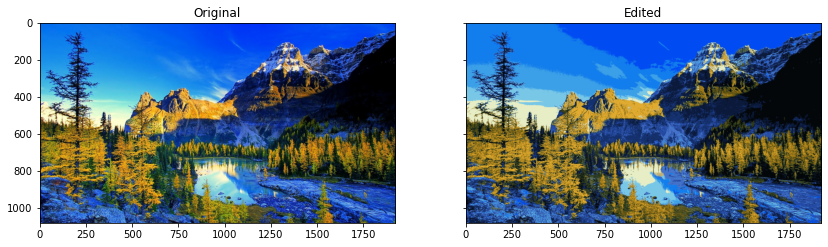

In [26]:
f, (ax1, ax2) = plt.subplots(1,2, figsize=(14, 12), sharey=True)

ax1.set_title("Original")
ax1.imshow(image)

ax2.set_title("Edited")
ax2.imshow(reconstruct_image(c, labels, w, h, d))

plt.show()

In [37]:
for i in range(10):
    print(array_index)
    print(C[labels[array_index]])

NameError: name 'array_index' is not defined